#📚 <font color="pink"> ***Preparation*** 📚

In [ ]:
#@markdown ## <font color="pink"> **1. Mount Google Drive**
#@markdown ---
from google.colab import drive
import os

print("Mounting Google Drive...")
drive.mount('/content/drive')
print("Google Drive mounted at /content/drive")

# Define the base project directory on Google Drive
# You can change 'TTS_Project' to whatever you prefer
project_drive_path = '/content/drive/My Drive/Evatalk'

# Create the base project directory if it doesn't exist
if not os.path.exists(project_drive_path):
    os.makedirs(project_drive_path)
    print(f"Created base project directory on Drive: {project_drive_path}")
else:
    print(f"Base project directory on Drive already exists: {project_drive_path}")

# Define paths for dataset and training outputs within the project directory
dataset_drive_path = os.path.join(project_drive_path, 'Dataset')
training_outputs_drive_path = os.path.join(project_drive_path, 'Output')
checkpoints_drive_path = os.path.join(training_outputs_drive_path, 'checkpoints')
logs_drive_path = os.path.join(training_outputs_drive_path, 'logs')

# Create dataset and output directories on Drive if they don't exist
for path in [dataset_drive_path, training_outputs_drive_path, checkpoints_drive_path, logs_drive_path]:
    if not os.path.exists(path):
        os.makedirs(path)
        print(f"Created directory on Drive: {path}")
    else:
        print(f"Directory on Drive already exists: {path}")

# Set symbolic links or variables for easier access later in the script (optional but good practice)
# For data loading and saving, we'll use the full paths directly in the subsequent cells

Mounting Google Drive...
Mounted at /content/drive
Google Drive mounted at /content/drive
Base project directory on Drive already exists: /content/drive/My Drive/Evatalk
Directory on Drive already exists: /content/drive/My Drive/Evatalk/Dataset
Directory on Drive already exists: /content/drive/My Drive/Evatalk/Output
Directory on Drive already exists: /content/drive/My Drive/Evatalk/Output/checkpoints
Directory on Drive already exists: /content/drive/My Drive/Evatalk/Output/logs


In [ ]:
#@markdown # <font color="pink"> **Check the GPU** 👁️ </font>
#@markdown ---
#@markdown #### It is not recommended to use the <font color="orange">**K80**</font> card (although it works correctly, it is **time consuming**). Restart the runtime to **get another card**.

!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-00846cc3-6990-311b-3110-3bda376cd5d4)


# <font color="pink"> ***Training*** </font> 🤖

In [ ]:
#@markdown ## <font color="pink"> **2. Install Tacotron2 (w/ARPAbet).** 📦
%matplotlib inline
import os
import io

# --- Ensure project_drive_path is defined if this cell is run independently ---
# This variable should match the base project path defined in your "1. Mount Google Drive" cell
project_drive_path = '/content/drive/My Drive/Evatalk'
# --- End of project_drive_path definition ---

%cd /content/
if not os.path.isdir("/content/TTS-TT2/"):
  print("Cloning justinjohn0306/TTS-TT2")
  !git clone https://github.com/justinjohn0306/ARPAtaco2.git TTS-TT2
  %cd /content/TTS-TT2/
  !git submodule init
  !git submodule update
%cd /content/TTS-TT2/
#NVIDIA's requirements
#I believe Colab gives us PyTorch and TF by default so we don't need anything else
#Versions specified in requirements.txt have conflicts so that's why we simply get current versions
print("Downloading tacotron2 requirements")
!pip install matplotlib numpy inflect scipy Unidecode pillow
#Our requirements
#We'll need gdown to download some really cool things
!pip install git+https://github.com/wkentaro/gdown.git
import gdown
!git submodule init
!git submodule update
!pip install ffmpeg-normalize
!pip install -q unidecode tensorboardX
!apt-get -qq install sox
!apt-get install pv
!apt-get install jq
!wget https://raw.githubusercontent.com/tonikelope/megadown/master/megadown -O megadown.sh
!chmod 755 megadown.sh
#Download NVIDIA's LJSpeech model
# Download NVIDIA's LJSpeech model using wget
tt2_pretrained_url = "https://github.com/justinjohn0306/ARPAtaco2/releases/download/pretrained_model/tacotron2_statedict.pt"
tt2_pretrained_path = "/content/TTS-TT2/tacotron2_statedict.pt"

if not os.path.isfile(tt2_pretrained_path):
  print("Downloading tt2 pretrained model using wget")
  !wget {tt2_pretrained_url} -O {tt2_pretrained_path}


#tt2_pretrained = "https://drive.google.com/uc?id=1c5ZTuT7J08wLUoVZ2KkUs_VdZuJ86ZqA"
#if not os.path.isfile("/content/TTS-TT2/pretrained_model"):
  #print("Downloading tt2 pretrained")
  #gdown.download(tt2_pretrained, "/content/TTS-TT2/pretrained_model", quiet=False)

latest_downloaded = None

import time
import logging

logging.getLogger('matplotlib').setLevel(logging.WARNING)
logging.getLogger('numba').setLevel(logging.WARNING)
logging.getLogger('librosa').setLevel(logging.WARNING)


import argparse
import math
from numpy import finfo

import torch
from distributed import apply_gradient_allreduce
import torch.distributed as dist
from torch.utils.data.distributed import DistributedSampler
from torch.utils.data import DataLoader

from model import Tacotron2
from data_utils import TextMelLoader, TextMelCollate
from loss_function import Tacotron2Loss
from logger import Tacotron2Logger
from hparams import create_hparams

import random
import numpy as np

import layers
from utils import load_wav_to_torch, load_filepaths_and_text
from text import text_to_sequence
from math import e
#from tqdm import tqdm # Terminal
#from tqdm import tqdm_notebook as tqdm # Legacy Notebook TQDM
from tqdm.notebook import tqdm # Modern Notebook TQDM
from distutils.dir_util import copy_tree
import matplotlib.pylab as plt

def download_from_google_drive(file_id, file_name):
  # download a file from the Google Drive link
  !rm -f ./cookie
  !curl -c ./cookie -s -L "https://drive.google.com/uc?export=download&id={file_id}" > /dev/null
  confirm_text = !awk '/download/ {print $NF}' ./cookie
  confirm_text = confirm_text[0]
  !curl -Lb ./cookie "https://drive.google.com/uc?export=download&confirm={confirm_text}&id={file_id}" -o {file_name}

def create_mels():
    print("Generating Mels")
    stft = layers.TacotronSTFT(
                hparams.filter_length, hparams.hop_length, hparams.win_length,
                hparams.n_mel_channels, hparams.sampling_rate, hparams.mel_fmin,
                hparams.mel_fmax)
    def save_mel(filename):
        audio, sampling_rate = load_wav_to_torch(filename)
        if sampling_rate != stft.sampling_rate:
            raise ValueError("{} {} SR doesn't match target {} SR".format(filename,
                sampling_rate, stft.sampling_rate))
        audio_norm = audio / hparams.max_wav_value
        audio_norm = audio_norm.unsqueeze(0)
        audio_norm = torch.autograd.Variable(audio_norm, requires_grad=False)
        melspec = stft.mel_spectrogram(audio_norm)
        melspec = torch.squeeze(melspec, 0).cpu().numpy()
        np.save(filename.replace('.wav', ''), melspec)

    import glob
    wavs = glob.glob('wavs/*.wav')
    for i in tqdm(wavs):
        save_mel(i)


def reduce_tensor(tensor, n_gpus):
    rt = tensor.clone()
    dist.all_reduce(rt, op=dist.reduce_op.SUM)
    rt /= n_gpus
    return rt


def init_distributed(hparams, n_gpus, rank, group_name):
    assert torch.cuda.is_available(), "Distributed mode requires CUDA."
    print("Initializing Distributed")

    # Set cuda device so everything is done on the right GPU.
    torch.cuda.set_device(rank % torch.cuda.device_count())

    # Initialize distributed communication
    dist.init_process_group(
        backend=hparams.dist_backend, init_method=hparams.dist_url,
        world_size=n_gpus, rank=rank, group_name=group_name)

    print("Done initializing distributed")


def prepare_dataloaders(hparams):
    # Get data, data loaders and collate function ready
    trainset = TextMelLoader(hparams.training_files, hparams)
    valset = TextMelLoader(hparams.validation_files, hparams)
    collate_fn = TextMelCollate(hparams.n_frames_per_step)

    if hparams.distributed_run:
        train_sampler = DistributedSampler(trainset)
        shuffle = False
    else:
        train_sampler = None
        shuffle = True

    train_loader = DataLoader(trainset, num_workers=1, shuffle=shuffle,
                              sampler=train_sampler,
                              batch_size=hparams.batch_size, pin_memory=False,
                              drop_last=True, collate_fn=collate_fn)
    return train_loader, valset, collate_fn


def prepare_directories_and_logger(output_directory, log_directory, rank):
    if rank == 0:
        if not os.path.isdir(output_directory):
            os.makedirs(output_directory)
            os.chmod(output_directory, 0o775)
        logger = Tacotron2Logger(os.path.join(output_directory, log_directory))
    else:
        logger = None
    return logger


def load_model(hparams):
    model = Tacotron2(hparams).cuda()
    if hparams.fp16_run:
        model.decoder.attention_layer.score_mask_value = finfo('float16').min

    if hparams.distributed_run:
        model = apply_gradient_allreduce(model)

    return model


def warm_start_model(checkpoint_path, model, ignore_layers):
    assert os.path.isfile(checkpoint_path)
    print("Warm starting model from checkpoint '{}'".format(checkpoint_path))
    checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')
    model_dict = checkpoint_dict['state_dict']
    if len(ignore_layers) > 0:
        model_dict = {k: v for k, v in model_dict.items()
                      if k not in ignore_layers}
        dummy_dict = model.state_dict()
        dummy_dict.update(model_dict)
        model_dict = dummy_dict
    model.load_state_dict(model_dict)
    return model


def load_checkpoint(checkpoint_path, model, optimizer):
    assert os.path.isfile(checkpoint_path)
    print("Loading checkpoint '{}'".format(checkpoint_path))
    checkpoint_dict = torch.load(checkpoint_path, map_location='cpu')
    model.load_state_dict(checkpoint_dict['state_dict'])
    optimizer.load_state_dict(checkpoint_dict['optimizer'])
    learning_rate = checkpoint_dict['learning_rate']
    iteration = checkpoint_dict['iteration']
    print("Loaded checkpoint '{}' from iteration {}" .format(
        checkpoint_path, iteration))
    return model, optimizer, learning_rate, iteration


def save_checkpoint(model, optimizer, learning_rate, iteration, filepath):
    import random
    if True:
        print("Saving model and optimizer state at iteration {} to {}".format(
            iteration, filepath))
        try:
            torch.save({'iteration': iteration,
                    'state_dict': model.state_dict(),
                    'optimizer': optimizer.state_dict(),
                    'learning_rate': learning_rate}, filepath)
        except KeyboardInterrupt:
            print("interrupt received while saving, waiting for save to complete.")
            torch.save({'iteration': iteration,'state_dict': model.state_dict(),'optimizer': optimizer.state_dict(),'learning_rate': learning_rate}, filepath)
        print("Model Saved")

def plot_alignment(alignment, info=None):
    %matplotlib inline
    fig, ax = plt.subplots(figsize=(int(alignment_graph_width/100), int(alignment_graph_height/100)))
    im = ax.imshow(alignment, cmap='inferno', aspect='auto', origin='lower',
                   interpolation='none')
    ax.autoscale(enable=True, axis="y", tight=True)
    fig.colorbar(im, ax=ax)
    xlabel = 'Decoder timestep'
    if info is not None:
        xlabel += '\n\n' + info
    plt.xlabel(xlabel)
    plt.ylabel('Encoder timestep')
    plt.tight_layout()
    fig.canvas.draw()
    plt.show()

def validate(model, criterion, valset, iteration, batch_size, n_gpus,
             collate_fn, logger, distributed_run, rank, epoch, start_eposh, learning_rate):
    """Handles all the validation scoring and printing"""
    model.eval()
    with torch.no_grad():
        val_sampler = DistributedSampler(valset) if distributed_run else None
        val_loader = DataLoader(valset, sampler=val_sampler, num_workers=1,
                                shuffle=False, batch_size=batch_size,
                                pin_memory=False, collate_fn=collate_fn)

        val_loss = 0.0
        for i, batch in enumerate(val_loader):
            x, y = model.parse_batch(batch)
            y_pred = model(x)
            loss = criterion(y_pred, y)
            if distributed_run:
                reduced_val_loss = reduce_tensor(loss.data, n_gpus).item()
            else:
                reduced_val_loss = loss.item()
            val_loss += reduced_val_loss
        val_loss = val_loss / (i + 1)

    model.train()
    if rank == 0:
        print("Epoch: {} Validation loss {}: {:9f}  Time: {:.1f}m LR: {:.6f}".format(epoch, iteration, val_loss,(time.perf_counter()-start_eposh)/60, learning_rate))
        logger.log_validation(val_loss, model, y, y_pred, iteration)
        if hparams.show_alignments:
            %matplotlib inline
            _, mel_outputs, gate_outputs, alignments = y_pred
            idx = random.randint(0, alignments.size(0) - 1)
            plot_alignment(alignments[idx].data.cpu().numpy().T)

def train(output_directory, log_directory, checkpoint_path, warm_start, n_gpus,
          rank, group_name, hparams, log_directory2, save_interval, backup_interval):
    """Training and validation logging results to tensorboard and stdout

    Params
    ------
    output_directory (string): directory to save checkpoints
    log_directory (string) directory to save tensorboard logs
    checkpoint_path(string): checkpoint path
    n_gpus (int): number of gpus
    rank (int): rank of current gpu
    hparams (object): comma separated list of "name=value" pairs.
    """
    if hparams.distributed_run:
        init_distributed(hparams, n_gpus, rank, group_name)

    torch.manual_seed(hparams.seed)
    torch.cuda.manual_seed(hparams.seed)

    model = load_model(hparams)
    learning_rate = hparams.learning_rate
    optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate,
                                 weight_decay=hparams.weight_decay)

    if hparams.fp16_run:
        from apex import amp
        model, optimizer = amp.initialize(
            model, optimizer, opt_level='O2')

    if hparams.distributed_run:
        model = apply_gradient_allreduce(model)

    criterion = Tacotron2Loss()

    logger = prepare_directories_and_logger(
        output_directory, log_directory, rank)

    train_loader, valset, collate_fn = prepare_dataloaders(hparams)

    # Load checkpoint if one exists
    iteration = 0
    epoch_offset = 0
    if checkpoint_path is not None and os.path.isfile(checkpoint_path):
        if warm_start:
            model = warm_start_model(
                checkpoint_path, model, hparams.ignore_layers)
        else:
            model, optimizer, _learning_rate, iteration = load_checkpoint(
                checkpoint_path, model, optimizer)
            if hparams.use_saved_learning_rate:
                learning_rate = _learning_rate
            iteration += 1  # next iteration is iteration + 1
            epoch_offset = max(0, int(iteration / len(train_loader)))
    else:
      os.path.isfile("/content/TTS-TT2/pretrained_model")
      %cd /dev/null
      !/content/TTS-TT2/megadown.sh https://mega.nz/#!WXY3RILA!KyoGHtfB_sdhmLFoykG2lKWhh0GFdwMkk7OwAjpQHRo --o pretrained_model
      %cd /content/TTS-TT2
      model = warm_start_model("/content/TTS-TT2/pretrained_model", model, hparams.ignore_layers)
      # download LJSpeech pretrained model if no checkpoint already exists

    start_eposh = time.perf_counter()
    learning_rate = 0.0
    model.train()
    is_overflow = False
    # ================ MAIN TRAINNIG LOOP! ===================
    for epoch in tqdm(range(epoch_offset, hparams.epochs)):
        print("\nStarting Epoch: {} Iteration: {}".format(epoch, iteration))
        start_eposh = time.perf_counter() # eposh is russian, not a typo
        for i, batch in tqdm(enumerate(train_loader), total=len(train_loader)):
            start = time.perf_counter()
            if iteration < hparams.decay_start: learning_rate = hparams.A_
            else: iteration_adjusted = iteration - hparams.decay_start; learning_rate = (hparams.A_*(e**(-iteration_adjusted/hparams.B_))) + hparams.C_
            learning_rate = max(hparams.min_learning_rate, learning_rate) # output the largest number
            for param_group in optimizer.param_groups:
                param_group['lr'] = learning_rate

            model.zero_grad()
            x, y = model.parse_batch(batch)
            y_pred = model(x)

            loss = criterion(y_pred, y)
            if hparams.distributed_run:
                reduced_loss = reduce_tensor(loss.data, n_gpus).item()
            else:
                reduced_loss = loss.item()
            if hparams.fp16_run:
                with amp.scale_loss(loss, optimizer) as scaled_loss:
                    scaled_loss.backward()
            else:
                loss.backward()

            if hparams.fp16_run:
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    amp.master_params(optimizer), hparams.grad_clip_thresh)
                is_overflow = math.isnan(grad_norm)
            else:
                grad_norm = torch.nn.utils.clip_grad_norm_(
                    model.parameters(), hparams.grad_clip_thresh)

            optimizer.step()

            if not is_overflow and rank == 0:
                duration = time.perf_counter() - start
                logger.log_training(
                    reduced_loss, grad_norm, learning_rate, duration, iteration)
                #print("Batch {} loss {:.6f} Grad Norm {:.6f} Time {:.6f}".format(iteration, reduced_loss, grad_norm, duration), end='\r', flush=True)

            iteration += 1
        validate(model, criterion, valset, iteration,
                 hparams.batch_size, n_gpus, collate_fn, logger,
                 hparams.distributed_run, rank, epoch, start_eposh, learning_rate)
        if (epoch+1) % save_interval == 0 or (epoch+1) == hparams.epochs: # not sure if the latter is necessary
            save_checkpoint(model, optimizer, learning_rate, iteration, checkpoint_path)
        if backup_interval > 0 and (epoch+1) % backup_interval == 0:
            save_checkpoint(model, optimizer, learning_rate, iteration, checkpoint_path + "_epoch_%s" % (epoch+1))
        if log_directory2 != None:
            copy_tree(log_directory, log_directory2)
def check_dataset(hparams):
    from utils import load_wav_to_torch, load_filepaths_and_text
    import os
    import numpy as np
    def check_arr(filelist_arr):
        for i, file in enumerate(filelist_arr):
            if len(file) > 2:
                print("|".join(file), "\nhas multiple '|', this may not be an error.")
            if hparams.load_mel_from_disk and '.wav' in file[0]:
                print("[WARNING]", file[0], " in filelist while expecting .npy .")
            else:
                if not hparams.load_mel_from_disk and '.npy' in file[0]:
                    print("[WARNING]", file[0], " in filelist while expecting .wav .")
            if (not os.path.exists(file[0])):
                print("|".join(file), "\n[WARNING] does not exist.")
            if len(file[1]) < 3:
                print("|".join(file), "\n[info] has no/very little text.")
            if not ((file[1].strip())[-1] in r"!?,.;:"):
                print("|".join(file), "\n[info] has no ending punctuation.")
            mel_length = 1
            if hparams.load_mel_from_disk and '.npy' in file[0]:
                melspec = torch.from_numpy(np.load(file[0], allow_pickle=True))
                mel_length = melspec.shape[1]
            if mel_length == 0:
                print("|".join(file), "\n[WARNING] has 0 duration.")
    print("Checking Training Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.training_files) # get split lines from training_files text file.
    check_arr(audiopaths_and_text)
    print("Checking Validation Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.validation_files) # get split lines from validation_files text file.
    check_arr(audiopaths_and_text)
    print("Finished Checking")

warm_start=False#sorry bout that
n_gpus=1
rank=0
group_name=None

# ---- DEFAULT PARAMETERS DEFINED HERE ----
hparams = create_hparams()
model_filename = 'current_model'
hparams.training_files = "filelists/clipper_train_filelist.txt"
hparams.validation_files = "filelists/clipper_val_filelist.txt"
#hparams.use_mmi=True,          # not used in this notebook
#hparams.use_gaf=True,          # not used in this notebook
#hparams.max_gaf=0.5,           # not used in this notebook
#hparams.drop_frame_rate = 0.2  # not used in this notebook
hparams.p_attention_dropout=0.1
hparams.p_decoder_dropout=0.1
hparams.decay_start = 15000
hparams.A_ = 5e-4
hparams.B_ = 8000
hparams.C_ = 0
hparams.min_learning_rate = 1e-5
generate_mels = True
hparams.show_alignments = True
alignment_graph_height = 600
alignment_graph_width = 1000
hparams.batch_size = 32
hparams.load_mel_from_disk = True
hparams.ignore_layers = []
hparams.epochs = 10000
torch.backends.cudnn.enabled = hparams.cudnn_enabled
torch.backends.cudnn.benchmark = hparams.cudnn_benchmark
output_directory = '/content/drive/My Drive/colab/outdir' # Location to save Checkpoints
log_directory = '/content/TTS-TT2/logs' # Location to save Log files locally
log_directory2 = '/content/drive/My Drive/colab/logs' # Location to copy log files (done at the end of each epoch to cut down on I/O)
checkpoint_path = output_directory+(r'/')+model_filename

# ---- Replace .wav with .npy in filelists ----
!sed -i -- 's,.wav|,.npy|,g' filelists/*.txt
!sed -i -- 's,.wav|,.npy|,g' {hparams.training_files}
!sed -i -- 's,.wav|,.npy|,g' {hparams.validation_files}
# ---- Replace .wav with .npy in filelists ----

%cd /content/TTS-TT2

data_path = 'wavs'
!mkdir {data_path}

/content
Cloning justinjohn0306/TTS-TT2
Cloning into 'TTS-TT2'...
remote: Enumerating objects: 89, done.
remote: Counting objects: 100% (9/9), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 89 (delta 2), reused 1 (delta 0), pack-reused 80 (from 1)
Receiving objects: 100% (89/89), 7.11 MiB | 9.73 MiB/s, done.
Resolving deltas: 100% (30/30), done.
/content/TTS-TT2
/content/TTS-TT2
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 235.8/235.8 kB 18.6 MB/s eta 0:00:00
  Cloning https://github.com/wkentaro/gdown.git to /tmp/pip-req-build-f2_3_e3d
  Running command git clone --filter=blob:none --quiet https://github.com/wkentaro/gdown.git /tmp/pip-req-build-f2_3_e3d
  Resolved https://github.com/wkentaro/gdown.git to commit eeb6995f2e077991576b35956983bbefe34cf057
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 23.5 MB/s eta 0:00:00
 

/content/TTS-TT2/text/__init__.py:84: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  return s in _symbol_to_id and s is not '_' and s is not '~'
/content/TTS-TT2/text/__init__.py:84: SyntaxWarning: "is not" with a literal. Did you mean "!="?
  return s in _symbol_to_id and s is not '_' and s is not '~'


sed: can't read filelists/clipper_train_filelist.txt: No such file or directory
sed: can't read filelists/clipper_val_filelist.txt: No such file or directory
/content/TTS-TT2


In [ ]:
#@markdown ## <font color="pink"> **3. Upload/Load your Audio Dataset.** 🔊
#@markdown Remember that they must be in a compatible format, i.e., sample rate 22050, 16 bit, mono.
#@markdown If you do not have the audios in this format, check this box to make the conversion, apart from normalization and silence removal.
audio_processing = True #@param {type:"boolean"}

#@markdown #### Option 1: Path to your dataset on Google Drive (e.g., "/content/drive/My Drive/Evatalk/Dataset")
#@markdown #### (Leave empty to upload from your local machine)
dataset_drive_path = "/content/drive/My Drive/Evatalk/trainrec.zip" #@param {type:"string"}

from google.colab import files
import zipfile
import os
import wave
import shutil
import datetime

# --- Ensure project_drive_path is defined if this cell is run independently ---
# This variable should match the base project path defined in your "1. Mount Google Drive" cell
# If running sequentially, it should already be defined. Re-defining here for robustness.
project_drive_path = '/content/drive/My Drive/Evatalk'
# --- End of project_drive_path definition ---


# Clear previous WAV files in the Colab environment if any
if os.path.exists('/content/TTS-TT2/wavs/'): # Check if dir exists before listing
  if os.listdir('/content/TTS-TT2/wavs/'):
    print("Clearing existing audio files in /content/TTS-TT2/wavs/")
    !rm /content/TTS-TT2/wavs/*
else:
  # If the directory doesn't exist, create it (it should be created by git clone, but being safe)
  os.makedirs('/content/TTS-TT2/wavs', exist_ok=True)


# Create a shell script for audio processing
# This remains the same as it performs local processing after files are in /content/TTS-TT2/wavs/
with open('/content/audios.sh', 'w') as rsh:
    rsh.write('''\
for file in /content/TTS-TT2/wavs/*.wav
do
    ffmpeg -y -i "$file" -ar 22050 /content/tempwav/srtmp.wav -loglevel error
    ffmpeg -y -i /content/tempwav/srtmp.wav -c copy -fflags +bitexact -flags:v +bitexact -flags:a +bitexact -ar 22050 /content/tempwav/poop.wav -loglevel error
    rm "$file"
    mv /content/tempwav/poop.wav "$file"
    rm /content/tempwav/*
done
''')

# --- Logic to load from Drive or local upload ---
dataset_drive_path = dataset_drive_path.strip()
destination_colab_path = '/content/TTS-TT2/wavs/'

if dataset_drive_path:
  # Option 1: Load from Google Drive
  print(f"\n\033[34m\033[1mAttempting to load dataset from Google Drive: {dataset_drive_path}")
  if os.path.exists(dataset_drive_path):
    if os.path.isdir(dataset_drive_path):
      # If it's a directory, copy its contents (assuming 'wavs' subfolder or direct wavs)
      print(f"Copying files from {dataset_drive_path} to {destination_colab_path}...")
      # Use rsync for efficiency if many files, otherwise shutil.copytree is fine
      # If your Drive folder directly contains WAVs, use: !cp -r "$dataset_drive_path"/*.wav "$destination_colab_path"
      # If your Drive folder contains a 'wavs' subfolder:
      if os.path.exists(os.path.join(dataset_drive_path, 'wavs')):
          !cp -r "$dataset_drive_path"/wavs/*.wav "$destination_colab_path"
          print("Copied WAV files from 'wavs' subfolder on Drive.")
      else:
          # Assume WAVs are directly in the specified dataset_drive_path
          !cp -r "$dataset_drive_path"/*.wav "$destination_colab_path"
          print("Copied WAV files directly from specified Drive folder.")

    elif zipfile.is_zipfile(dataset_drive_path):
      # If it's a zip file, unzip it
      print(f"Unzipping {dataset_drive_path} from Drive to {destination_colab_path}...")
      !unzip -q -j "$dataset_drive_path" -d "$destination_colab_path"
    else:
      print(f"\n\033[31m\033[1m[ERROR] '{dataset_drive_path}' is not a valid directory or zip file. "
            "Please check the path or use local upload.")
      # Fallback to local upload if Drive path is invalid
      print(f"\n\033[34m\033[1mUpload your dataset(audios) from your local machine instead...")
      uploaded = files.upload()
      for fn in uploaded.keys():
        if zipfile.is_zipfile(fn):
          print(f"Unzipping {fn}...")
          !unzip -q -j "$fn" -d "$destination_colab_path"
          !rm "$fn"
        else:
          print(f"Moving {fn} to {destination_colab_path}...")
          shutil.move(fn, destination_colab_path + fn)
  else:
    print(f"\n\033[33m\033[1m[NOTICE] Google Drive path '{dataset_drive_path}' not found. "
          "Falling back to local upload.")
    print(f"\n\033[34m\033[1mUpload your dataset(audios) from your local machine...")
    uploaded = files.upload()
    for fn in uploaded.keys():
      if zipfile.is_zipfile(fn):
        print(f"Unzipping {fn}...")
        !unzip -q -j "$fn" -d "$destination_colab_path"
        !rm "$fn"
      else:
        print(f"Moving {fn} to {destination_colab_path}...")
        shutil.move(fn, destination_colab_path + fn)
else:
  # Option 2: Local Upload (original behavior)
  print(f"\n\033[34m\033[1mUpload your dataset(audios) from your local machine...")
  uploaded = files.upload()

  for fn in uploaded.keys():
    if zipfile.is_zipfile(fn):
      print(f"Unzipping {fn}...")
      !unzip -q -j "$fn" -d "$destination_colab_path" # Use destination_colab_path
      !rm "$fn"
    else:
      print(f"Moving {fn} to {destination_colab_path}...") # Use destination_colab_path
      shutil.move(fn, destination_colab_path + fn)

# --- Common post-upload/copy cleanup and processing ---
# Check if a 'wavs' subdirectory was created inside the target, which happens if zip/copy included it
if os.path.exists(os.path.join(destination_colab_path, 'wavs')):
    print("Detected 'wavs' subfolder, moving contents up...")
    for file in os.listdir(os.path.join(destination_colab_path, 'wavs')):
      shutil.move(os.path.join(destination_colab_path, 'wavs', file), destination_colab_path)
    !rmdir {os.path.join(destination_colab_path, 'wavs')} # Remove empty subdirectory after moving files

# Clean up any residual list.txt file (shouldn't be in wavs dir anyway, but good to check)
if os.path.exists(os.path.join(destination_colab_path, "list.txt")):
    print("Warning: Found list.txt in audio directory, removing it.")
    !rm {os.path.join(destination_colab_path, "list.txt")}

# Process audios if enabled
if audio_processing:
  print(f"\n\033[37mMetadata removal and audio verification (sample rate, bit depth, mono conversion, normalization, silence removal)...")
  !mkdir -p /content/tempwav
  !bash /content/audios.sh
  !rm -r /content/tempwav # Clean up tempwav directory after processing

totalduration = 0
# Ensure we are in the correct directory to list files for duration check
%cd /content/TTS-TT2/wavs
for file_name in [x for x in os.listdir() if os.path.isfile(x) and x.endswith(".wav")]:
    try:
        with wave.open(file_name, "rb") as wave_file:
            frames = wave_file.getnframes()
            rate = wave_file.getframerate()
            duration = frames / float(rate)
            totalduration += duration

            if duration >= 12:
              print(f"\n\033[33m\033[1m[NOTICE] {file_name} is longer than 12 seconds. Lack of RAM can"
                    " occur in a large batch size!")
    except wave.Error as e:
        print(f"\n\033[31m\033[1m[ERROR] Could not process {file_name}: {e}")
        # Optionally, delete the problematic file: !rm "$file_name"

wav_count = len([f for f in os.listdir("/content/TTS-TT2/wavs") if f.endswith(".wav")])
print(f"\n{wav_count} processed audios. total duration: {str(datetime.timedelta(seconds=round(totalduration, 0)))}\n")

print("\n\033[32m\033[1mAll set, please proceed.")


Attempting to load dataset from Google Drive: /content/drive/My Drive/Evatalk/trainrec.zip
Unzipping /content/drive/My Drive/Evatalk/trainrec.zip from Drive to /content/TTS-TT2/wavs/...

Metadata removal and audio verification (sample rate, bit depth, mono conversion, normalization, silence removal)...
/content/TTS-TT2/wavs

100 processed audios. total duration: 0:06:02


All set, please proceed.


In [ ]:
#@markdown ## <font color="pink"> **4. Upload the transcript.** 📝
#@markdown The transcript must be a ``.TXT`` file formatted in <font color="red" size="+3"> ``UTF-8 without BOM.``

#@markdown #### Enter the path to your transcript file on Google Drive (e.g., "/content/drive/My Drive/Evatalk/Dataset/list.txt")
#@markdown #### Leave empty to upload from your local machine.
transcript_path = "" #@param {type: "string"}

from google.colab import files
import os
import shutil # Import shutil for moving files

# --- Ensure project_drive_path is defined if this cell is run independently ---
# This variable should match the base project path defined in your "1. Mount Google Drive" cell
# If running sequentially, it should already be defined. Re-defining here for robustness.
project_drive_path = '/content/drive/My Drive/Evatalk'
# --- End of project_drive_path definition ---

%cd /content/TTS-TT2/filelists/

# Clean up any existing list.txt
if os.path.exists('/content/TTS-TT2/filelists/list.txt'):
  !rm /content/TTS-TT2/filelists/list.txt

transcript_path = transcript_path.strip()

if transcript_path:
  # Path provided, attempt to copy the file
  if os.path.exists(transcript_path):
    print(f"\n\033[34m\033[1mTranscript imported from: {transcript_path}\n\033[90m")
    try:
      shutil.copy(transcript_path, '/content/TTS-TT2/filelists/list.txt')
      listfn = 'list.txt' # Set listfn for subsequent processing
    except Exception as e:
      print(f"\n\033[31m\033[1m[ERROR] Could not copy file from {transcript_path}: {e}")
      print(f"\n\033[34m\033[1mPlease upload your transcript(list) manually...")
      uploaded = files.upload()
      listfn, length = uploaded.popitem()
      if listfn != "list.txt":
        !mv "$listfn" list.txt
  else:
    print(f"\n\033[33m\033[1m[NOTICE] The path '{transcript_path}' is not found, check for errors and try again.")
    print(f"\n\033[34m\033[1mUpload your transcript(list)...")
    uploaded = files.upload()
    listfn, length = uploaded.popitem()
    if listfn != "list.txt":
      !mv "$listfn" list.txt
else:
  # No path provided, prompt for local upload
  print("\n\033[34m\033[1mUpload your transcript(list)...")
  uploaded = files.upload()
  listfn, length = uploaded.popitem()

  if listfn != "list.txt":
    !mv "$listfn" list.txt

# --- Validate and filter transcript entries ---
print("\n\033[37mValidating transcript entries...")
try:
    with open('list.txt', 'r', encoding='utf-8') as f: # Specify encoding for safety
        lines = f.readlines()
except FileNotFoundError:
    print("\n\033[31m\033[1m[ERROR] list.txt was not found after upload/copy. Please re-run and ensure a file is provided.")
    # Exit or handle gracefully if transcript is missing
    raise SystemExit("Transcript file missing.")
except Exception as e:
    print(f"\n\033[31m\033[1m[ERROR] Could not read list.txt: {e}. Please ensure it's a valid UTF-8 TXT file.")
    raise SystemExit("Error reading transcript file.")


new_lines = []
missing_audios = 0
total_lines = len(lines)

for i, line in enumerate(lines):
    parts = line.strip().split('|')
    if len(parts) >= 1: # Ensure there's at least an audio file path
        # Assuming the audio file path is the first part, and it's relative to /content/TTS-TT2/
        # The original code implies paths like 'wavs/audio.wav'
        audio_file_path_relative = parts[0].strip()
        audio_file_full_path = os.path.join('/content/TTS-TT2/wavs/', audio_file_path_relative)

        if os.path.exists(audio_file_full_path):
            new_lines.append(line)
        else:
            missing_audios += 1
            print(f"\033[90mSkipping line {i+1}: Audio file not found for '{audio_file_path_relative}'")
    else:
        print(f"\033[90mSkipping line {i+1}: Invalid format (expected 'audio_path|text'). Line: '{line.strip()}'")


if missing_audios > 0:
    print(f"\n\033[33m\033[1m[NOTICE] {missing_audios} out of {total_lines} transcript entries were skipped because their corresponding audio files were not found in /content/TTS-TT2/ (e.g., /content/TTS-TT2/wavs/).")
    print("Please ensure your transcript paths match the actual location of your audio files.")
    if len(new_lines) == 0:
        print("\n\033[31m\033[1m[CRITICAL] No valid transcript entries remain after filtering. Training will likely fail.")

with open('list.txt', 'w', encoding='utf-8') as f: # Write with UTF-8 encoding
    f.writelines(new_lines)

%cd /content/TTS-TT2/
print("\n\033[32m\033[1mAll set, please proceed.")

/content/TTS-TT2/filelists

Upload your transcript(list)...


Saving lists.txt to lists.txt

Validating transcript entries...
/content/TTS-TT2

All set, please proceed.


In [ ]:
#@markdown ## <font color="pink"> **4. Upload the transcript.** 📝
#@markdown The transcript must be a ``.TXT`` file formatted in <font color="red" size="+3"> ``UTF-8 without BOM.``

#@markdown #### Enter the path to your transcript file on Google Drive (e.g., "/content/drive/My Drive/Evatalk/Dataset/list.txt")
#@markdown #### Leave empty to upload from your local machine.
transcript_path = "/content/drive/My Drive/Evatalk/Dataset/list.txt" #@param {type: "string"} <-- **SET THIS PATH!**

from google.colab import files
import os
import shutil

# --- Ensure project_drive_path is defined if this cell is run independently ---
project_drive_path = '/content/drive/My Drive/Evatalk'
# --- End of project_drive_path definition ---

%cd /content/TTS-TT2/filelists/

if os.path.exists('/content/TTS-TT2/filelists/list.txt'):
  !rm /content/TTS-TT2/filelists/list.txt

transcript_path = transcript_path.strip()

if transcript_path:
  if os.path.exists(transcript_path):
    print(f"\n\033[34m\033[1mTranscript imported from: {transcript_path}\n\033[90m")
    try:
      shutil.copy(transcript_path, '/content/TTS-TT2/filelists/list.txt')
      listfn = 'list.txt'
    except Exception as e:
      print(f"\n\033[31m\033[1m[ERROR] Could not copy file from {transcript_path}: {e}")
      print(f"\n\033[34m\033[1mPlease upload your transcript(list) manually...")
      uploaded = files.upload()
      listfn, length = uploaded.popitem()
      if listfn != "list.txt":
        !mv "$listfn" list.txt
  else:
    print(f"\n\033[33m\033[1m[NOTICE] The path '{transcript_path}' is not found, check for errors and try again.")
    print(f"\n\033[34m\033[1mUpload your transcript(list)...")
    uploaded = files.upload()
    listfn, length = uploaded.popitem()
    if listfn != "list.txt":
      !mv "$listfn" list.txt
else:
  print("\n\033[34m\033[1mUpload your transcript(list)...")
  uploaded = files.upload()
  listfn, length = uploaded.popitem()

  if listfn != "list.txt":
    !mv "$listfn" list.txt

print("\n\033[37mValidating transcript entries...")
try:
    with open('list.txt', 'r', encoding='utf-8') as f:
        lines = f.readlines()
except FileNotFoundError:
    print("\n\033[31m\033[1m[ERROR] list.txt was not found after upload/copy. Please re-run and ensure a file is provided.")
    raise SystemExit("Transcript file missing.")
except Exception as e:
    print(f"\n\033[31m\033[1m[ERROR] Could not read list.txt: {e}. Please ensure it's a valid UTF-8 TXT file.")
    raise SystemExit("Error reading transcript file.")

new_lines = []
missing_audios = 0
total_lines = len(lines)

for i, line in enumerate(lines):
    parts = line.strip().split('|')
    if len(parts) >= 1:
        audio_file_path_relative = parts[0].strip()
        audio_file_full_path = os.path.join('/content/TTS-TT2/wavs/', audio_file_path_relative)

        if os.path.exists(audio_file_full_path):
            new_lines.append(line)
        else:
            missing_audios += 1
            print(f"\033[90mSkipping line {i+1}: Audio file not found for '{audio_file_full_path}'")
    else:
        print(f"\033[90mSkipping line {i+1}: Invalid format (expected 'audio_path|text'). Line: '{line.strip()}'")

if missing_audios > 0:
    print(f"\n\033[33m\033[1m[NOTICE] {missing_audios} out of {total_lines} transcript entries were skipped because their corresponding audio files were not found in /content/TTS-TT2/ (e.g., /content/TTS-TT2/wavs/).")
    print("Please ensure your transcript paths match the actual location of your audio files.")
    if len(new_lines) == 0:
        print("\n\033[31m\033[1m[CRITICAL] No valid transcript entries remain after filtering. Training will likely fail.")

with open('list.txt', 'w', encoding='utf-8') as f:
    f.writelines(new_lines)

%cd /content/TTS-TT2/
print("\n\033[32m\033[1mAll set, please proceed.")

/content/TTS-TT2/filelists

[NOTICE] The path '/content/drive/My Drive/Evatalk/Dataset/list.txt' is not found, check for errors and try again.

Upload your transcript(list)...


Saving lists.txt to lists.txt

Validating transcript entries...
/content/TTS-TT2

All set, please proceed.


In [ ]:
#@markdown ## <font color="pink"> **5. Configure the model parameters.** 🎛️

#@markdown ---

#@markdown #### Your desired model name:

model_filename = 'Alex' #@param {type: "string"}

#@markdown #### Upload your transcription / text to TTS-TT2/filelists and right click -> copy path:
Training_file = "filelists/list.txt" #@param {type: "string"}
hparams.training_files = Training_file
hparams.validation_files = Training_file




# hparams to Tune
#hparams.use_mmi=True,          # not used in this notebook
#hparams.use_gaf=True,          # not used in this notebook
#hparams.max_gaf=0.5,           # not used in this notebook
#hparams.drop_frame_rate = 0.2  # not used in this notebook
hparams.p_attention_dropout=0.1
hparams.p_decoder_dropout=0.1

# Learning Rate             # https://www.desmos.com/calculator/ptgcz4vzsw / http://boards.4channel.org/mlp/thread/34778298#p34789030
hparams.decay_start = 15000         # wait till decay_start to start decaying learning rate

#@markdown #### Lower learning rates will take more time but will lead to more accurate results:
# Start/Max Learning Rate
hparams.A_ = 3e-4 #@param ["3e-6", "1e-5", "1e-4", "5e-4", "1e-3"] {type:"raw", allow-input: true}
hparams.B_ = 8000                   # Decay Rate
hparams.C_ = 0                      # Shift learning rate equation by this value
hparams.min_learning_rate = 1e-5    # Min Learning Rate

# Quality of Life
generate_mels = True
hparams.show_alignments = True
alignment_graph_height = 600
alignment_graph_width = 1000

#@markdown #### Your batch size, lower if you don't have enough ram:

hparams.batch_size =  8#@param {type: "integer"}
hparams.load_mel_from_disk = True
hparams.ignore_layers = [] # Layers to reset (None by default, other than foreign languages this param can be ignored)
use_cmudict = True #@param {type:"boolean"}
#@markdown #### Your total epochs to train to. Not recommended to change:

##@markdown #### Amount of epochs before stopping, preferably a very high amount to not stop.
hparams.epochs =  250#@param {type: "integer"}

torch.backends.cudnn.enabled = hparams.cudnn_enabled
torch.backends.cudnn.benchmark = hparams.cudnn_benchmark

#@markdown #### Where to save your model when training:
output_directory = '/content/drive/MyDrive/colab/outdir' #@param {type: "string"}
log_directory = '/content/TTS-TT2/logs' # Location to save Log files locally
log_directory2 = '/content/drive/My Drive/colab/logs' # Location to copy log files (done at the end of each epoch to cut down on I/O)
checkpoint_path = output_directory+(r'/')+model_filename

##@markdown #### Train the model from scratch? (If yes, then uncheck the box below):
#warm_start=True #@param {type:"boolean"}


#@markdown ---
hparams.text_cleaners=["english_cleaners"] + (["cmudict_cleaners"] if use_cmudict is True else [])


#@markdown Note:-

#@markdown - The learning_rate value is ordered from smallest to largest, top to bottom.

#@markdown - The smaller the "learning rates" value is, the longer it will take to train the model, but the more accurate the results will be.

#@markdown ___

#@markdown Todo:-
#@markdown - Disable warm_start
#@markdown - Add tensorboard training monitor

#@markdown ___


In [ ]:
#@markdown ## <font color="pink"> **5. Adjust Transcript Paths** ⚙️
#@markdown This cell ensures that the audio file paths in your `list.txt` correctly point to the `wavs/` directory inside your Colab environment.

import os

print("Adjusting paths in list.txt...")

list_file_path = '/content/TTS-TT2/filelists/list.txt'

try:
    with open(list_file_path, 'r', encoding='utf-8') as f:
        lines = f.readlines()

    updated_lines = []
    changes_made = 0

    # Define the desired prefix for paths in list.txt
    # This should match where your WAV/NPY files are stored in Colab
    correct_prefix_for_data = "wavs/"

    for line in lines:
        parts = line.strip().split('|')
        if len(parts) >= 1:
            original_data_path_in_transcript = parts[0].strip() # e.g., '0001.wav', 'trainrec/0001.wav', 'wavs/0001.wav'

            # Get just the filename (e.g., '0001.wav' from any of the above)
            filename_only = os.path.basename(original_data_path_in_transcript)

            # Construct the desired path: 'wavs/filename.wav'
            # .replace('\\', '/') ensures forward slashes even on Windows systems
            desired_data_path_in_transcript = os.path.join(correct_prefix_for_data, filename_only).replace('\\', '/')

            if original_data_path_in_transcript != desired_data_path_in_transcript:
                updated_line = desired_data_path_in_transcript + '|' + '|'.join(parts[1:])
                updated_lines.append(updated_line + '\n')
                changes_made += 1
            else:
                updated_lines.append(line) # No change needed, keep original line
        else:
            updated_lines.append(line) # Keep invalid lines, they'll be skipped by validation later


    if changes_made > 0:
        with open(list_file_path, 'w', encoding='utf-8') as f:
            f.writelines(updated_lines)
        print(f"\n\033[32m\033[1mSuccessfully adjusted {changes_made} paths in list.txt to use '{correct_prefix_for_data}' prefix.")
        print(f"Example transformation: '{original_data_path_in_transcript}' -> '{desired_data_path_in_transcript}'")
    else:
        print(f"\n\033[33m\033[1mNo path adjustments needed or made. Paths already use '{correct_prefix_for_data}' prefix.")

except FileNotFoundError:
    print(f"\n\033[31m\033[1m[ERROR] list.txt not found at {list_file_path}. Please ensure the previous cell (transcript upload) ran correctly.")
except Exception as e:
    print(f"\n\033[31m\033[1m[ERROR] An error occurred while adjusting transcript paths: {e}")

# Re-validation part: Check if WAV files (the source data) exist based on the adjusted paths.
print("\nRe-validating transcript entries against source WAV files...")
try:
    with open(list_file_path, 'r', encoding='utf-8') as f:
        lines_recheck = f.readlines()

    valid_lines_count = 0
    total_lines_recheck = len(lines_recheck)

    for line in lines_recheck:
        parts = line.strip().split('|')
        if len(parts) >= 1:
            # The path in list.txt *should* now be 'wavs/0001.wav' (or similar)
            data_path_in_list = parts[0].strip()

            # Construct the full path to the *WAV* file to check its existence
            # This is important before Mels are generated; we're checking if source WAVs exist
            # Replace .npy back to .wav for this check, in case the list.txt already had .npy (unlikely if order is followed)
            full_wav_file_path_to_check = os.path.join('/content/TTS-TT2/', data_path_in_list.replace('.npy', '.wav'))

            if os.path.exists(full_wav_file_path_to_check):
                valid_lines_count += 1
            else:
                print(f"\033[90mWarning: Source WAV not found for '{data_path_in_list}' (expected at {full_wav_file_path_to_check})")

    if valid_lines_count == total_lines_recheck and valid_lines_count > 0:
        print(f"\n\033[32m\033[1mAll {valid_lines_count} transcript entries now point to existing WAV audio files! You can proceed.")
    elif valid_lines_count > 0:
        print(f"\n\033[33m\033[1m[NOTICE] {valid_lines_count} out of {total_lines_recheck} transcript entries point to existing WAV files after adjustment. Still some missing or malformed entries.")
        print("Please review your audio files and transcript if you expect more valid entries.")
    else:
        print("\n\033[31m\033[1m[CRITICAL] Still no valid transcript entries found pointing to WAV files after adjustment.")
        print("This means your audio files are NOT in /content/TTS-TT2/wavs/ OR your list.txt is completely malformed/empty.")

except Exception as e:
    print(f"\n\033[31m\033[1m[ERROR] Error during final re-validation: {e}")

%cd /content/TTS-TT2/ # Ensure we are in the base directory for the next steps

Adjusting paths in list.txt...

Successfully adjusted 100 paths in list.txt to use 'wavs/' prefix.
Example transformation: '0100.npy' -> 'wavs/0100.npy'

Re-validating transcript entries against source WAV files...

All 100 transcript entries now point to existing WAV audio files! You can proceed.
[Errno 2] No such file or directory: '/content/TTS-TT2/ # Ensure we are in the base directory for the next steps'
/content/TTS-TT2


In [ ]:
#@markdown ## <font color="pink"> **6. Convert the .WAV files to Mel spectrograms and check the files.** 🔉>📈

# --- Start of necessary imports and helper functions ---
# Ensure these are defined only once in your notebook or in appropriate places.
# I'm including them here for a self-contained, runnable cell.

import time
import logging
logging.getLogger('matplotlib').setLevel(logging.WARNING)
logging.getLogger('numba').setLevel(logging.WARNING)
logging.getLogger('librosa').setLevel(logging.WARNING)

import argparse
import math
from numpy import finfo

import torch
import random
import numpy as np

import layers
from utils import load_wav_to_torch, load_filepaths_and_text
from text import text_to_sequence
from math import e
from tqdm.notebook import tqdm # Modern Notebook TQDM
from distutils.dir_util import copy_tree
import matplotlib.pylab as plt

from hparams import create_hparams # Needed for stft settings

# Define create_mels function
def create_mels():
    print("Generating Mels")
    # Make sure hparams is created before calling this
    _hparams = create_hparams() # Re-create hparams locally if it might not be globally available
    stft = layers.TacotronSTFT(
                _hparams.filter_length, _hparams.hop_length, _hparams.win_length,
                _hparams.n_mel_channels, _hparams.sampling_rate, _hparams.mel_fmin,
                _hparams.mel_fmax)

    def save_mel(filename):
        # filename will be relative, e.g., 'wavs/0001.wav' from glob
        audio, sampling_rate = load_wav_to_torch(filename)
        if sampling_rate != stft.sampling_rate:
            raise ValueError("{} {} SR doesn't match target {} SR".format(filename,
                sampling_rate, stft.sampling_rate))
        audio_norm = audio / _hparams.max_wav_value
        audio_norm = audio_norm.unsqueeze(0)
        audio_norm = torch.autograd.Variable(audio_norm, requires_grad=False)
        melspec = stft.mel_spectrogram(audio_norm)
        melspec = torch.squeeze(melspec, 0).cpu().numpy()
        # np.save expects path relative to current dir or absolute path
        # Since we're in /content/TTS-TT2/, 'wavs/0001' becomes /content/TTS-TT2/wavs/0001.npy
        np.save(filename.replace('.wav', ''), melspec)

    import glob
    # Ensure current directory is /content/TTS-TT2/ when calling glob
    current_dir_before_mels = os.getcwd()
    if current_dir_before_mels != '/content/TTS-TT2':
        %cd /content/TTS-TT2
        print(f"Changed directory to {os.getcwd()} for mel generation.")

    wavs = glob.glob('wavs/*.wav')
    if not wavs:
        print("\n\033[31m\033[1m[ERROR] No WAV files found in /content/TTS-TT2/wavs/. Please check your audio upload step.")
        return # Exit if no wavs found

    for i in tqdm(wavs):
        save_mel(i)

    if current_dir_before_mels != '/content/TTS-TT2': # Change back if we changed it
        %cd {current_dir_before_mels}
        print(f"Changed directory back to {os.getcwd()}")


# Define check_dataset function (with the crucial path fix)
def check_dataset(hparams):
    from utils import load_filepaths_and_text
    import os
    import numpy as np

    def check_arr(filelist_arr):
        for i, file in enumerate(filelist_arr):
            # file[0] will be like 'wavs/0001.npy' (after sed command)

            # Construct the full absolute path for checking existence and loading
            # This is the crucial fix: always use the absolute path from /content/TTS-TT2/
            full_data_path_in_colab = os.path.join('/content/TTS-TT2/', file[0].strip())

            if len(file) > 2:
                print("|".join(file), "\nhas multiple '|', this may not be an error.")
            if hparams.load_mel_from_disk and '.wav' in file[0]:
                print("[WARNING]", file[0], " in filelist while expecting .npy .")
            else:
                if not hparams.load_mel_from_disk and '.npy' in file[0]:
                    print("[WARNING]", file[0], " in filelist while expecting .wav .")

            # Check existence using the full absolute path
            if (not os.path.exists(full_data_path_in_colab)):
                print(f"{'|'.join(file)}\n[WARNING] does not exist (expected at: {full_data_path_in_colab}).")
            if len(file[1]) < 3:
                print("|".join(file), "\n[info] has no/very little text.")
            if not ((file[1].strip())[-1] in r"!?,.;:"):
                print("|".join(file), "\n[info] has no ending punctuation.")
            mel_length = 1
            if hparams.load_mel_from_disk and '.npy' in file[0]:
                # Load the mel spectrogram using the full absolute path
                try:
                    melspec = torch.from_numpy(np.load(full_data_path_in_colab, allow_pickle=True))
                    mel_length = melspec.shape[1]
                except Exception as e:
                    print(f"\n\033[31m\033[1m[ERROR] Could not load mel spectrogram from '{full_data_path_in_colab}': {e}")
                    mel_length = 0 # Indicate failure to load
            if mel_length == 0:
                print("|".join(file), "\n[WARNING] has 0 duration (or failed to load mel).")

    print("Checking Training Files")
    # Ensure current directory is /content/TTS-TT2/ when loading filepaths and text
    current_dir_before_check = os.getcwd()
    if current_dir_before_check != '/content/TTS-TT2':
        %cd /content/TTS-TT2
        print(f"Changed directory to {os.getcwd()} for dataset check.")

    audiopaths_and_text = load_filepaths_and_text(hparams.training_files)
    check_arr(audiopaths_and_text)
    print("Checking Validation Files")
    audiopaths_and_text = load_filepaths_and_text(hparams.validation_files)
    check_arr(audiopaths_and_text)
    print("Finished Checking")

    if current_dir_before_check != '/content/TTS-TT2': # Change back if we changed it
        %cd {current_dir_before_check}
        print(f"Changed directory back to {os.getcwd()}")


# --- End of functions and imports ---

# Ensure hparams is defined before use (from previous cell or re-define here for testing)
try:
    _ = hparams
except NameError:
    hparams = create_hparams() # Create if not already created
    # Ensure relevant hparams are set if testing this cell independently
    hparams.training_files = "filelists/clipper_train_filelist.txt"
    hparams.validation_files = "filelists/clipper_val_filelist.txt"
    hparams.load_mel_from_disk = True # Crucial for this step

# This variable should be controlled by a checkbox in your Colab UI,
# but for running this code block, ensure it's True if you want mels generated.
generate_mels = True # @param {type:"boolean"} # Adjust if this param comes from a Colab UI checkbox


if generate_mels:
    create_mels()

print("Checking for missing files")
# ---- Replace .wav with .npy in filelists ----
# Make sure we are in /content/TTS-TT2/ for these sed commands to apply to the correct filelists
%cd /content/TTS-TT2/

# These commands update the filelists to point to .npy files instead of .wav files
!sed -i -- 's,.wav|,.npy|,g' {hparams.training_files}
!sed -i -- 's,.wav|,.npy|,g' {hparams.validation_files}

check_dataset(hparams)

# Change back to the project root for consistency if needed for subsequent cells
%cd /content/TTS-TT2/
print("\n\033[32m\033[1mMel spectrograms generated and files checked. Proceed to training!")

Generating Mels


  0%|          | 0/100 [00:00<?, ?it/s]

Checking for missing files
/content/TTS-TT2
Checking Training Files
Checking Validation Files
Finished Checking
/content/TTS-TT2

Mel spectrograms generated and files checked. Proceed to training!


In [ ]:
#@markdown ## <b><font color="pink"> **7. Check the working cmudict patch** 🩹
%cd /content/TTS-TT2/
import text
print(text.sequence_to_text(text.text_to_sequence("We must capture an Earth creature, K 9, and return it back with us to Mars.", ["cmudict_cleaners", "english_cleaners"])))

/content/TTS-TT2
{W IY1} {M AH1 S T} {K AE1 P CH ER0} {AE1 N} {ER1 TH} {K R IY1 CH ER0} , {K EY1} nine , {AH0 N D} {R IH0 T ER1 N} {IH1 T} {B AE1 K} {W IH1 DH} {AH1 S} {T UW1} {M AA1 R Z} .


FP16 Run: False
Dynamic Loss Scaling: True
Distributed Run: False
cuDNN Enabled: True
cuDNN Benchmark: False
[Errno 20] Not a directory: '/dev/null'
/content/TTS-TT2

Reading link metadata...


 107MiB 0:01:38 [1.09MiB/s] [================================>] 100%            

FILE DOWNLOADED!

/content/TTS-TT2
Warm starting model from checkpoint '/content/TTS-TT2/pretrained_model'


  0%|          | 0/250 [00:00<?, ?it/s]


Starting Epoch: 0 Iteration: 0


  0%|          | 0/12 [00:00<?, ?it/s]

/content/TTS-TT2/utils.py:8: UserWarning: The torch.cuda.*DtypeTensor constructors are no longer recommended. It's best to use methods such as torch.tensor(data, dtype=*, device='cuda') to create tensors. (Triggered internally at /pytorch/torch/csrc/tensor/python_tensor.cpp:78.)
  ids = torch.arange(0, max_len, out=torch.cuda.LongTensor(max_len))


Epoch: 0 Validation loss 12:  0.488274  Time: 0.5m LR: 0.000300


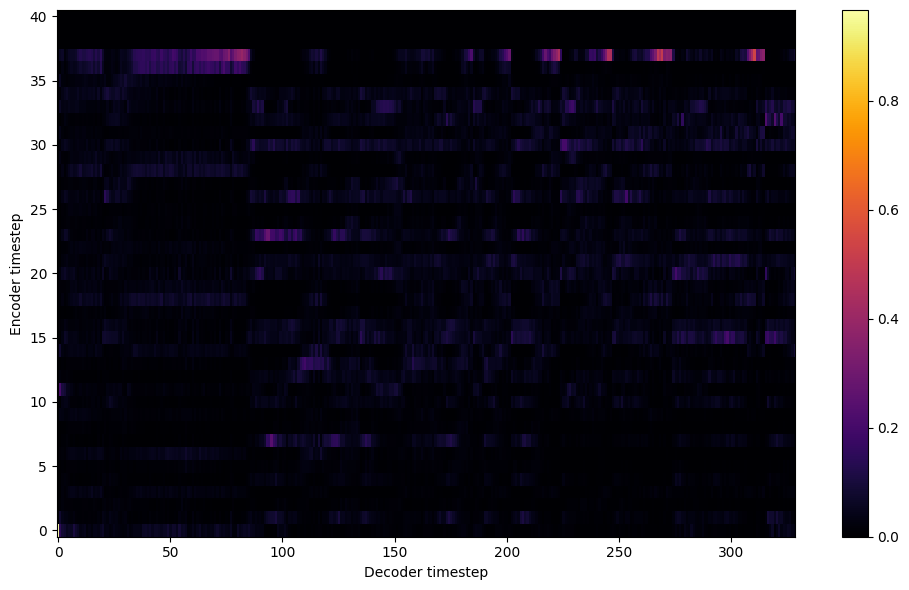


Starting Epoch: 1 Iteration: 12


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 1 Validation loss 24:  0.432053  Time: 0.4m LR: 0.000300


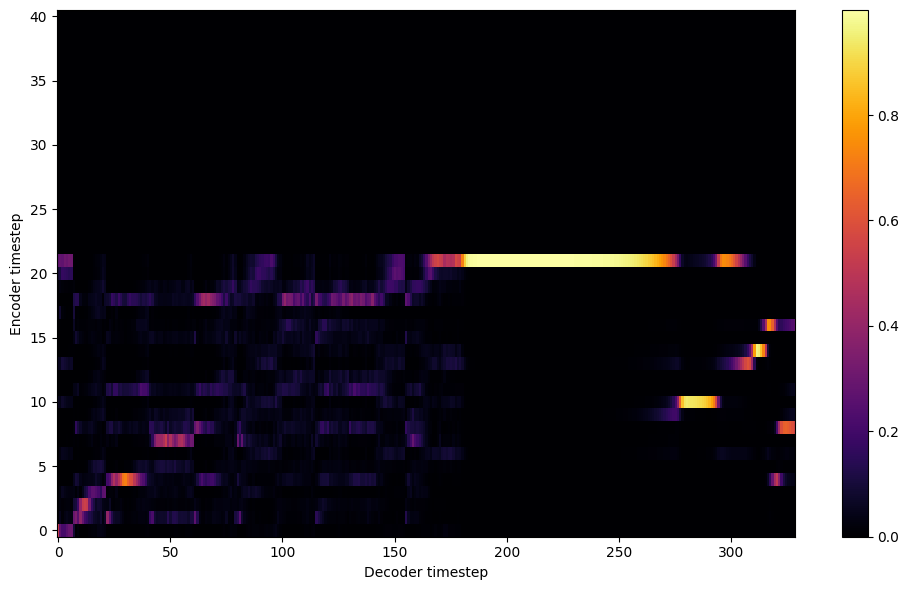


Starting Epoch: 2 Iteration: 24


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 2 Validation loss 36:  0.401036  Time: 0.4m LR: 0.000300


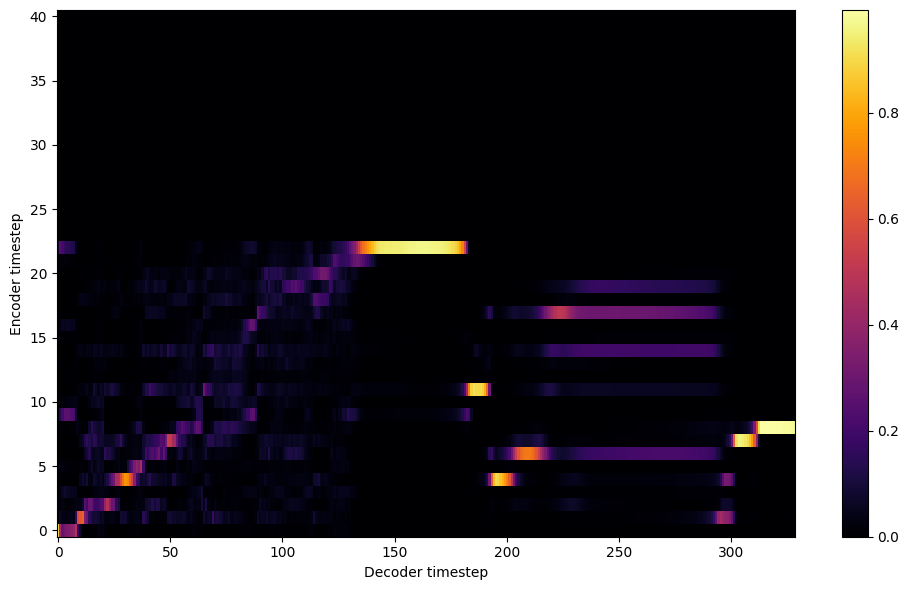


Starting Epoch: 3 Iteration: 36


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 3 Validation loss 48:  0.388094  Time: 0.4m LR: 0.000300


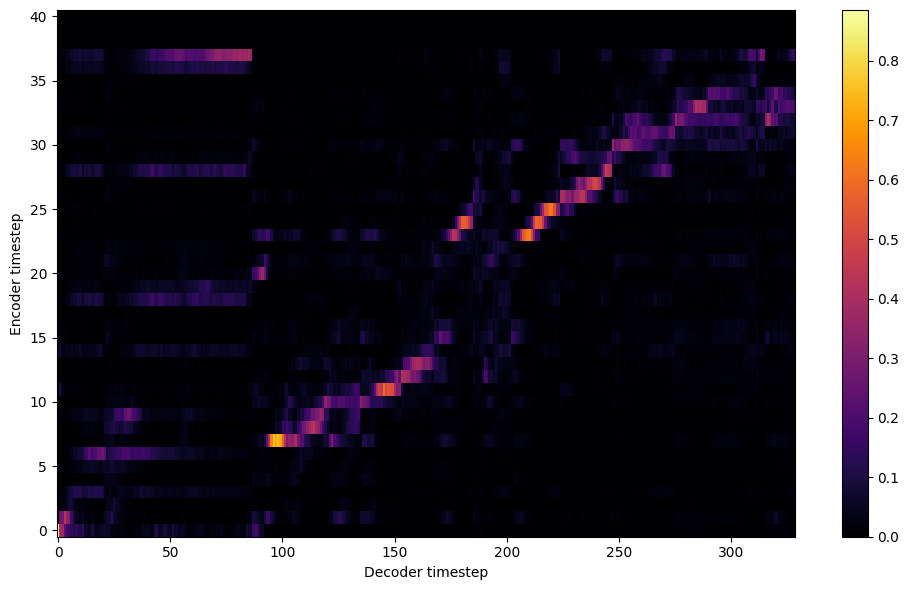


Starting Epoch: 4 Iteration: 48


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 4 Validation loss 60:  0.380117  Time: 0.4m LR: 0.000300


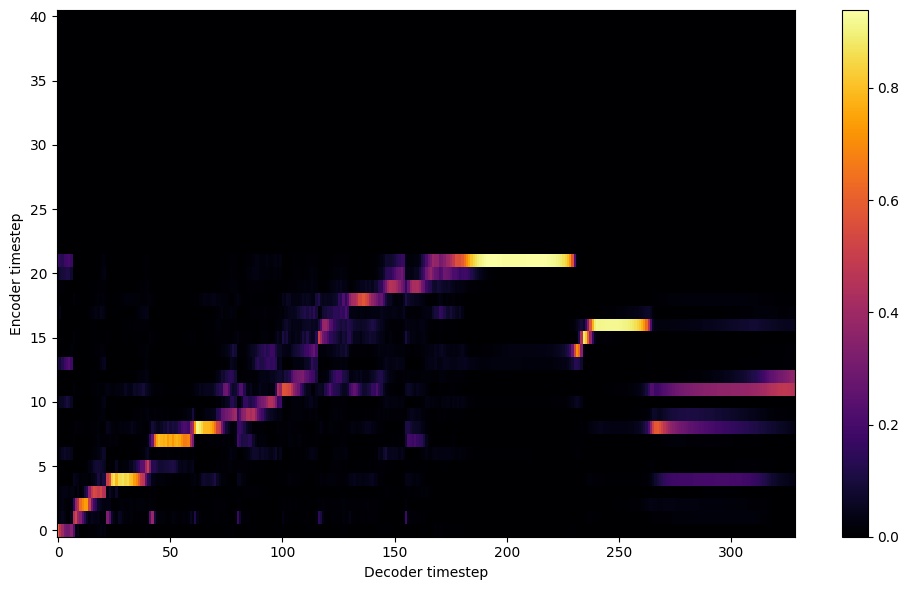


Starting Epoch: 5 Iteration: 60


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 5 Validation loss 72:  0.366419  Time: 0.4m LR: 0.000300


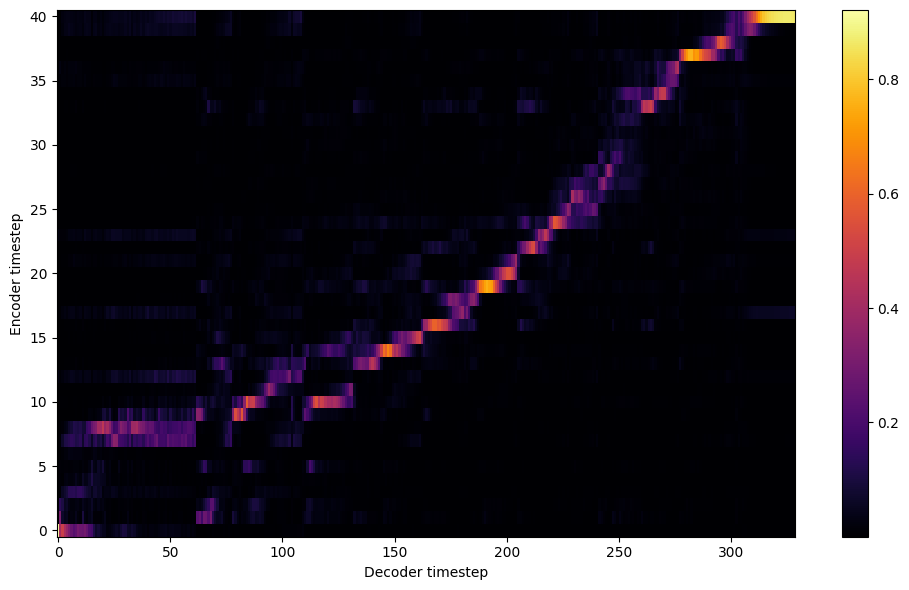


Starting Epoch: 6 Iteration: 72


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 6 Validation loss 84:  0.368565  Time: 0.5m LR: 0.000300


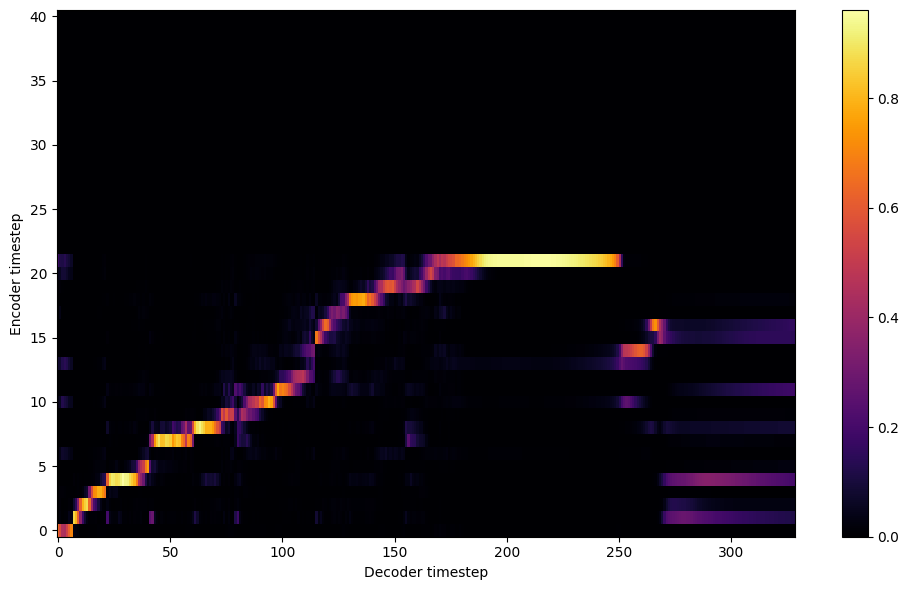


Starting Epoch: 7 Iteration: 84


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 7 Validation loss 96:  0.346347  Time: 0.4m LR: 0.000300


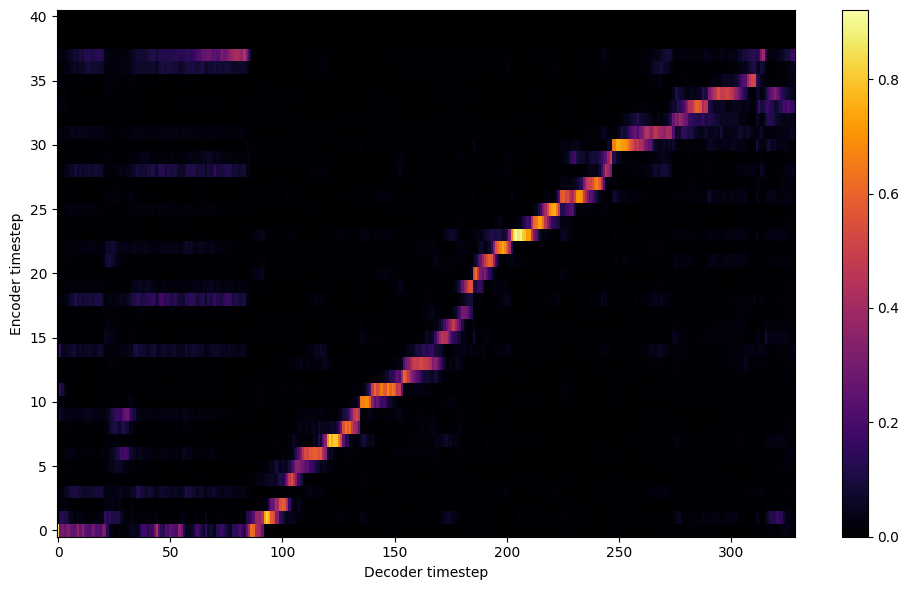


Starting Epoch: 8 Iteration: 96


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 8 Validation loss 108:  0.329511  Time: 0.4m LR: 0.000300


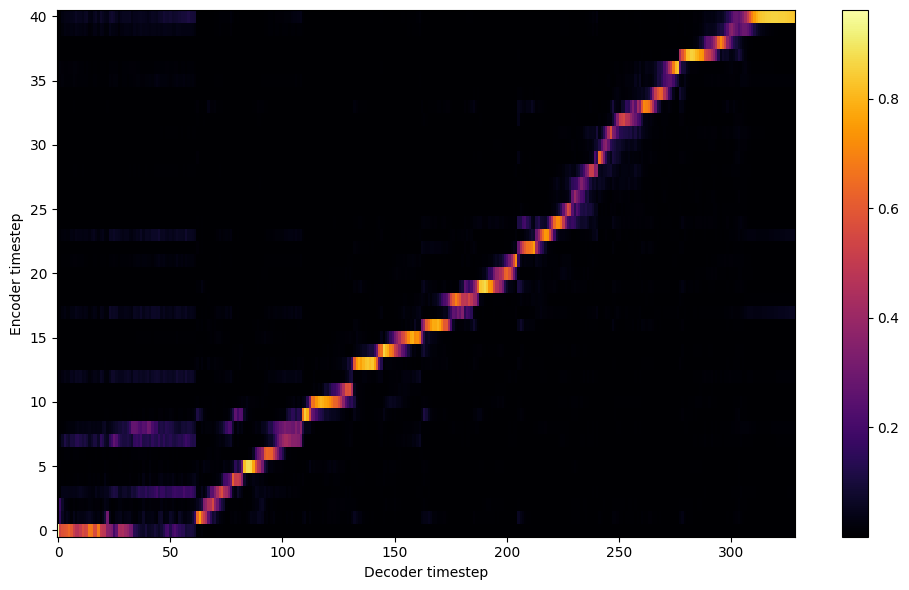


Starting Epoch: 9 Iteration: 108


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 9 Validation loss 120:  0.322542  Time: 0.4m LR: 0.000300


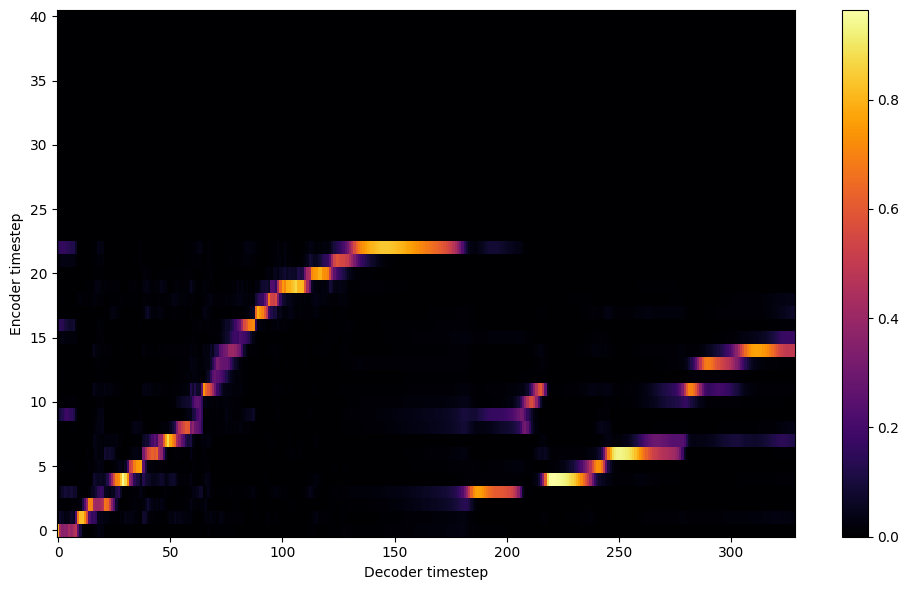

Saving model and optimizer state at iteration 120 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 10 Iteration: 120


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 10 Validation loss 132:  0.312354  Time: 0.4m LR: 0.000300


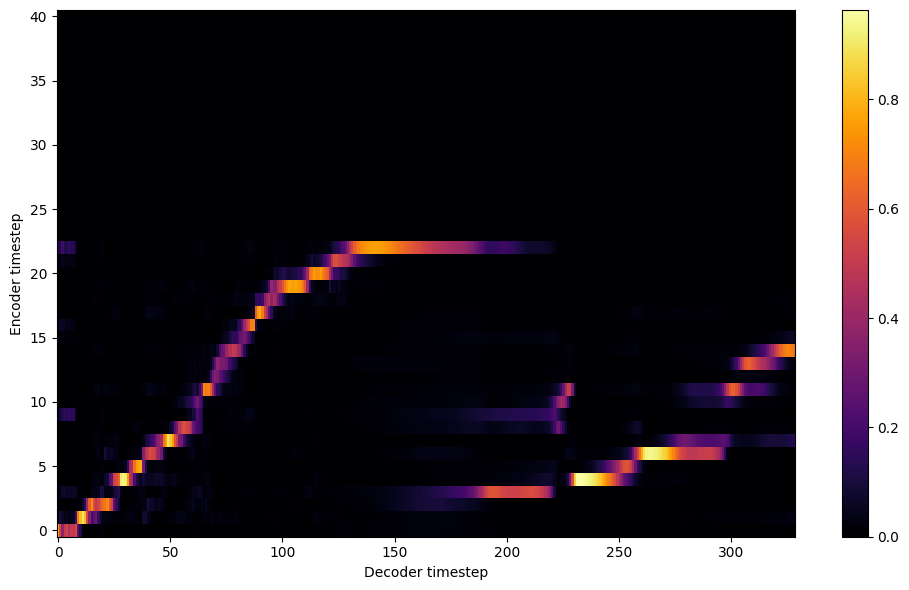


Starting Epoch: 11 Iteration: 132


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 11 Validation loss 144:  0.304113  Time: 0.4m LR: 0.000300


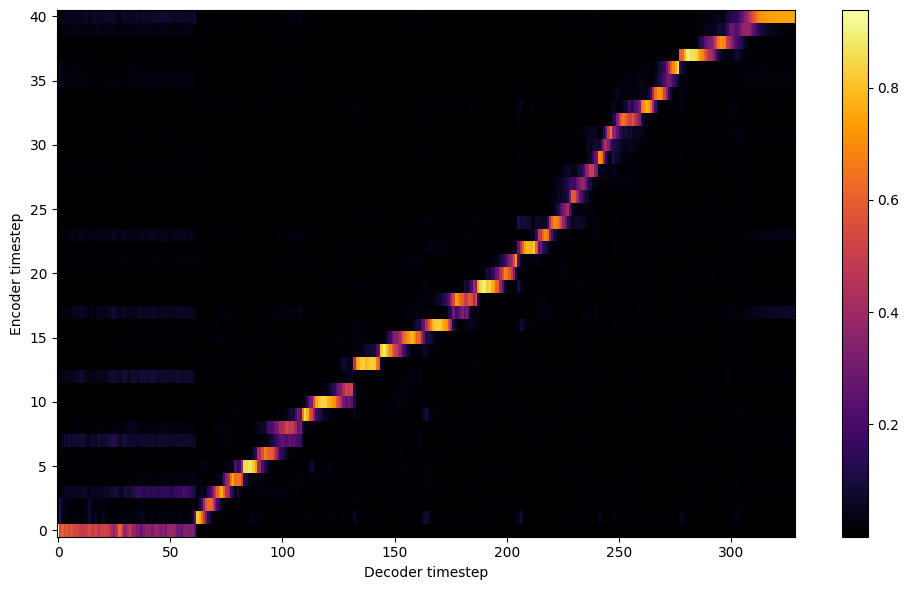


Starting Epoch: 12 Iteration: 144


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 12 Validation loss 156:  0.306902  Time: 0.4m LR: 0.000300


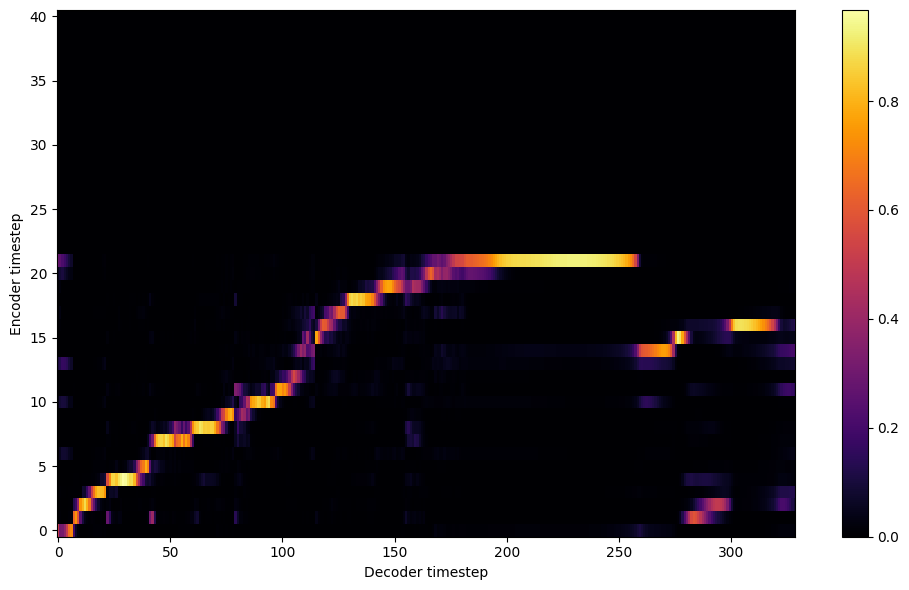


Starting Epoch: 13 Iteration: 156


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 13 Validation loss 168:  0.304216  Time: 0.4m LR: 0.000300


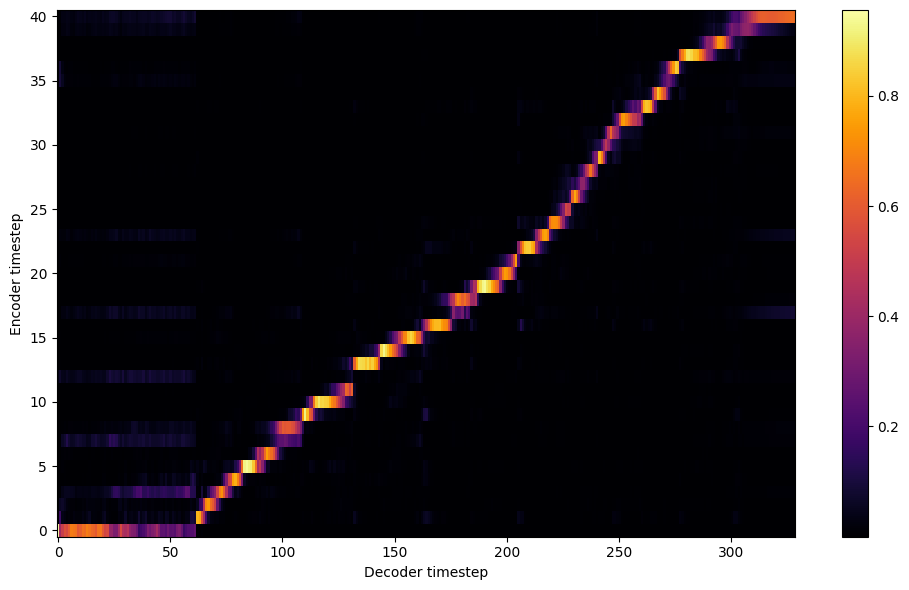


Starting Epoch: 14 Iteration: 168


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 14 Validation loss 180:  0.287774  Time: 0.4m LR: 0.000300


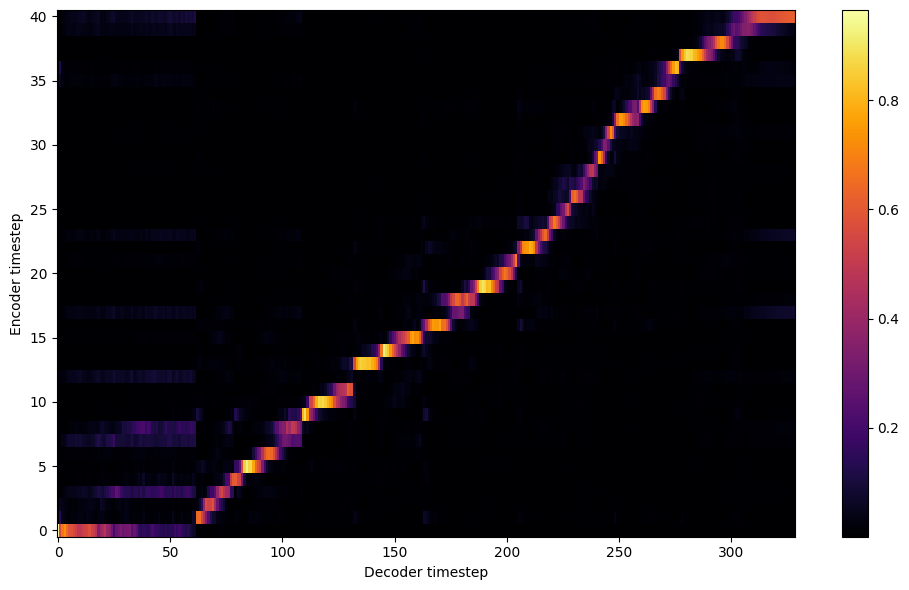


Starting Epoch: 15 Iteration: 180


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 15 Validation loss 192:  0.286748  Time: 0.4m LR: 0.000300


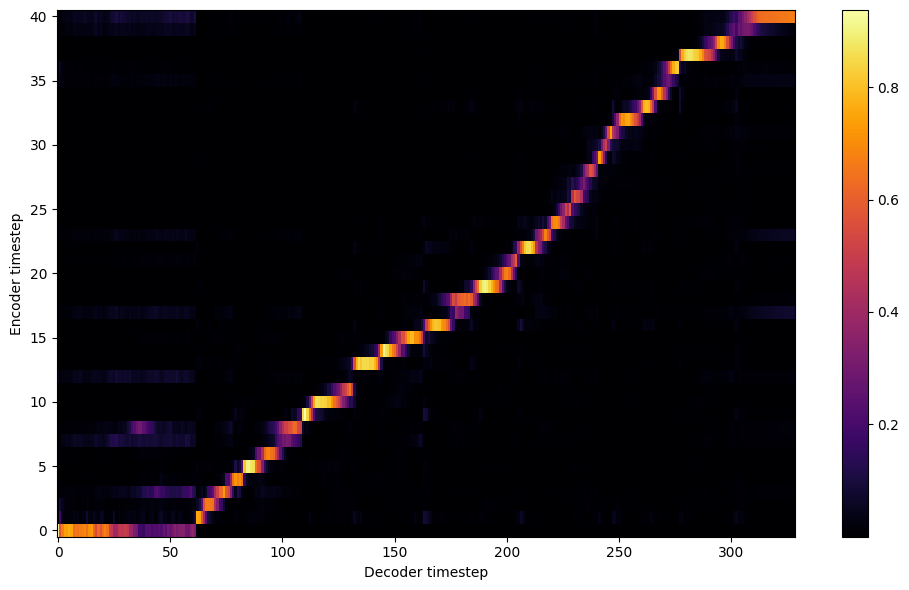


Starting Epoch: 16 Iteration: 192


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 16 Validation loss 204:  0.281382  Time: 0.4m LR: 0.000300


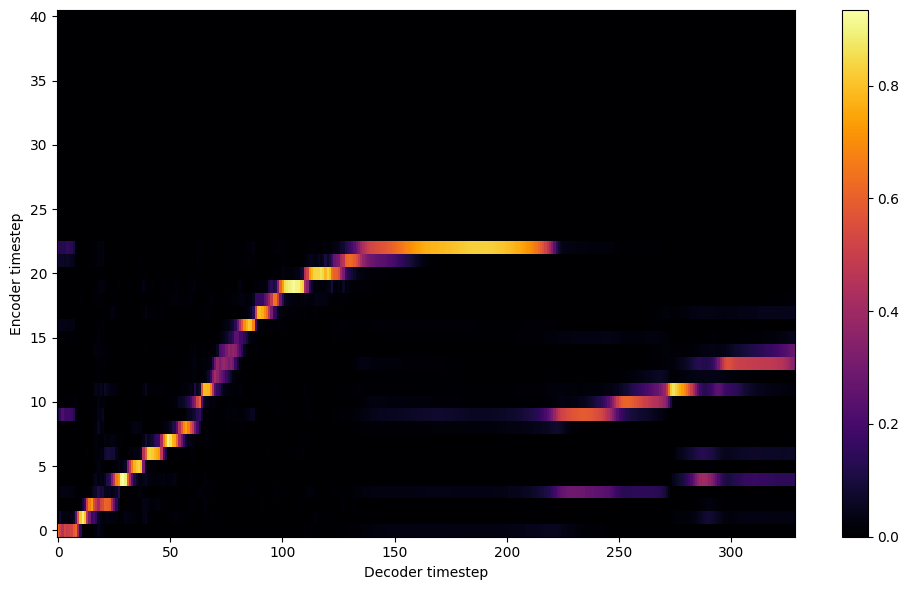


Starting Epoch: 17 Iteration: 204


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 17 Validation loss 216:  0.281485  Time: 0.4m LR: 0.000300


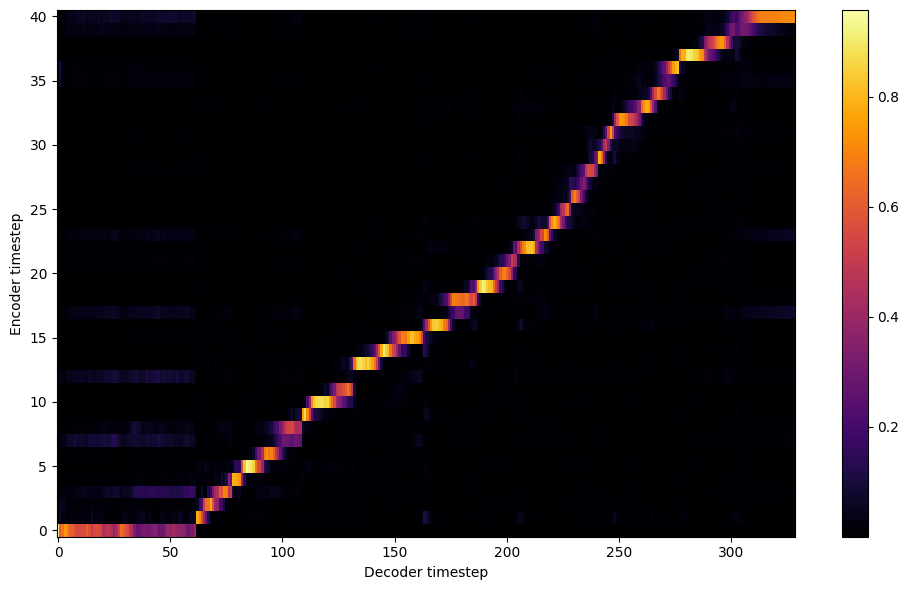


Starting Epoch: 18 Iteration: 216


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 18 Validation loss 228:  0.270058  Time: 0.4m LR: 0.000300


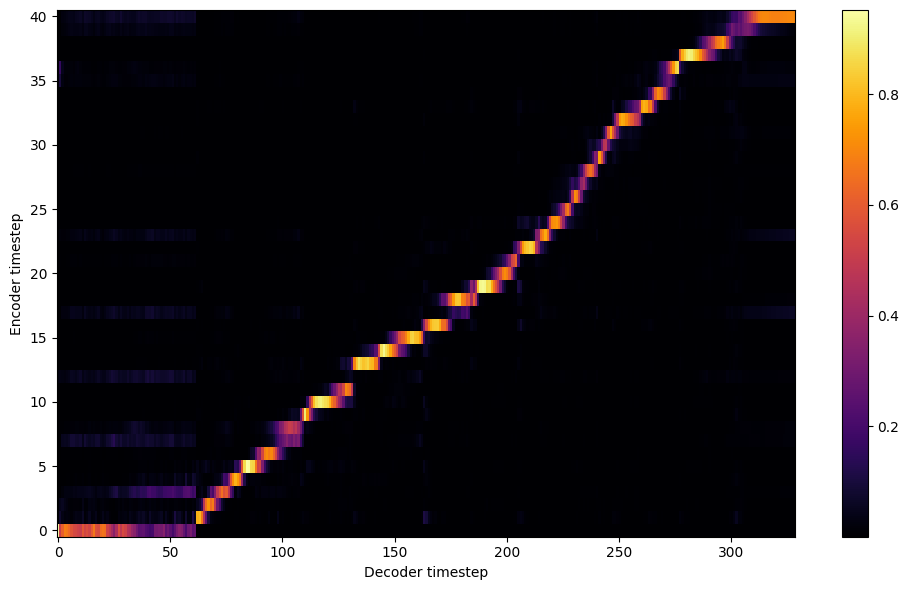


Starting Epoch: 19 Iteration: 228


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 19 Validation loss 240:  0.265752  Time: 0.4m LR: 0.000300


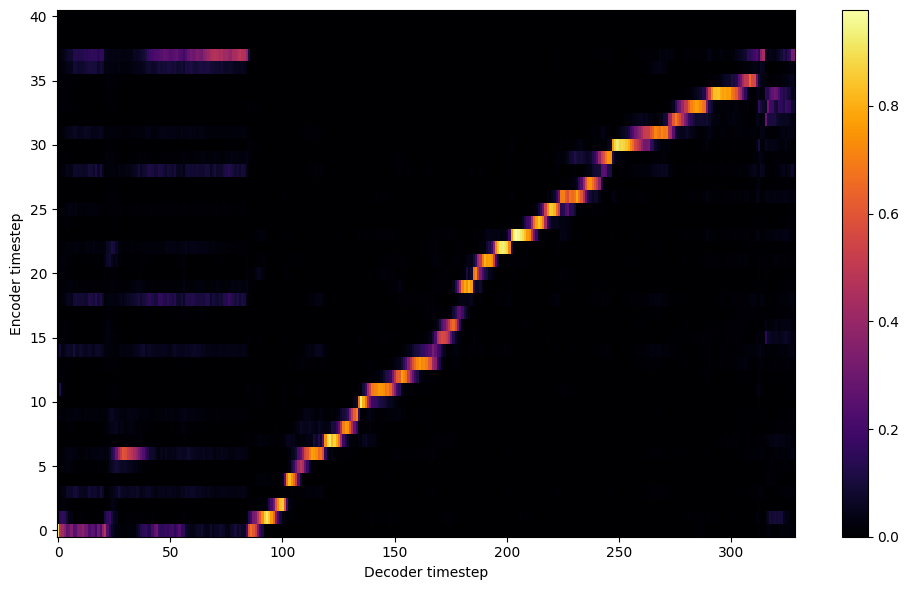

Saving model and optimizer state at iteration 240 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 20 Iteration: 240


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 20 Validation loss 252:  0.267718  Time: 0.5m LR: 0.000300


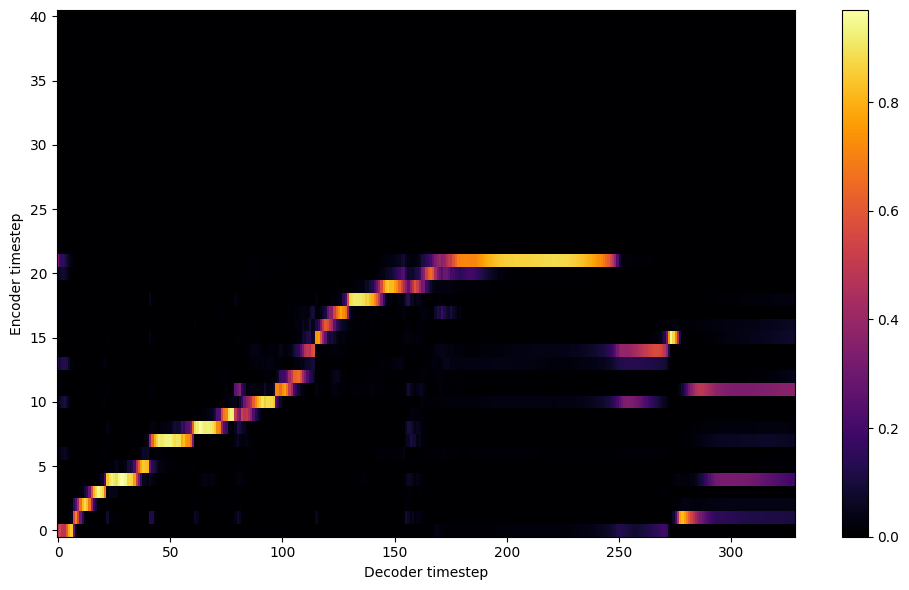


Starting Epoch: 21 Iteration: 252


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 21 Validation loss 264:  0.260287  Time: 0.5m LR: 0.000300


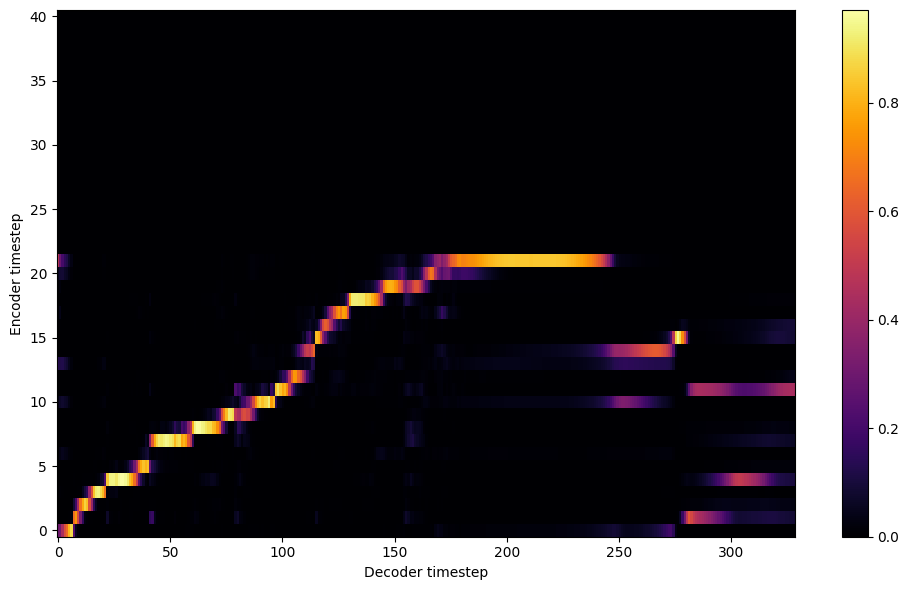


Starting Epoch: 22 Iteration: 264


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 22 Validation loss 276:  0.257224  Time: 0.4m LR: 0.000300


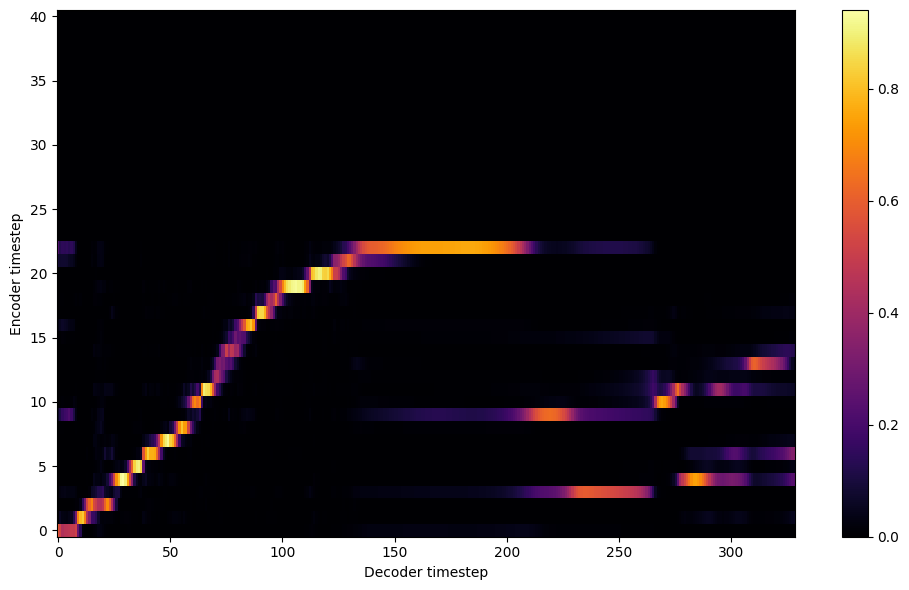


Starting Epoch: 23 Iteration: 276


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 23 Validation loss 288:  0.251440  Time: 0.5m LR: 0.000300


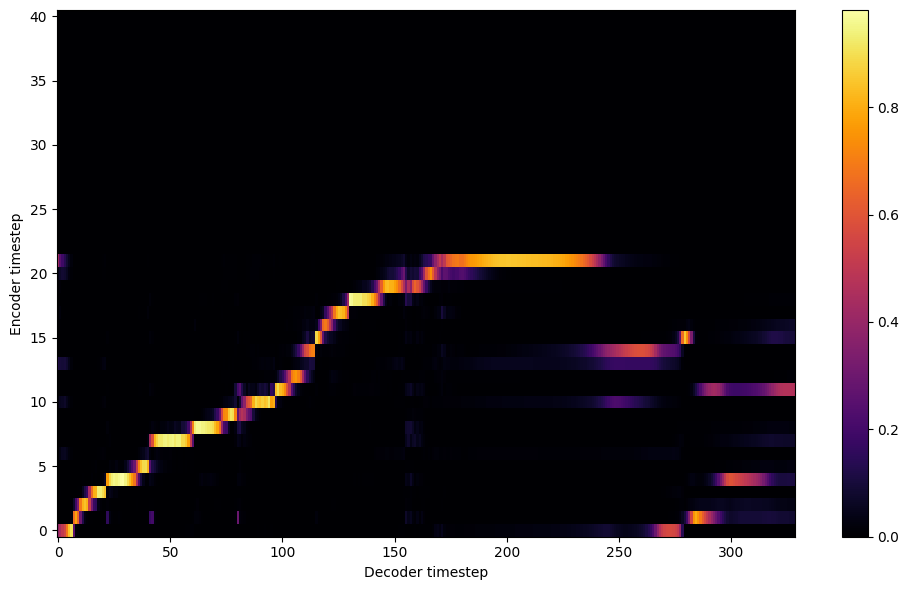


Starting Epoch: 24 Iteration: 288


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 24 Validation loss 300:  0.247937  Time: 0.4m LR: 0.000300


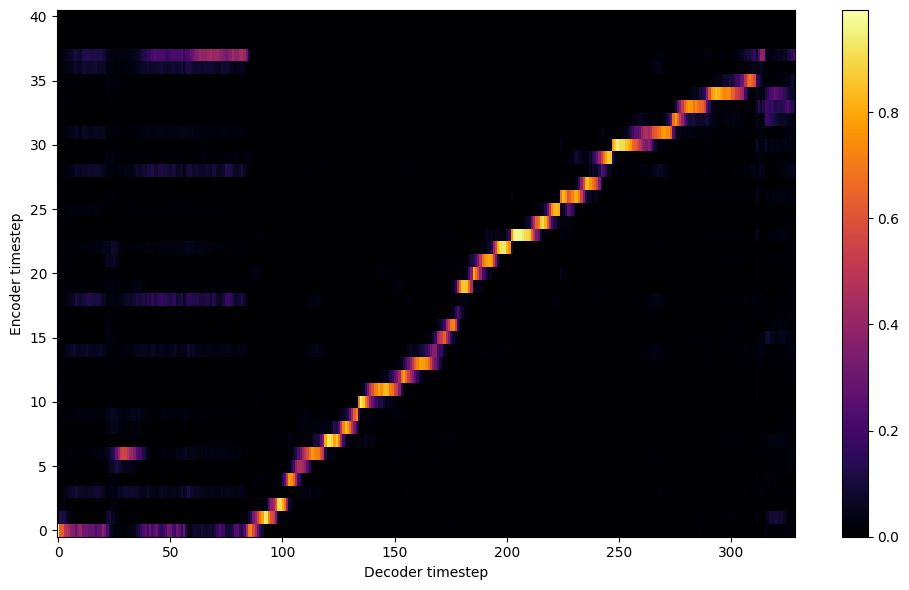


Starting Epoch: 25 Iteration: 300


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 25 Validation loss 312:  0.247481  Time: 0.5m LR: 0.000300


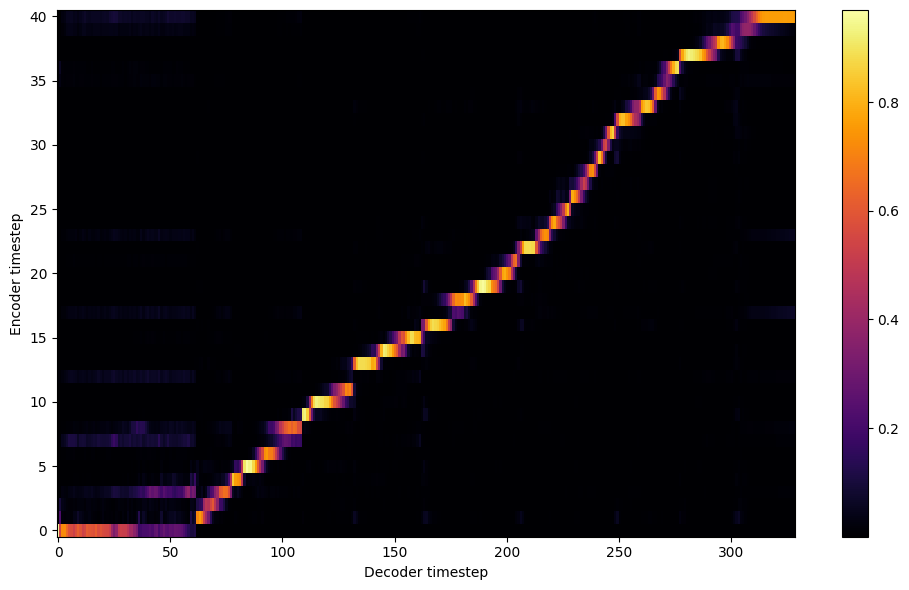


Starting Epoch: 26 Iteration: 312


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 26 Validation loss 324:  0.242774  Time: 0.4m LR: 0.000300


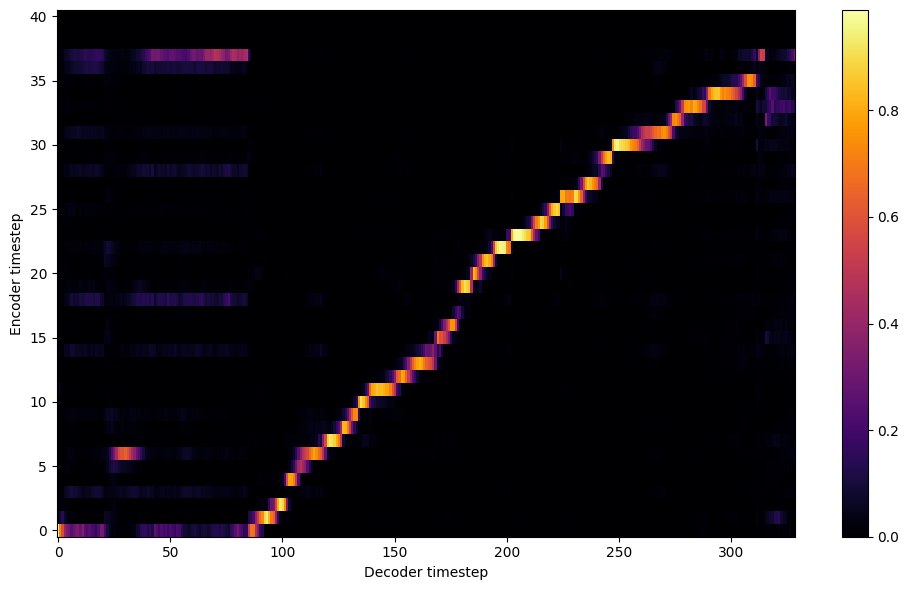


Starting Epoch: 27 Iteration: 324


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 27 Validation loss 336:  0.241479  Time: 0.5m LR: 0.000300


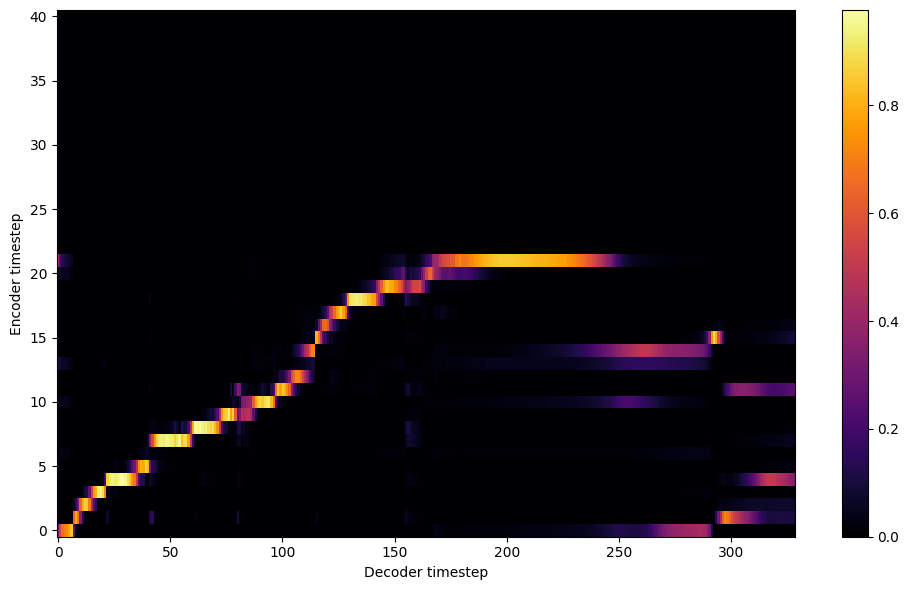


Starting Epoch: 28 Iteration: 336


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 28 Validation loss 348:  0.233802  Time: 0.4m LR: 0.000300


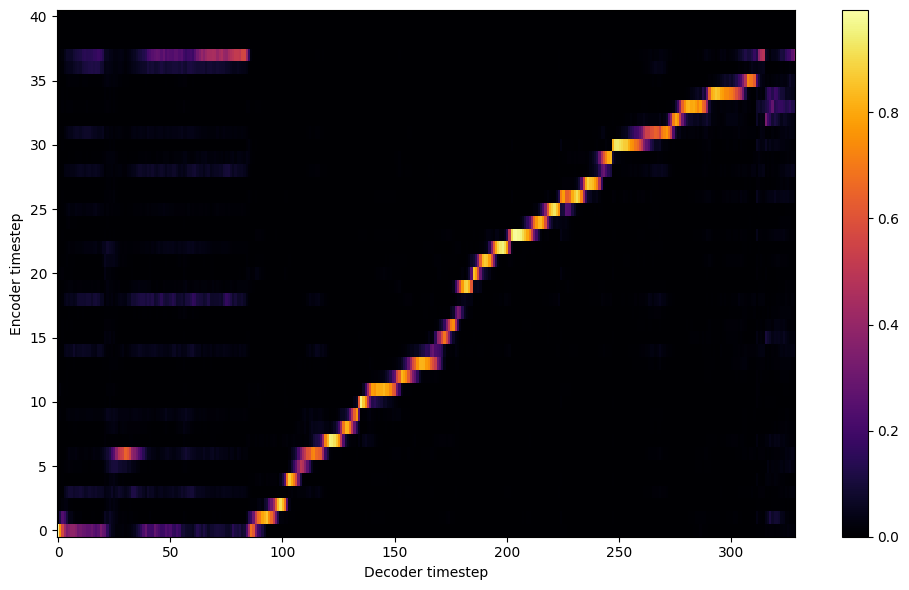


Starting Epoch: 29 Iteration: 348


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 29 Validation loss 360:  0.231572  Time: 0.5m LR: 0.000300


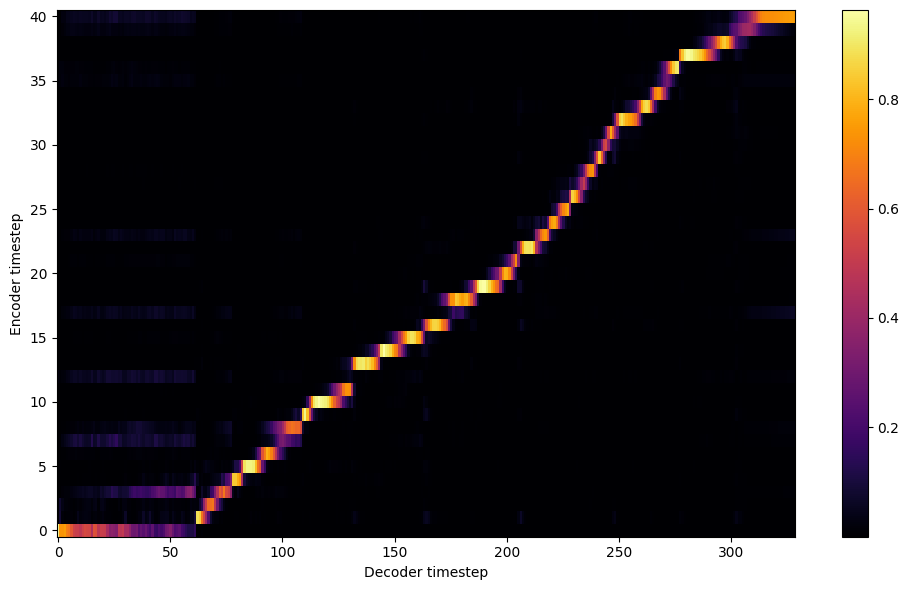

Saving model and optimizer state at iteration 360 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 30 Iteration: 360


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 30 Validation loss 372:  0.227783  Time: 0.5m LR: 0.000300


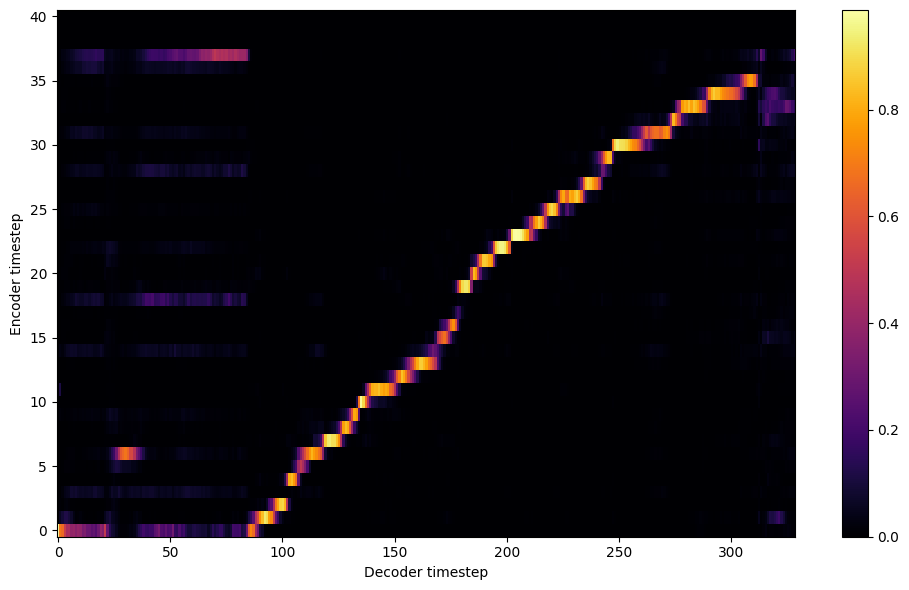


Starting Epoch: 31 Iteration: 372


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 31 Validation loss 384:  0.226721  Time: 0.4m LR: 0.000300


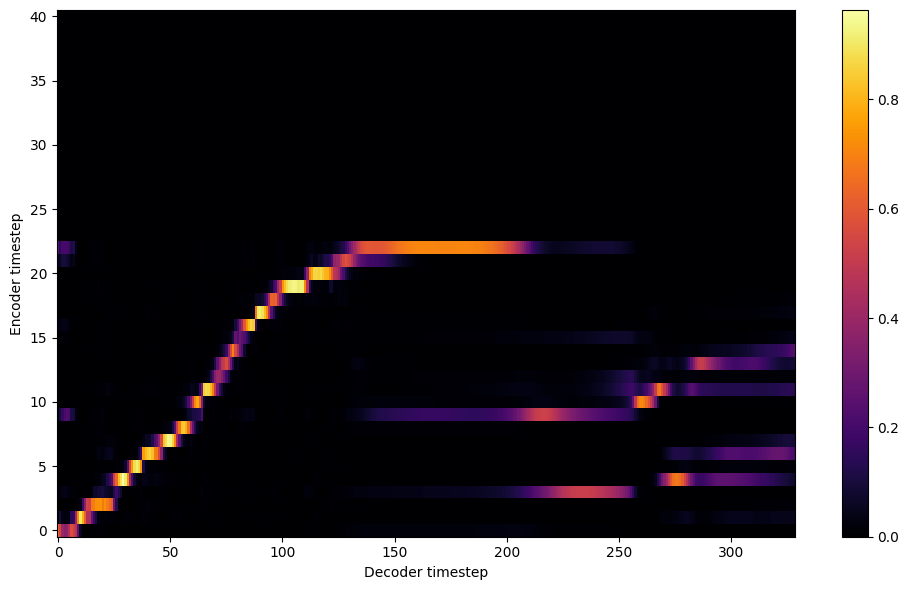


Starting Epoch: 32 Iteration: 384


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 32 Validation loss 396:  0.221104  Time: 0.5m LR: 0.000300


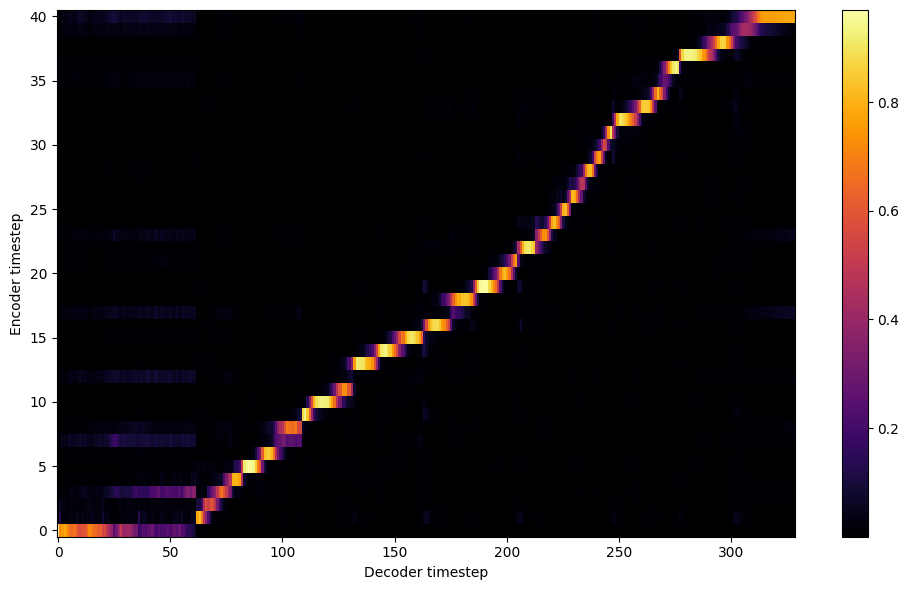


Starting Epoch: 33 Iteration: 396


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 33 Validation loss 408:  0.220649  Time: 0.4m LR: 0.000300


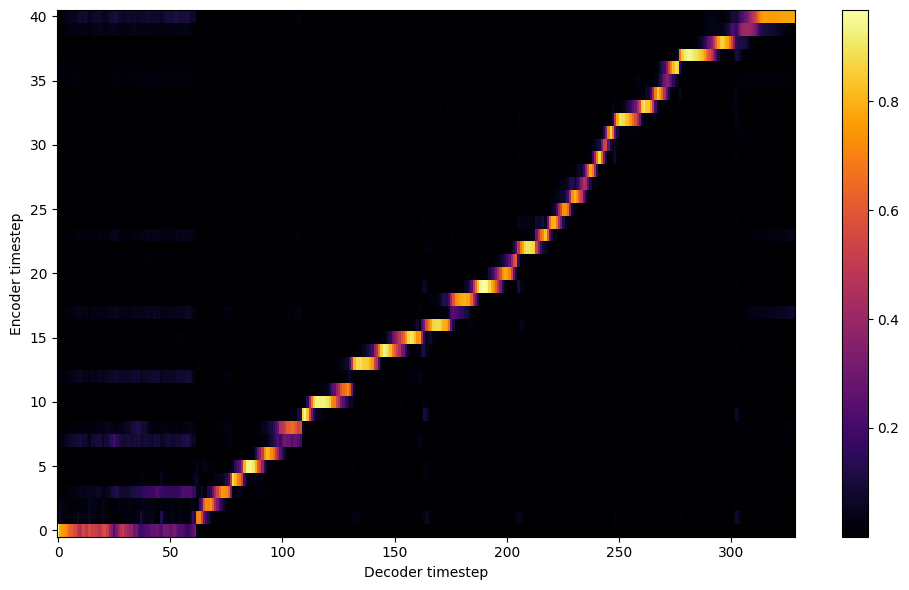


Starting Epoch: 34 Iteration: 408


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 34 Validation loss 420:  0.217749  Time: 0.4m LR: 0.000300


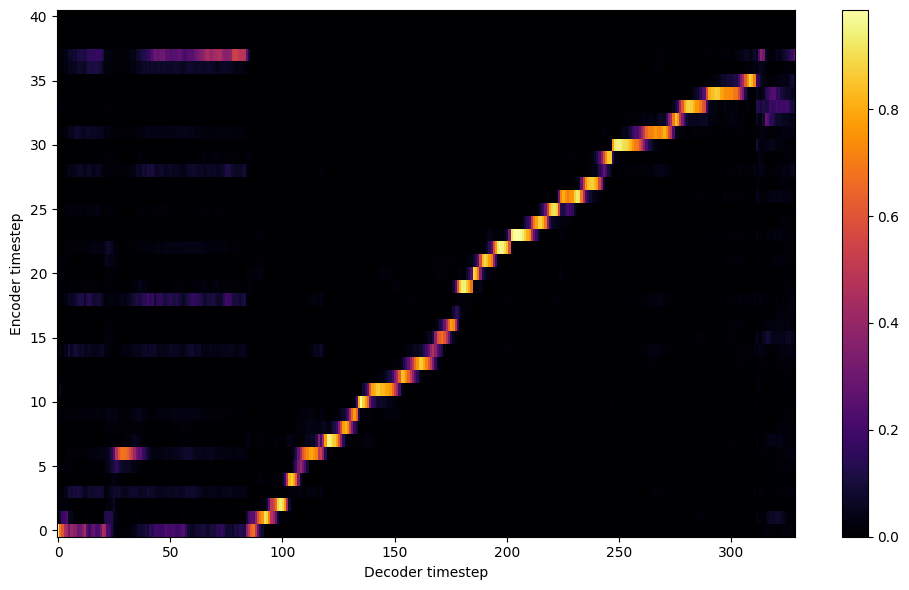


Starting Epoch: 35 Iteration: 420


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 35 Validation loss 432:  0.216893  Time: 0.4m LR: 0.000300


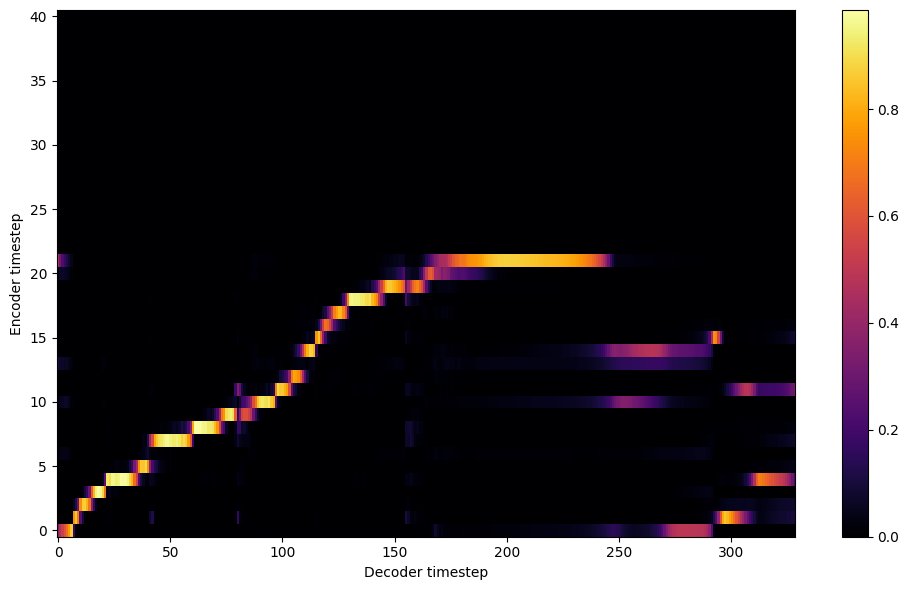


Starting Epoch: 36 Iteration: 432


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 36 Validation loss 444:  0.213617  Time: 0.5m LR: 0.000300


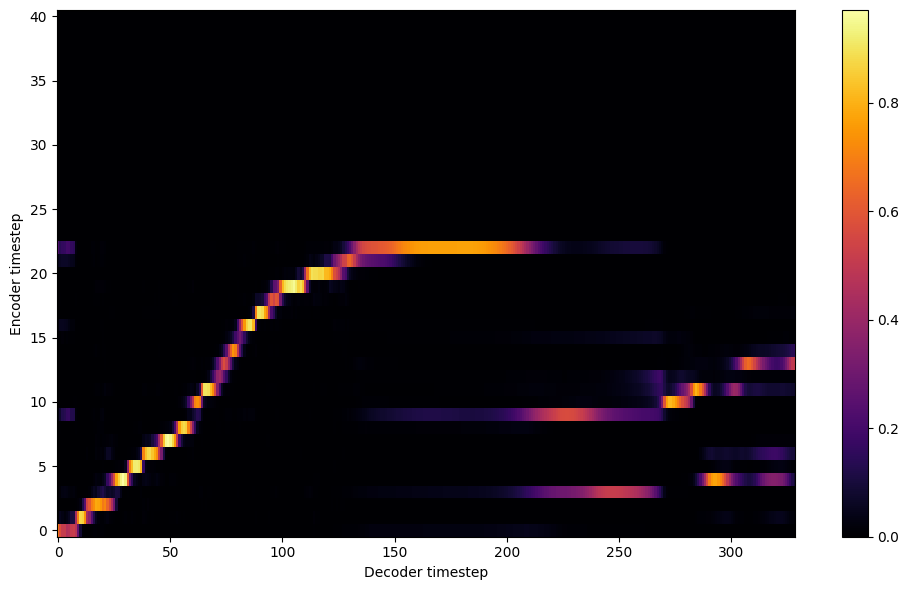


Starting Epoch: 37 Iteration: 444


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 37 Validation loss 456:  0.211817  Time: 0.4m LR: 0.000300


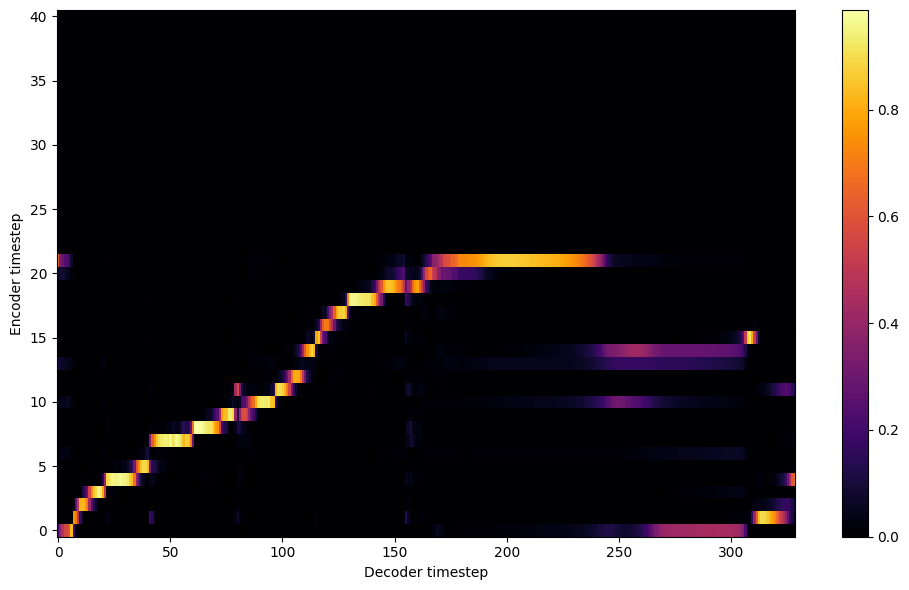


Starting Epoch: 38 Iteration: 456


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 38 Validation loss 468:  0.206375  Time: 0.4m LR: 0.000300


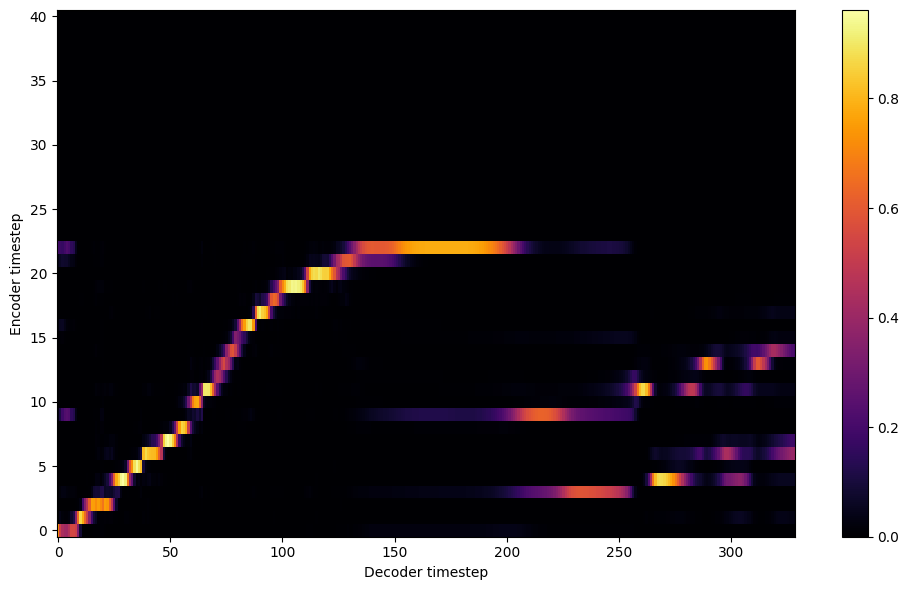


Starting Epoch: 39 Iteration: 468


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 39 Validation loss 480:  0.208669  Time: 0.5m LR: 0.000300


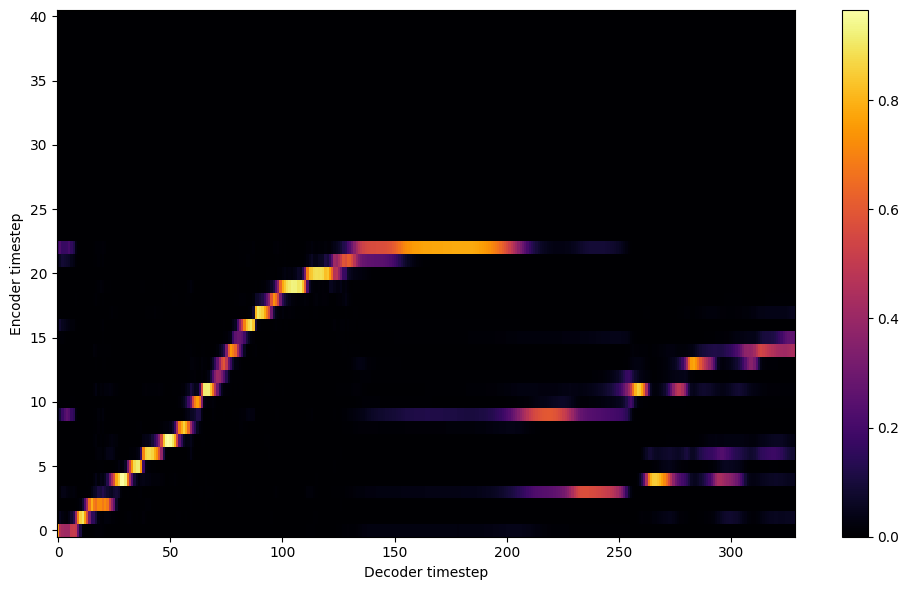

Saving model and optimizer state at iteration 480 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 40 Iteration: 480


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 40 Validation loss 492:  0.204721  Time: 0.5m LR: 0.000300


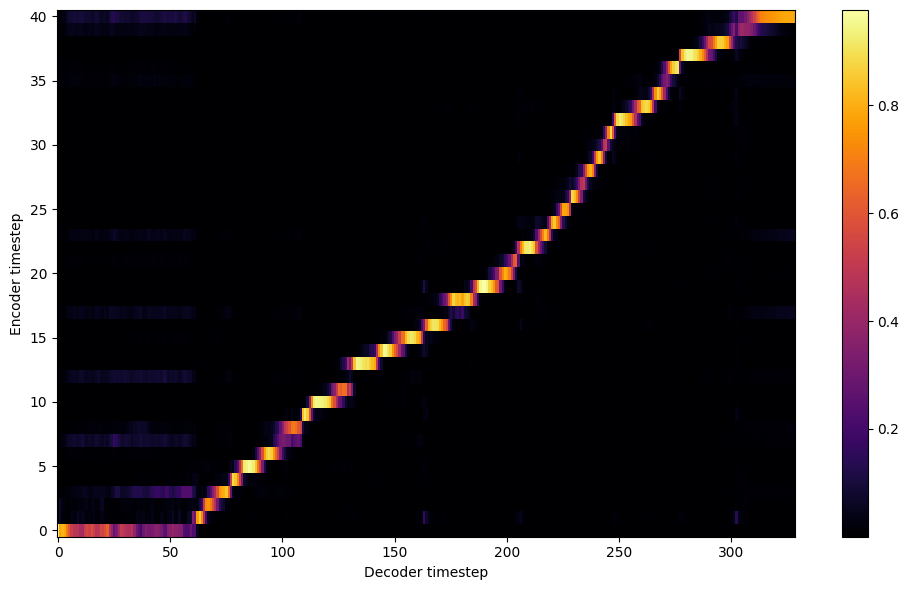


Starting Epoch: 41 Iteration: 492


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 41 Validation loss 504:  0.201930  Time: 0.4m LR: 0.000300


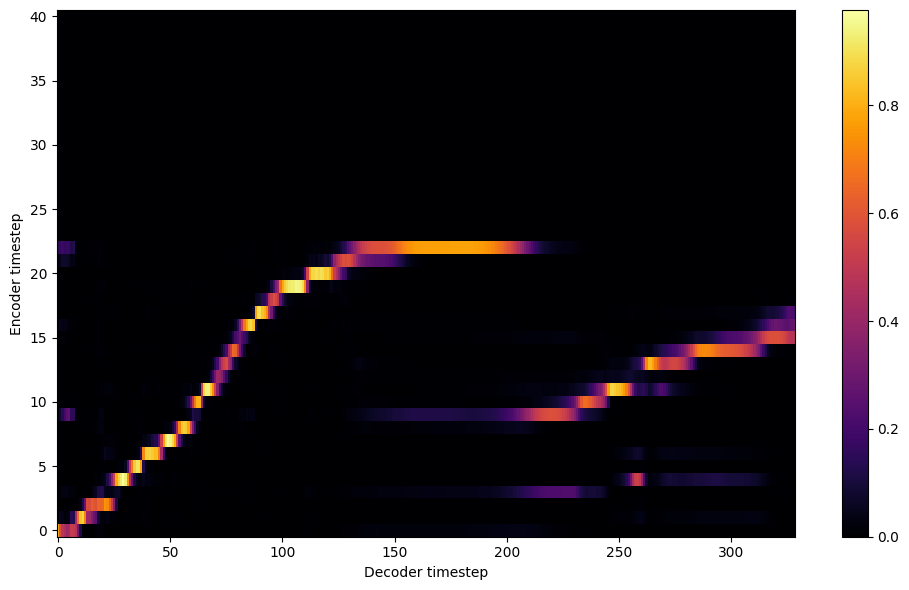


Starting Epoch: 42 Iteration: 504


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 42 Validation loss 516:  0.199360  Time: 0.4m LR: 0.000300


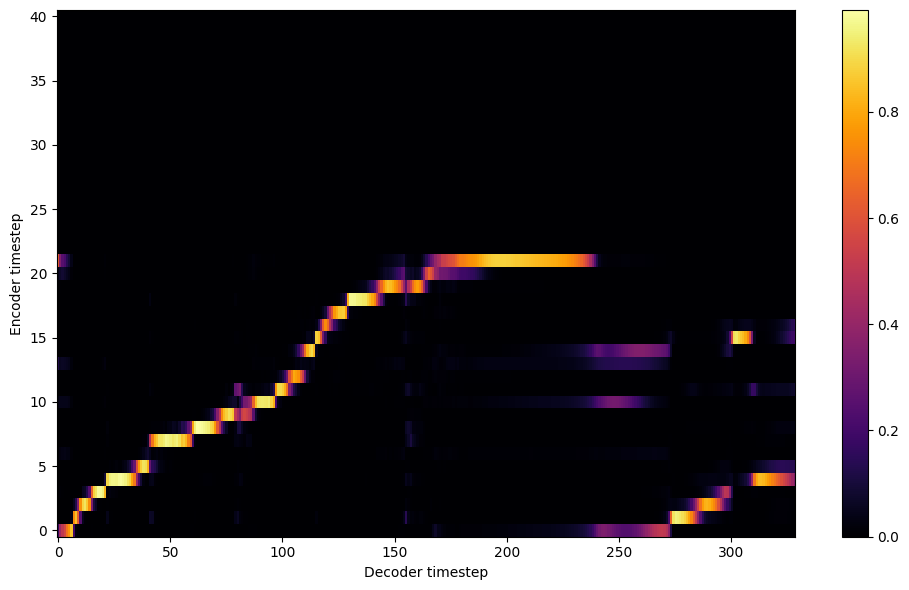


Starting Epoch: 43 Iteration: 516


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 43 Validation loss 528:  0.202649  Time: 0.4m LR: 0.000300


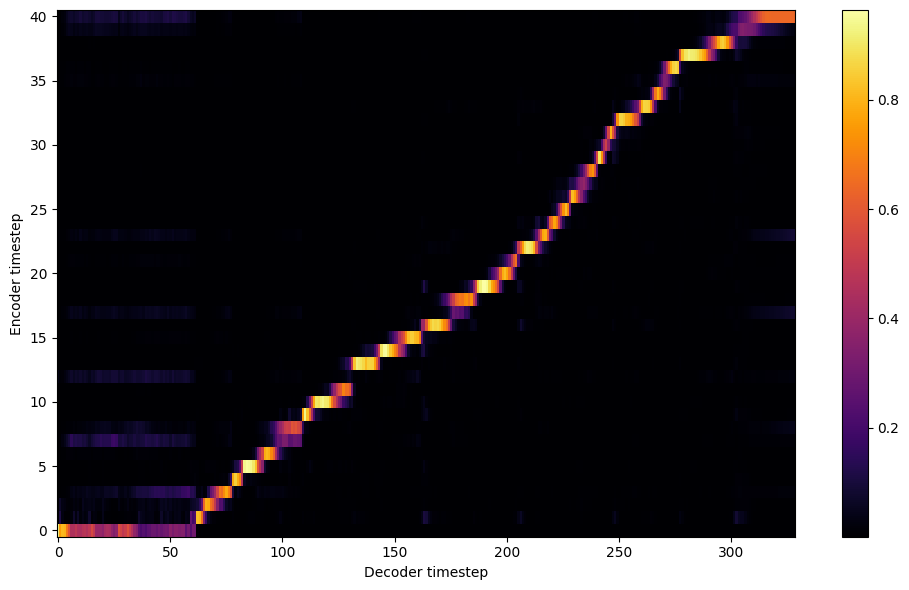


Starting Epoch: 44 Iteration: 528


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 44 Validation loss 540:  0.200152  Time: 0.4m LR: 0.000300


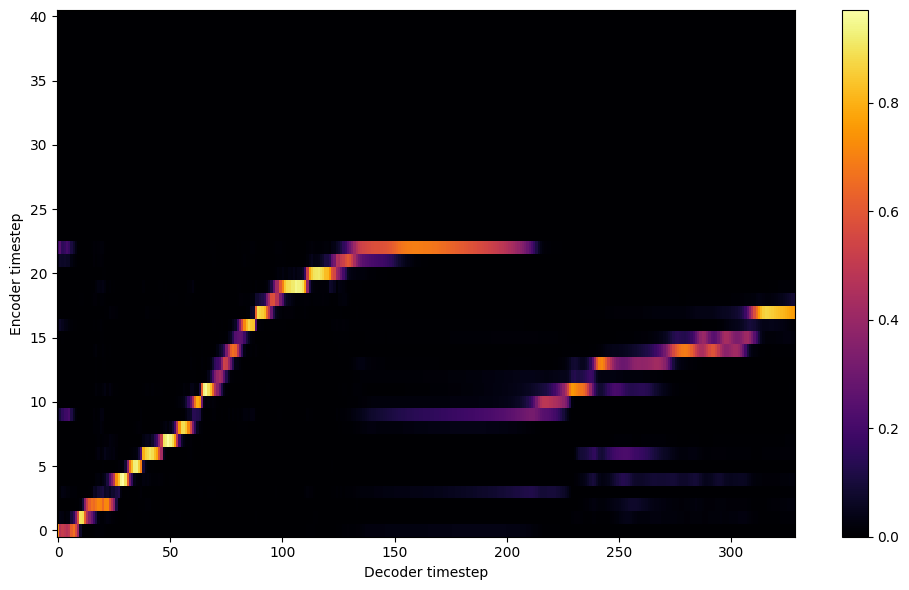


Starting Epoch: 45 Iteration: 540


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 45 Validation loss 552:  0.199796  Time: 0.4m LR: 0.000300


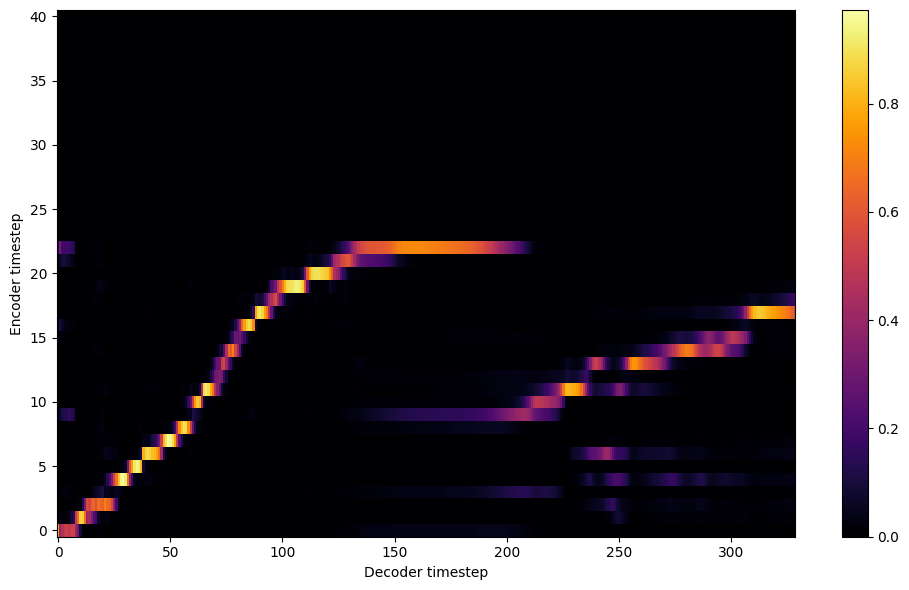


Starting Epoch: 46 Iteration: 552


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 46 Validation loss 564:  0.194359  Time: 0.4m LR: 0.000300


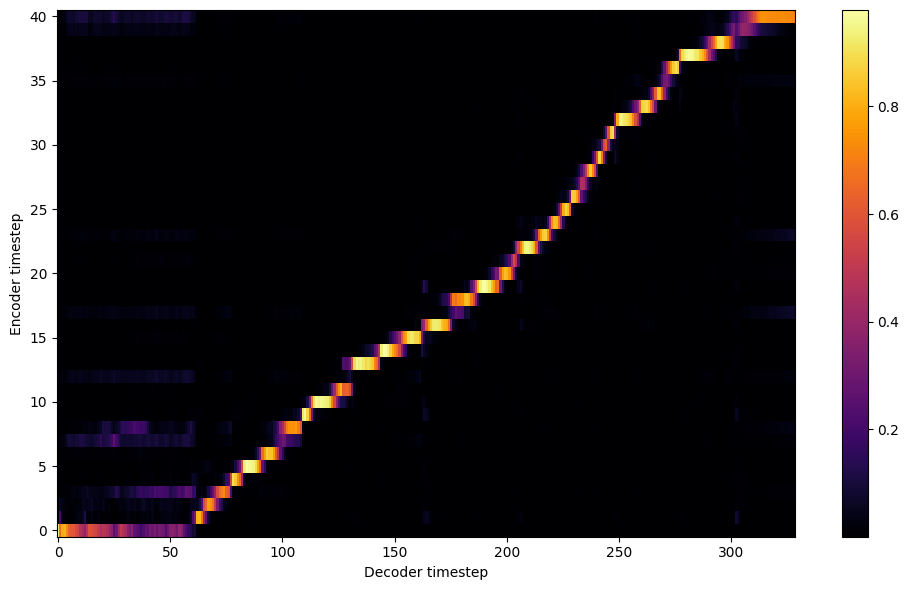


Starting Epoch: 47 Iteration: 564


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 47 Validation loss 576:  0.193361  Time: 0.4m LR: 0.000300


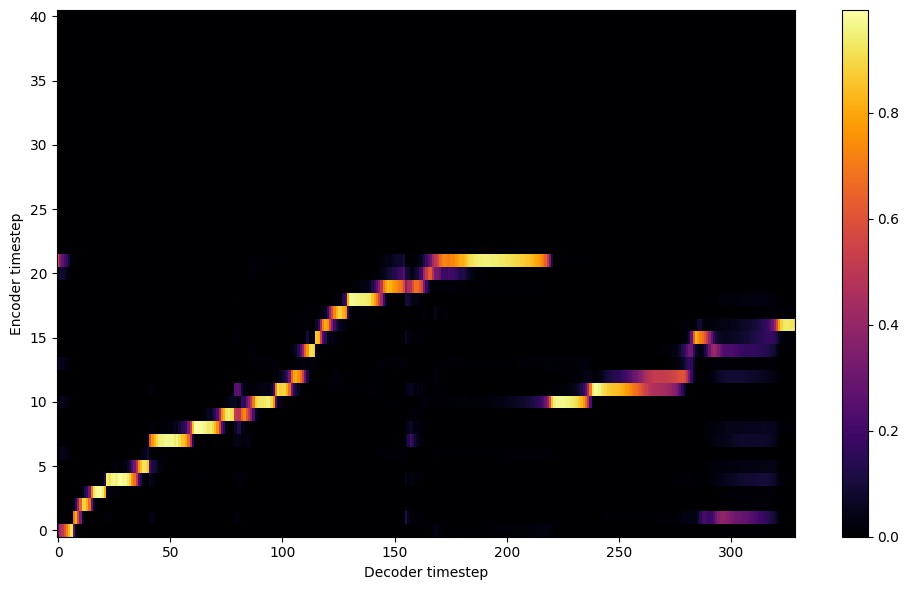


Starting Epoch: 48 Iteration: 576


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 48 Validation loss 588:  0.194463  Time: 0.4m LR: 0.000300


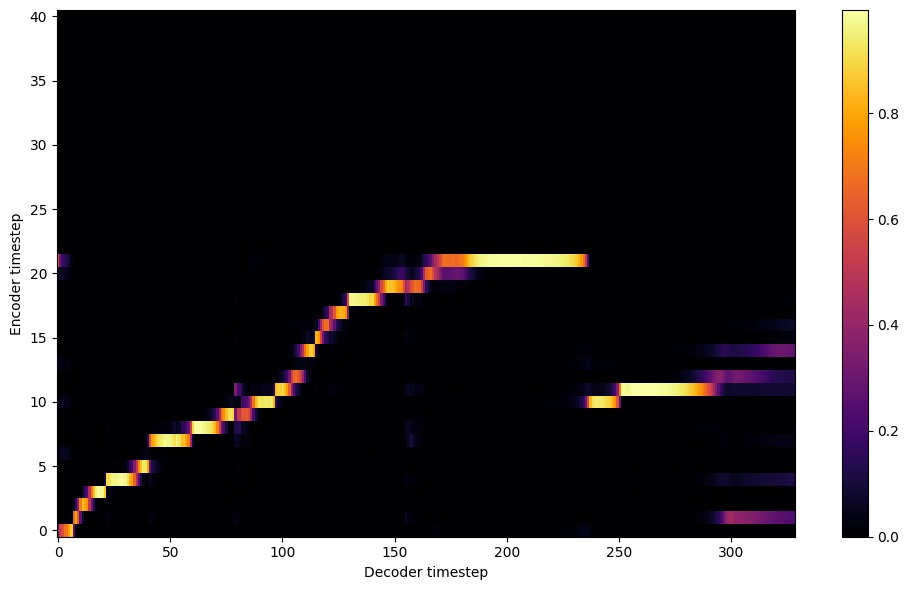


Starting Epoch: 49 Iteration: 588


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 49 Validation loss 600:  0.189284  Time: 0.4m LR: 0.000300


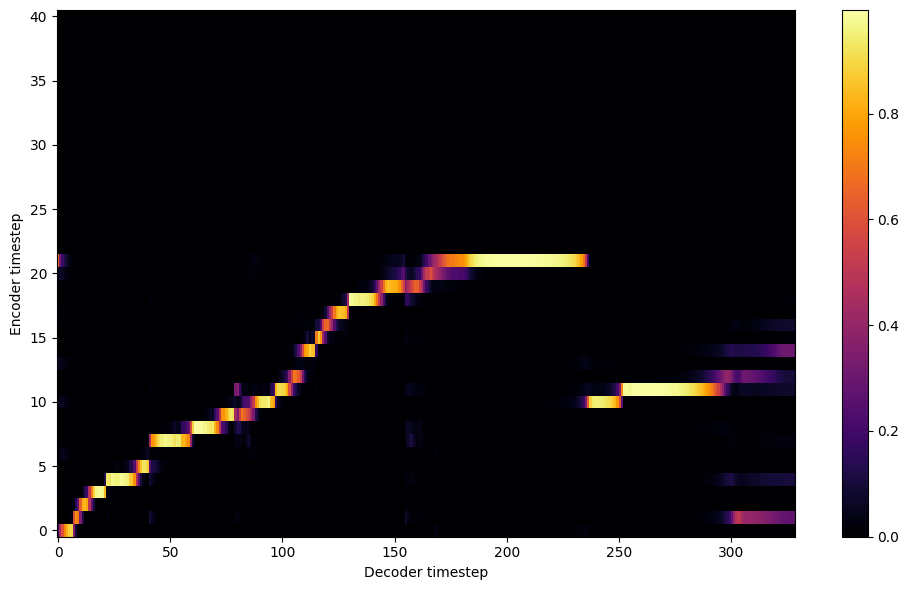

Saving model and optimizer state at iteration 600 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 50 Iteration: 600


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 50 Validation loss 612:  0.188371  Time: 0.5m LR: 0.000300


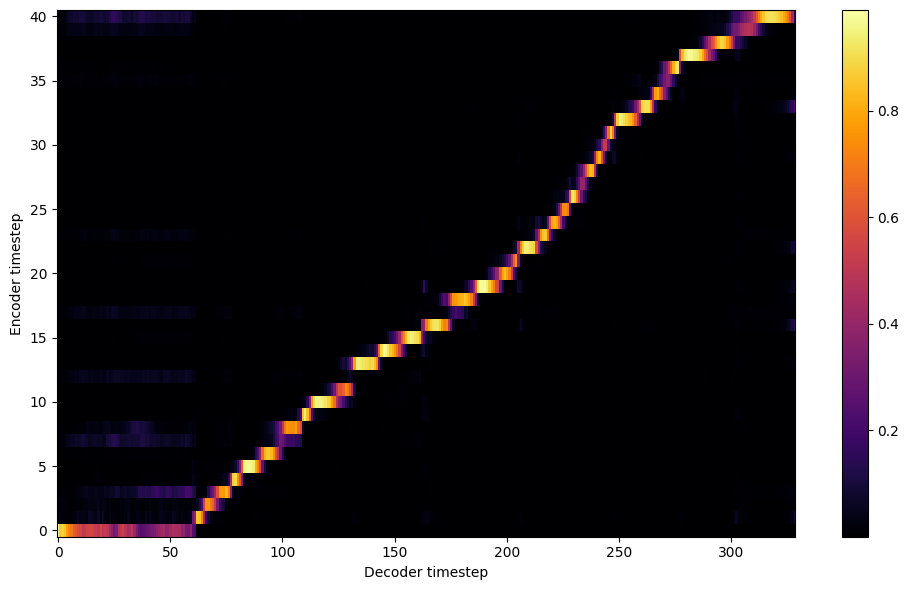


Starting Epoch: 51 Iteration: 612


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 51 Validation loss 624:  0.185681  Time: 0.4m LR: 0.000300


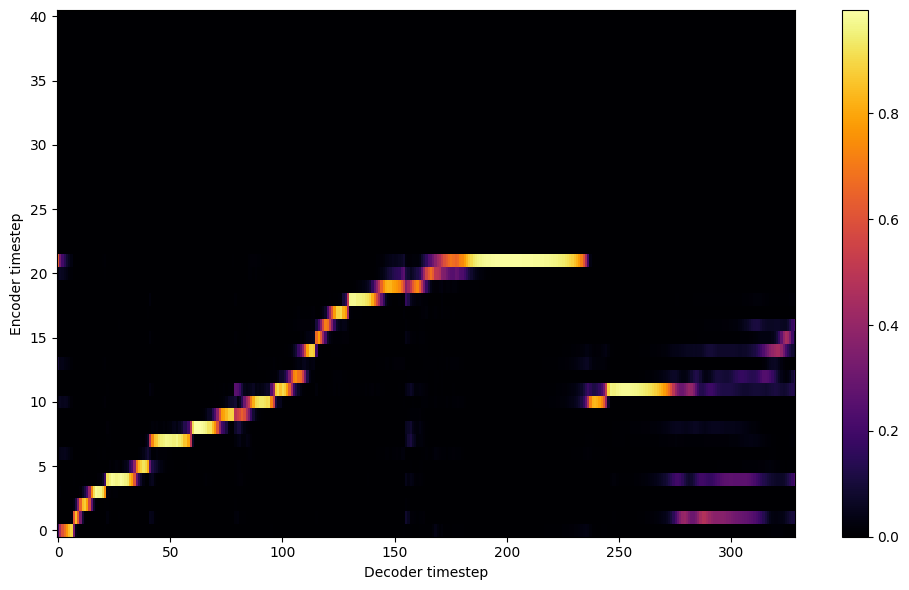


Starting Epoch: 52 Iteration: 624


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 52 Validation loss 636:  0.184728  Time: 0.4m LR: 0.000300


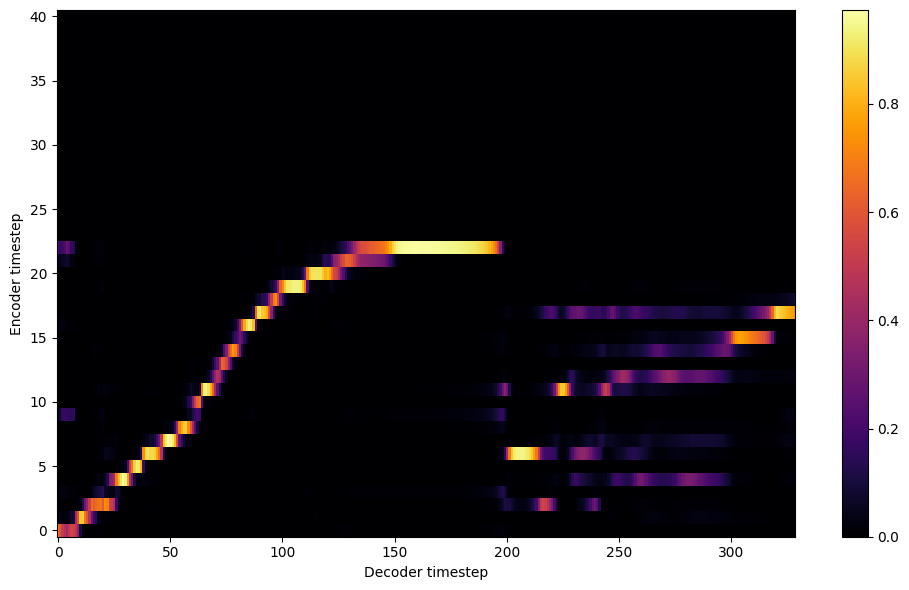


Starting Epoch: 53 Iteration: 636


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 53 Validation loss 648:  0.180388  Time: 0.4m LR: 0.000300


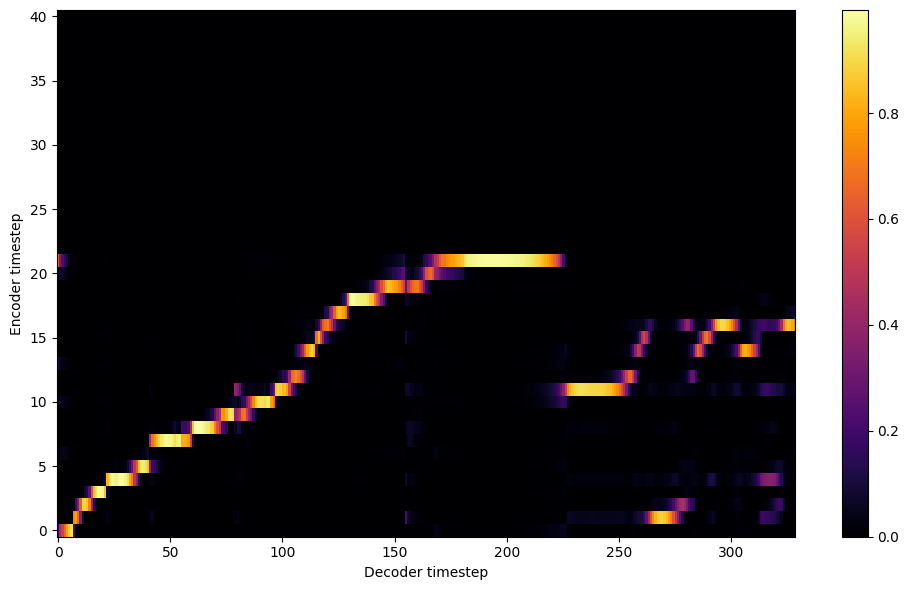


Starting Epoch: 54 Iteration: 648


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 54 Validation loss 660:  0.179736  Time: 0.5m LR: 0.000300


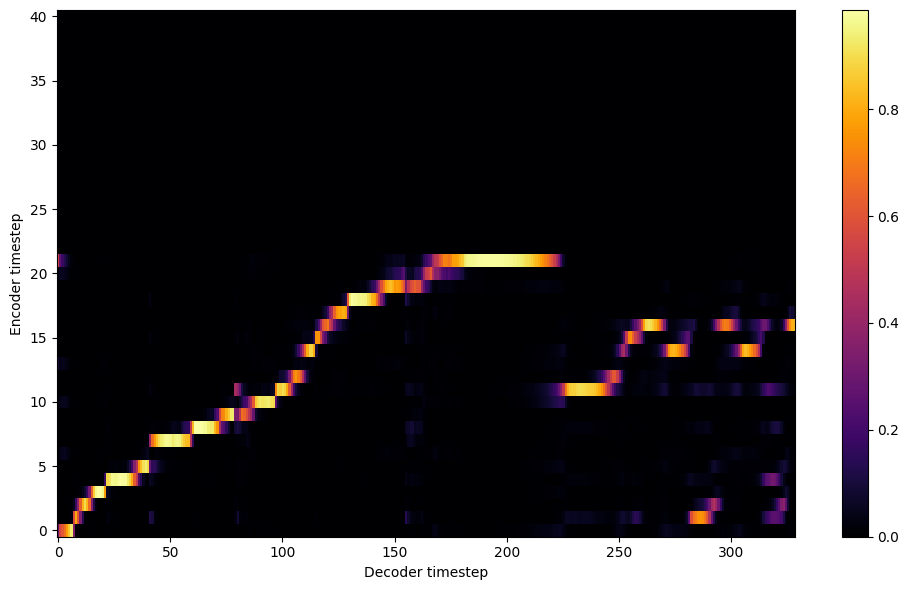


Starting Epoch: 55 Iteration: 660


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 55 Validation loss 672:  0.180841  Time: 0.4m LR: 0.000300


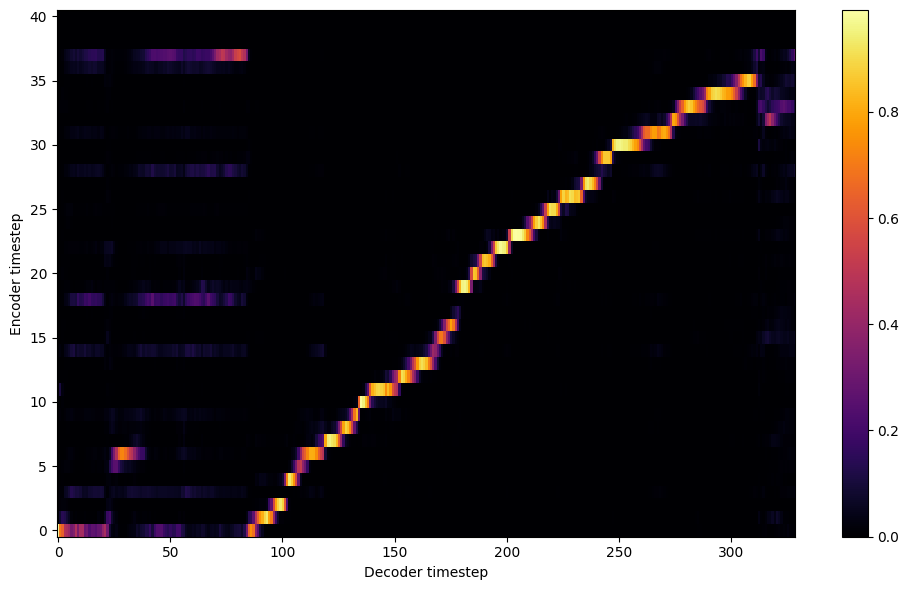


Starting Epoch: 56 Iteration: 672


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 56 Validation loss 684:  0.183369  Time: 0.4m LR: 0.000300


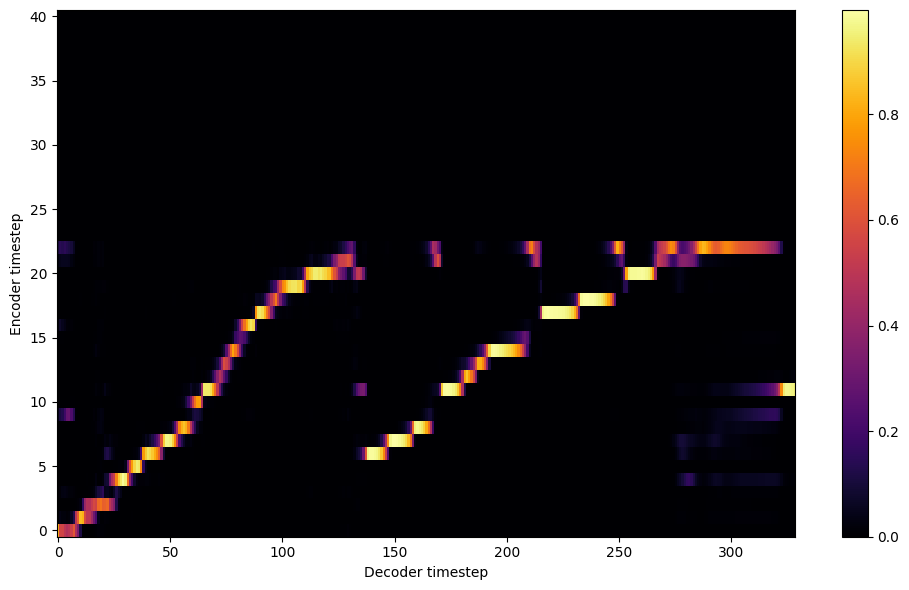


Starting Epoch: 57 Iteration: 684


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 57 Validation loss 696:  0.181015  Time: 0.4m LR: 0.000300


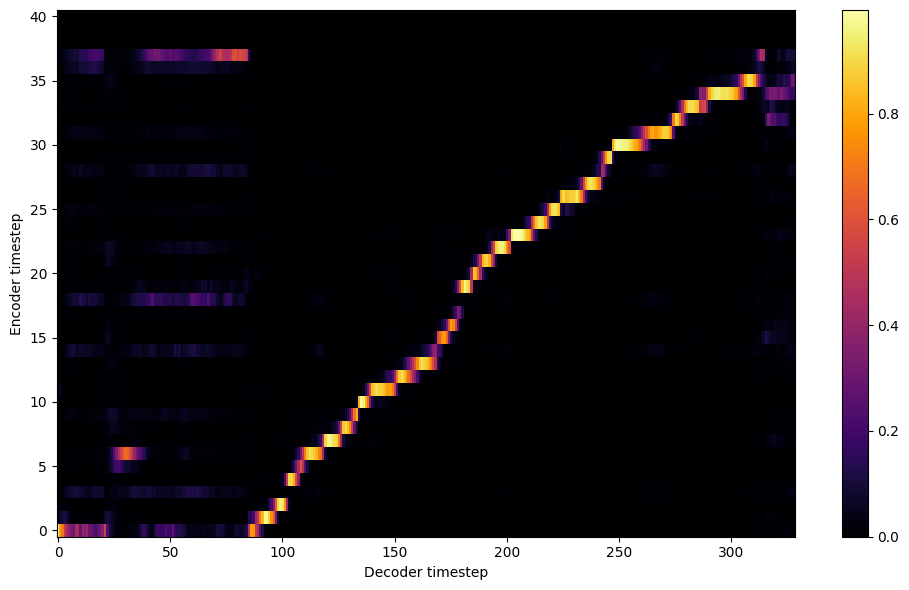


Starting Epoch: 58 Iteration: 696


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 58 Validation loss 708:  0.177519  Time: 0.4m LR: 0.000300


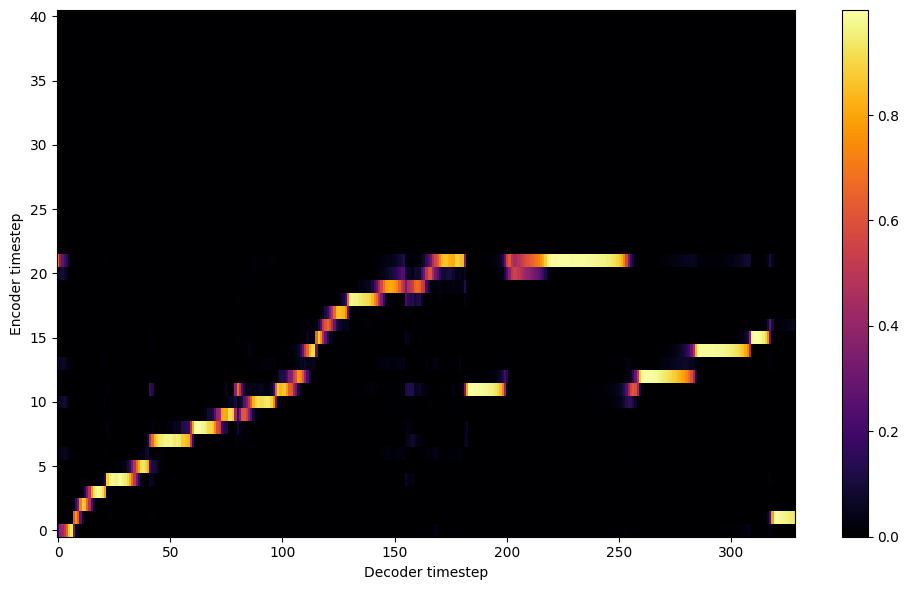


Starting Epoch: 59 Iteration: 708


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 59 Validation loss 720:  0.176261  Time: 0.5m LR: 0.000300


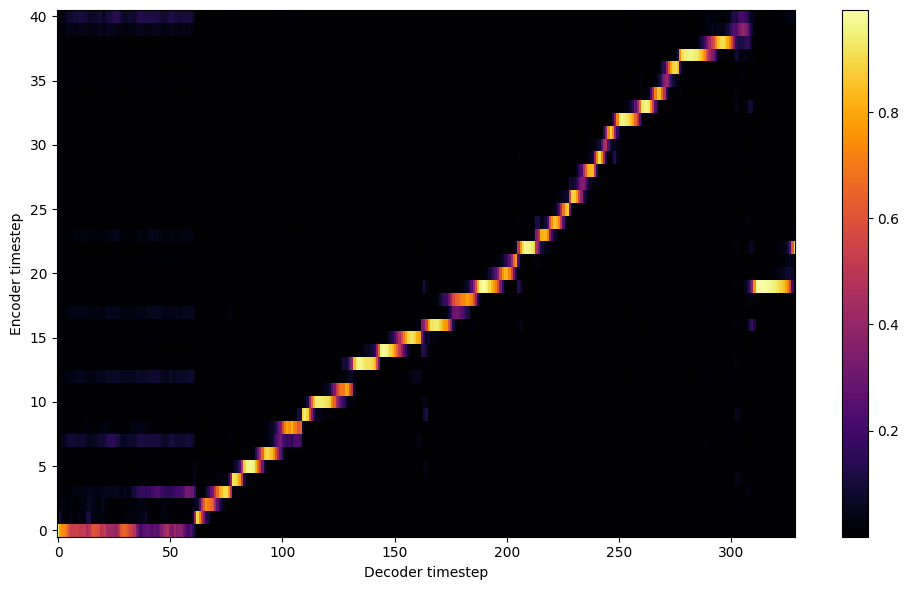

Saving model and optimizer state at iteration 720 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 60 Iteration: 720


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 60 Validation loss 732:  0.175457  Time: 0.5m LR: 0.000300


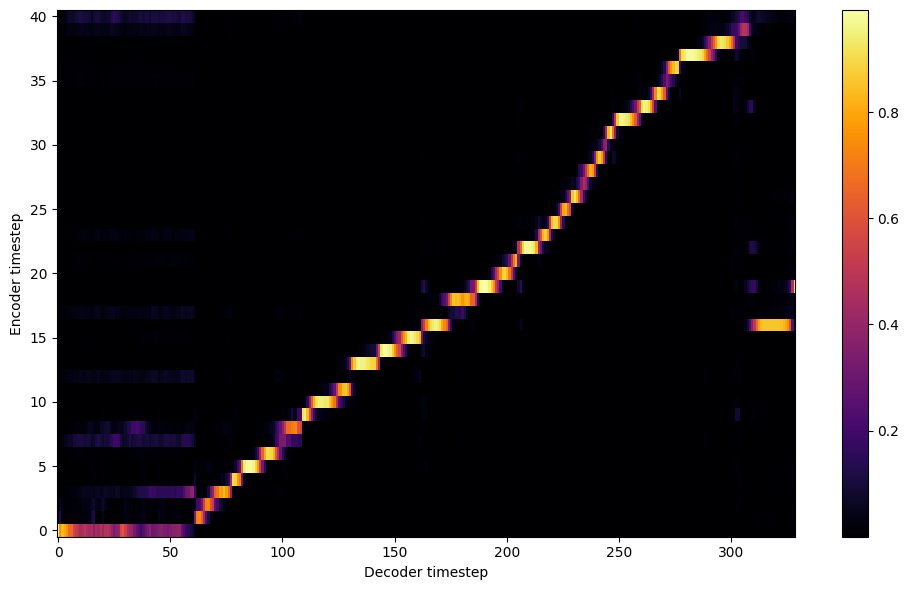


Starting Epoch: 61 Iteration: 732


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 61 Validation loss 744:  0.173767  Time: 0.4m LR: 0.000300


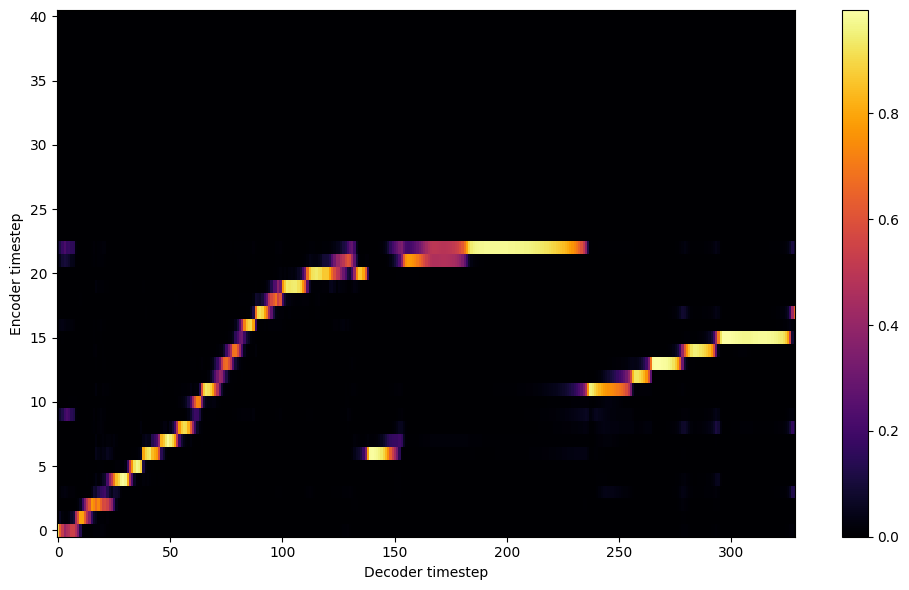


Starting Epoch: 62 Iteration: 744


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 62 Validation loss 756:  0.172758  Time: 0.5m LR: 0.000300


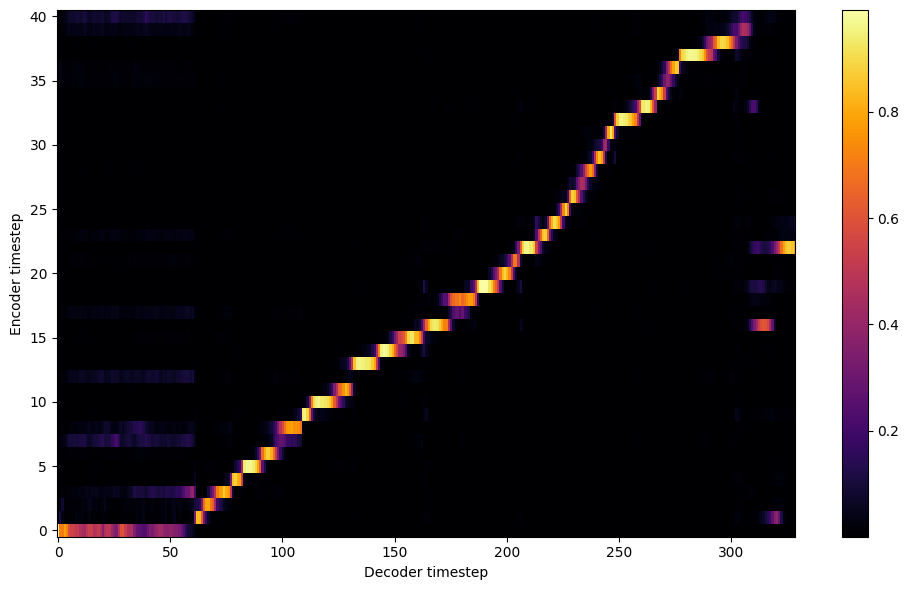


Starting Epoch: 63 Iteration: 756


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 63 Validation loss 768:  0.172083  Time: 0.4m LR: 0.000300


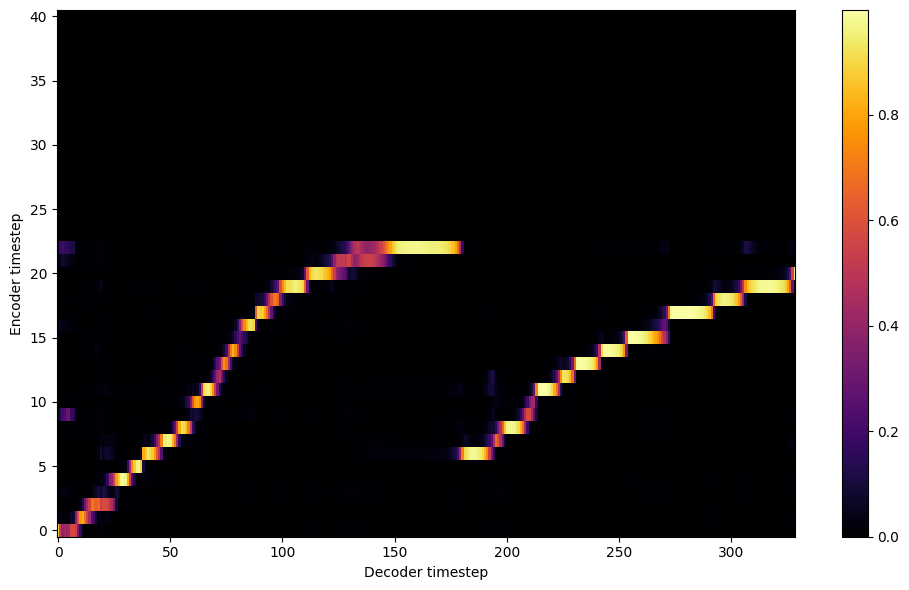


Starting Epoch: 64 Iteration: 768


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 64 Validation loss 780:  0.177706  Time: 0.5m LR: 0.000300


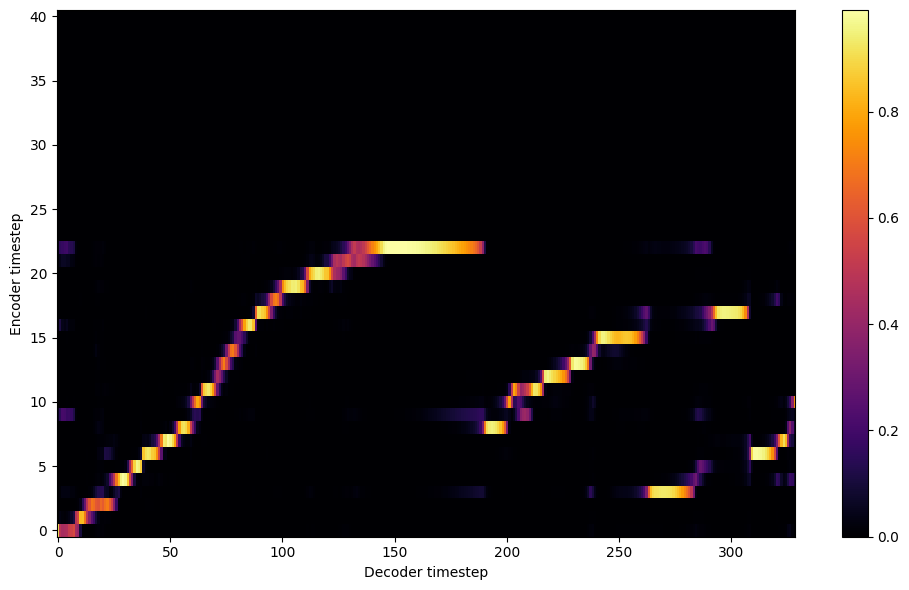


Starting Epoch: 65 Iteration: 780


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 65 Validation loss 792:  0.169106  Time: 0.4m LR: 0.000300


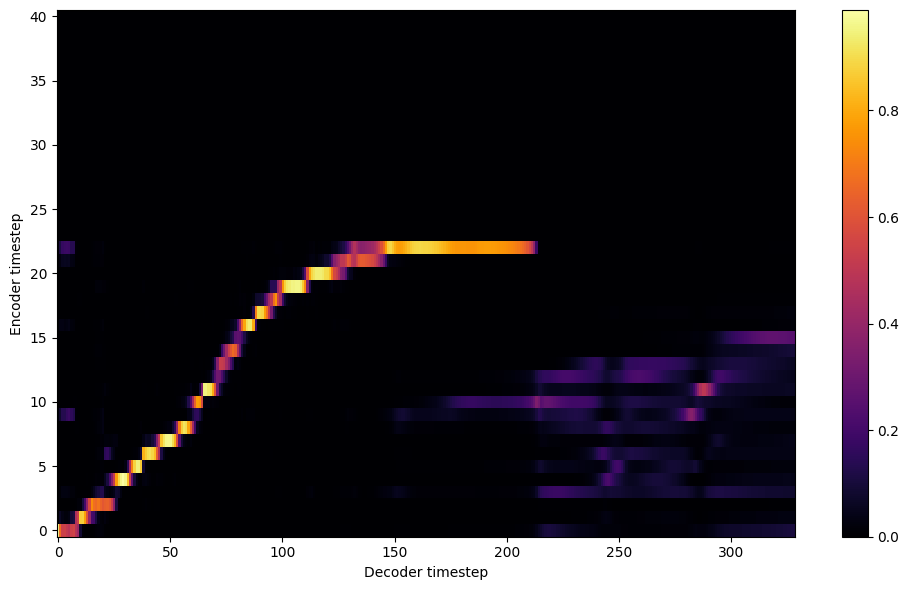


Starting Epoch: 66 Iteration: 792


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 66 Validation loss 804:  0.167860  Time: 0.5m LR: 0.000300


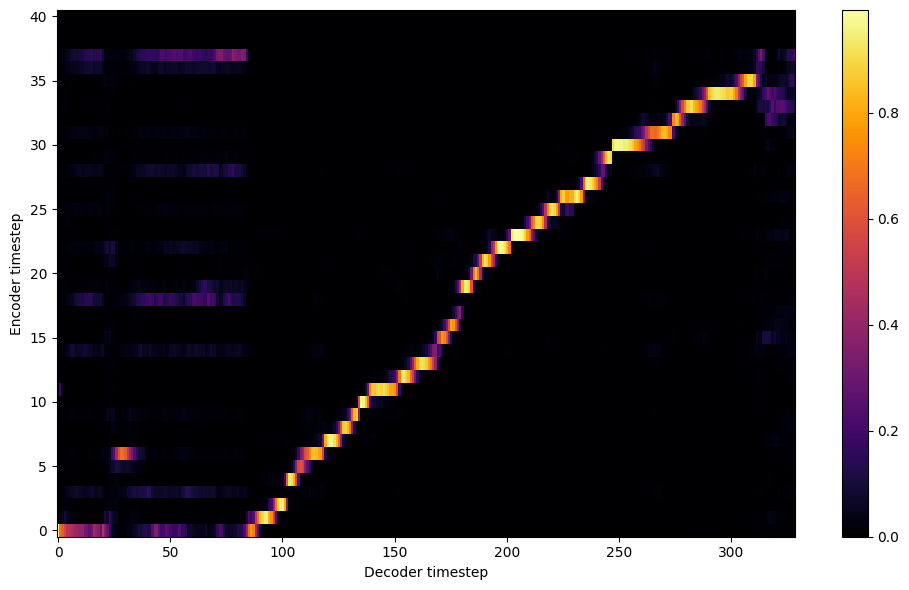


Starting Epoch: 67 Iteration: 804


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 67 Validation loss 816:  0.166755  Time: 0.4m LR: 0.000300


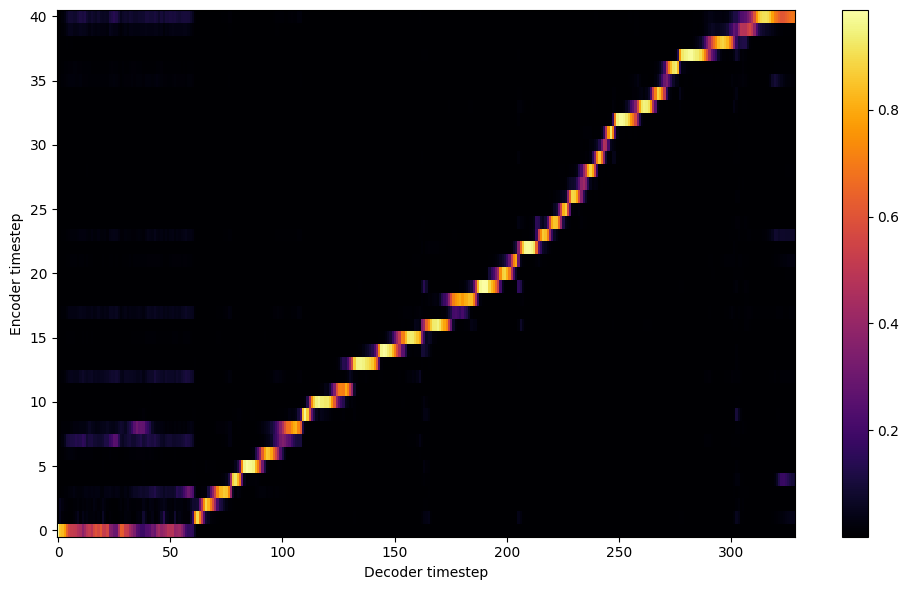


Starting Epoch: 68 Iteration: 816


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 68 Validation loss 828:  0.165599  Time: 0.4m LR: 0.000300


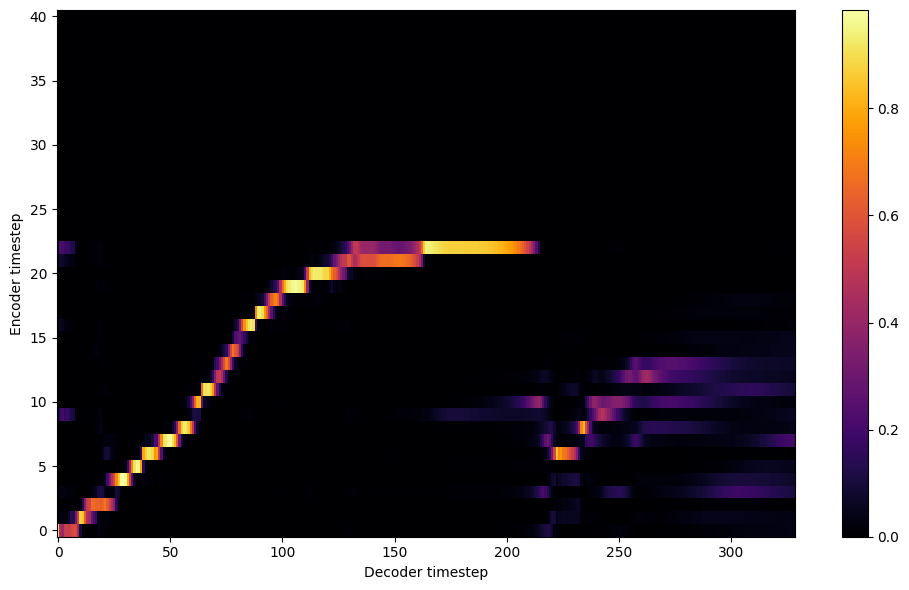


Starting Epoch: 69 Iteration: 828


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 69 Validation loss 840:  0.163906  Time: 0.4m LR: 0.000300


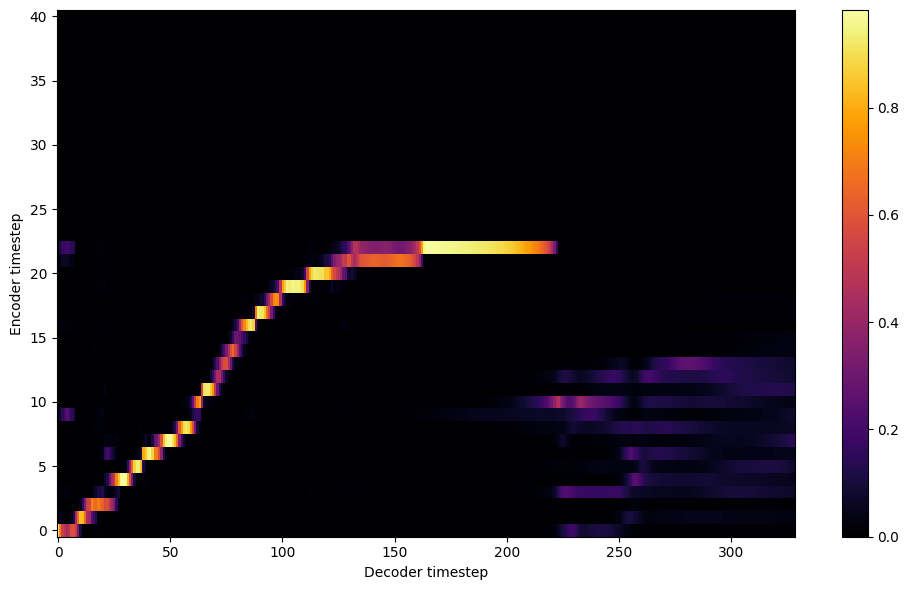

Saving model and optimizer state at iteration 840 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 70 Iteration: 840


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 70 Validation loss 852:  0.161882  Time: 0.5m LR: 0.000300


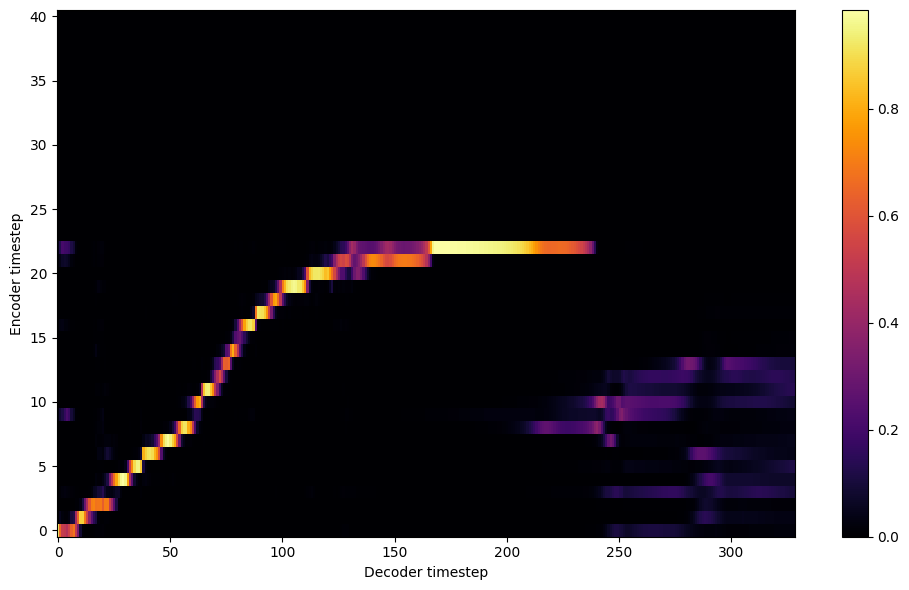


Starting Epoch: 71 Iteration: 852


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 71 Validation loss 864:  0.160590  Time: 0.4m LR: 0.000300


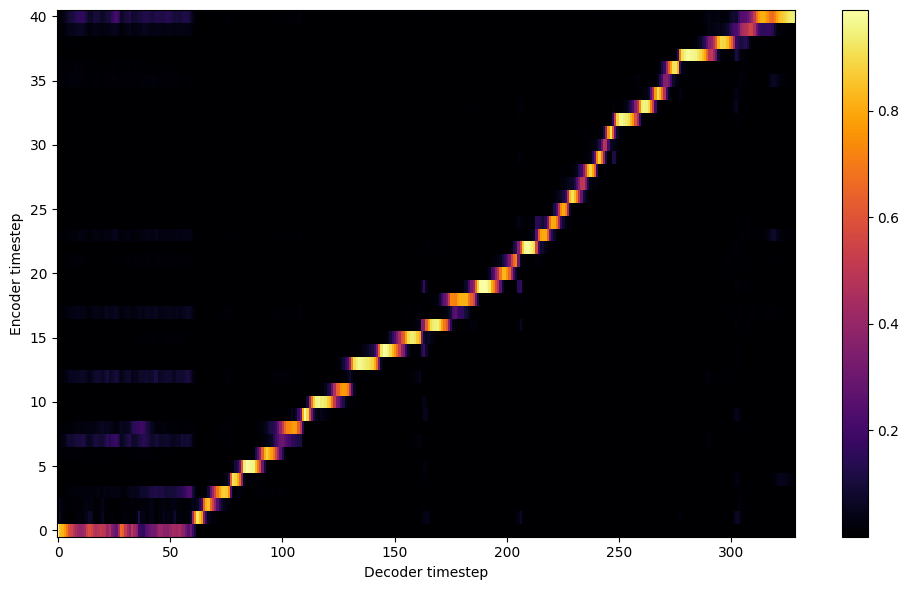


Starting Epoch: 72 Iteration: 864


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 72 Validation loss 876:  0.159685  Time: 0.4m LR: 0.000300


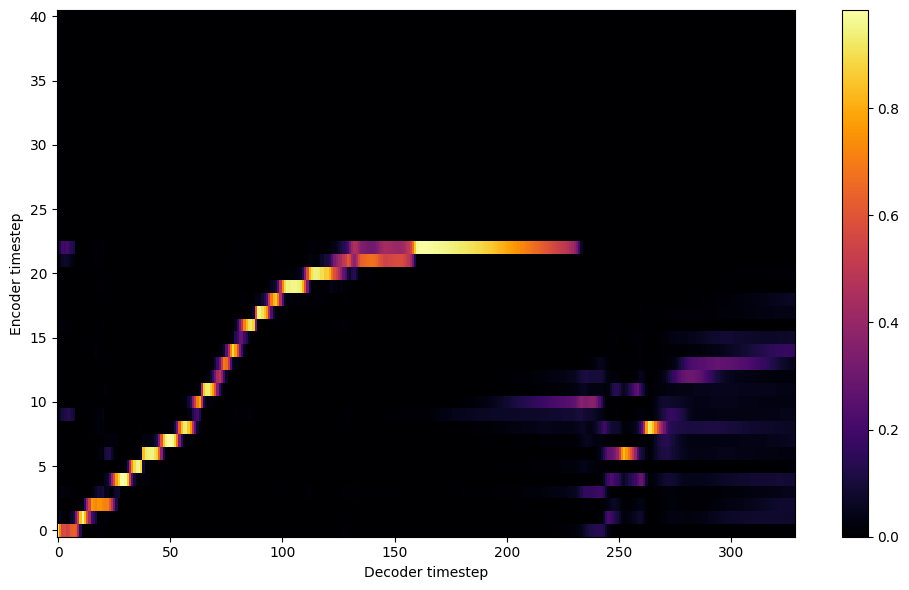


Starting Epoch: 73 Iteration: 876


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 73 Validation loss 888:  0.159064  Time: 0.5m LR: 0.000300


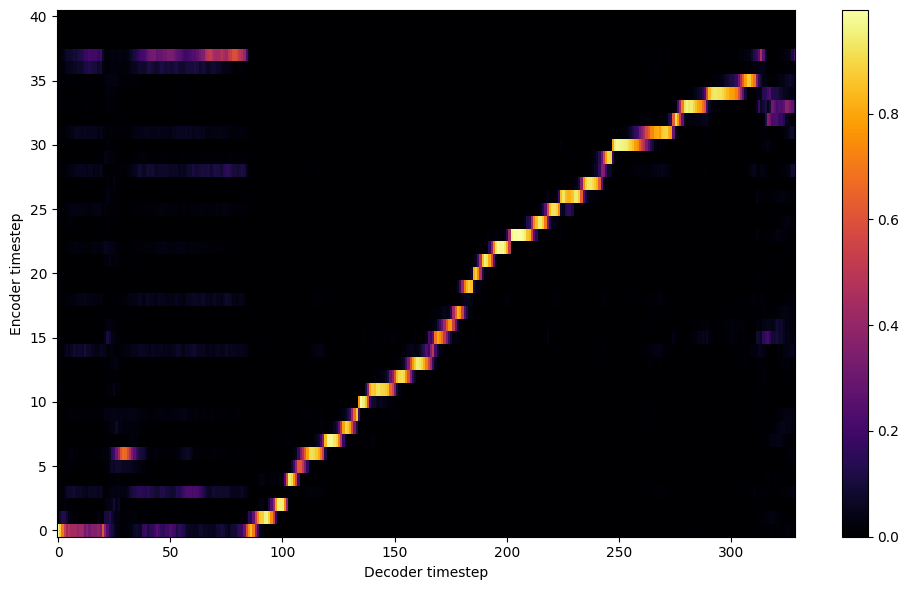


Starting Epoch: 74 Iteration: 888


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 74 Validation loss 900:  0.158665  Time: 0.5m LR: 0.000300


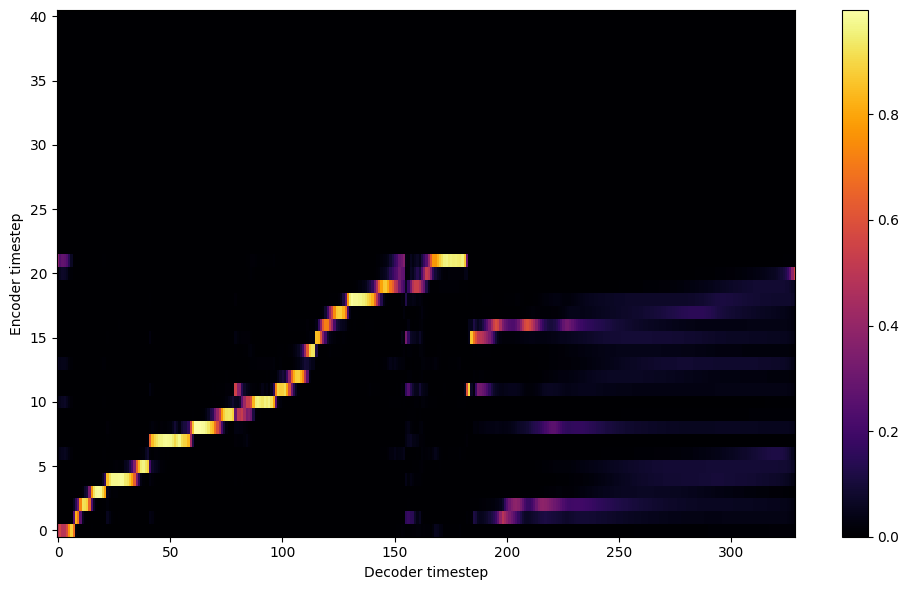


Starting Epoch: 75 Iteration: 900


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 75 Validation loss 912:  0.156494  Time: 0.5m LR: 0.000300


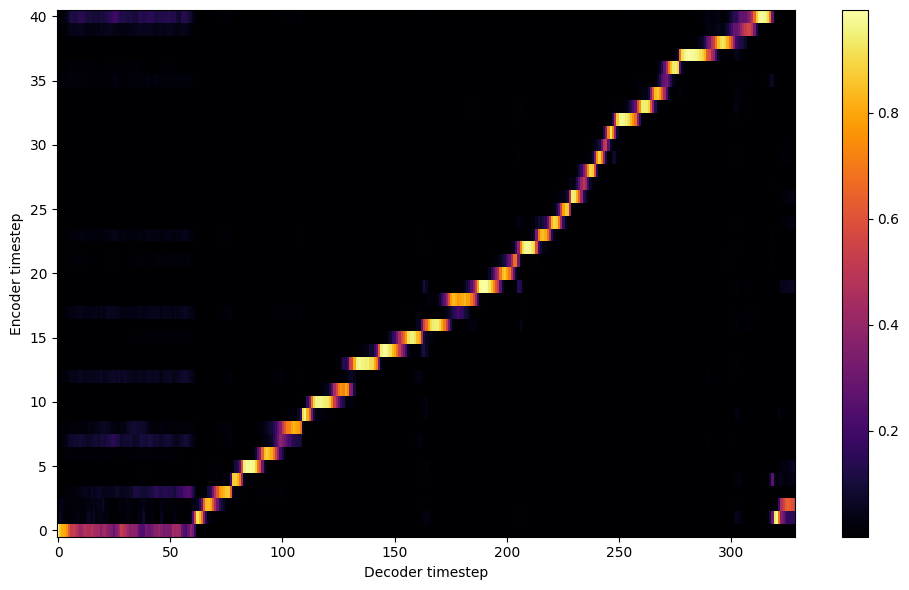


Starting Epoch: 76 Iteration: 912


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 76 Validation loss 924:  0.155097  Time: 0.5m LR: 0.000300


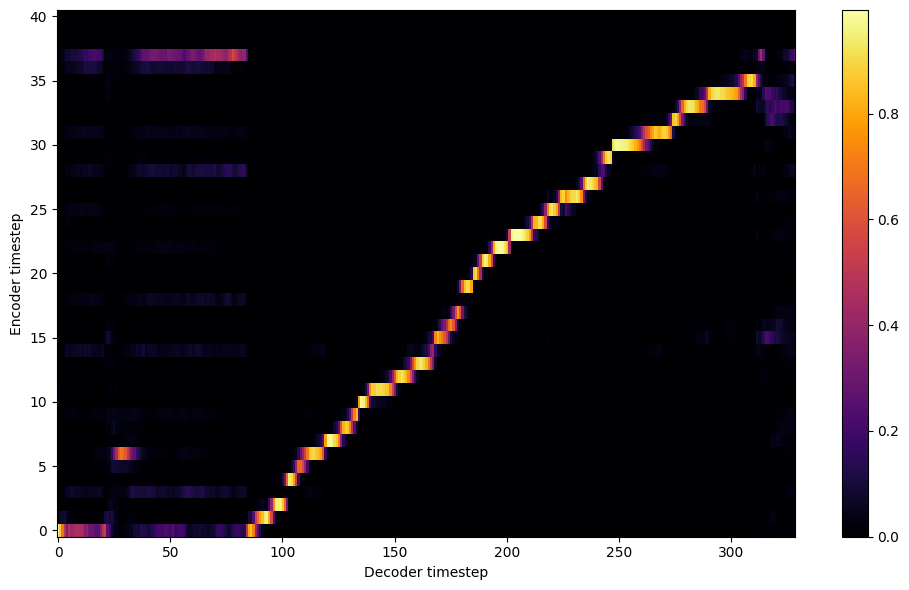


Starting Epoch: 77 Iteration: 924


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 77 Validation loss 936:  0.155445  Time: 0.4m LR: 0.000300


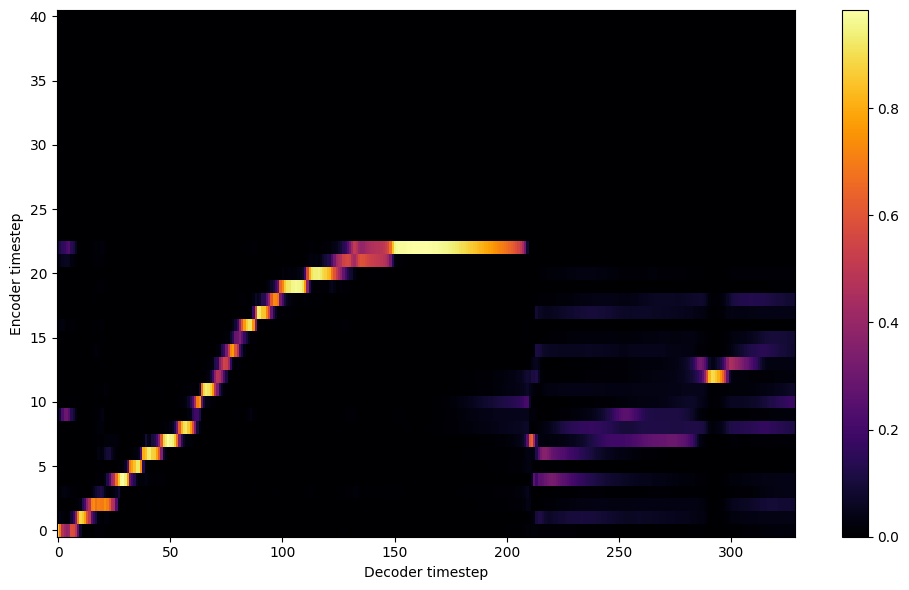


Starting Epoch: 78 Iteration: 936


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 78 Validation loss 948:  0.155394  Time: 0.5m LR: 0.000300


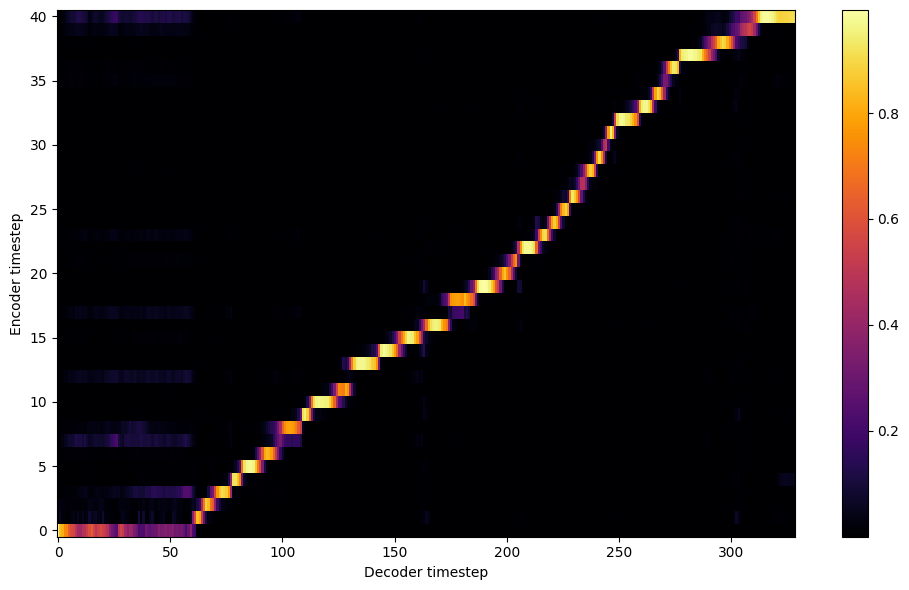


Starting Epoch: 79 Iteration: 948


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 79 Validation loss 960:  0.153941  Time: 0.4m LR: 0.000300


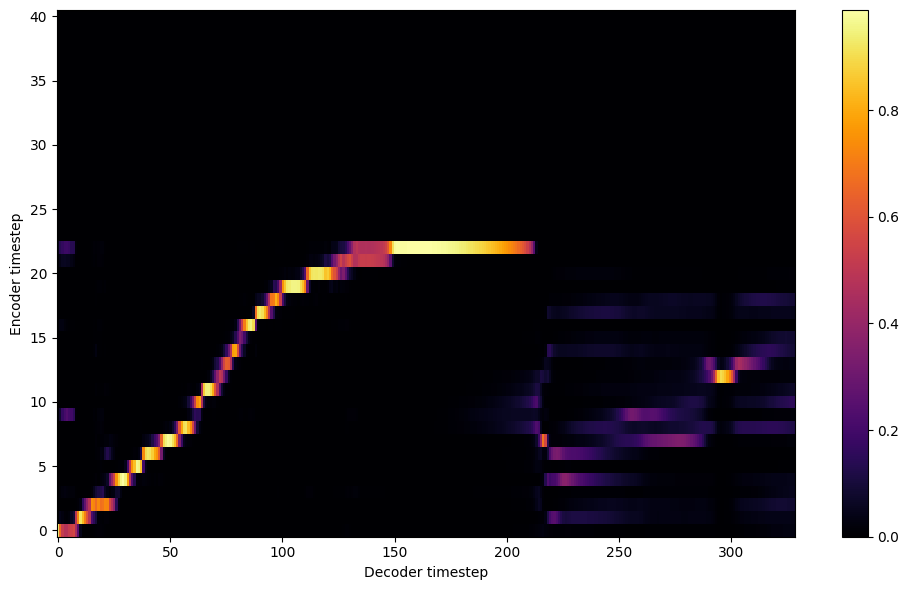

Saving model and optimizer state at iteration 960 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 80 Iteration: 960


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 80 Validation loss 972:  0.152409  Time: 0.5m LR: 0.000300


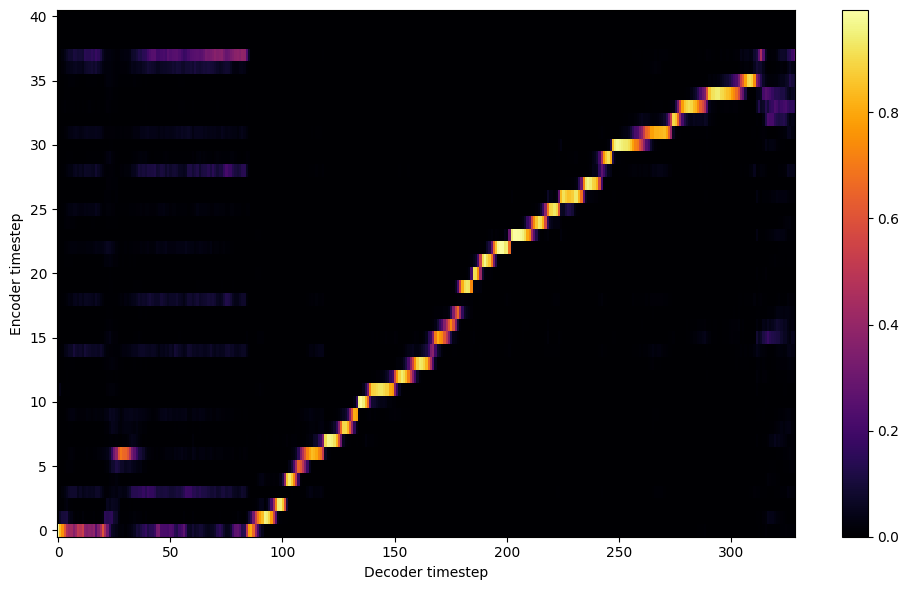


Starting Epoch: 81 Iteration: 972


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 81 Validation loss 984:  0.150823  Time: 0.5m LR: 0.000300


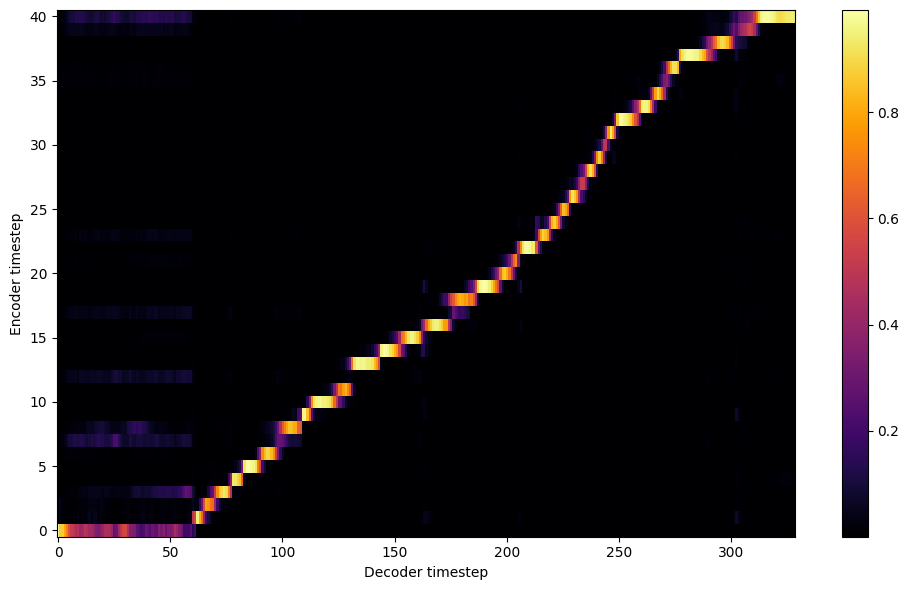


Starting Epoch: 82 Iteration: 984


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 82 Validation loss 996:  0.149589  Time: 0.5m LR: 0.000300


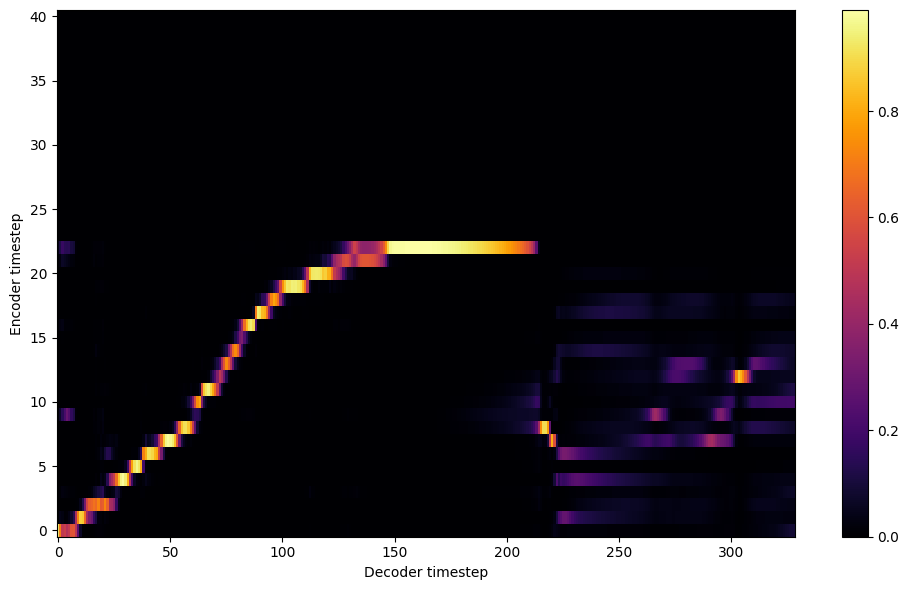


Starting Epoch: 83 Iteration: 996


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 83 Validation loss 1008:  0.148952  Time: 0.4m LR: 0.000300


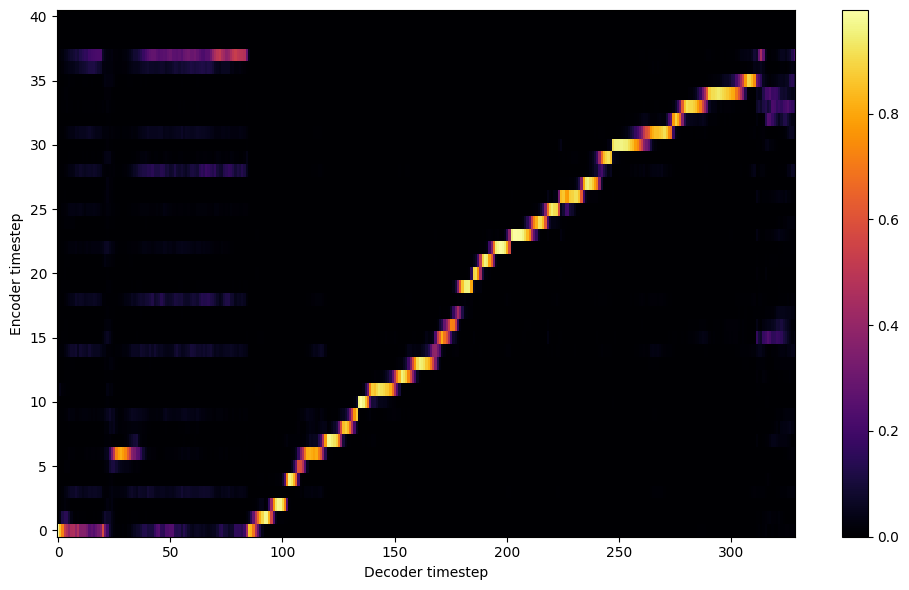


Starting Epoch: 84 Iteration: 1008


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 84 Validation loss 1020:  0.147274  Time: 0.5m LR: 0.000300


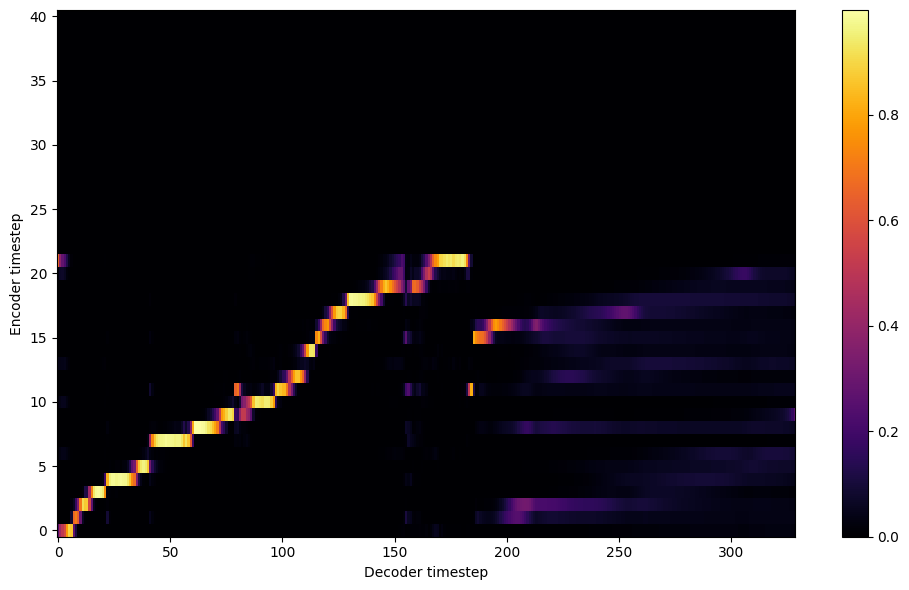


Starting Epoch: 85 Iteration: 1020


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 85 Validation loss 1032:  0.147202  Time: 0.4m LR: 0.000300


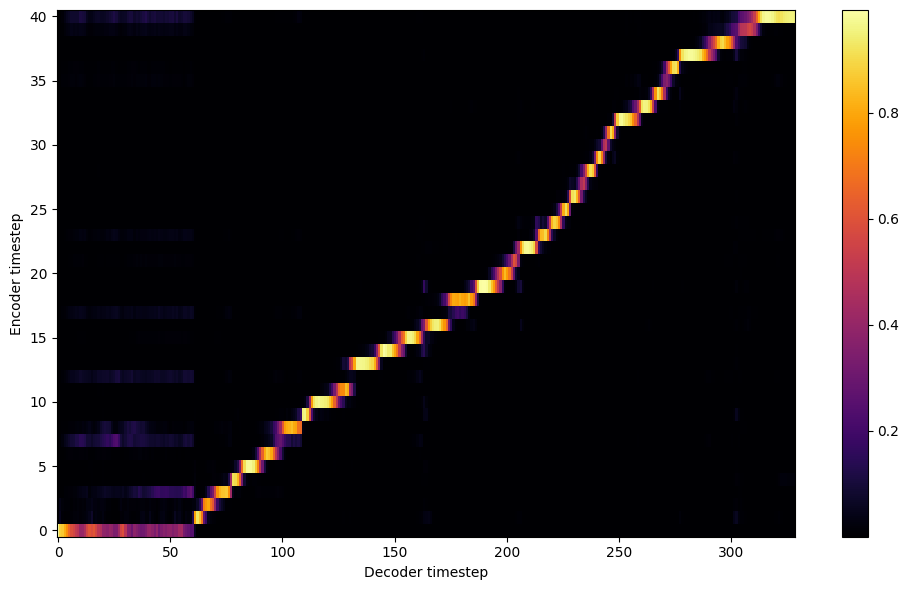


Starting Epoch: 86 Iteration: 1032


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 86 Validation loss 1044:  0.149440  Time: 0.5m LR: 0.000300


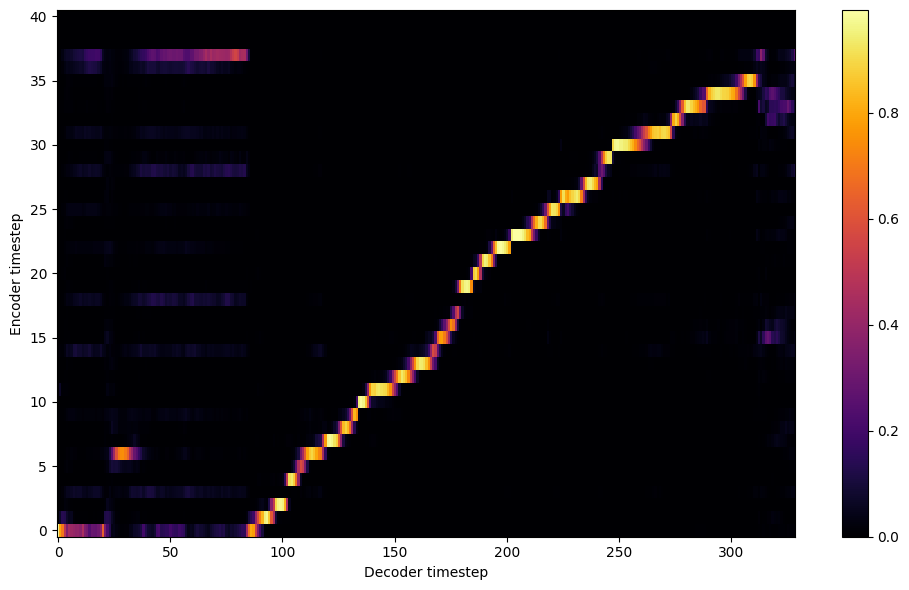


Starting Epoch: 87 Iteration: 1044


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 87 Validation loss 1056:  0.148404  Time: 0.4m LR: 0.000300


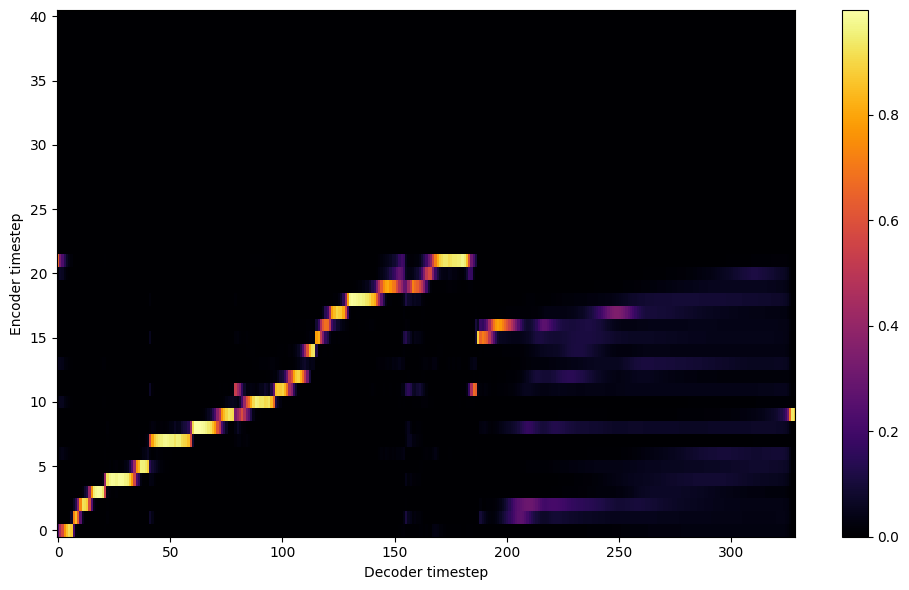


Starting Epoch: 88 Iteration: 1056


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 88 Validation loss 1068:  0.148870  Time: 0.5m LR: 0.000300


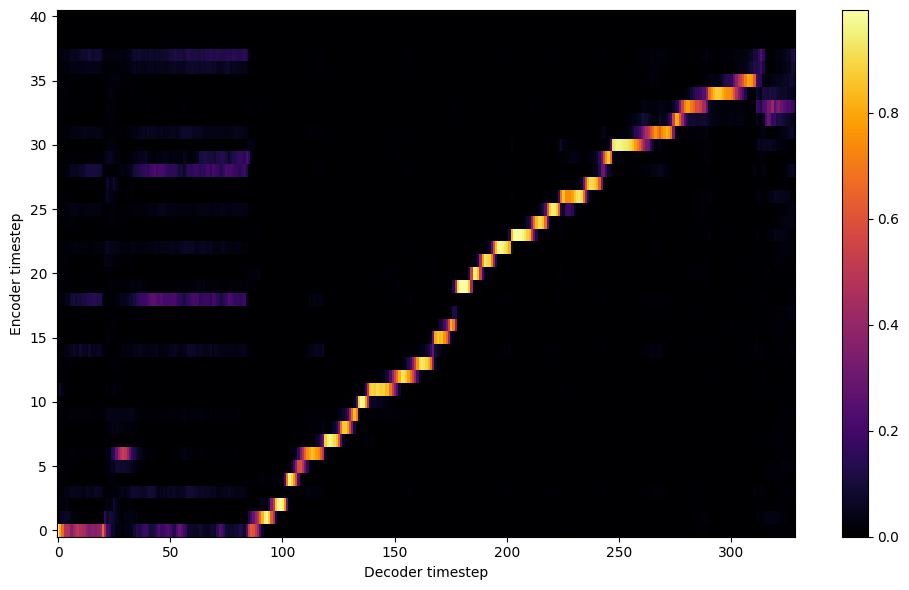


Starting Epoch: 89 Iteration: 1068


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 89 Validation loss 1080:  0.149112  Time: 0.5m LR: 0.000300


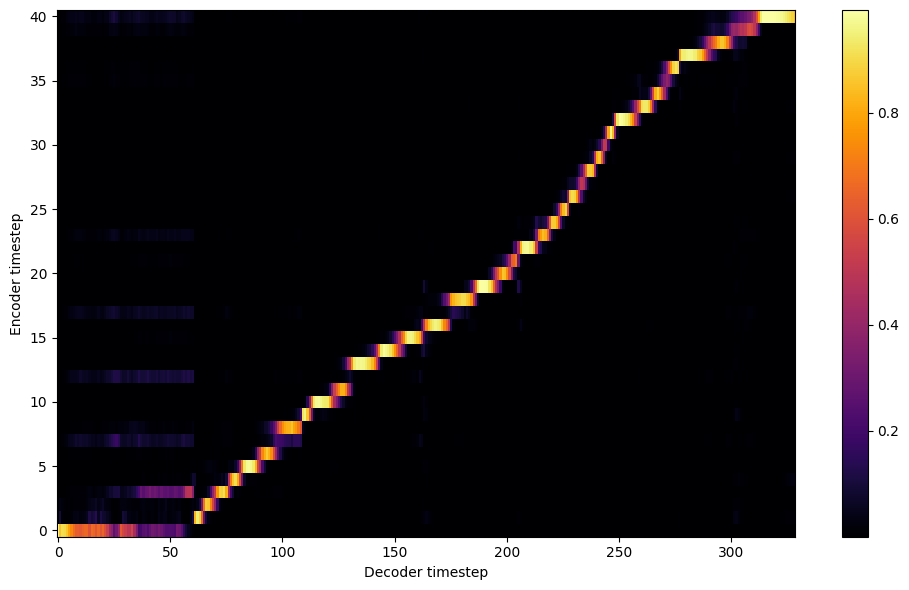

Saving model and optimizer state at iteration 1080 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 90 Iteration: 1080


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 90 Validation loss 1092:  0.146677  Time: 0.5m LR: 0.000300


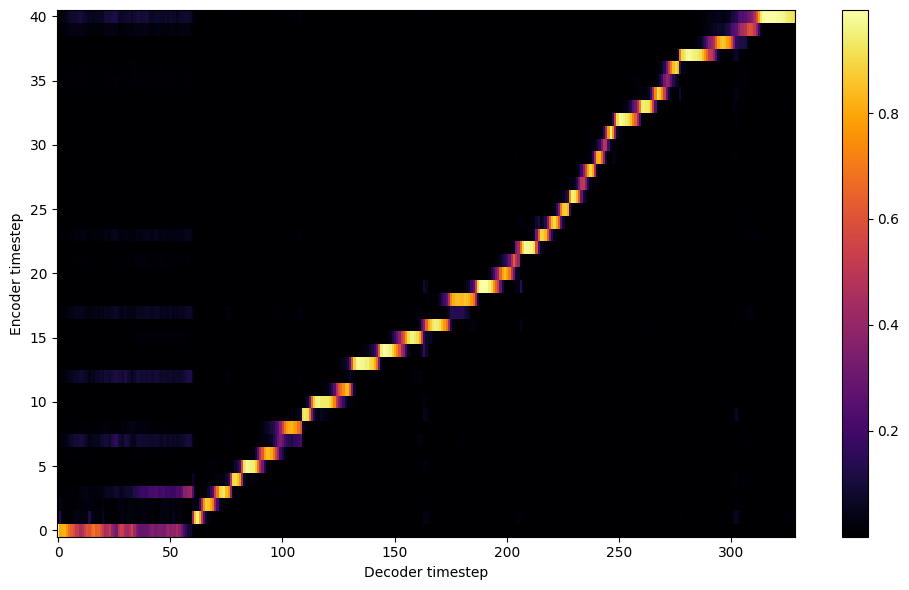


Starting Epoch: 91 Iteration: 1092


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 91 Validation loss 1104:  0.145116  Time: 0.4m LR: 0.000300


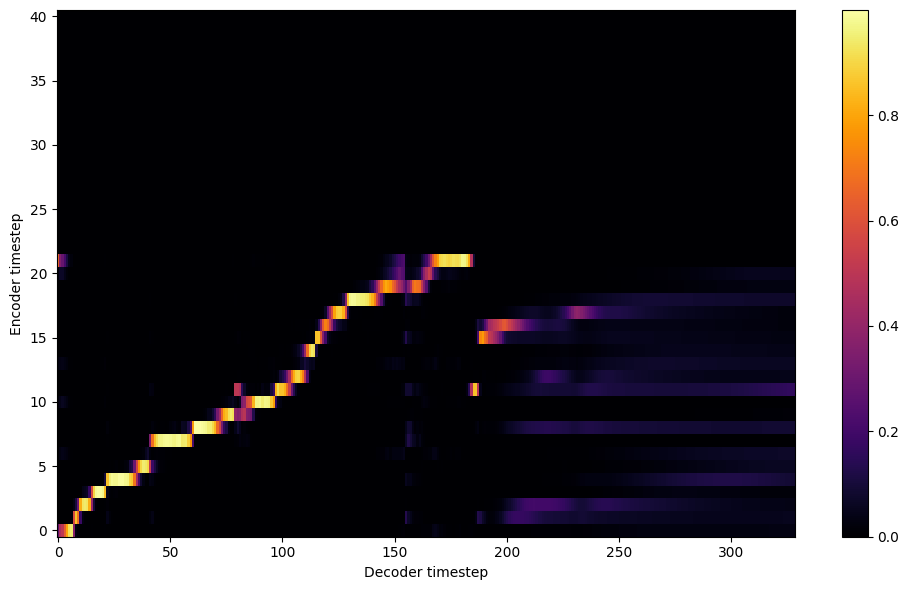


Starting Epoch: 92 Iteration: 1104


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 92 Validation loss 1116:  0.143408  Time: 0.4m LR: 0.000300


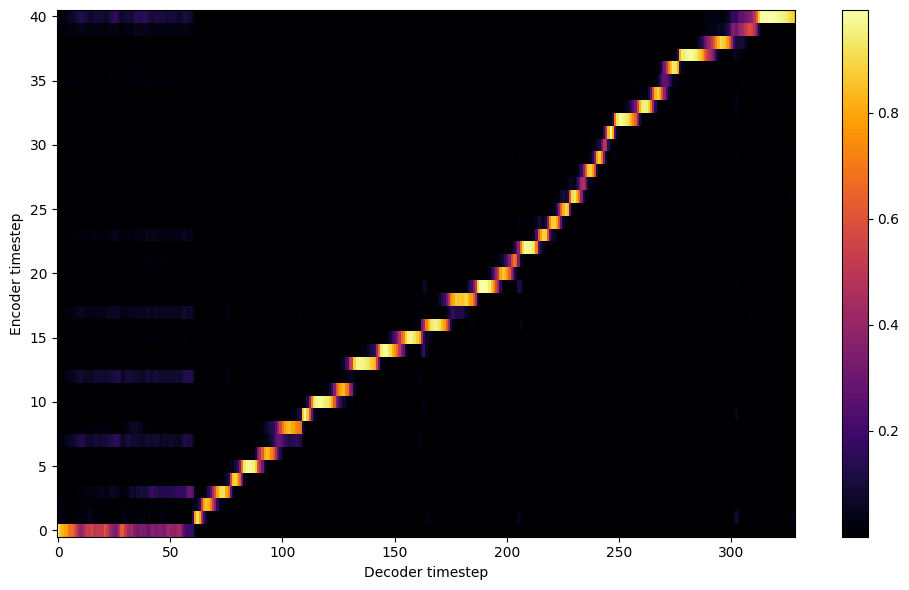


Starting Epoch: 93 Iteration: 1116


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 93 Validation loss 1128:  0.145966  Time: 0.5m LR: 0.000300


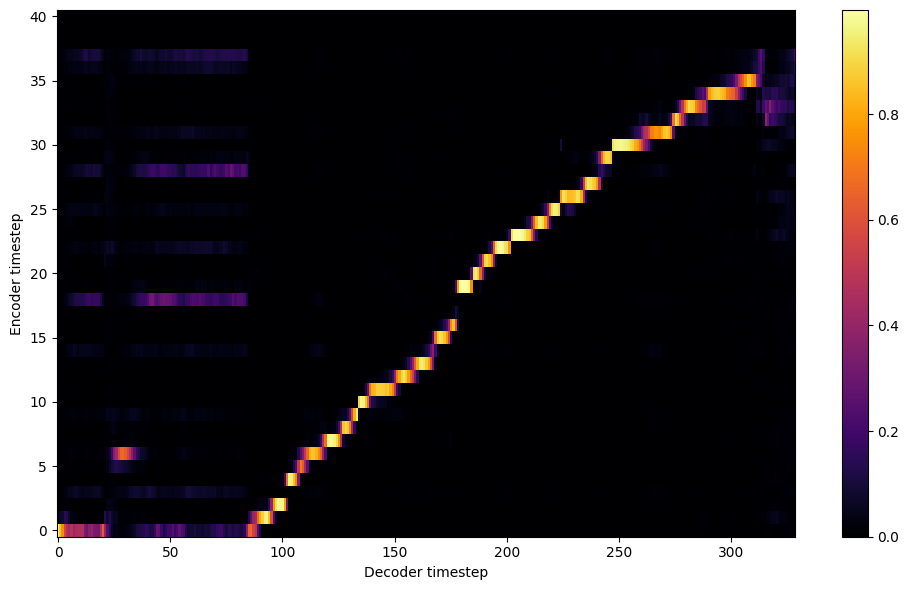


Starting Epoch: 94 Iteration: 1128


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 94 Validation loss 1140:  0.142928  Time: 0.4m LR: 0.000300


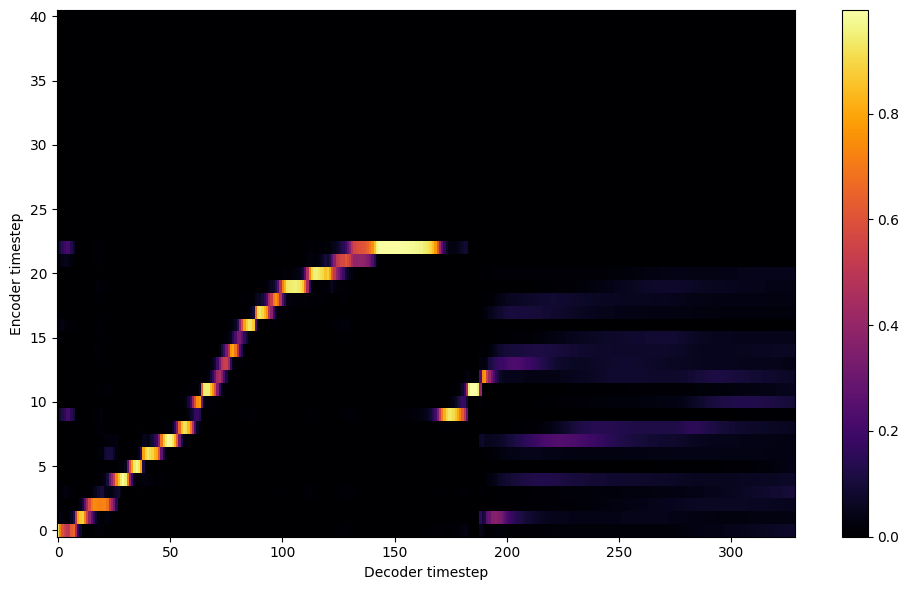


Starting Epoch: 95 Iteration: 1140


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 95 Validation loss 1152:  0.142551  Time: 0.4m LR: 0.000300


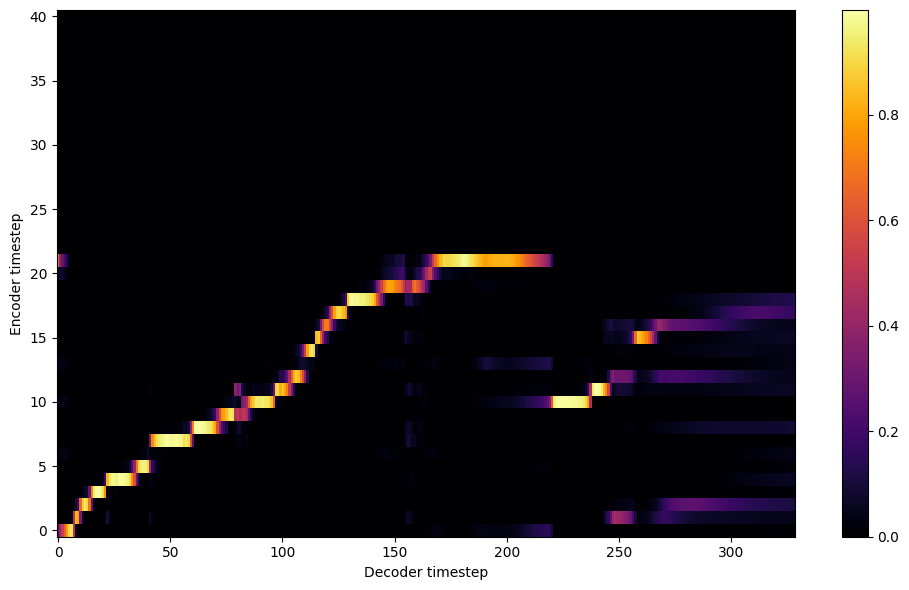


Starting Epoch: 96 Iteration: 1152


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 96 Validation loss 1164:  0.141705  Time: 0.5m LR: 0.000300


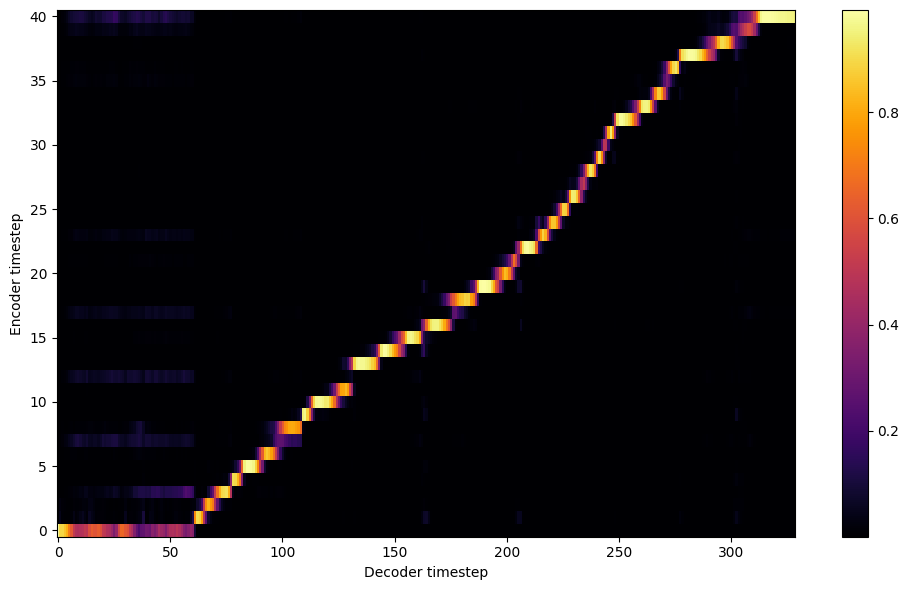


Starting Epoch: 97 Iteration: 1164


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 97 Validation loss 1176:  0.139589  Time: 0.5m LR: 0.000300


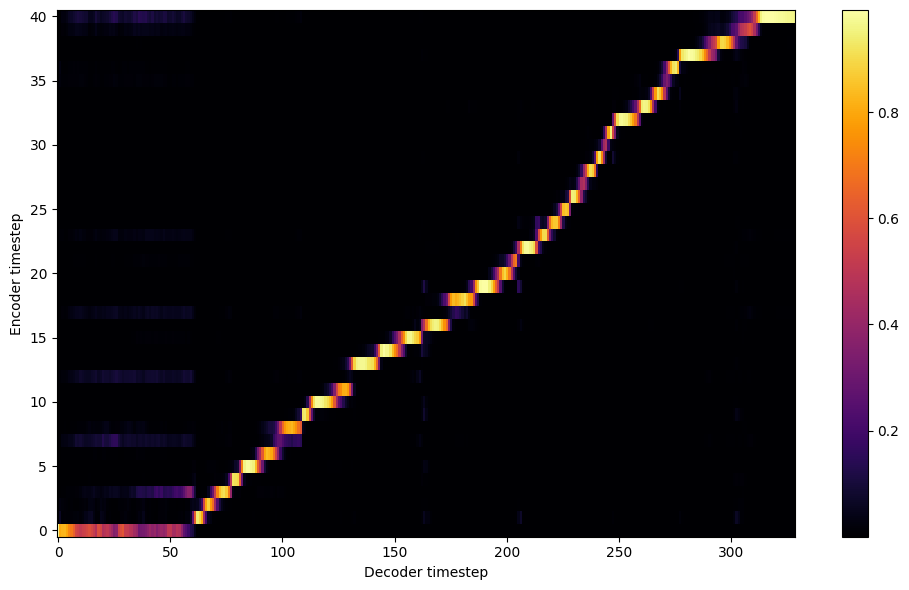


Starting Epoch: 98 Iteration: 1176


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 98 Validation loss 1188:  0.139459  Time: 0.5m LR: 0.000300


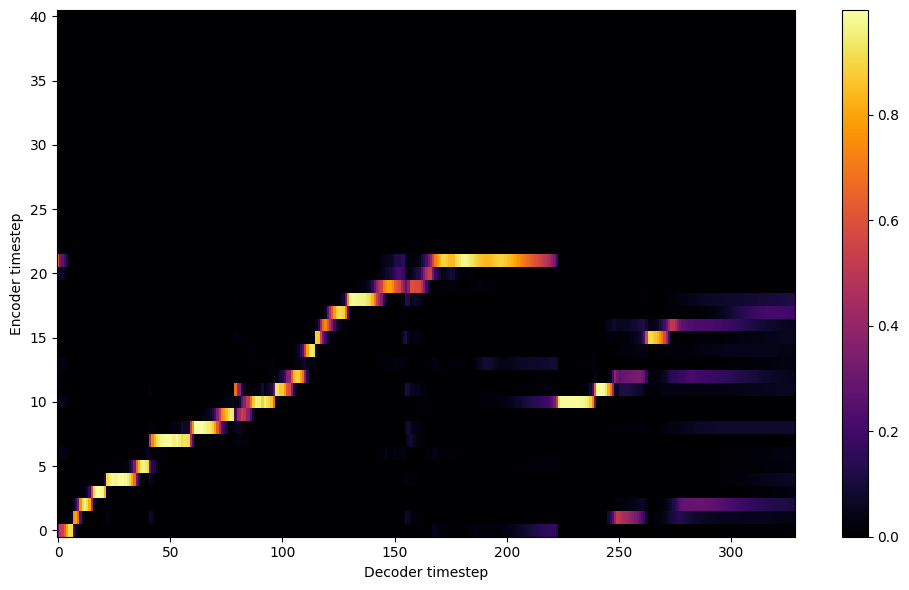


Starting Epoch: 99 Iteration: 1188


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 99 Validation loss 1200:  0.141212  Time: 0.5m LR: 0.000300


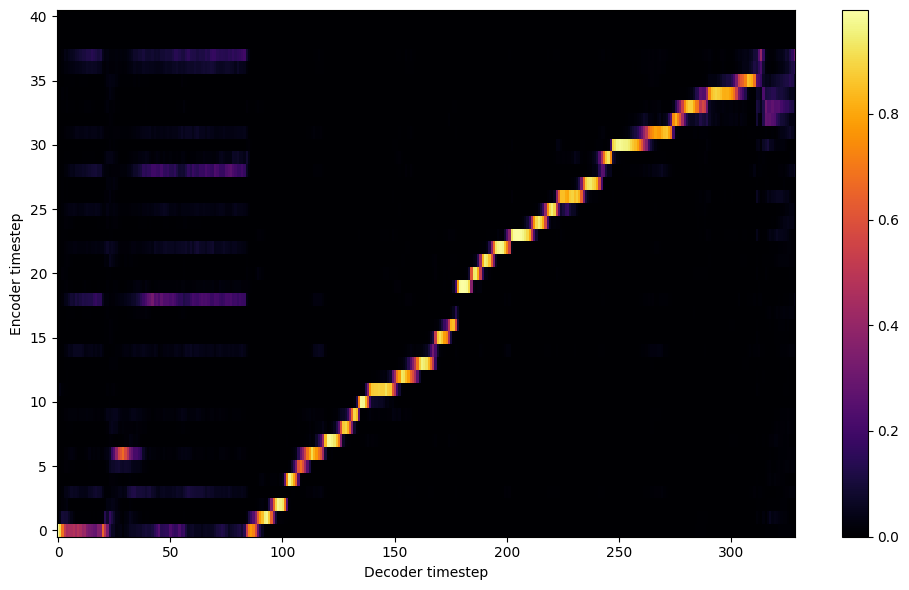

Saving model and optimizer state at iteration 1200 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 100 Iteration: 1200


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 100 Validation loss 1212:  0.139875  Time: 0.5m LR: 0.000300


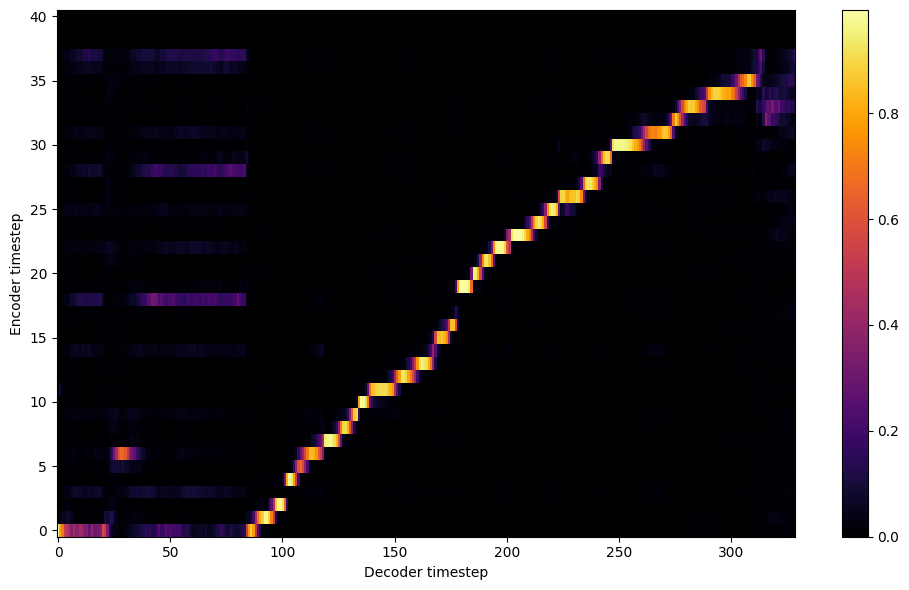


Starting Epoch: 101 Iteration: 1212


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 101 Validation loss 1224:  0.137148  Time: 0.4m LR: 0.000300


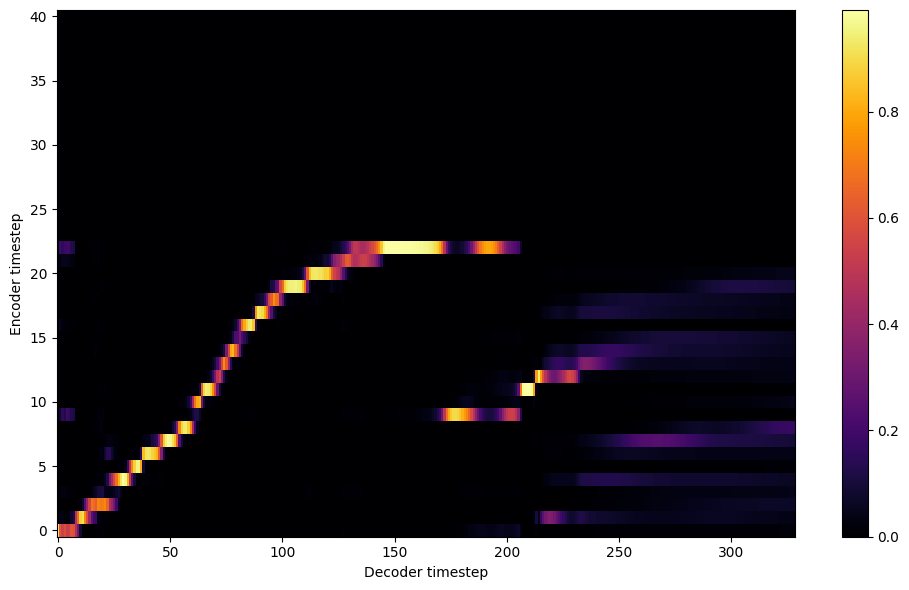


Starting Epoch: 102 Iteration: 1224


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 102 Validation loss 1236:  0.137769  Time: 0.5m LR: 0.000300


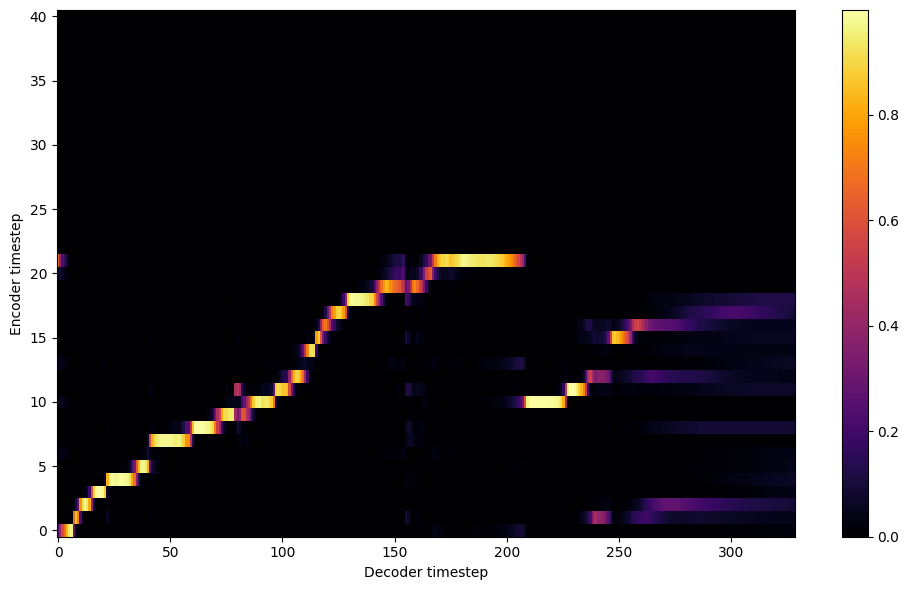


Starting Epoch: 103 Iteration: 1236


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 103 Validation loss 1248:  0.137350  Time: 0.5m LR: 0.000300


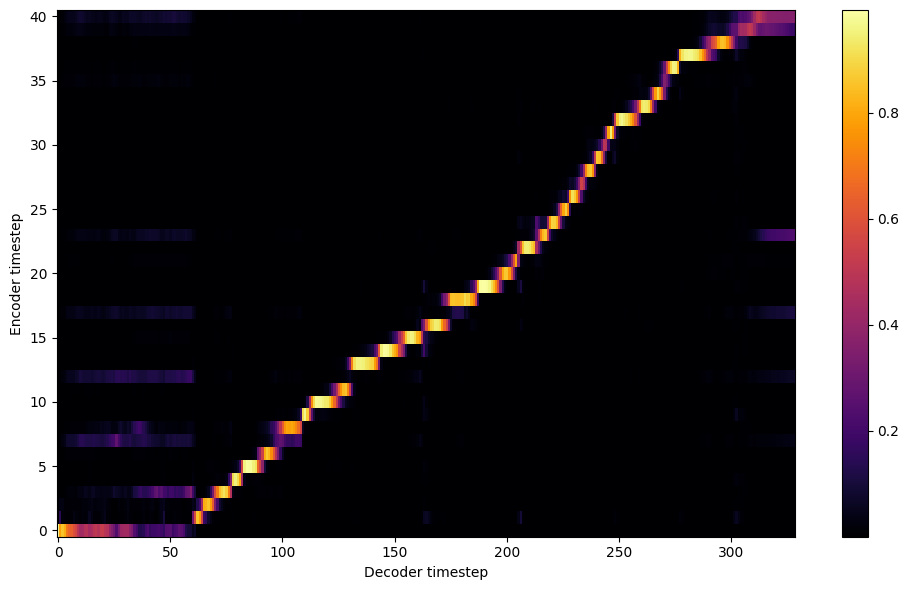


Starting Epoch: 104 Iteration: 1248


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 104 Validation loss 1260:  0.136272  Time: 0.4m LR: 0.000300


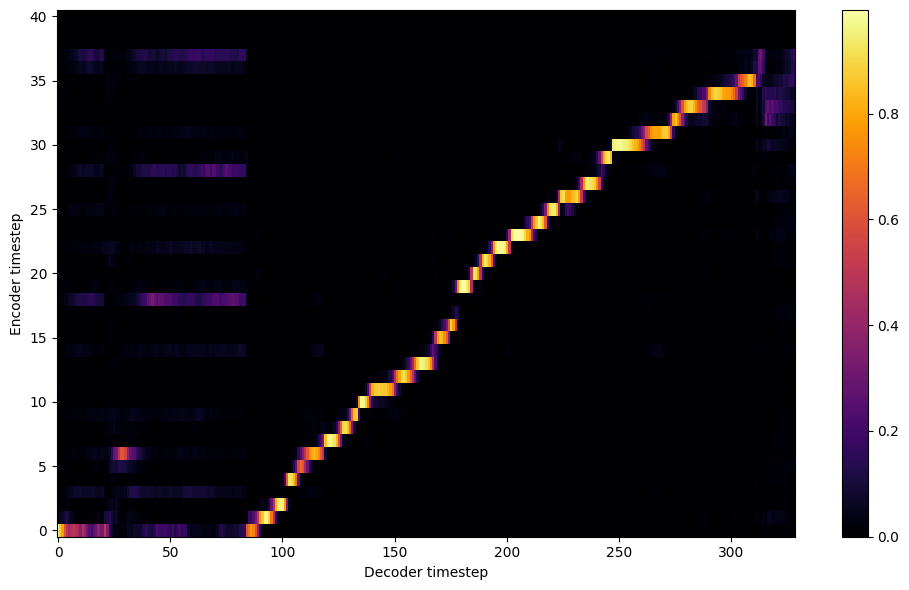


Starting Epoch: 105 Iteration: 1260


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 105 Validation loss 1272:  0.135512  Time: 0.5m LR: 0.000300


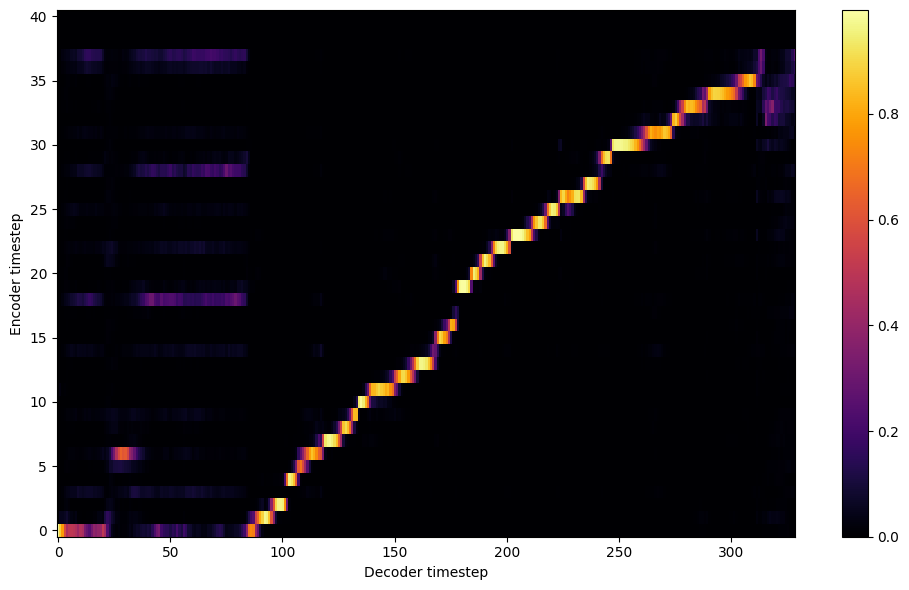


Starting Epoch: 106 Iteration: 1272


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 106 Validation loss 1284:  0.135005  Time: 0.5m LR: 0.000300


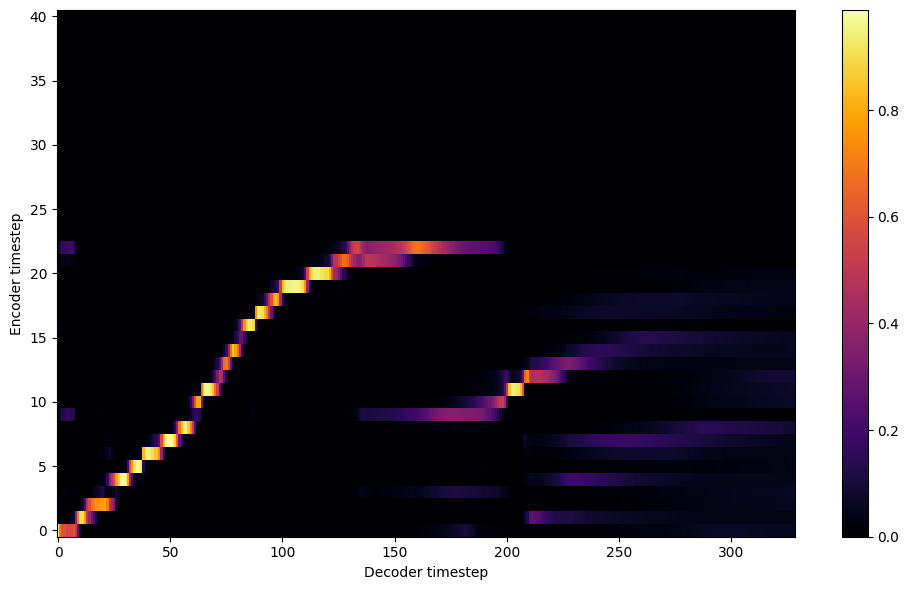


Starting Epoch: 107 Iteration: 1284


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 107 Validation loss 1296:  0.134049  Time: 0.4m LR: 0.000300


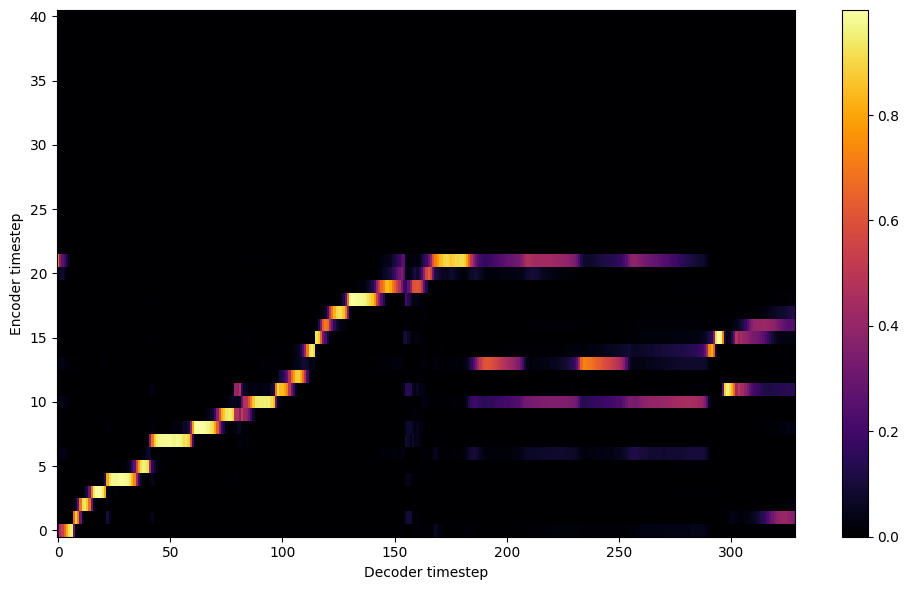


Starting Epoch: 108 Iteration: 1296


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 108 Validation loss 1308:  0.132733  Time: 0.5m LR: 0.000300


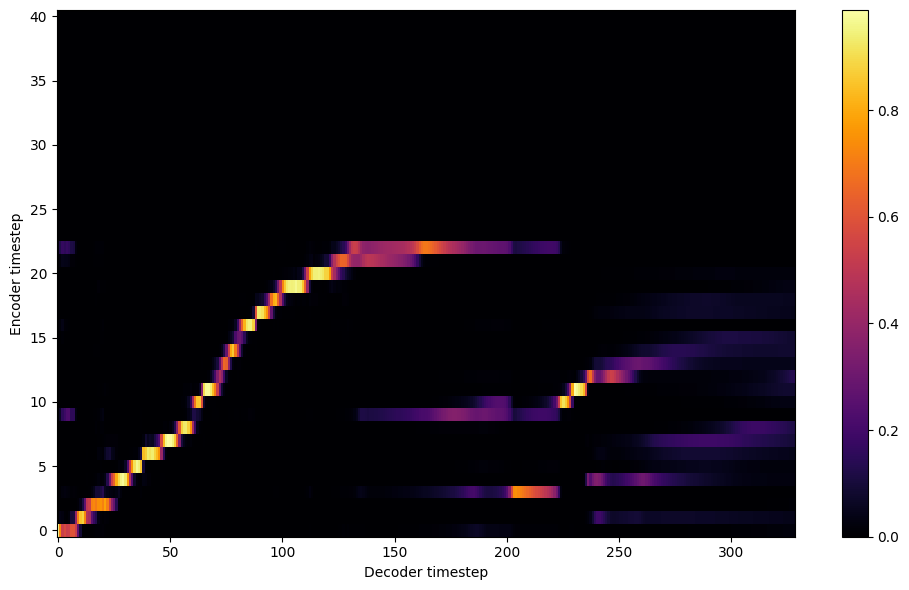


Starting Epoch: 109 Iteration: 1308


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 109 Validation loss 1320:  0.133479  Time: 0.5m LR: 0.000300


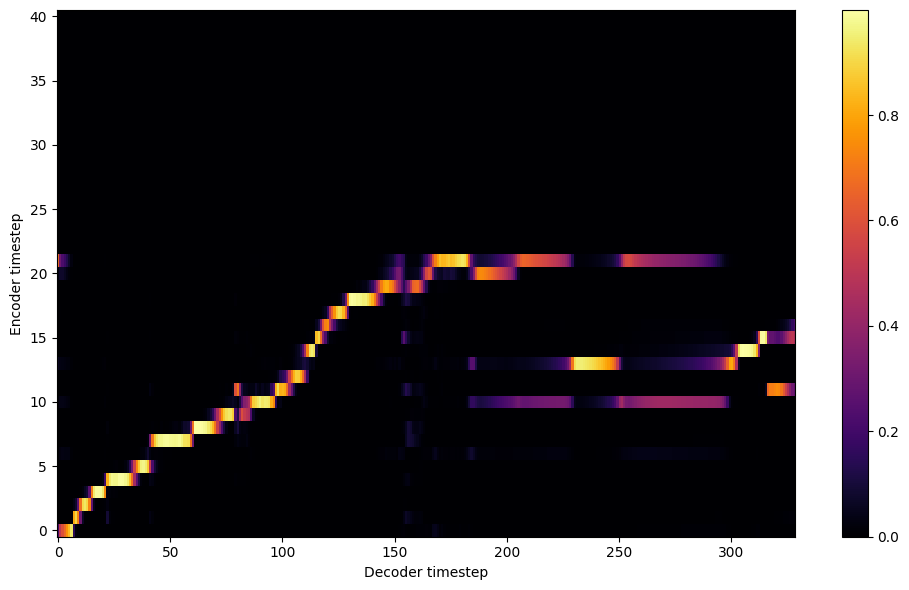

Saving model and optimizer state at iteration 1320 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 110 Iteration: 1320


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 110 Validation loss 1332:  0.131912  Time: 0.5m LR: 0.000300


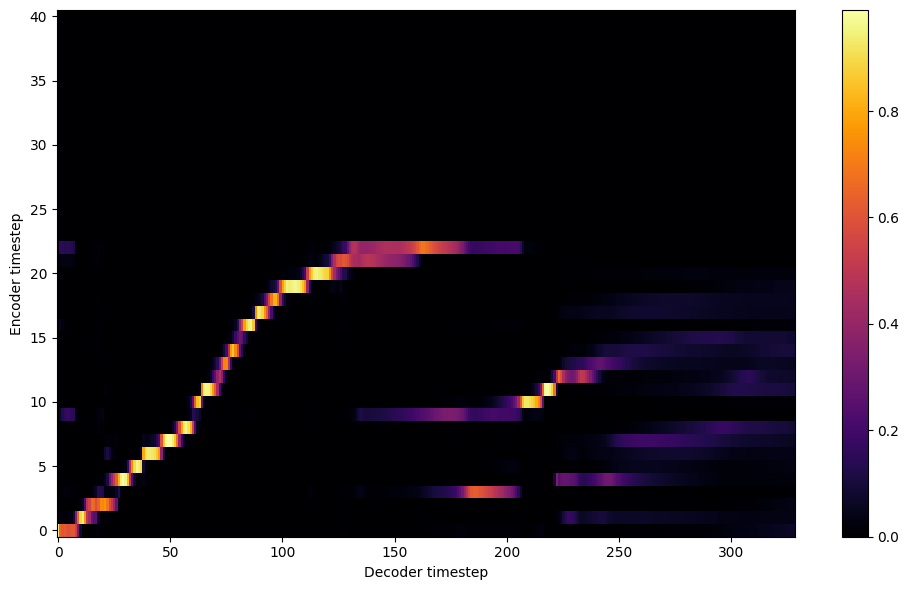


Starting Epoch: 111 Iteration: 1332


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 111 Validation loss 1344:  0.131909  Time: 0.5m LR: 0.000300


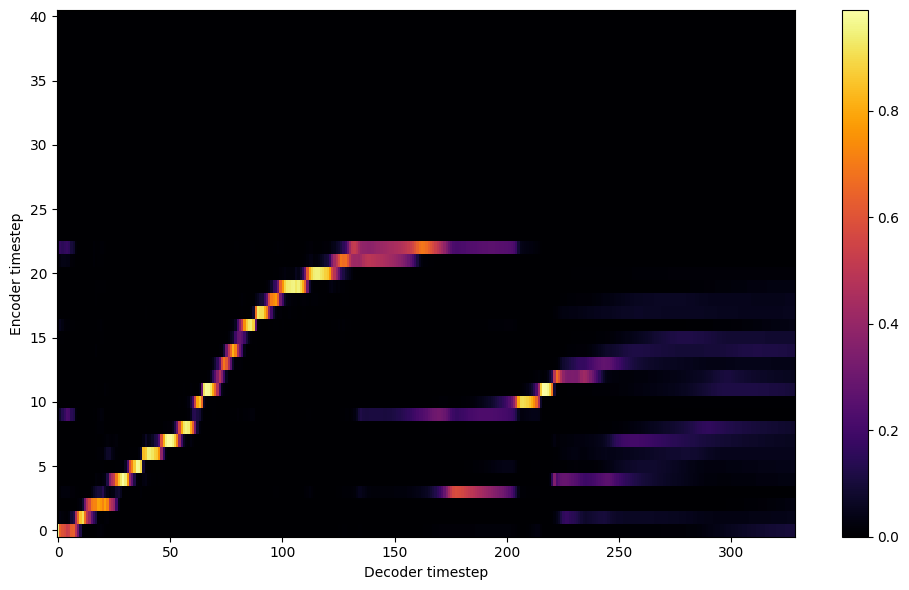


Starting Epoch: 112 Iteration: 1344


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 112 Validation loss 1356:  0.130929  Time: 0.5m LR: 0.000300


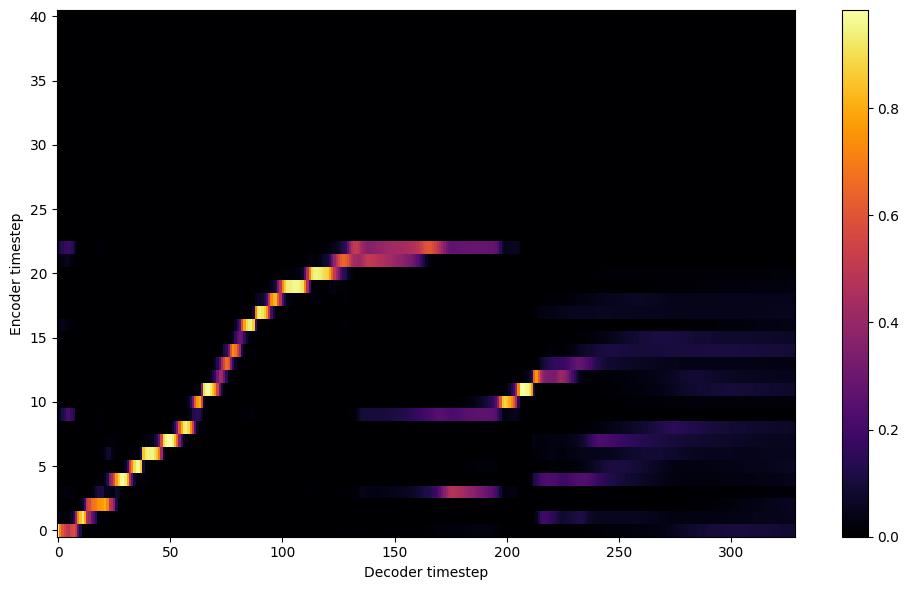


Starting Epoch: 113 Iteration: 1356


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 113 Validation loss 1368:  0.129942  Time: 0.4m LR: 0.000300


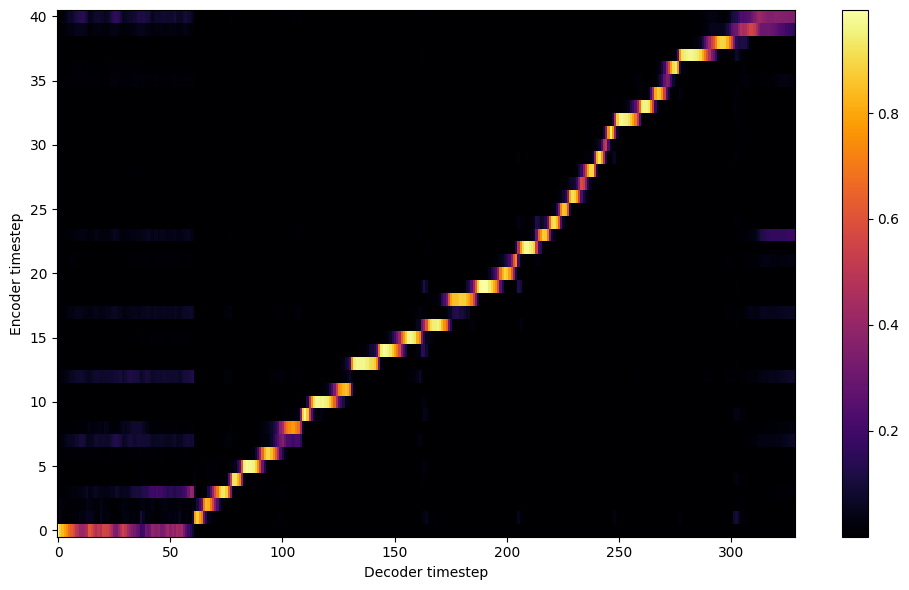


Starting Epoch: 114 Iteration: 1368


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 114 Validation loss 1380:  0.128893  Time: 0.4m LR: 0.000300


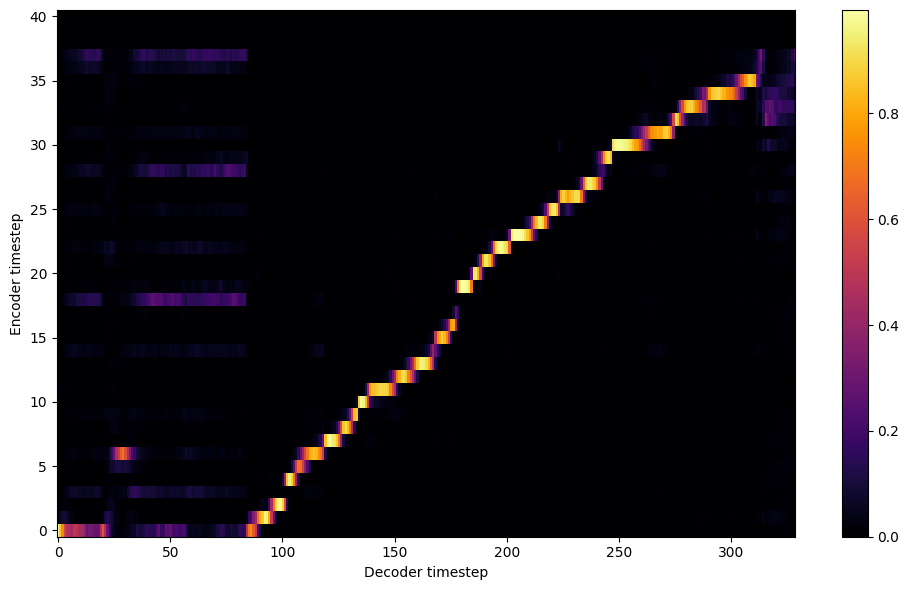


Starting Epoch: 115 Iteration: 1380


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 115 Validation loss 1392:  0.128425  Time: 0.5m LR: 0.000300


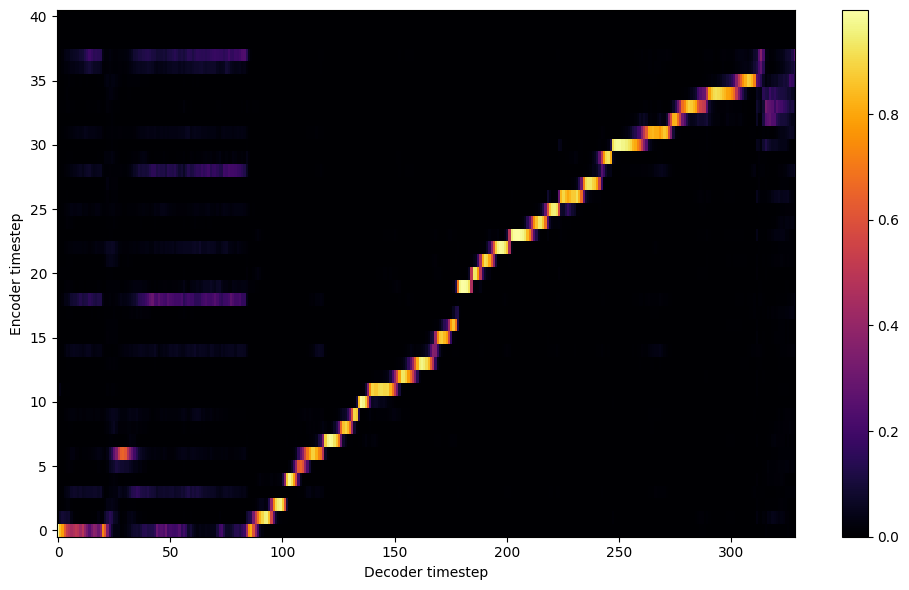


Starting Epoch: 116 Iteration: 1392


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 116 Validation loss 1404:  0.127327  Time: 0.5m LR: 0.000300


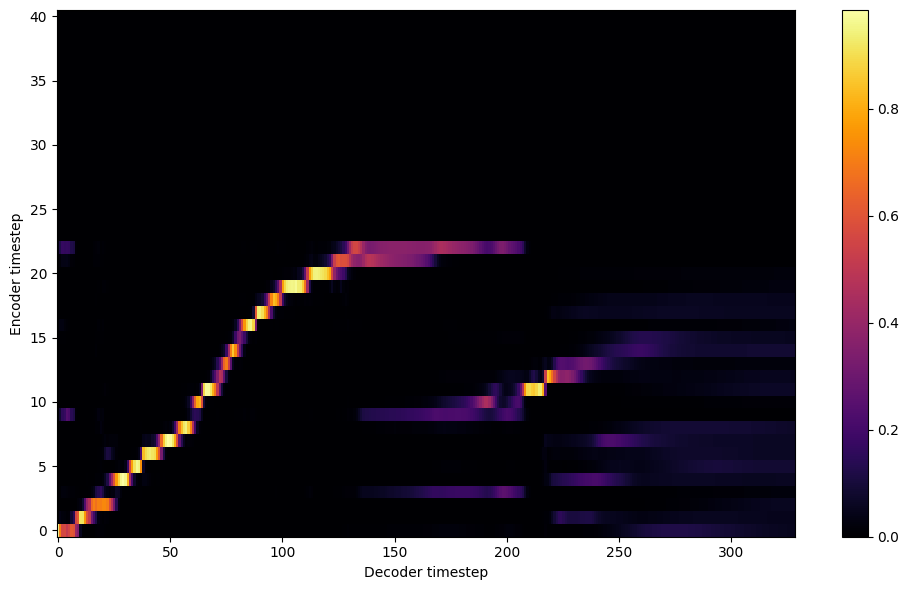


Starting Epoch: 117 Iteration: 1404


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 117 Validation loss 1416:  0.127741  Time: 0.5m LR: 0.000300


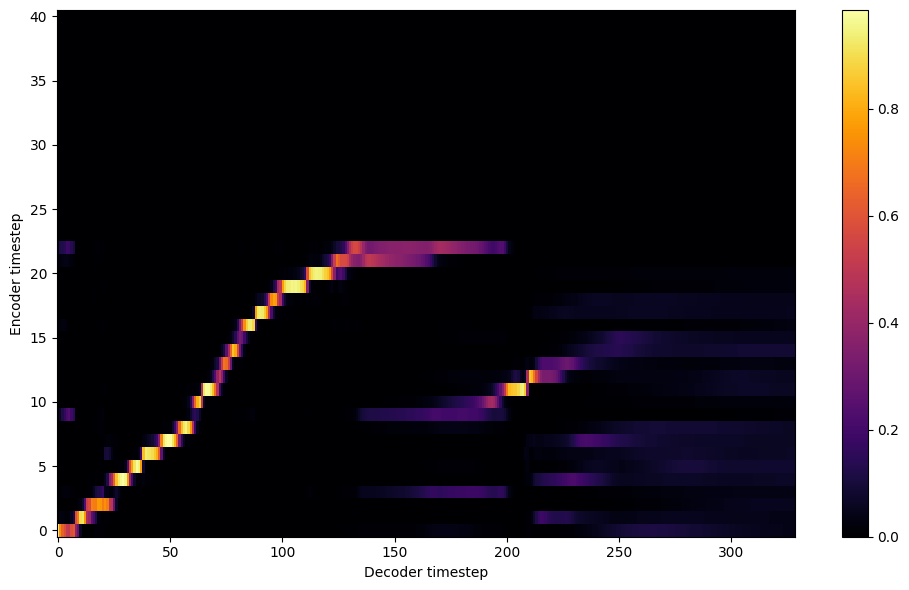


Starting Epoch: 118 Iteration: 1416


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 118 Validation loss 1428:  0.129464  Time: 0.4m LR: 0.000300


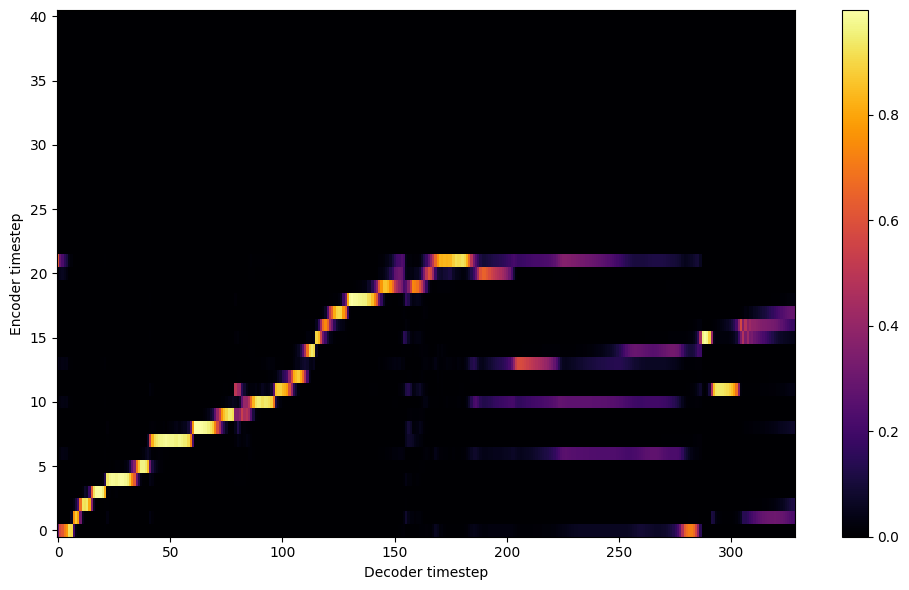


Starting Epoch: 119 Iteration: 1428


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 119 Validation loss 1440:  0.128995  Time: 0.5m LR: 0.000300


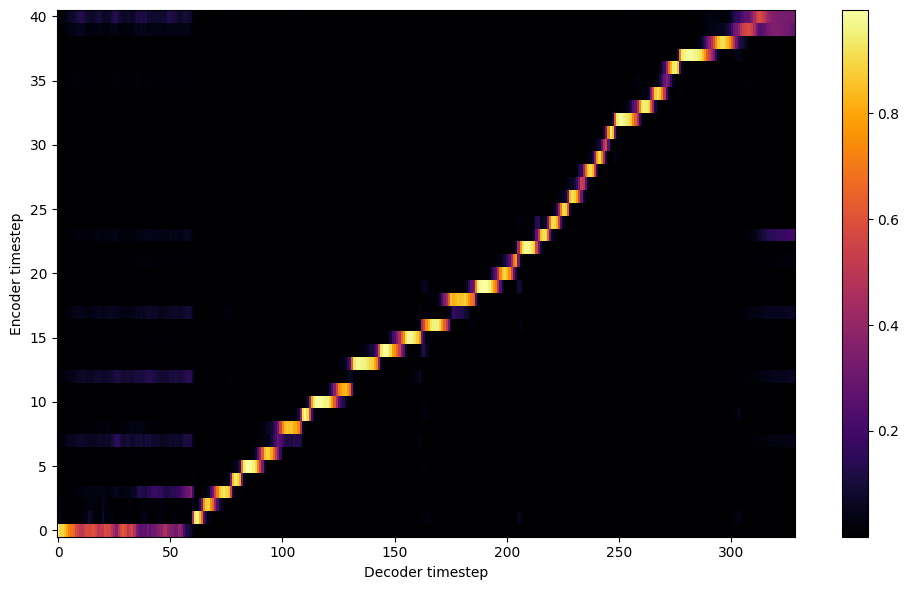

Saving model and optimizer state at iteration 1440 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 120 Iteration: 1440


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 120 Validation loss 1452:  0.127886  Time: 0.5m LR: 0.000300


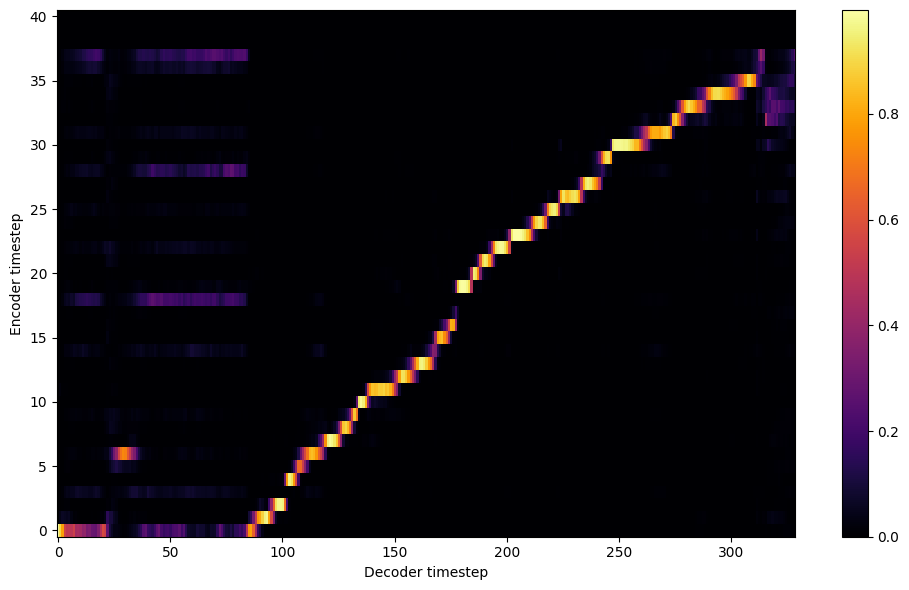


Starting Epoch: 121 Iteration: 1452


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 121 Validation loss 1464:  0.126069  Time: 0.5m LR: 0.000300


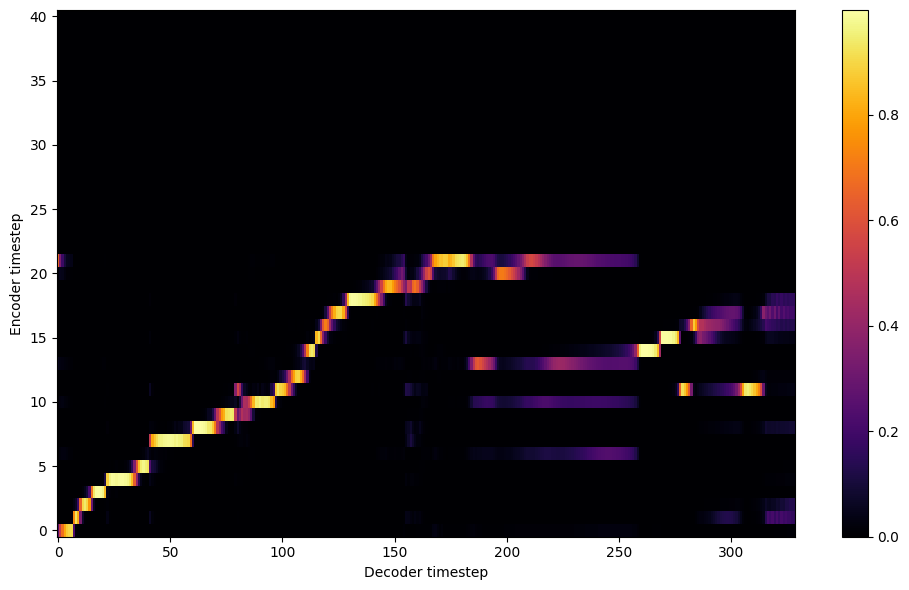


Starting Epoch: 122 Iteration: 1464


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 122 Validation loss 1476:  0.127578  Time: 0.5m LR: 0.000300


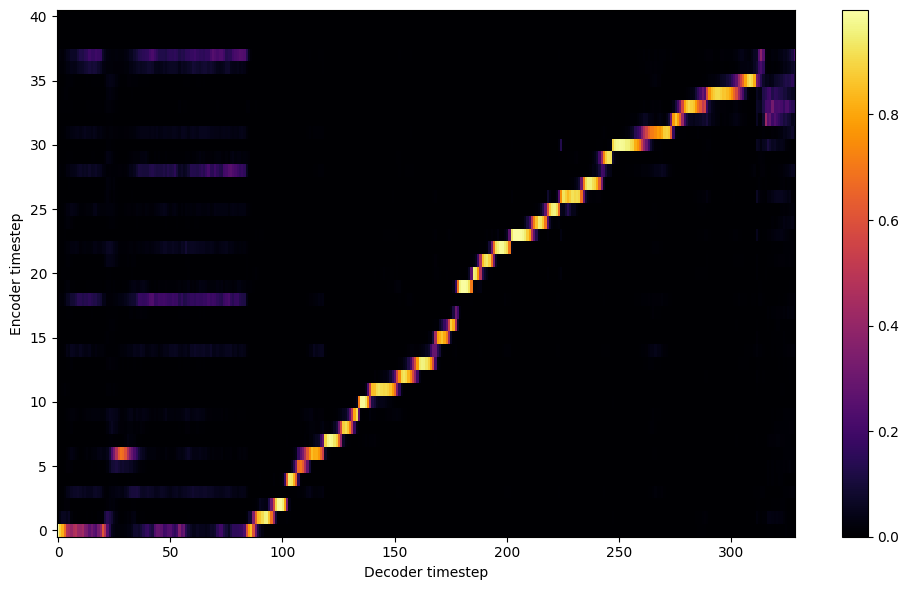


Starting Epoch: 123 Iteration: 1476


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 123 Validation loss 1488:  0.125418  Time: 0.5m LR: 0.000300


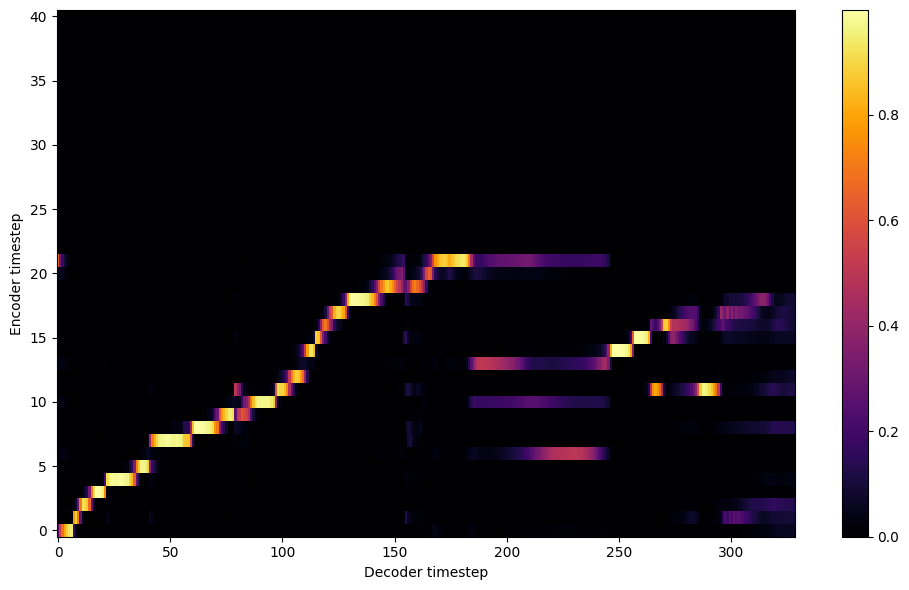


Starting Epoch: 124 Iteration: 1488


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 124 Validation loss 1500:  0.126036  Time: 0.4m LR: 0.000300


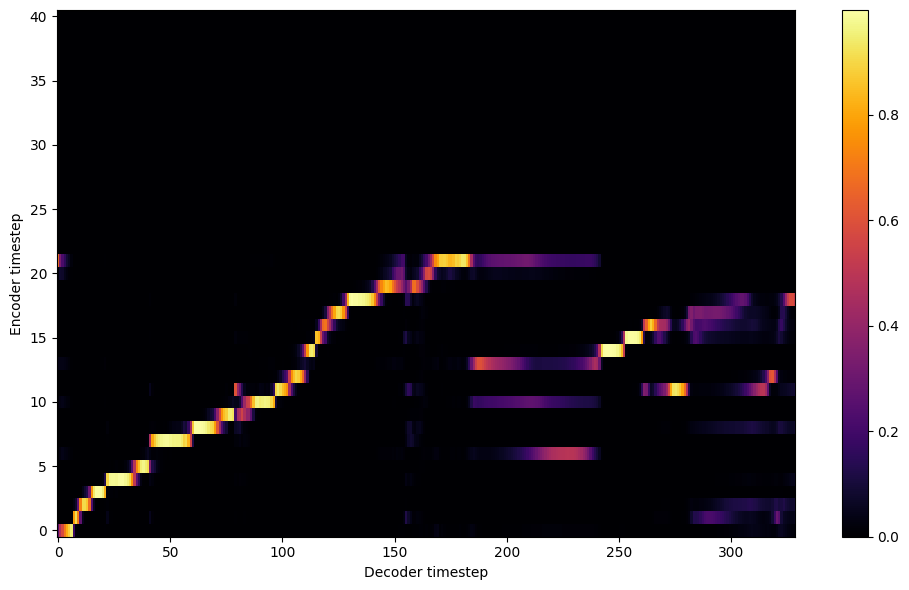


Starting Epoch: 125 Iteration: 1500


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 125 Validation loss 1512:  0.125251  Time: 0.5m LR: 0.000300


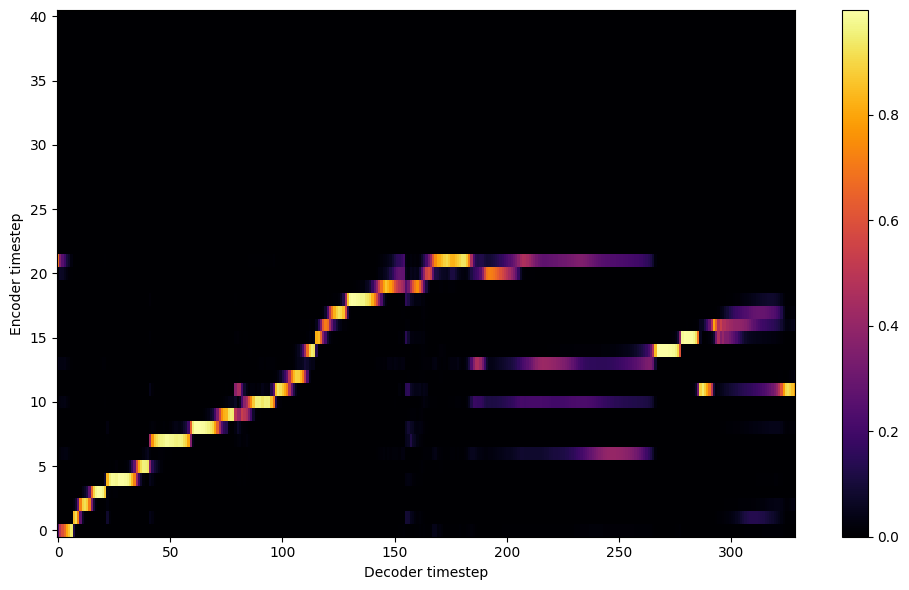


Starting Epoch: 126 Iteration: 1512


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 126 Validation loss 1524:  0.124723  Time: 0.4m LR: 0.000300


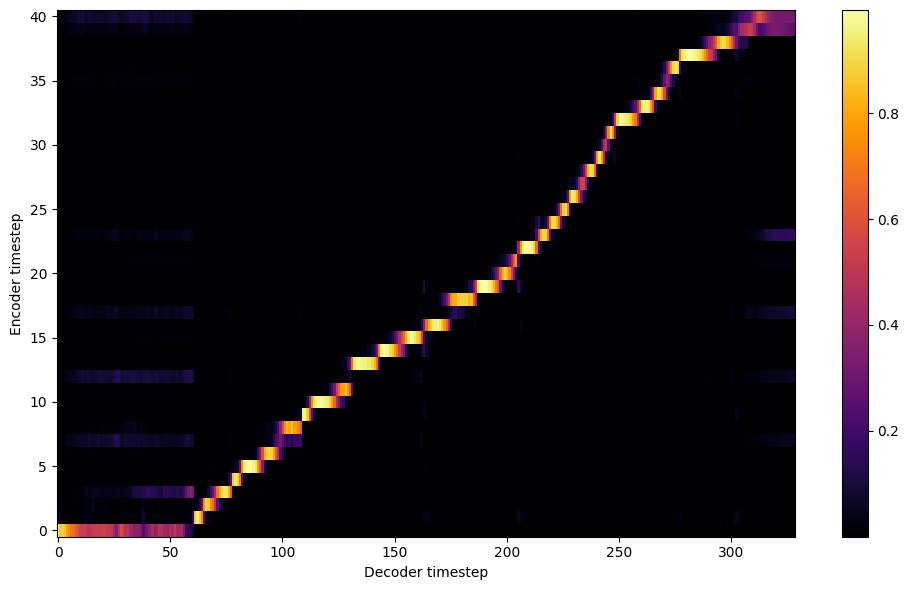


Starting Epoch: 127 Iteration: 1524


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 127 Validation loss 1536:  0.123586  Time: 0.4m LR: 0.000300


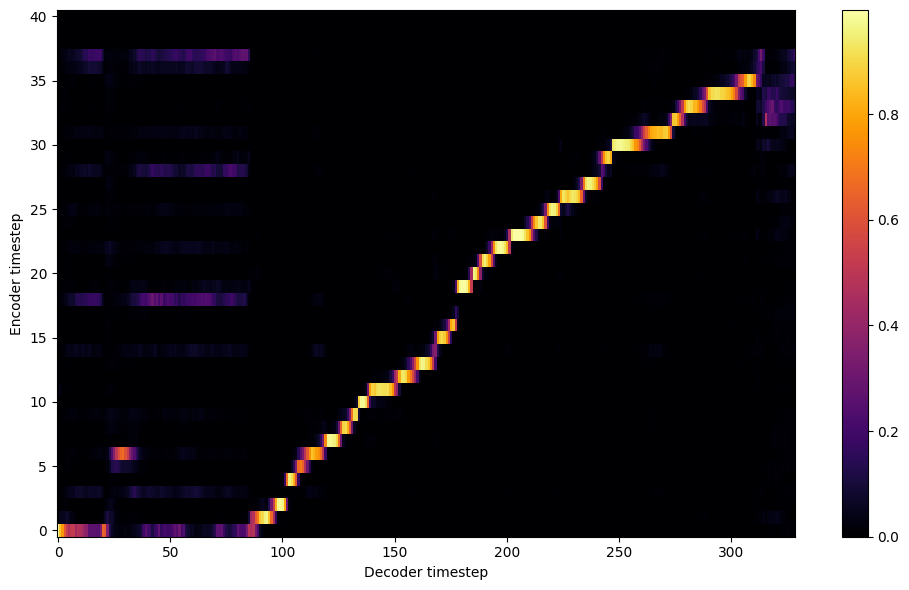


Starting Epoch: 128 Iteration: 1536


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 128 Validation loss 1548:  0.122724  Time: 0.5m LR: 0.000300


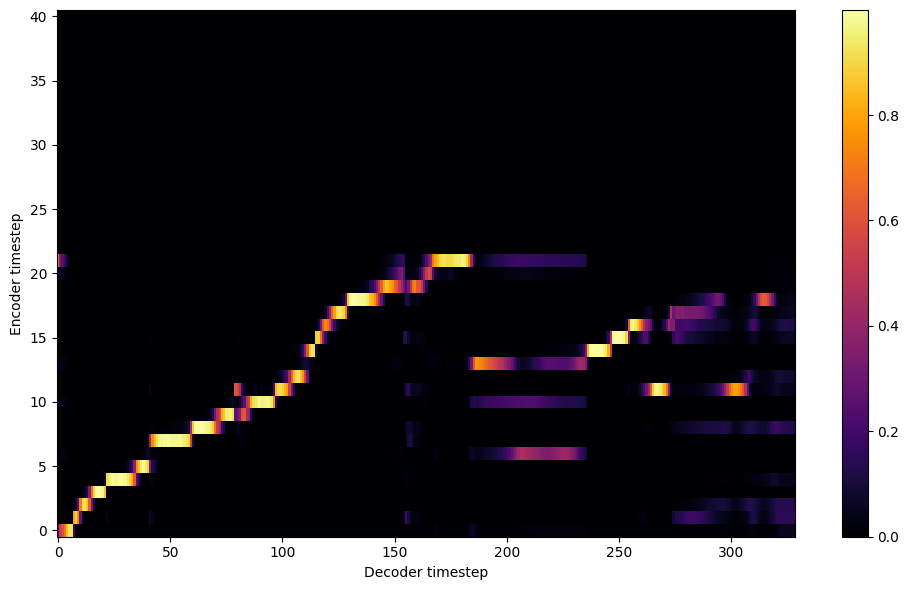


Starting Epoch: 129 Iteration: 1548


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 129 Validation loss 1560:  0.121428  Time: 0.5m LR: 0.000300


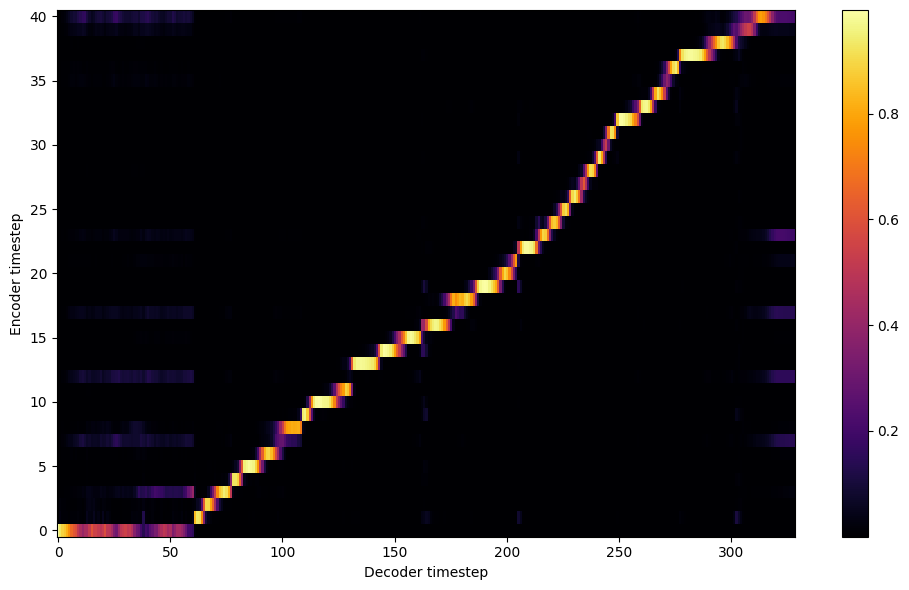

Saving model and optimizer state at iteration 1560 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 130 Iteration: 1560


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 130 Validation loss 1572:  0.121509  Time: 0.5m LR: 0.000300


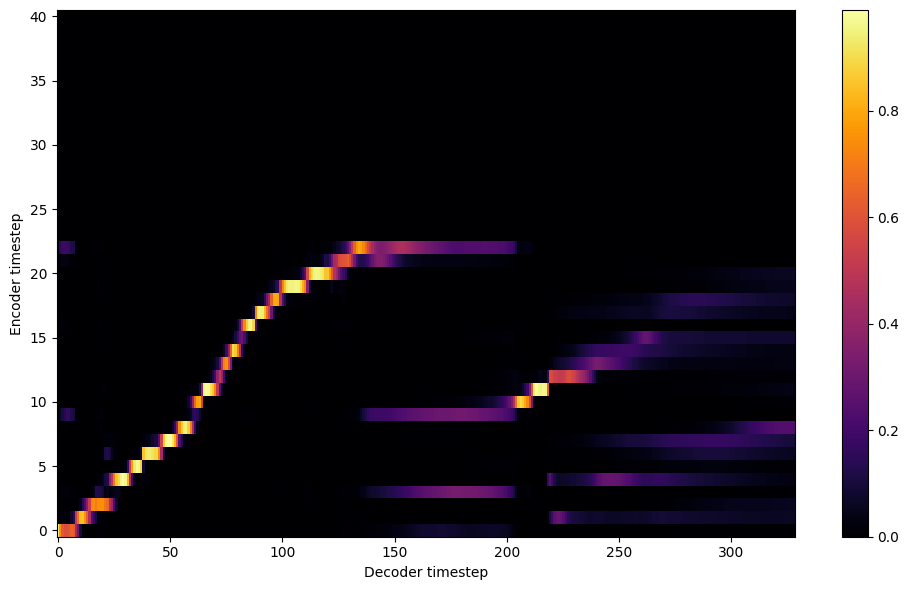


Starting Epoch: 131 Iteration: 1572


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 131 Validation loss 1584:  0.121866  Time: 0.4m LR: 0.000300


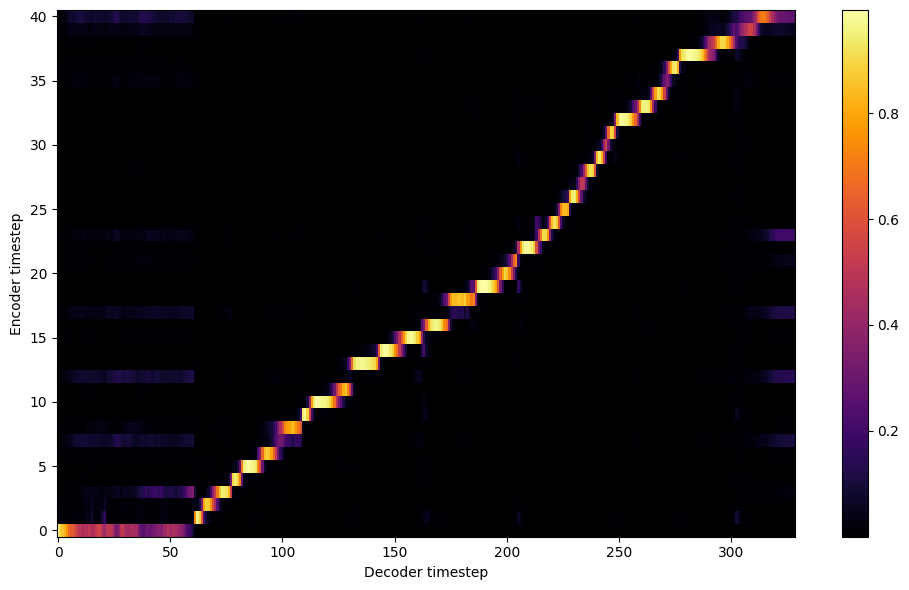


Starting Epoch: 132 Iteration: 1584


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 132 Validation loss 1596:  0.121093  Time: 0.5m LR: 0.000300


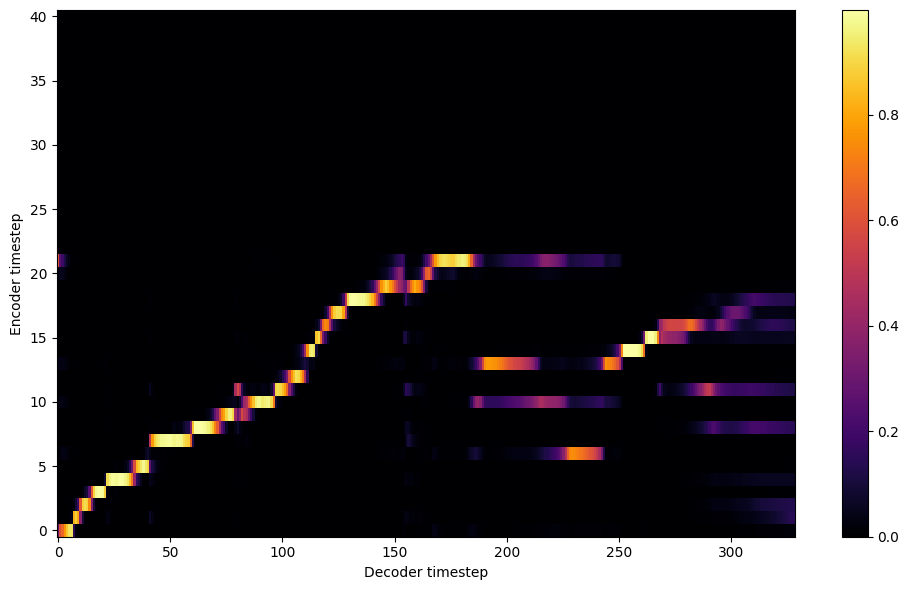


Starting Epoch: 133 Iteration: 1596


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 133 Validation loss 1608:  0.121370  Time: 0.5m LR: 0.000300


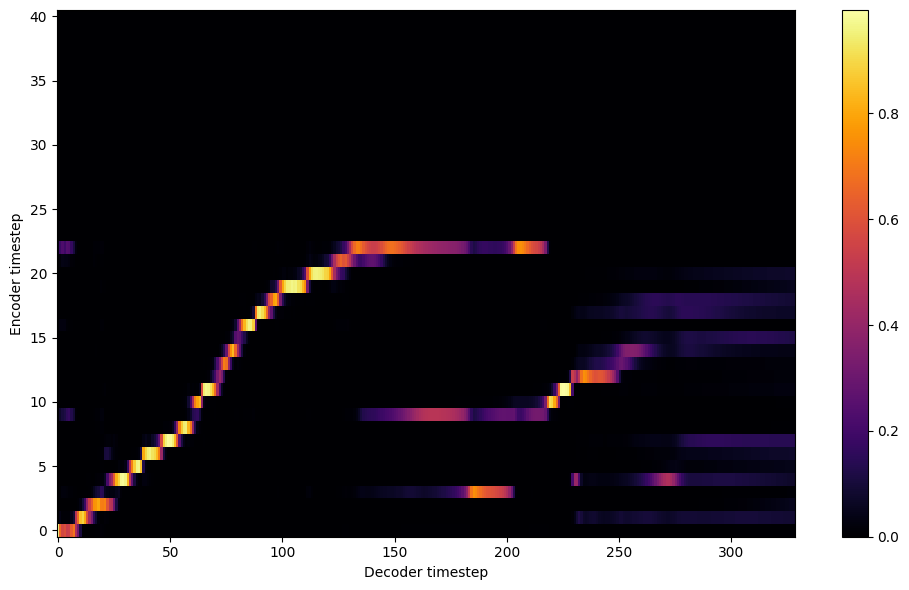


Starting Epoch: 134 Iteration: 1608


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 134 Validation loss 1620:  0.119273  Time: 0.5m LR: 0.000300


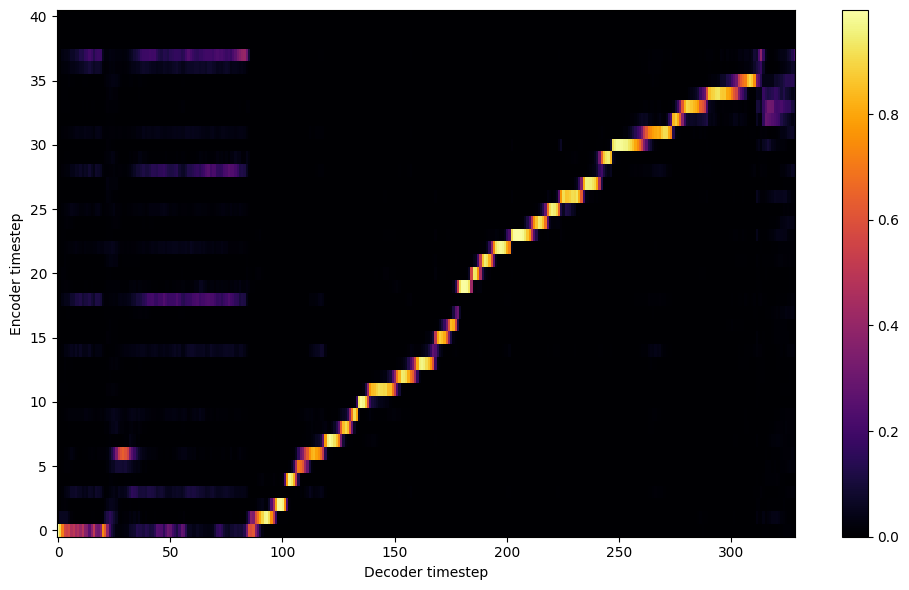


Starting Epoch: 135 Iteration: 1620


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 135 Validation loss 1632:  0.119796  Time: 0.4m LR: 0.000300


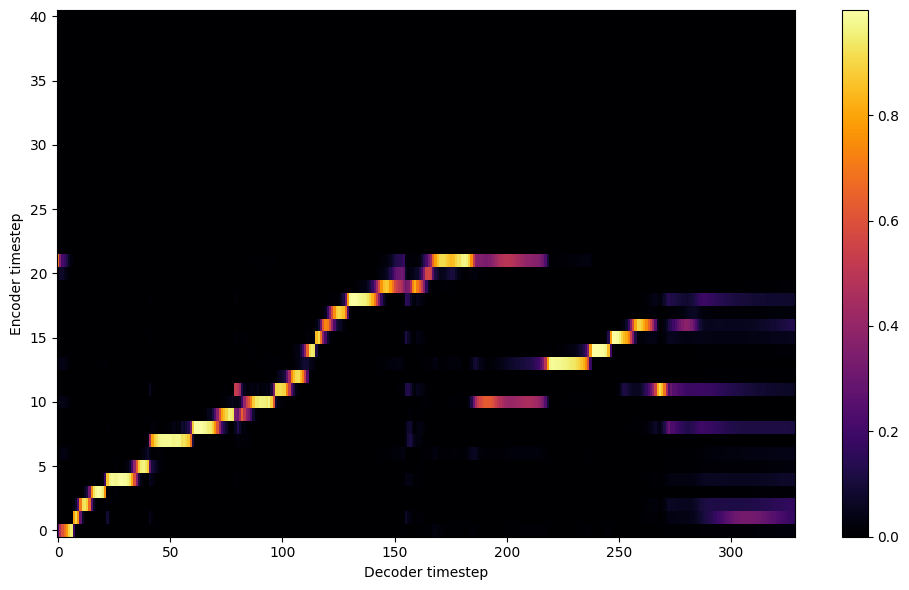


Starting Epoch: 136 Iteration: 1632


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 136 Validation loss 1644:  0.119650  Time: 0.5m LR: 0.000300


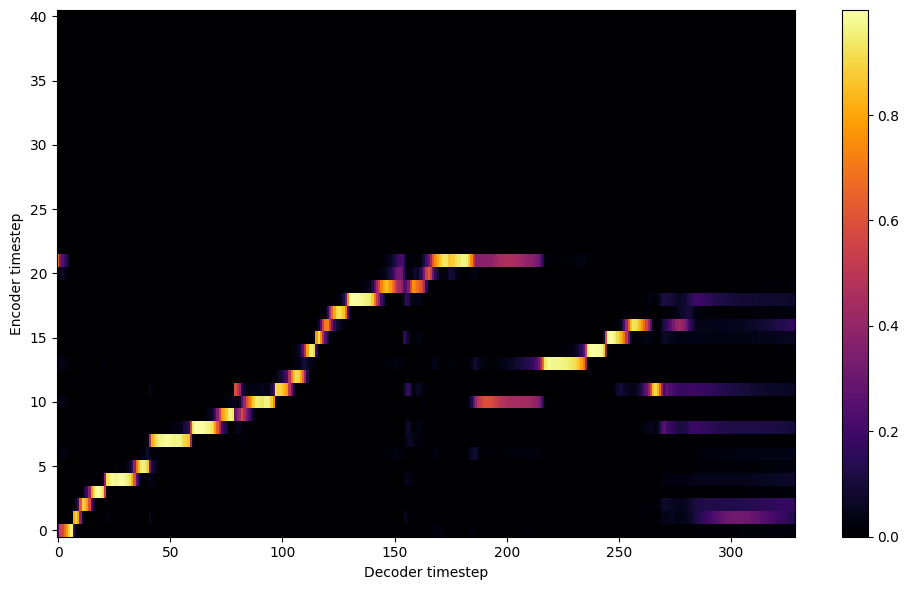


Starting Epoch: 137 Iteration: 1644


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 137 Validation loss 1656:  0.119704  Time: 0.5m LR: 0.000300


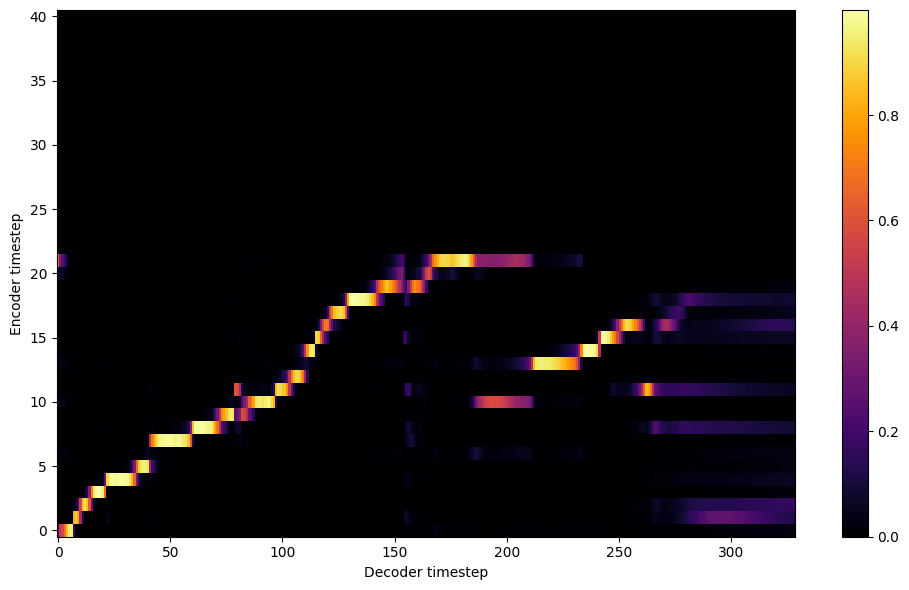


Starting Epoch: 138 Iteration: 1656


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 138 Validation loss 1668:  0.119291  Time: 0.5m LR: 0.000300


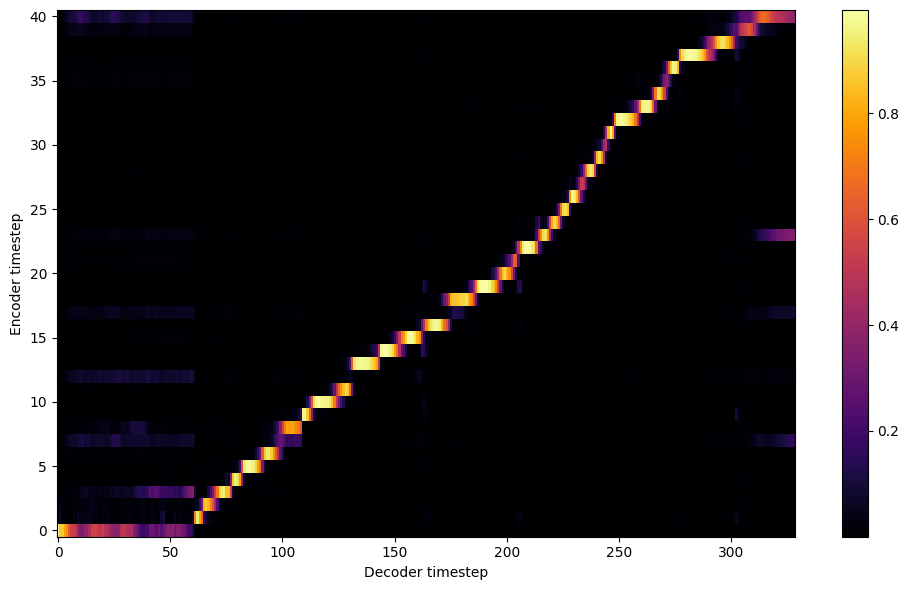


Starting Epoch: 139 Iteration: 1668


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 139 Validation loss 1680:  0.118628  Time: 0.5m LR: 0.000300


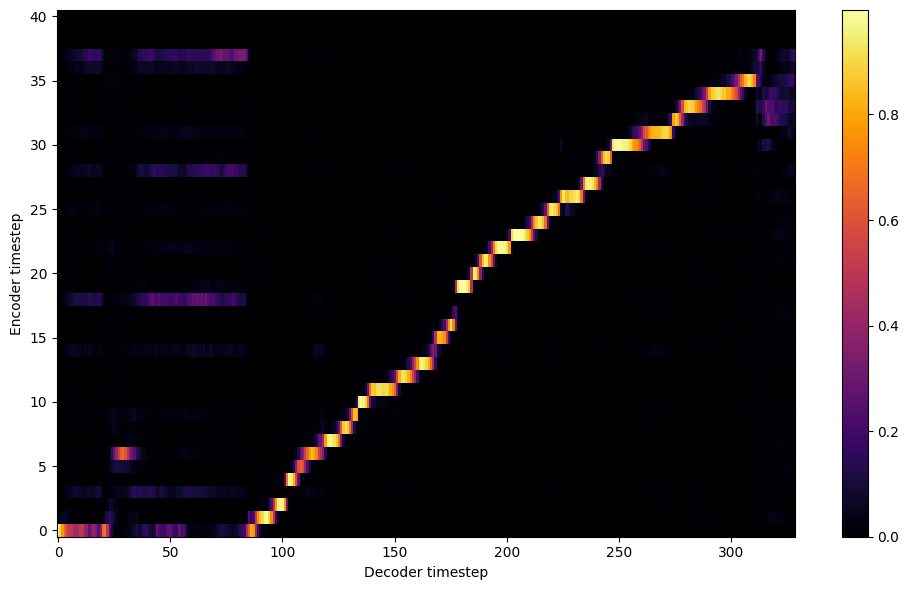

Saving model and optimizer state at iteration 1680 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 140 Iteration: 1680


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 140 Validation loss 1692:  0.120521  Time: 0.5m LR: 0.000300


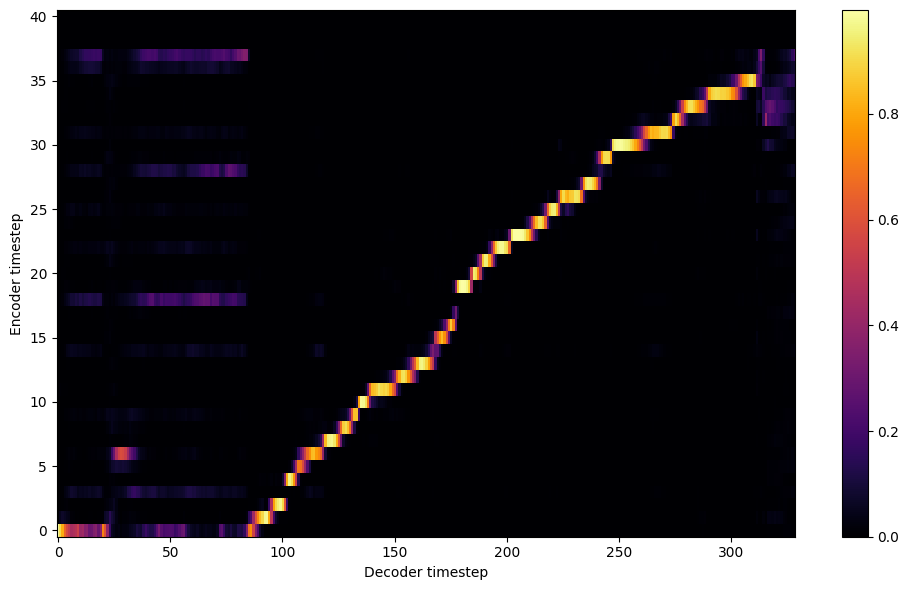


Starting Epoch: 141 Iteration: 1692


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 141 Validation loss 1704:  0.118047  Time: 0.5m LR: 0.000300


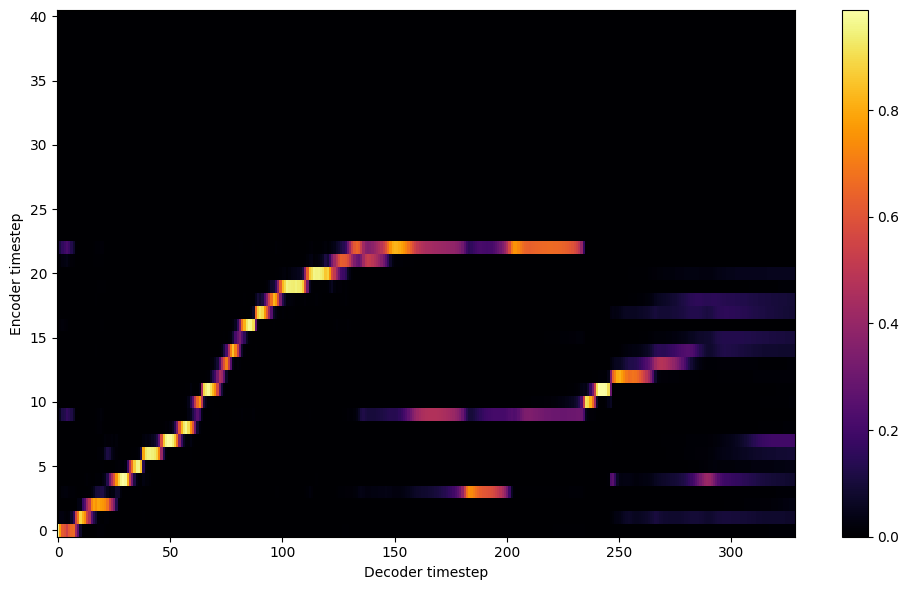


Starting Epoch: 142 Iteration: 1704


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 142 Validation loss 1716:  0.118324  Time: 0.5m LR: 0.000300


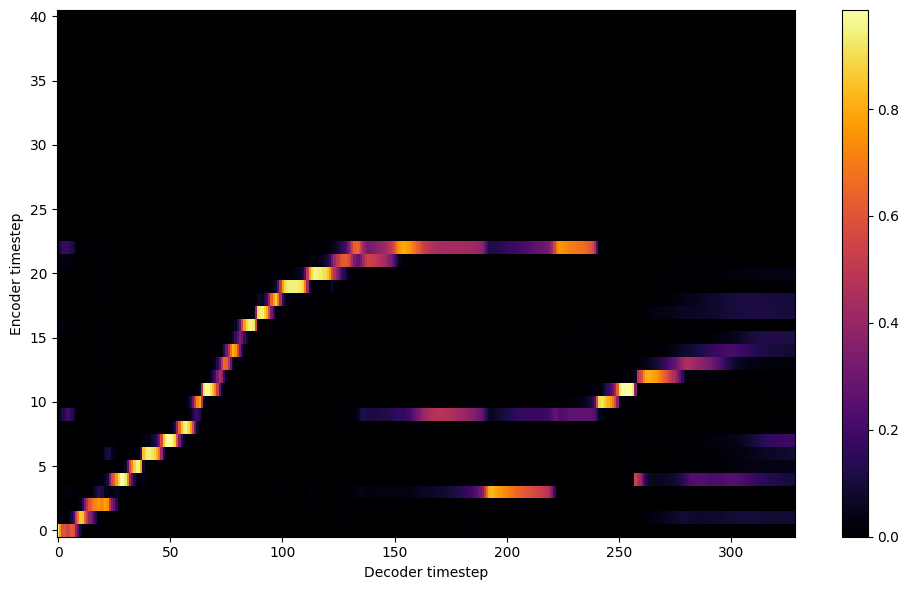


Starting Epoch: 143 Iteration: 1716


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 143 Validation loss 1728:  0.118674  Time: 0.5m LR: 0.000300


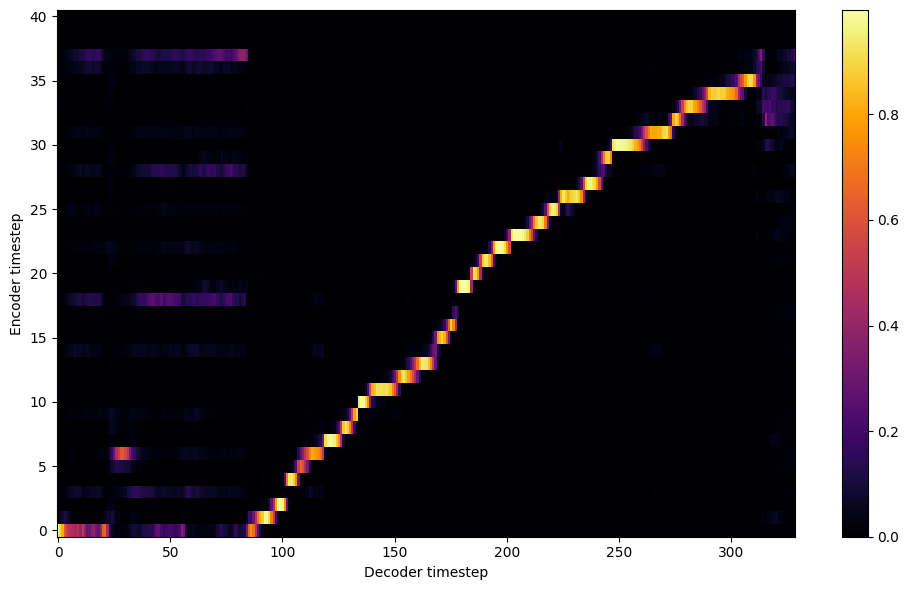


Starting Epoch: 144 Iteration: 1728


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 144 Validation loss 1740:  0.117000  Time: 0.5m LR: 0.000300


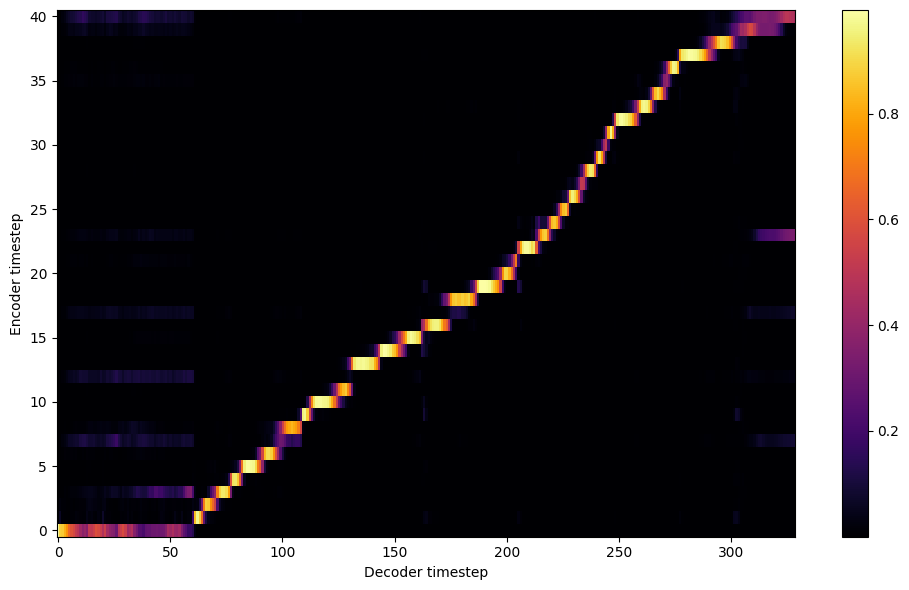


Starting Epoch: 145 Iteration: 1740


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 145 Validation loss 1752:  0.116027  Time: 0.5m LR: 0.000300


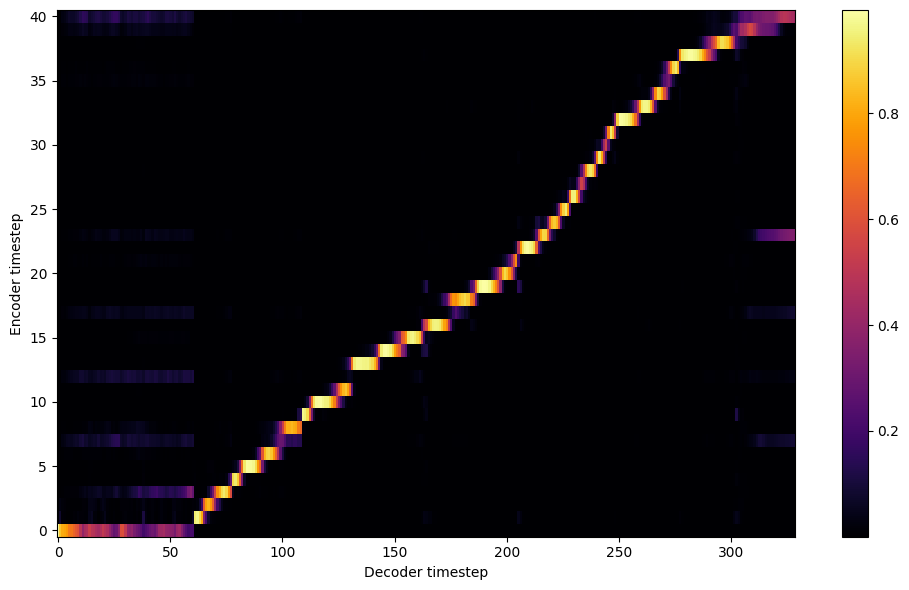


Starting Epoch: 146 Iteration: 1752


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 146 Validation loss 1764:  0.115549  Time: 0.5m LR: 0.000300


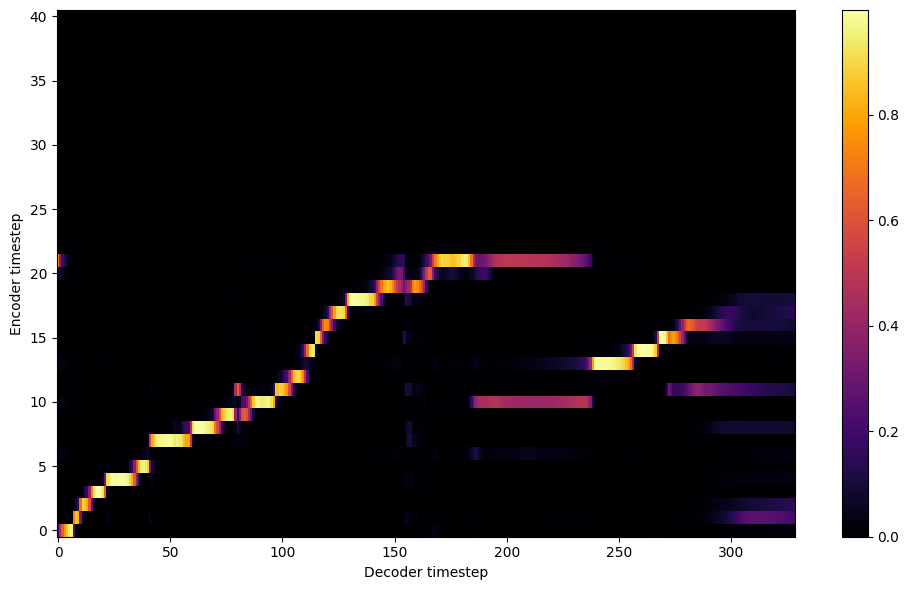


Starting Epoch: 147 Iteration: 1764


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 147 Validation loss 1776:  0.114477  Time: 0.4m LR: 0.000300


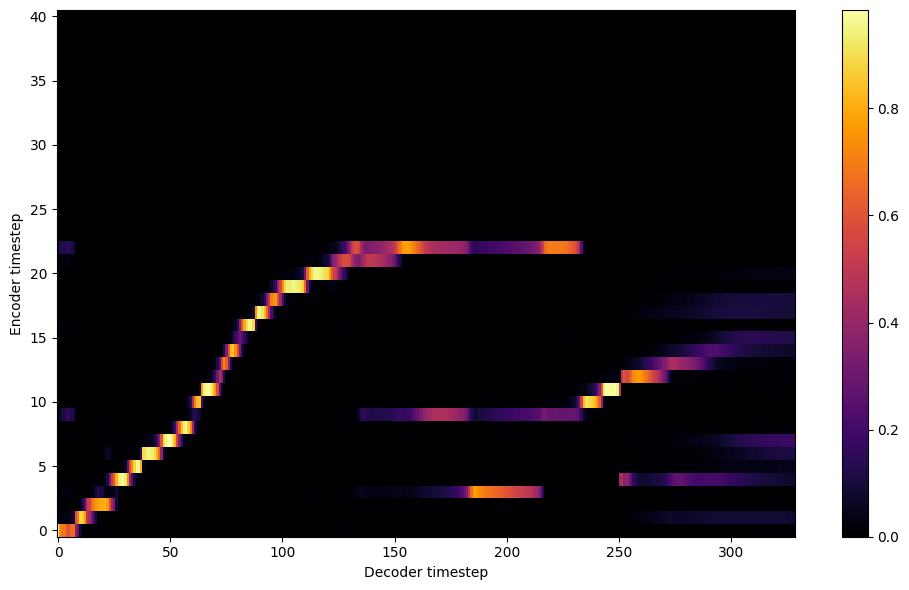


Starting Epoch: 148 Iteration: 1776


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 148 Validation loss 1788:  0.114308  Time: 0.5m LR: 0.000300


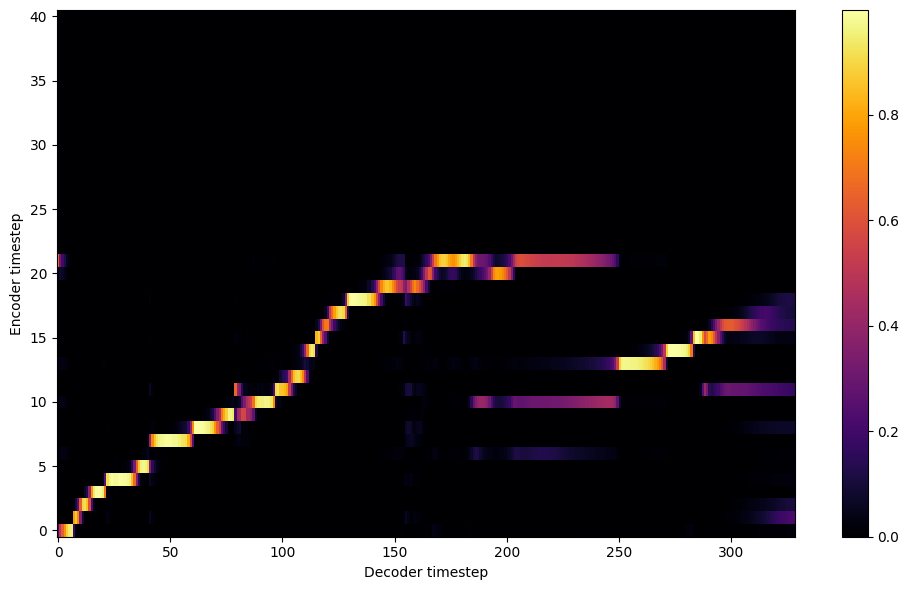


Starting Epoch: 149 Iteration: 1788


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 149 Validation loss 1800:  0.113900  Time: 0.4m LR: 0.000300


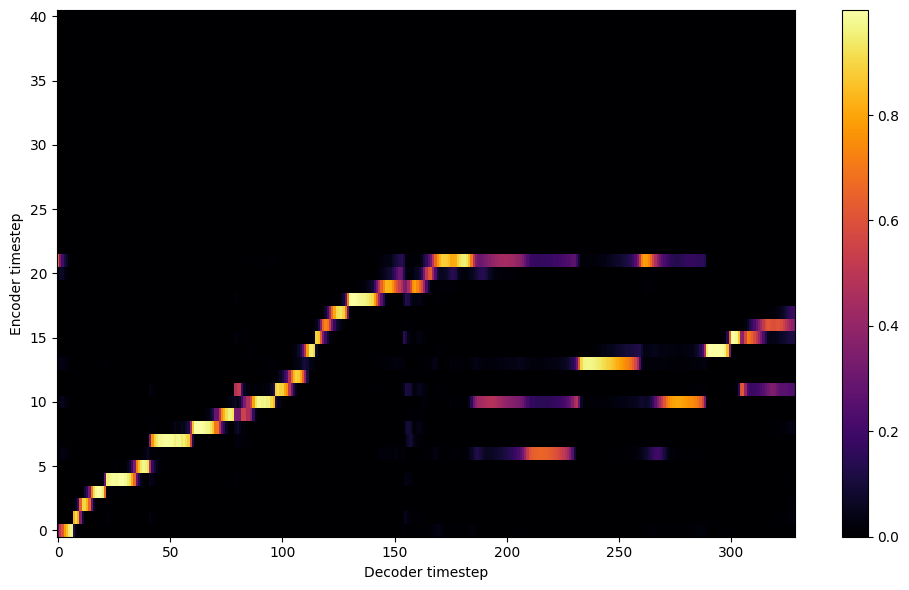

Saving model and optimizer state at iteration 1800 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 150 Iteration: 1800


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 150 Validation loss 1812:  0.112239  Time: 0.5m LR: 0.000300


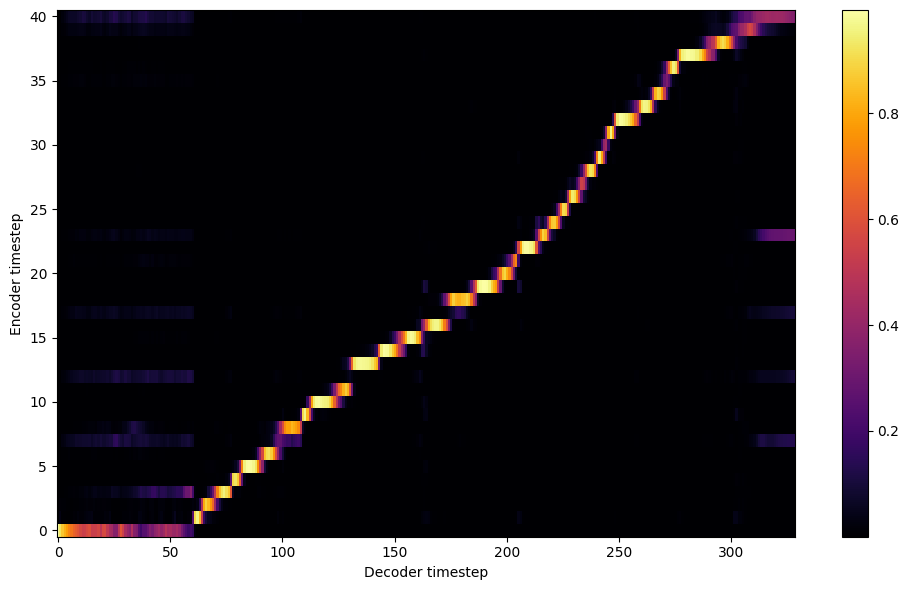


Starting Epoch: 151 Iteration: 1812


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 151 Validation loss 1824:  0.111747  Time: 0.5m LR: 0.000300


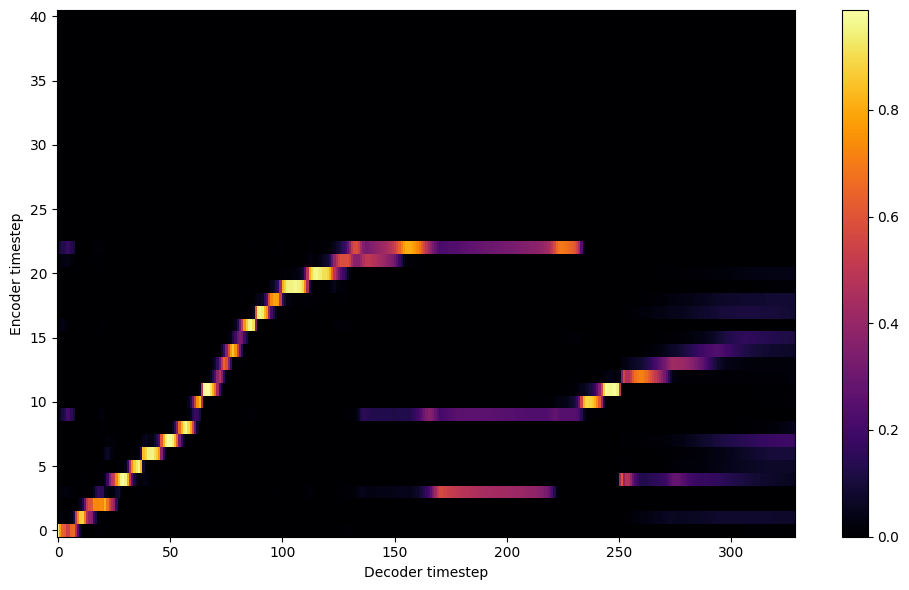


Starting Epoch: 152 Iteration: 1824


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 152 Validation loss 1836:  0.111906  Time: 0.5m LR: 0.000300


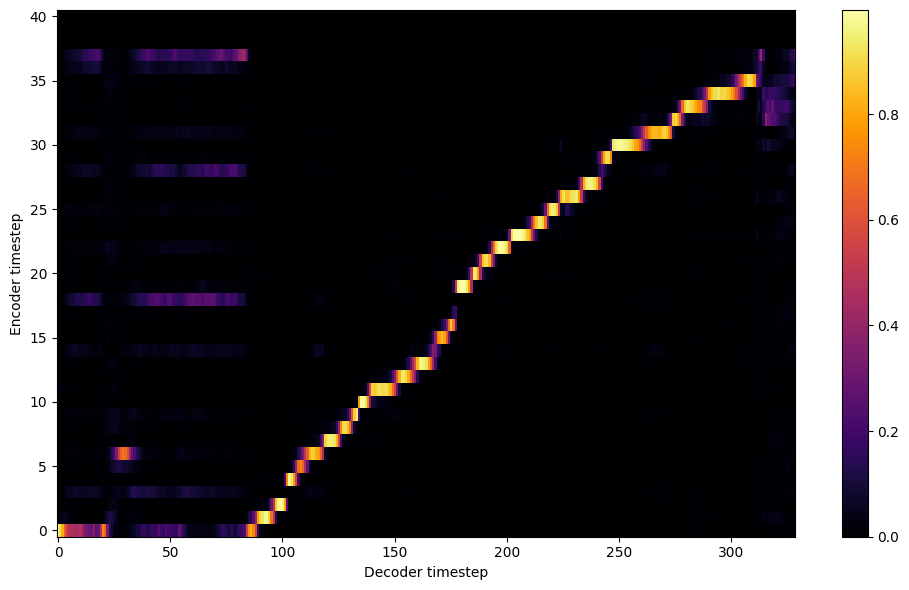


Starting Epoch: 153 Iteration: 1836


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 153 Validation loss 1848:  0.112270  Time: 0.5m LR: 0.000300


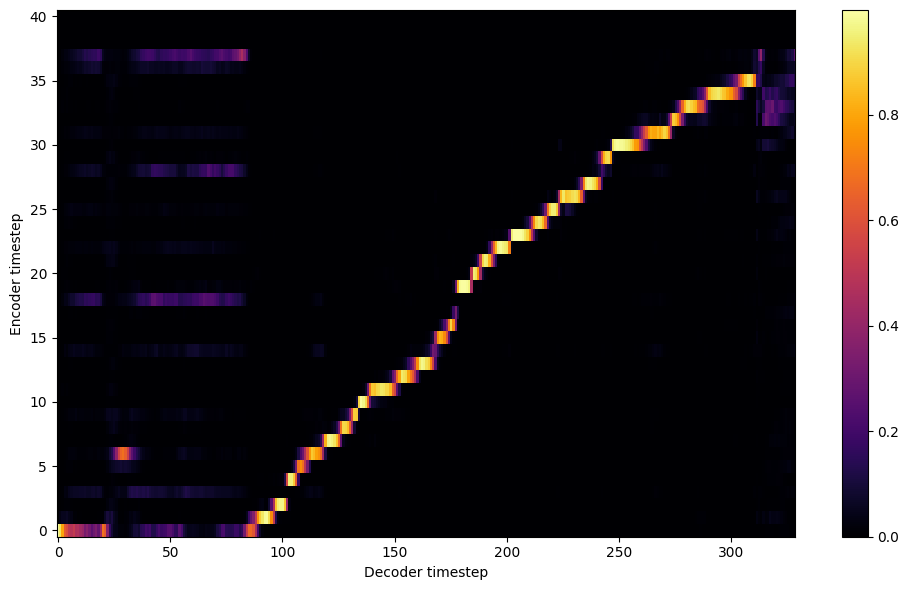


Starting Epoch: 154 Iteration: 1848


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 154 Validation loss 1860:  0.112398  Time: 0.5m LR: 0.000300


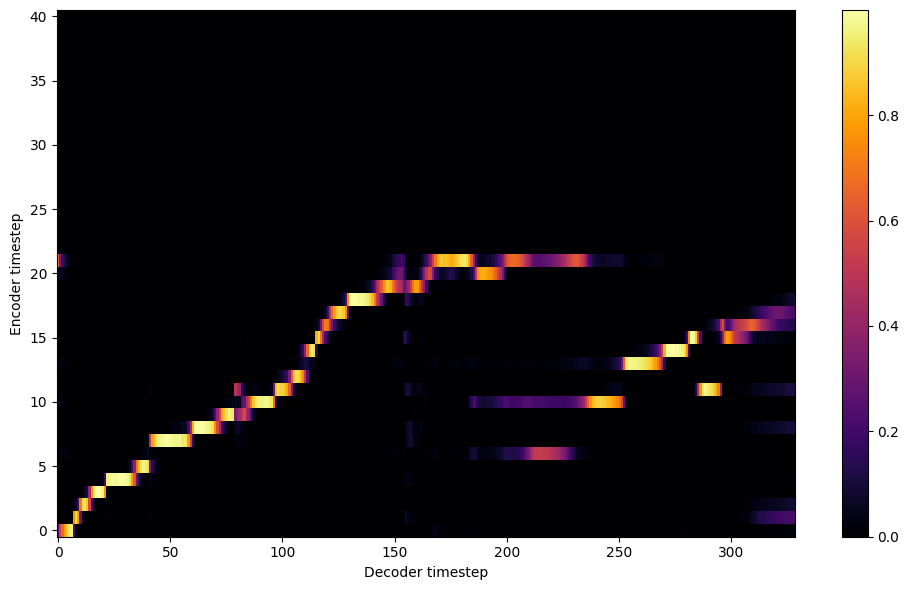


Starting Epoch: 155 Iteration: 1860


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 155 Validation loss 1872:  0.112746  Time: 0.4m LR: 0.000300


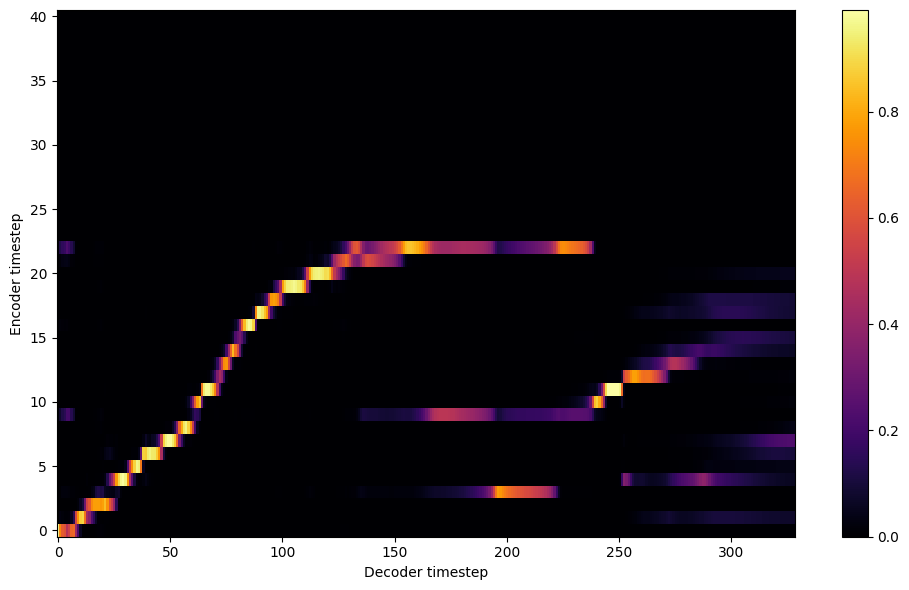


Starting Epoch: 156 Iteration: 1872


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 156 Validation loss 1884:  0.112786  Time: 0.5m LR: 0.000300


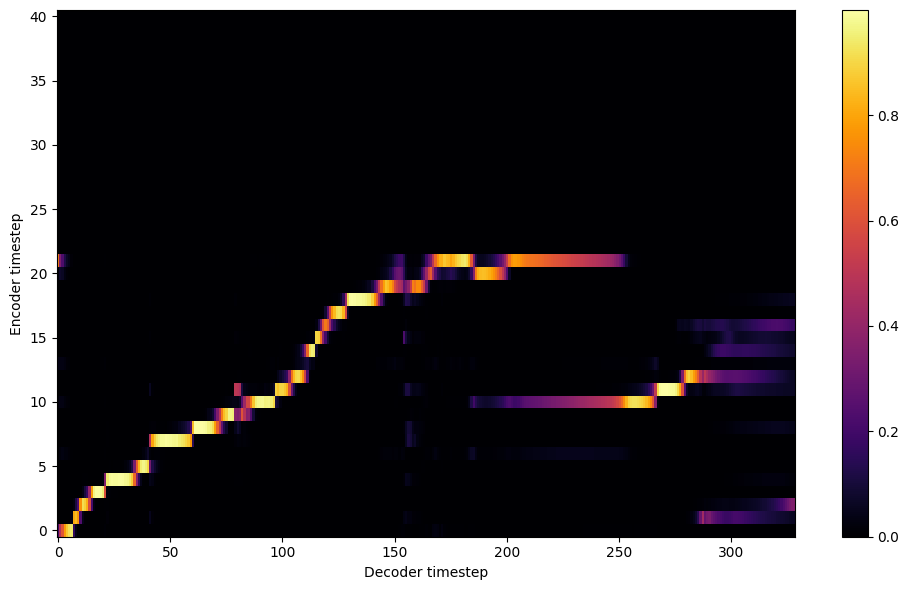


Starting Epoch: 157 Iteration: 1884


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 157 Validation loss 1896:  0.111948  Time: 0.5m LR: 0.000300


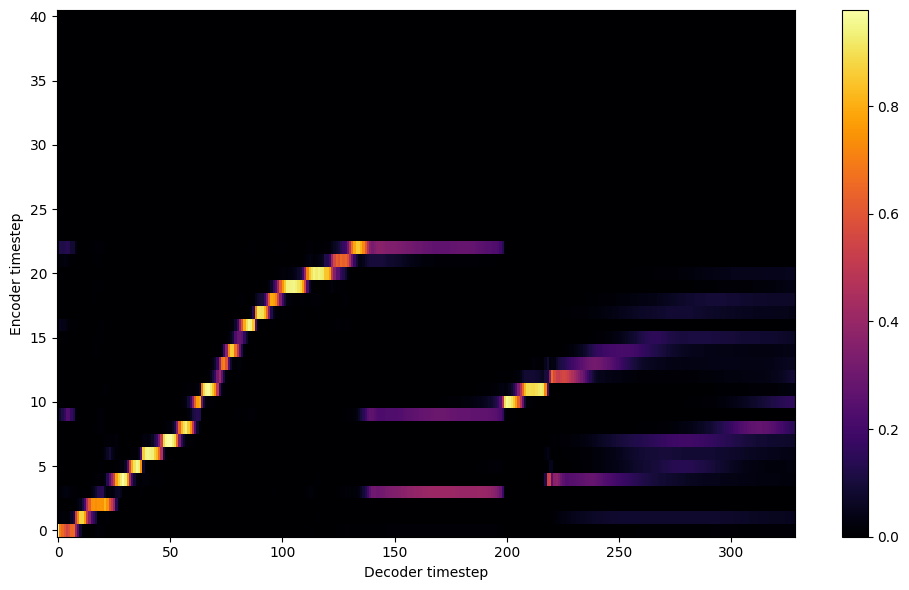


Starting Epoch: 158 Iteration: 1896


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 158 Validation loss 1908:  0.111118  Time: 0.5m LR: 0.000300


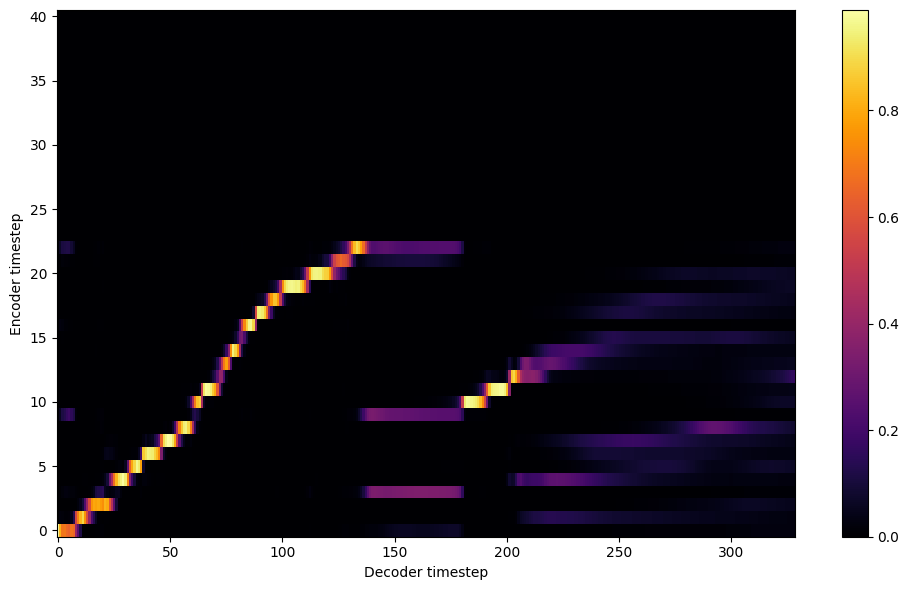


Starting Epoch: 159 Iteration: 1908


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 159 Validation loss 1920:  0.111391  Time: 0.4m LR: 0.000300


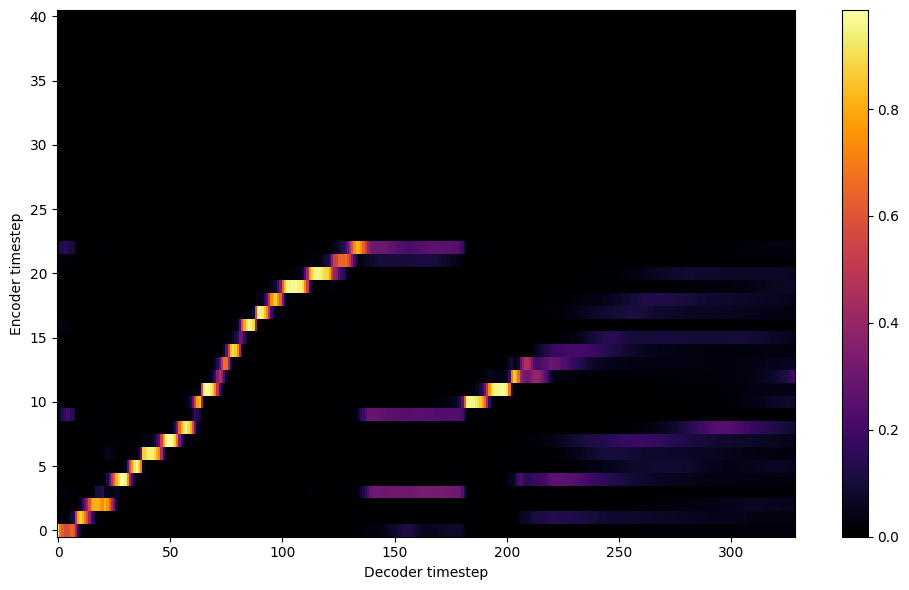

Saving model and optimizer state at iteration 1920 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 160 Iteration: 1920


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 160 Validation loss 1932:  0.110607  Time: 0.5m LR: 0.000300


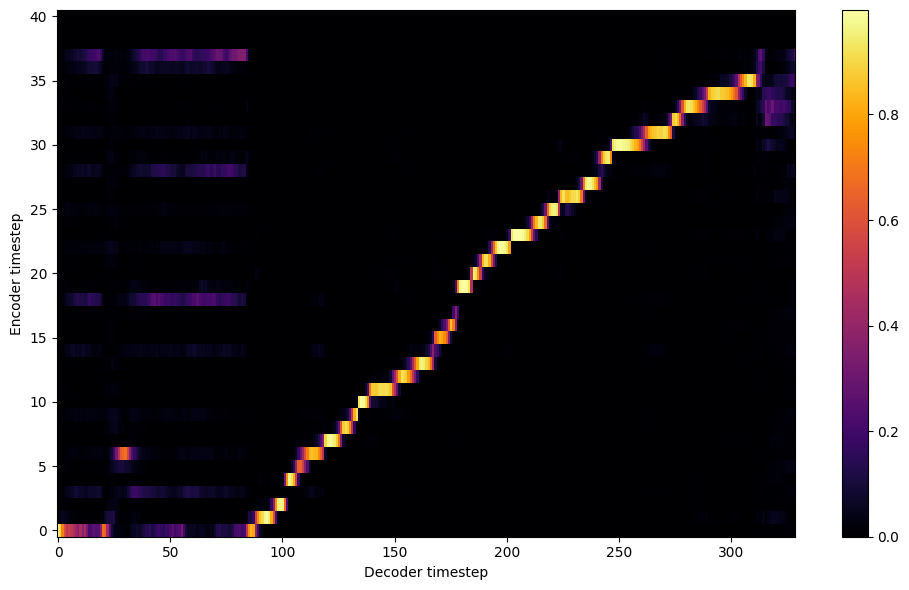


Starting Epoch: 161 Iteration: 1932


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 161 Validation loss 1944:  0.109727  Time: 0.5m LR: 0.000300


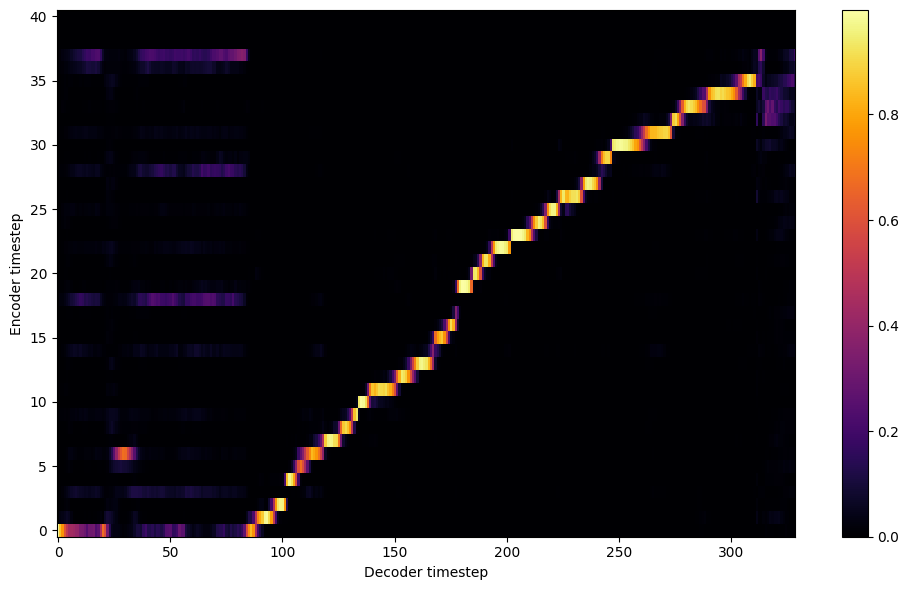


Starting Epoch: 162 Iteration: 1944


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 162 Validation loss 1956:  0.109633  Time: 0.5m LR: 0.000300


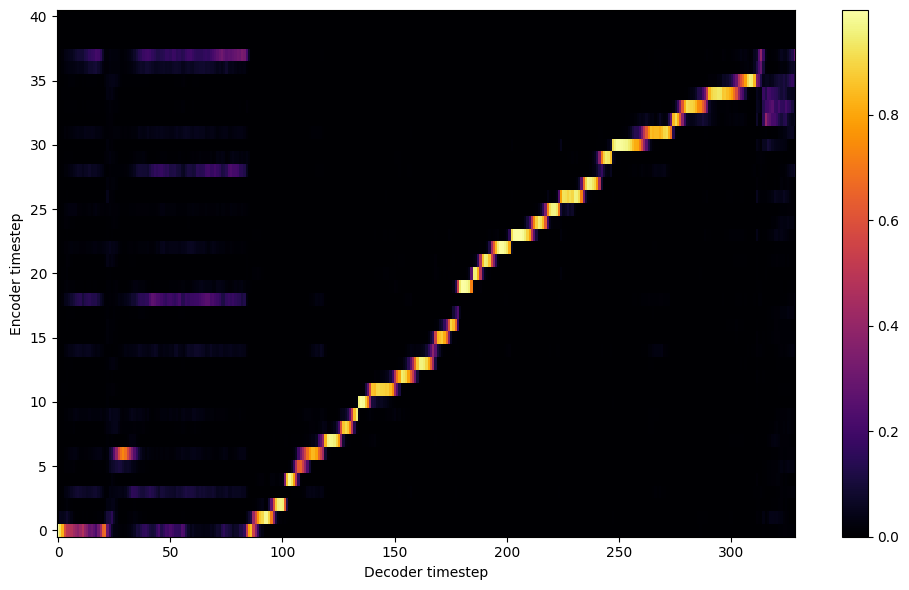


Starting Epoch: 163 Iteration: 1956


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 163 Validation loss 1968:  0.109312  Time: 0.5m LR: 0.000300


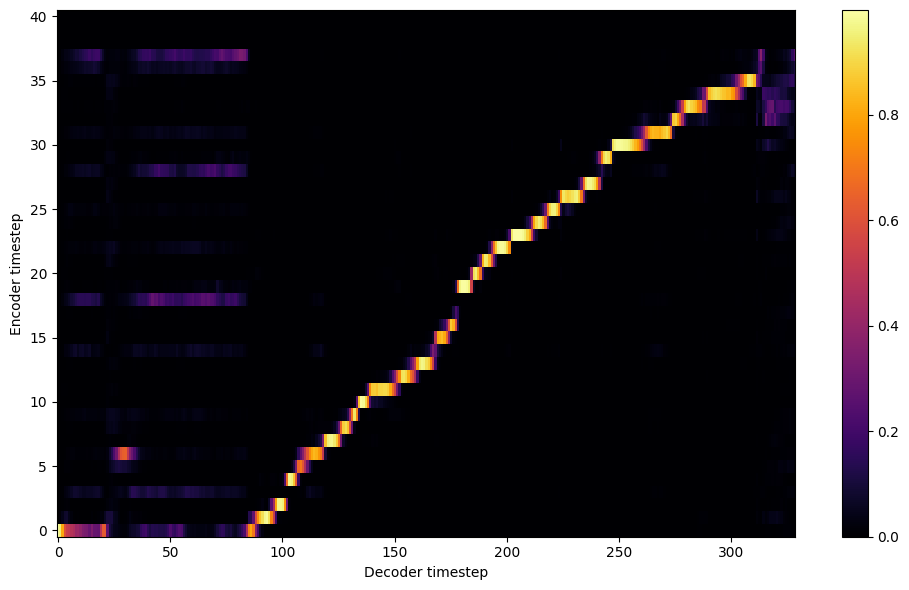


Starting Epoch: 164 Iteration: 1968


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 164 Validation loss 1980:  0.109352  Time: 0.5m LR: 0.000300


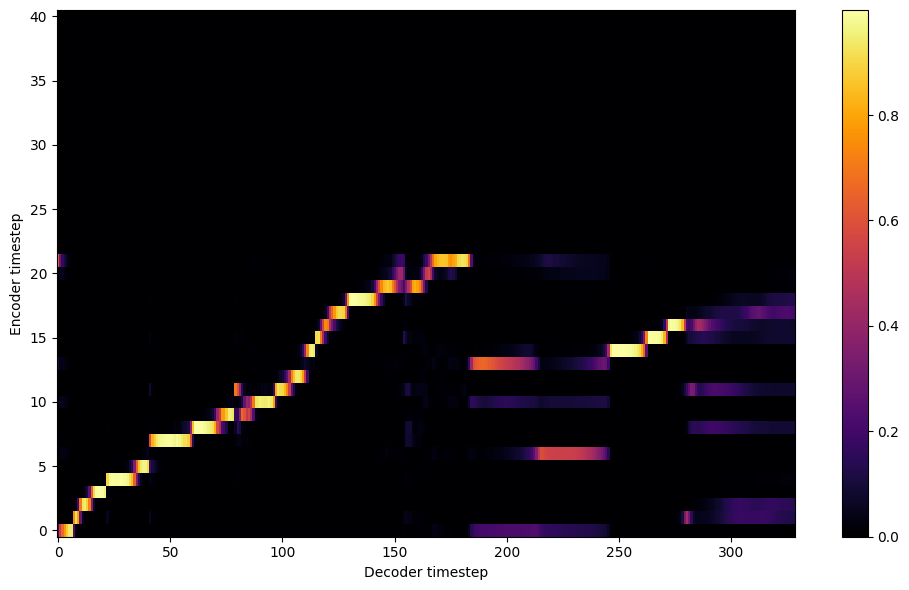


Starting Epoch: 165 Iteration: 1980


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 165 Validation loss 1992:  0.109083  Time: 0.5m LR: 0.000300


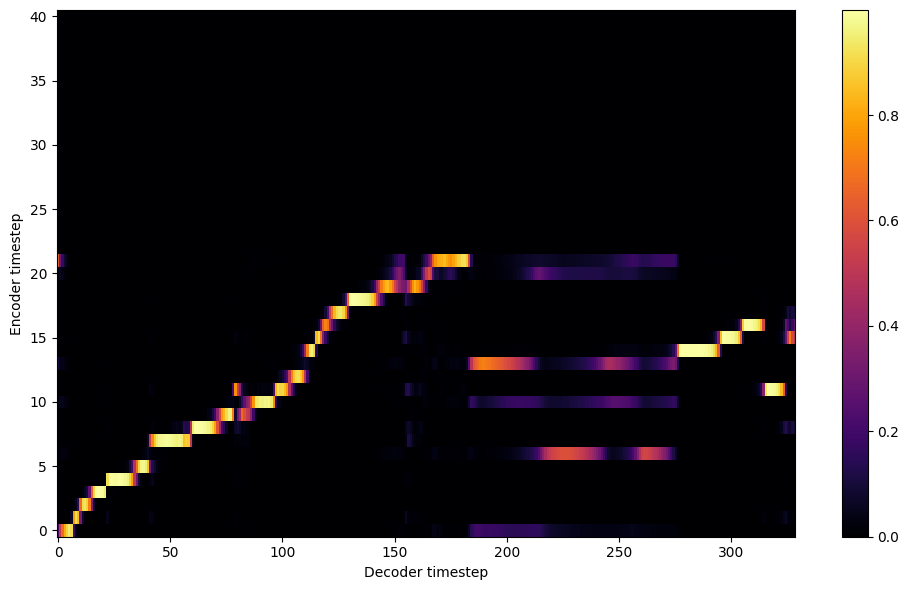


Starting Epoch: 166 Iteration: 1992


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 166 Validation loss 2004:  0.108911  Time: 0.4m LR: 0.000300


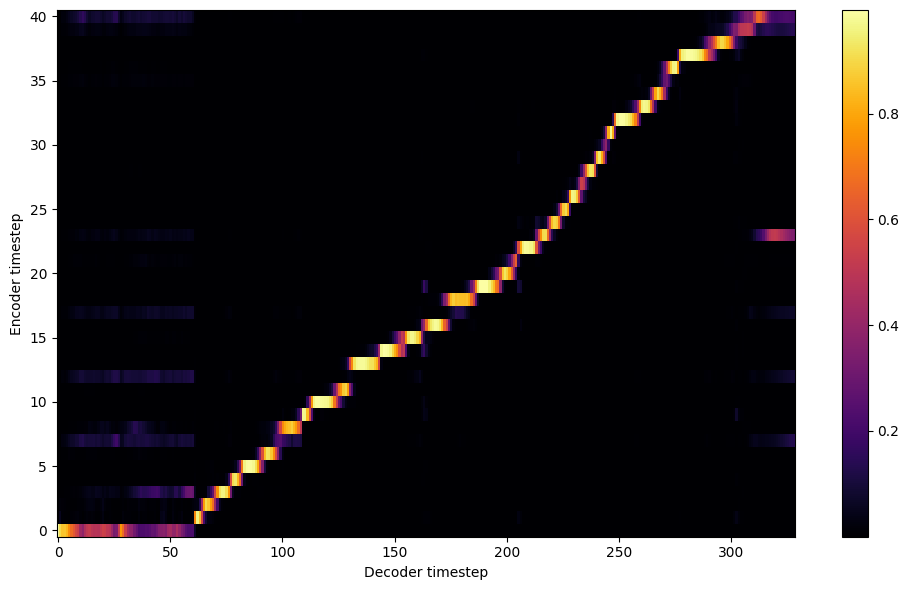


Starting Epoch: 167 Iteration: 2004


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 167 Validation loss 2016:  0.109157  Time: 0.5m LR: 0.000300


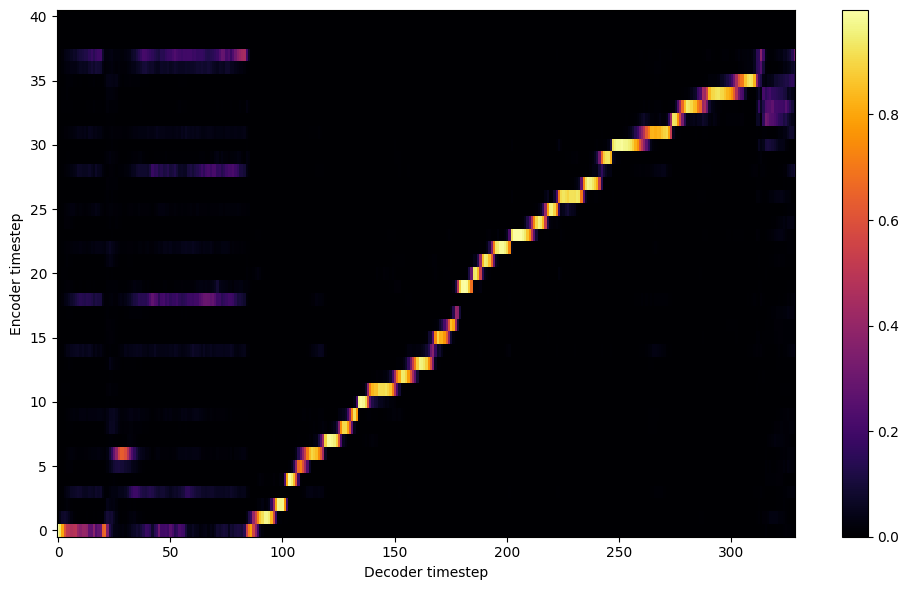


Starting Epoch: 168 Iteration: 2016


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 168 Validation loss 2028:  0.109145  Time: 0.5m LR: 0.000300


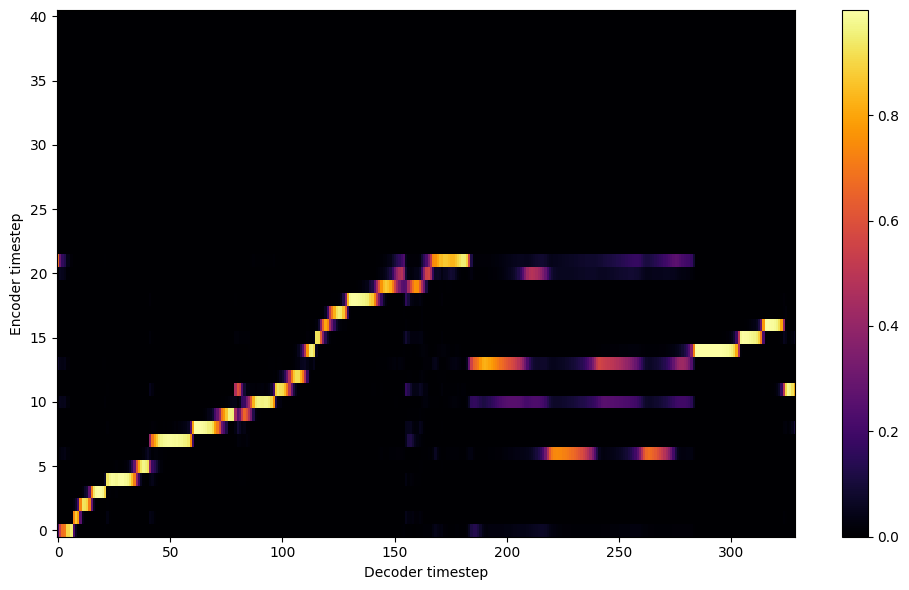


Starting Epoch: 169 Iteration: 2028


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 169 Validation loss 2040:  0.107409  Time: 0.5m LR: 0.000300


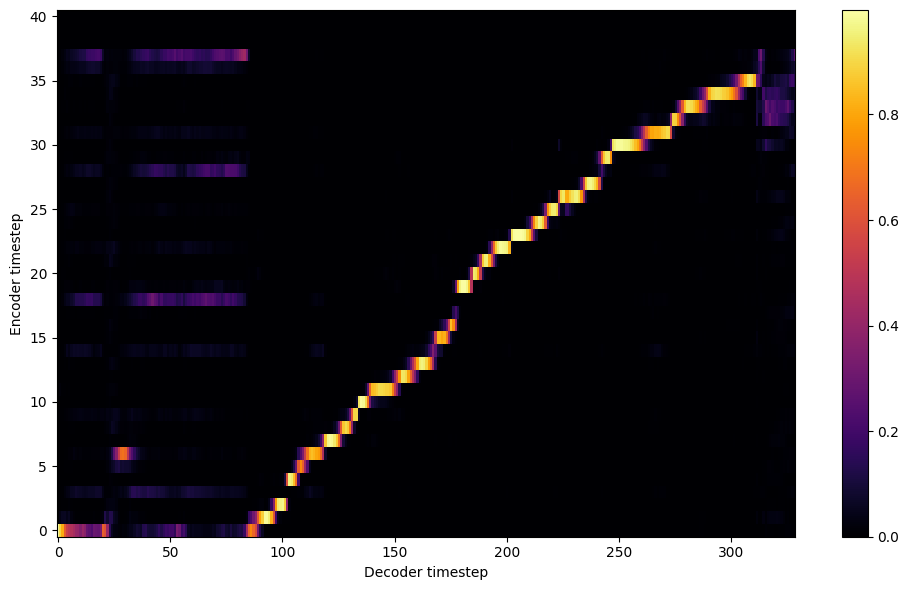

Saving model and optimizer state at iteration 2040 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 170 Iteration: 2040


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 170 Validation loss 2052:  0.106519  Time: 0.5m LR: 0.000300


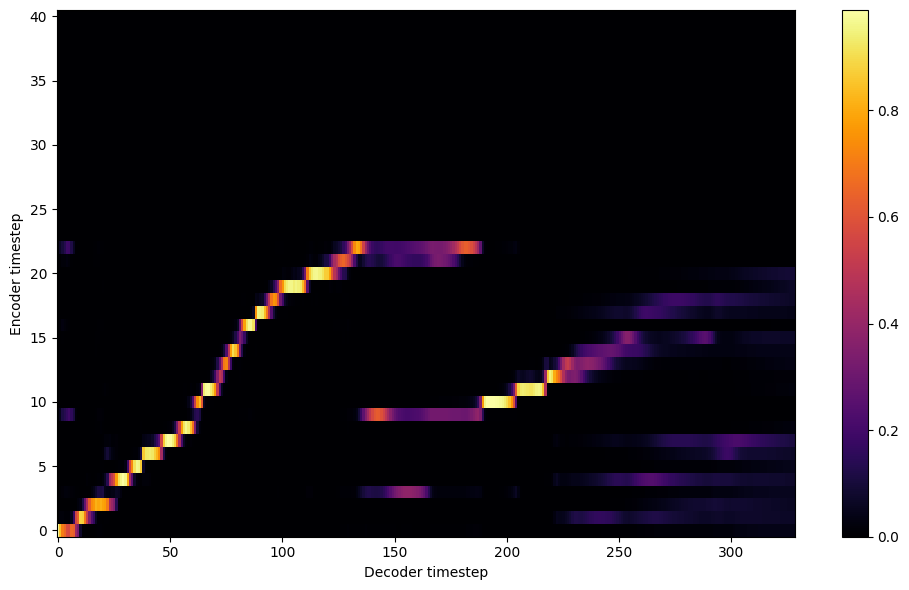


Starting Epoch: 171 Iteration: 2052


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 171 Validation loss 2064:  0.106101  Time: 0.5m LR: 0.000300


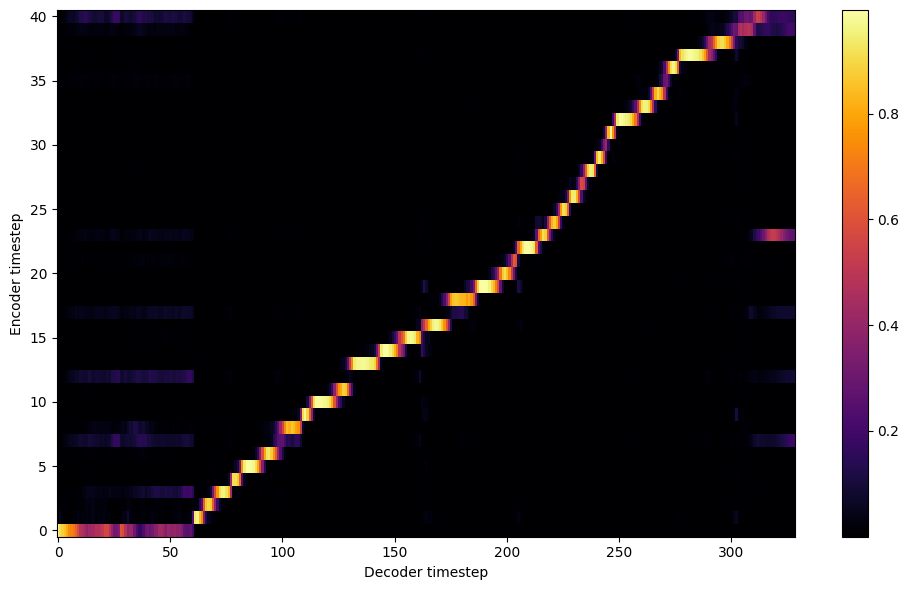


Starting Epoch: 172 Iteration: 2064


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 172 Validation loss 2076:  0.105860  Time: 0.5m LR: 0.000300


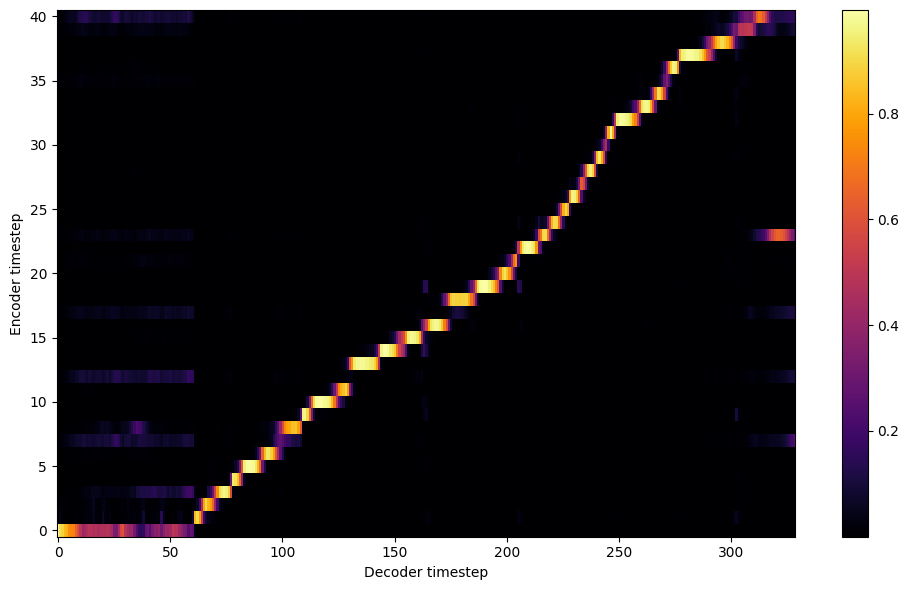


Starting Epoch: 173 Iteration: 2076


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 173 Validation loss 2088:  0.104902  Time: 0.4m LR: 0.000300


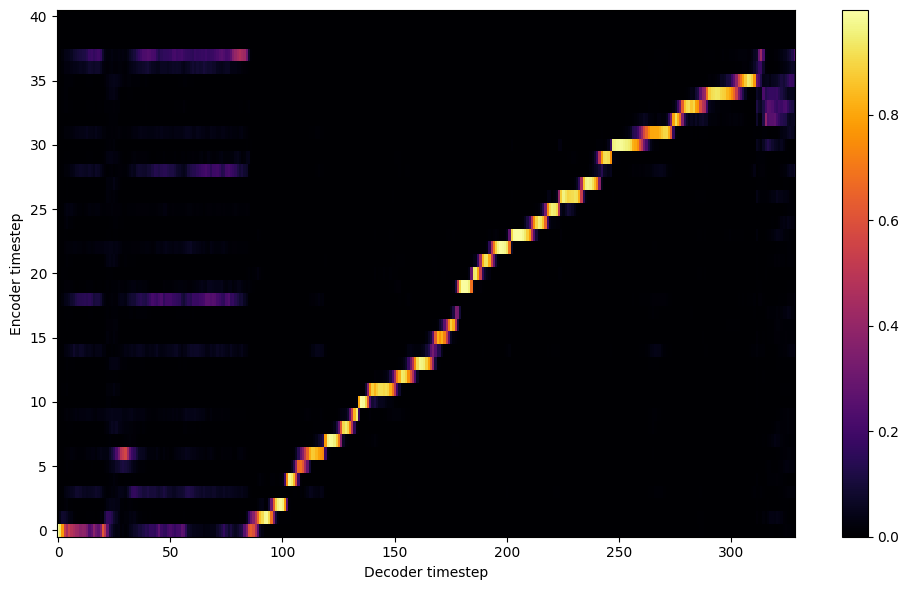


Starting Epoch: 174 Iteration: 2088


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 174 Validation loss 2100:  0.105324  Time: 0.5m LR: 0.000300


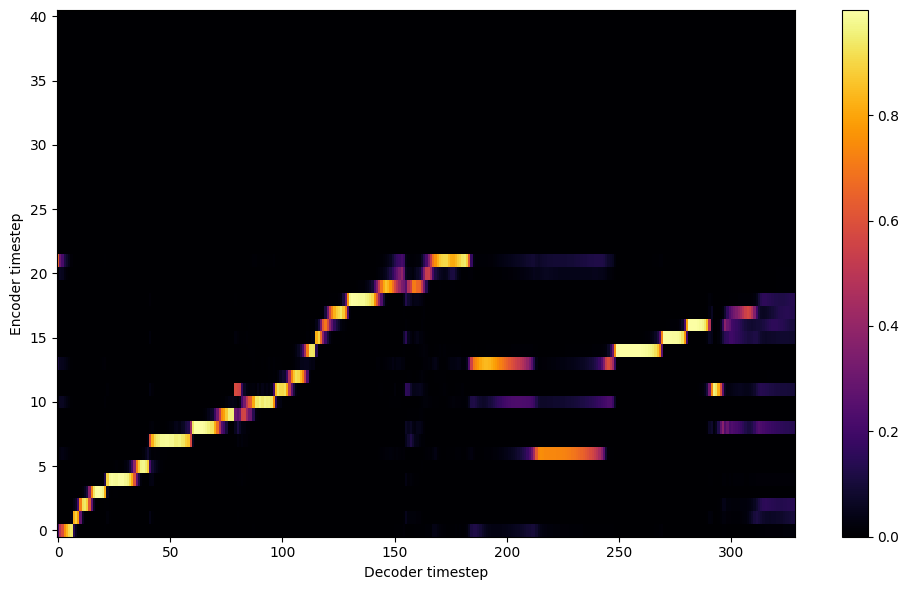


Starting Epoch: 175 Iteration: 2100


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 175 Validation loss 2112:  0.104998  Time: 0.5m LR: 0.000300


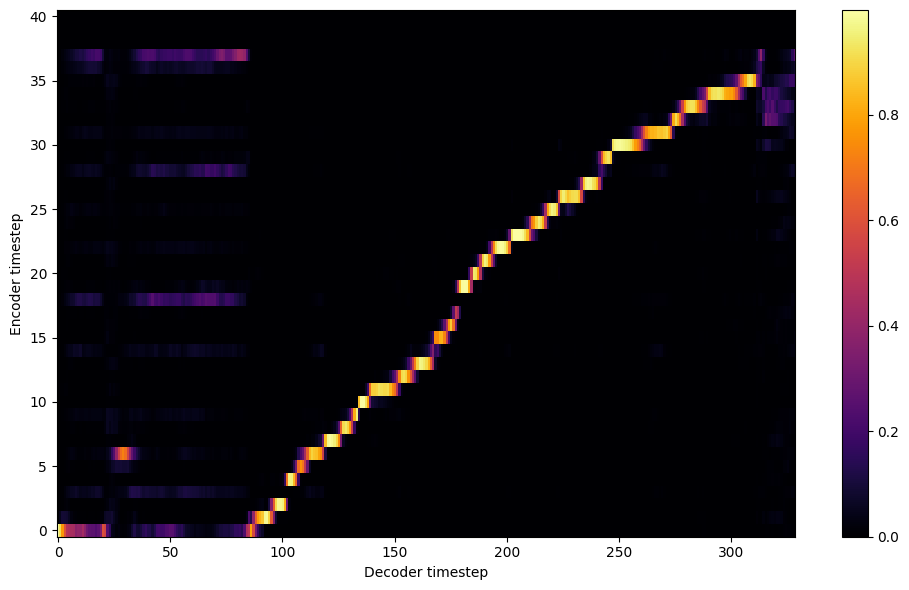


Starting Epoch: 176 Iteration: 2112


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 176 Validation loss 2124:  0.105161  Time: 0.5m LR: 0.000300


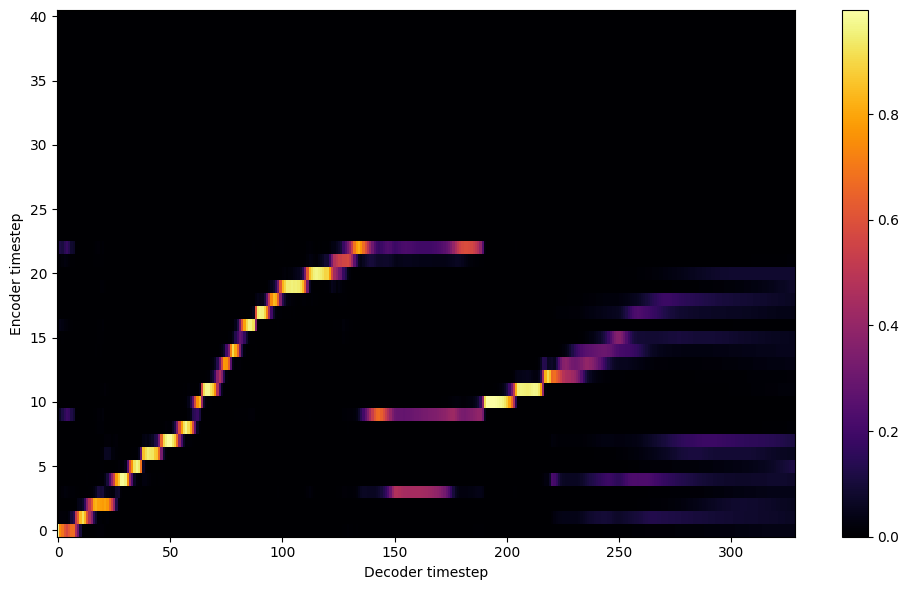


Starting Epoch: 177 Iteration: 2124


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 177 Validation loss 2136:  0.105034  Time: 0.5m LR: 0.000300


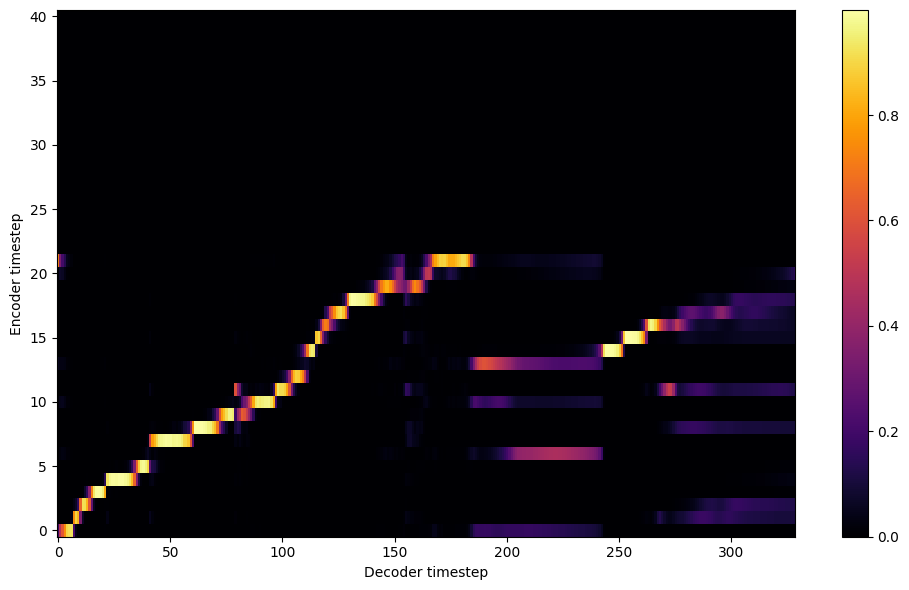


Starting Epoch: 178 Iteration: 2136


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 178 Validation loss 2148:  0.104113  Time: 0.5m LR: 0.000300


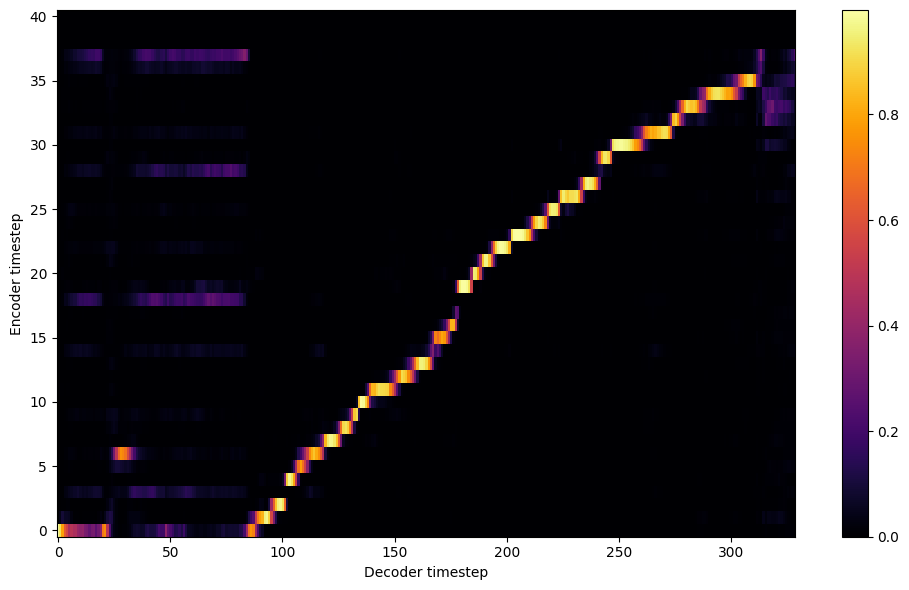


Starting Epoch: 179 Iteration: 2148


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 179 Validation loss 2160:  0.103963  Time: 0.5m LR: 0.000300


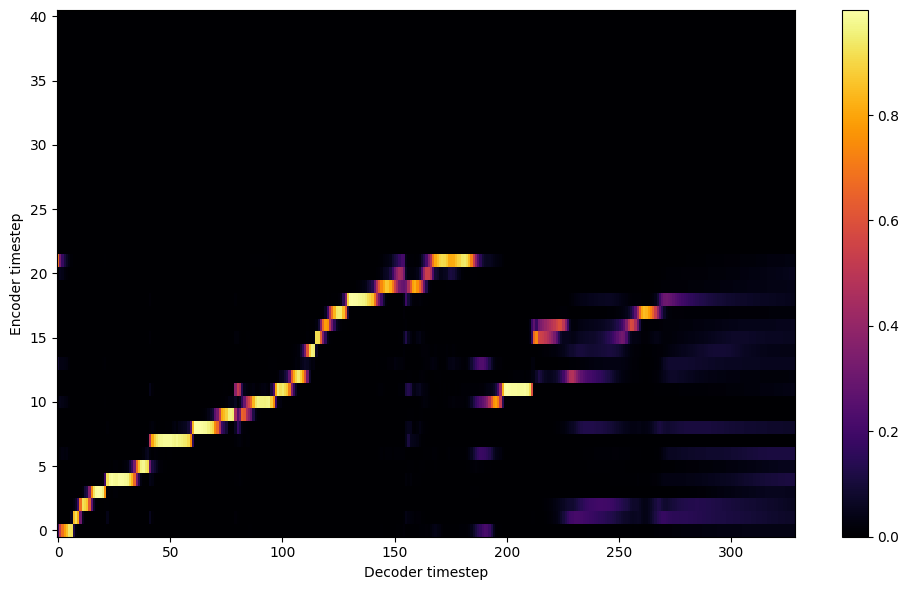

Saving model and optimizer state at iteration 2160 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 180 Iteration: 2160


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 180 Validation loss 2172:  0.103409  Time: 0.5m LR: 0.000300


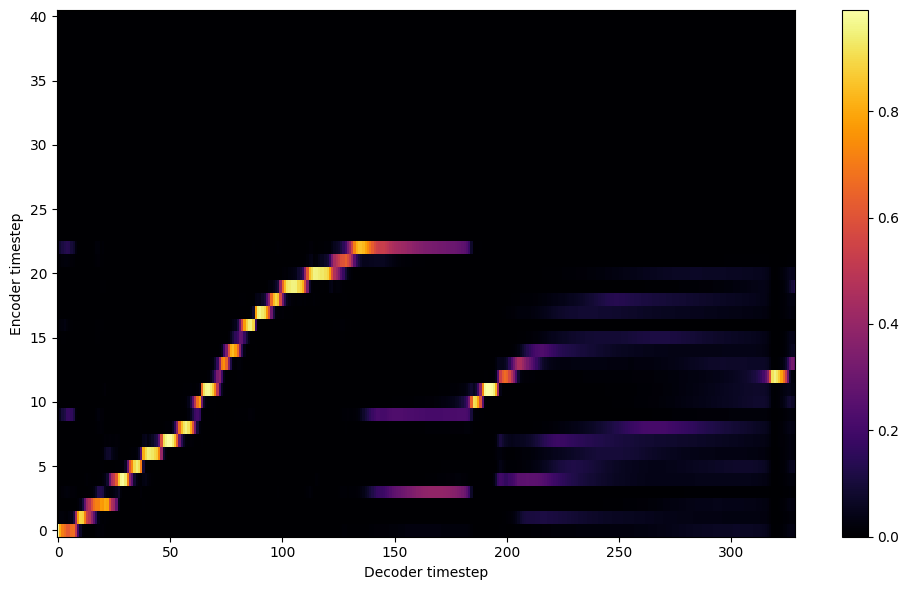


Starting Epoch: 181 Iteration: 2172


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 181 Validation loss 2184:  0.103824  Time: 0.5m LR: 0.000300


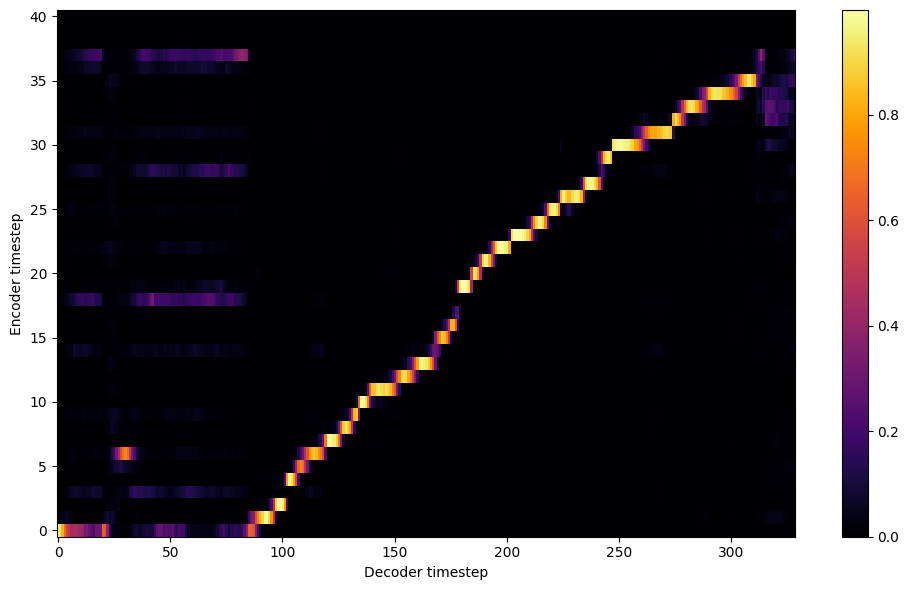


Starting Epoch: 182 Iteration: 2184


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 182 Validation loss 2196:  0.102581  Time: 0.5m LR: 0.000300


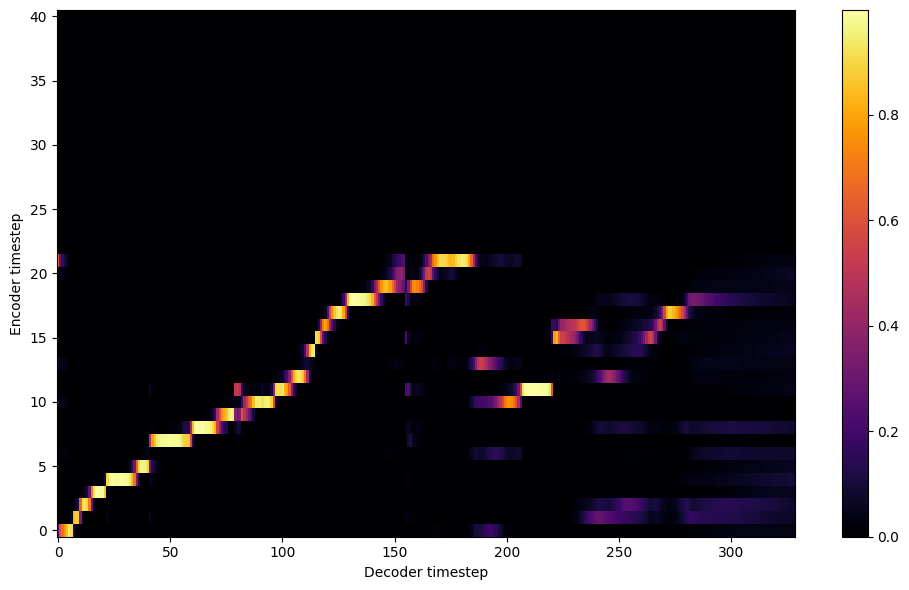


Starting Epoch: 183 Iteration: 2196


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 183 Validation loss 2208:  0.102220  Time: 0.5m LR: 0.000300


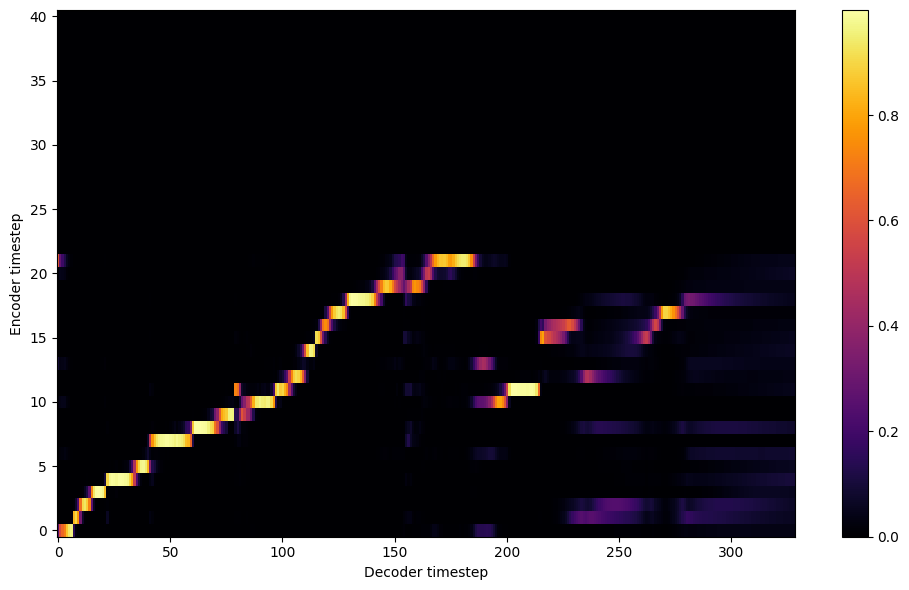


Starting Epoch: 184 Iteration: 2208


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 184 Validation loss 2220:  0.101925  Time: 0.5m LR: 0.000300


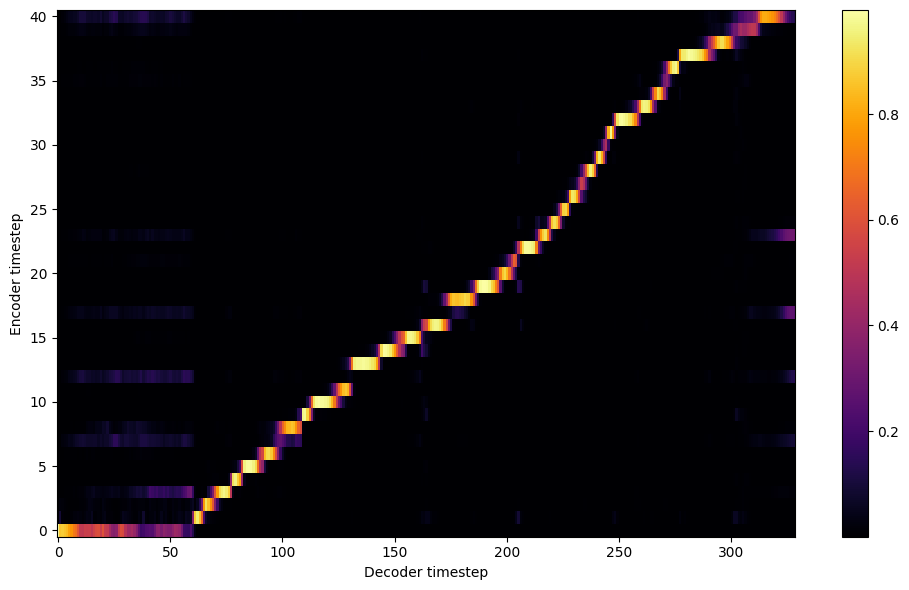


Starting Epoch: 185 Iteration: 2220


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 185 Validation loss 2232:  0.102321  Time: 0.5m LR: 0.000300


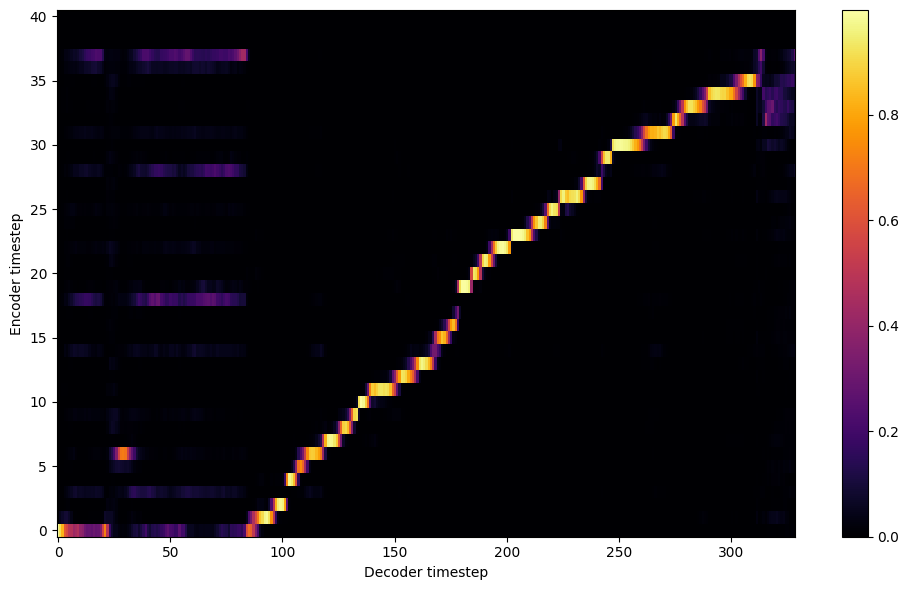


Starting Epoch: 186 Iteration: 2232


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 186 Validation loss 2244:  0.101940  Time: 0.5m LR: 0.000300


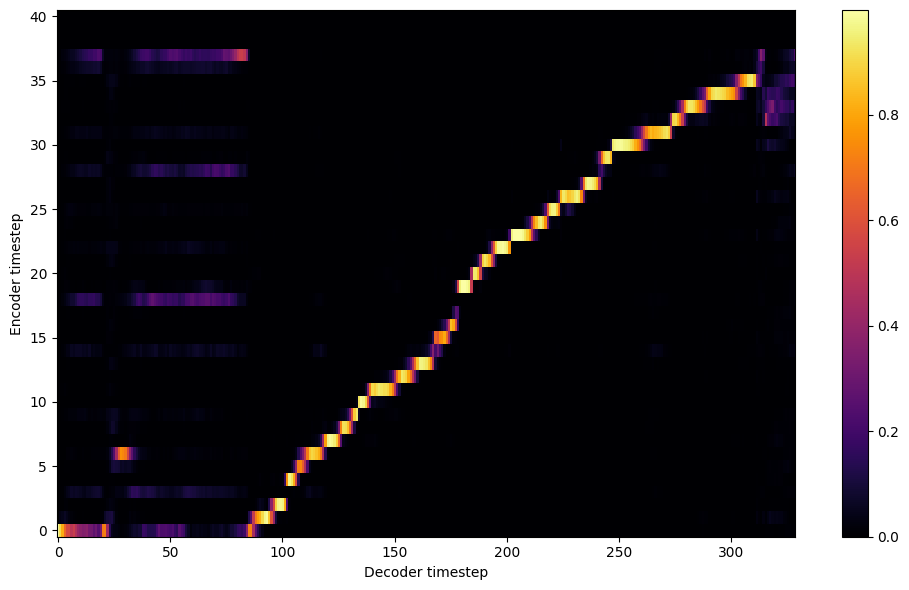


Starting Epoch: 187 Iteration: 2244


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 187 Validation loss 2256:  0.101817  Time: 0.5m LR: 0.000300


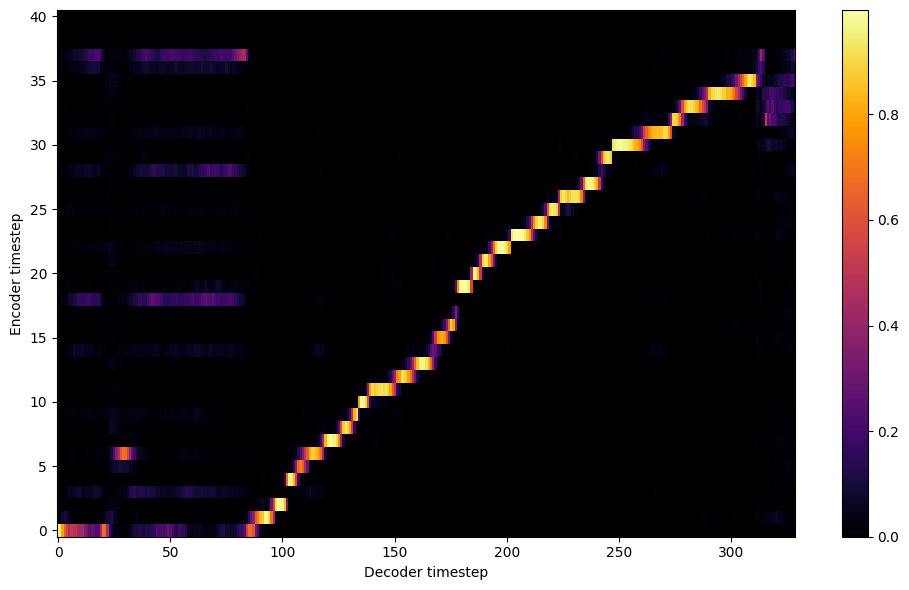


Starting Epoch: 188 Iteration: 2256


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 188 Validation loss 2268:  0.101161  Time: 0.5m LR: 0.000300


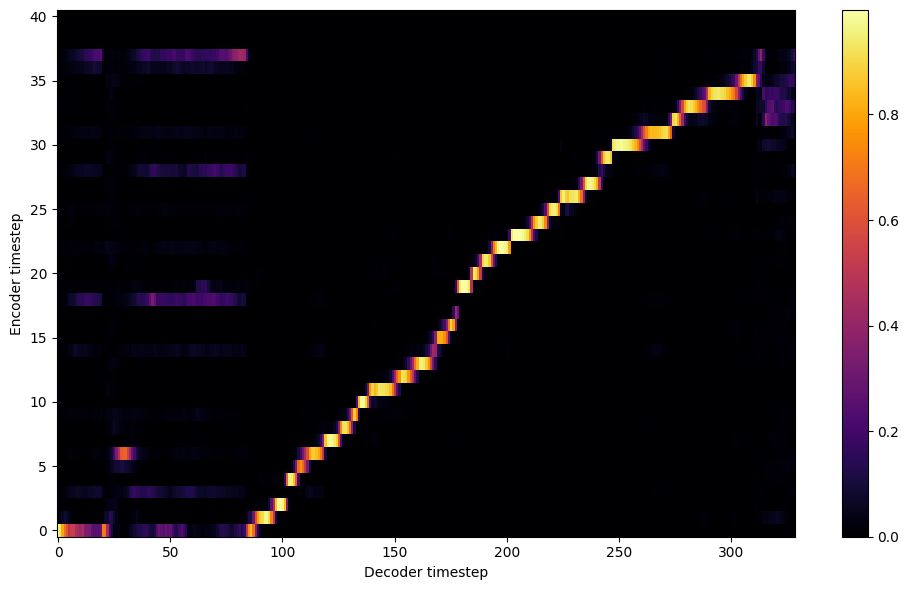


Starting Epoch: 189 Iteration: 2268


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 189 Validation loss 2280:  0.101680  Time: 0.5m LR: 0.000300


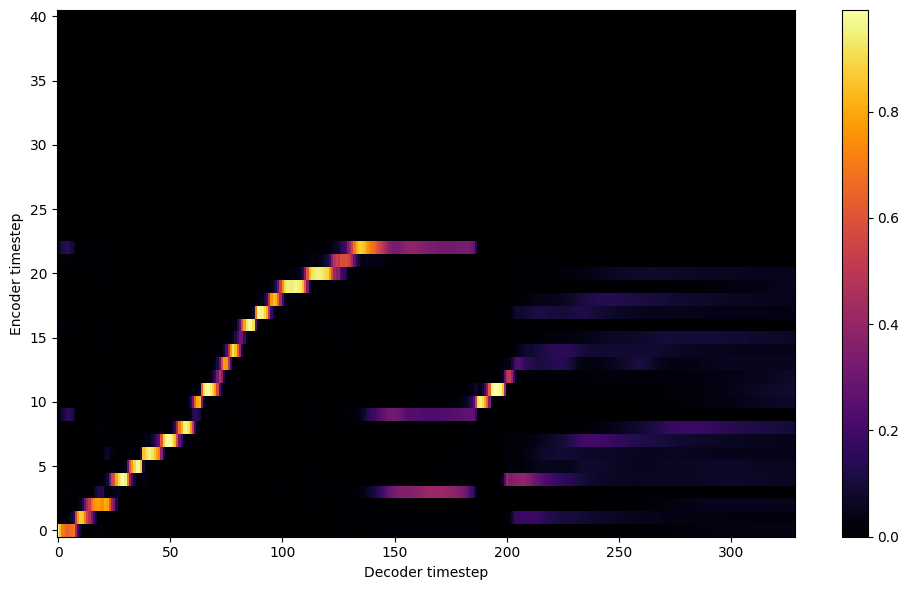

Saving model and optimizer state at iteration 2280 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 190 Iteration: 2280


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 190 Validation loss 2292:  0.102518  Time: 0.5m LR: 0.000300


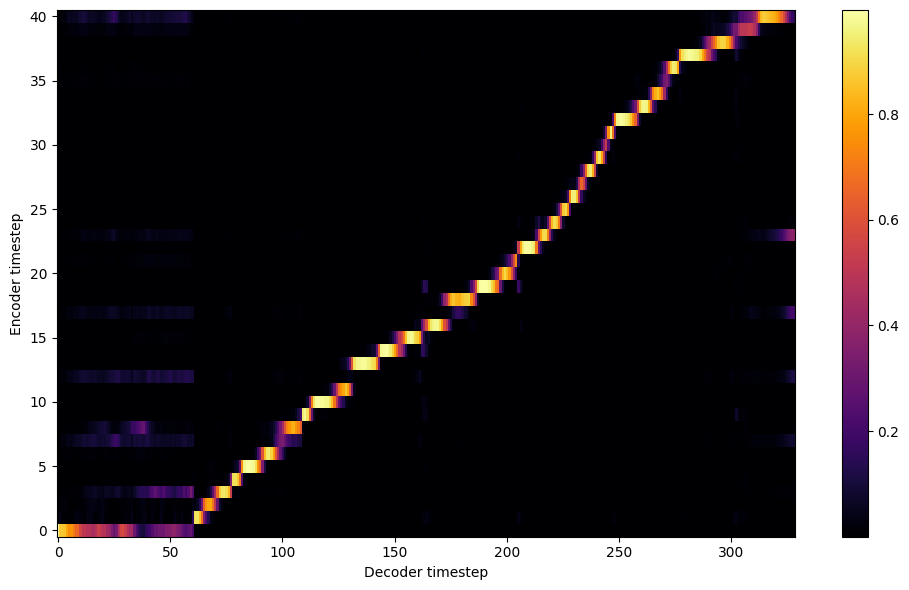


Starting Epoch: 191 Iteration: 2292


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 191 Validation loss 2304:  0.100561  Time: 0.5m LR: 0.000300


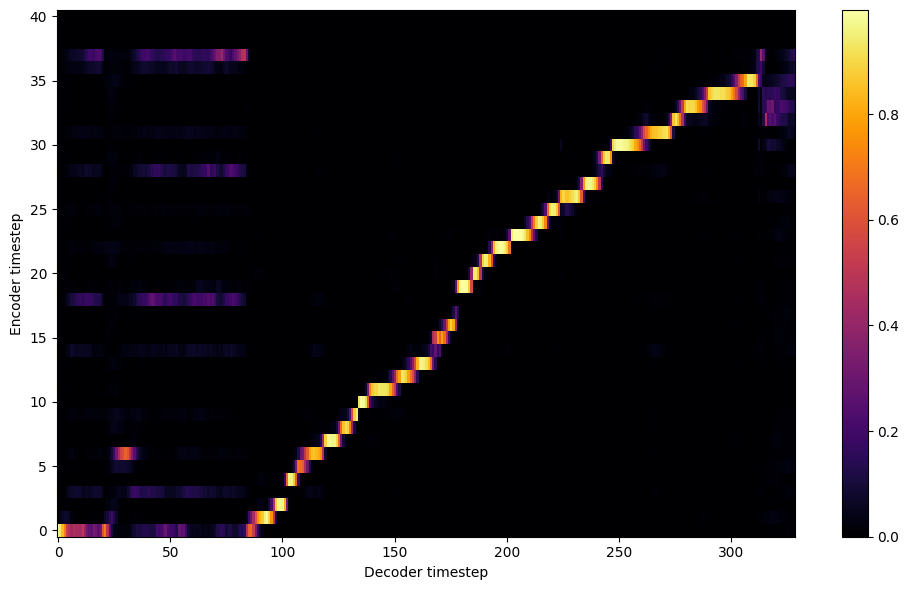


Starting Epoch: 192 Iteration: 2304


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 192 Validation loss 2316:  0.101763  Time: 0.5m LR: 0.000300


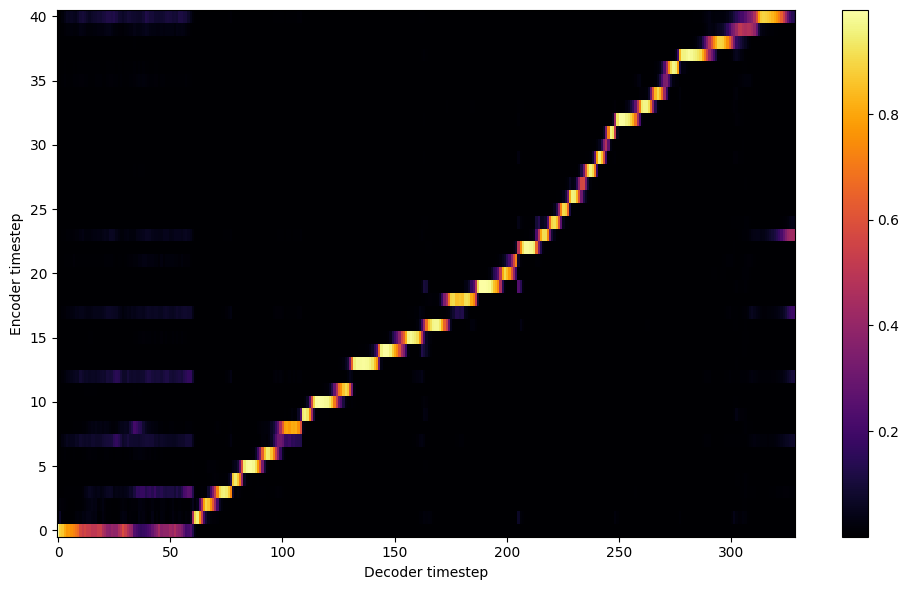


Starting Epoch: 193 Iteration: 2316


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 193 Validation loss 2328:  0.100450  Time: 0.5m LR: 0.000300


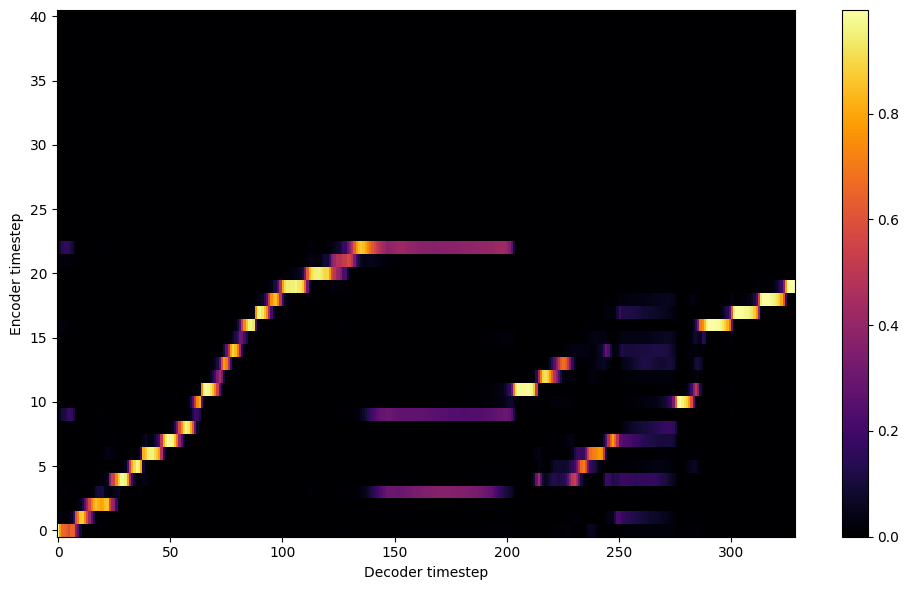


Starting Epoch: 194 Iteration: 2328


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 194 Validation loss 2340:  0.101764  Time: 0.5m LR: 0.000300


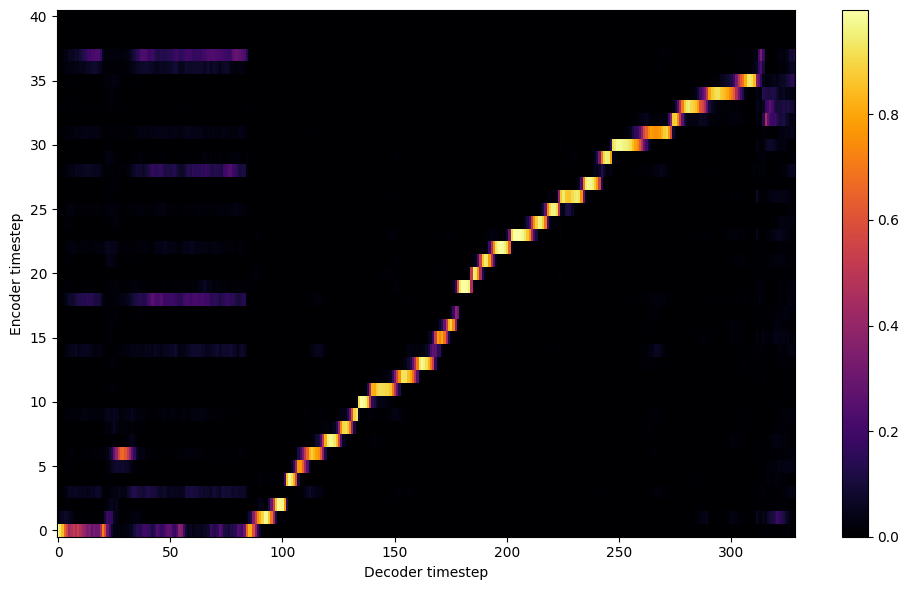


Starting Epoch: 195 Iteration: 2340


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 195 Validation loss 2352:  0.102359  Time: 0.5m LR: 0.000300


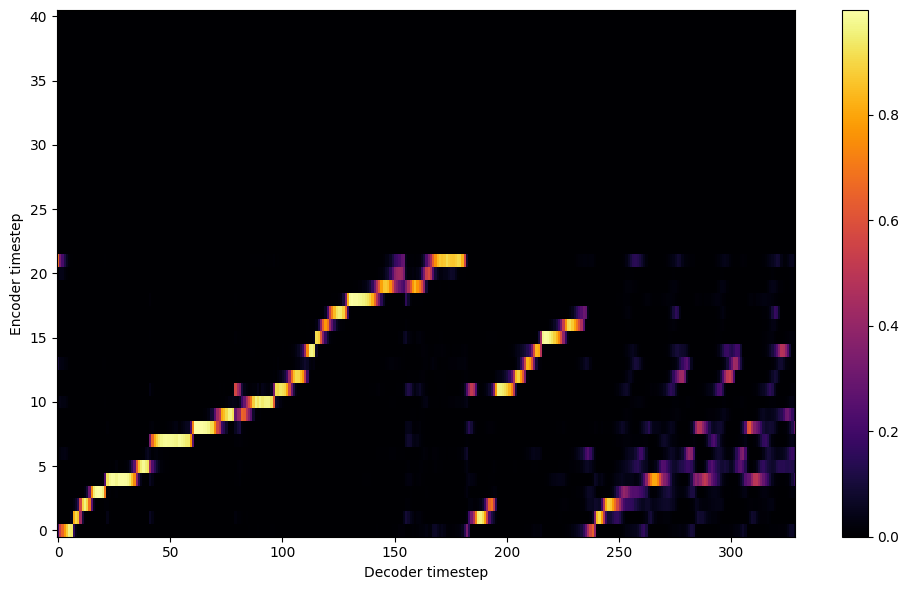


Starting Epoch: 196 Iteration: 2352


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 196 Validation loss 2364:  0.103877  Time: 0.5m LR: 0.000300


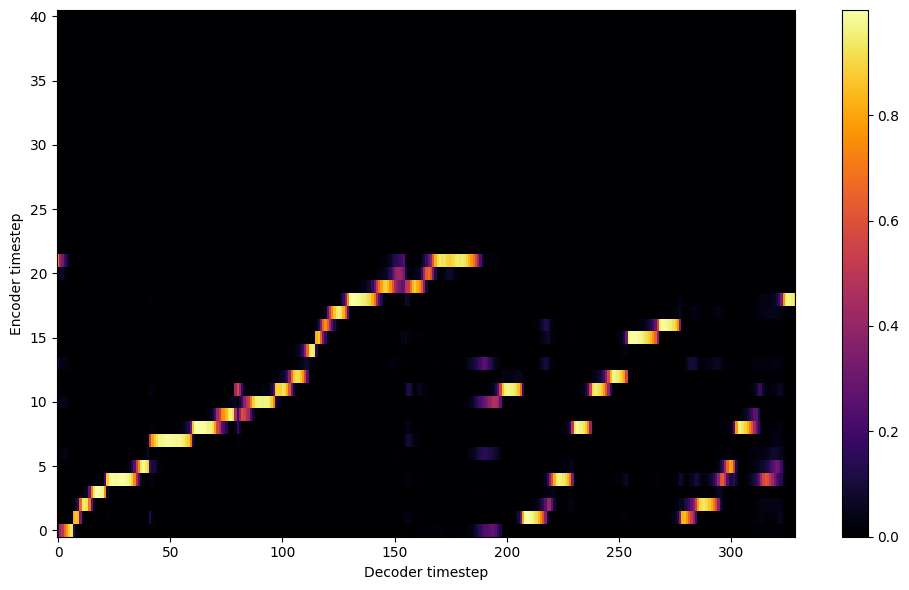


Starting Epoch: 197 Iteration: 2364


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 197 Validation loss 2376:  0.124072  Time: 0.5m LR: 0.000300


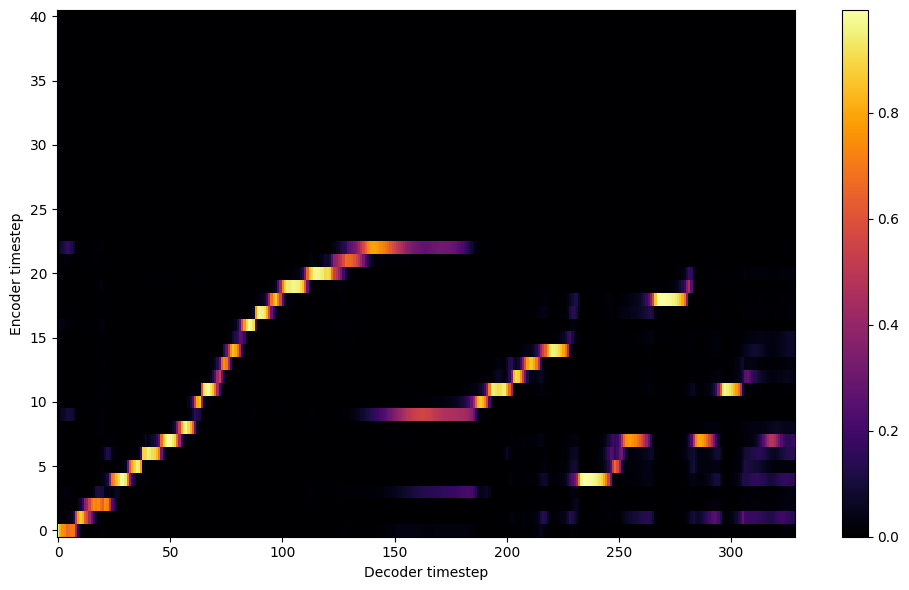


Starting Epoch: 198 Iteration: 2376


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 198 Validation loss 2388:  0.128594  Time: 0.5m LR: 0.000300


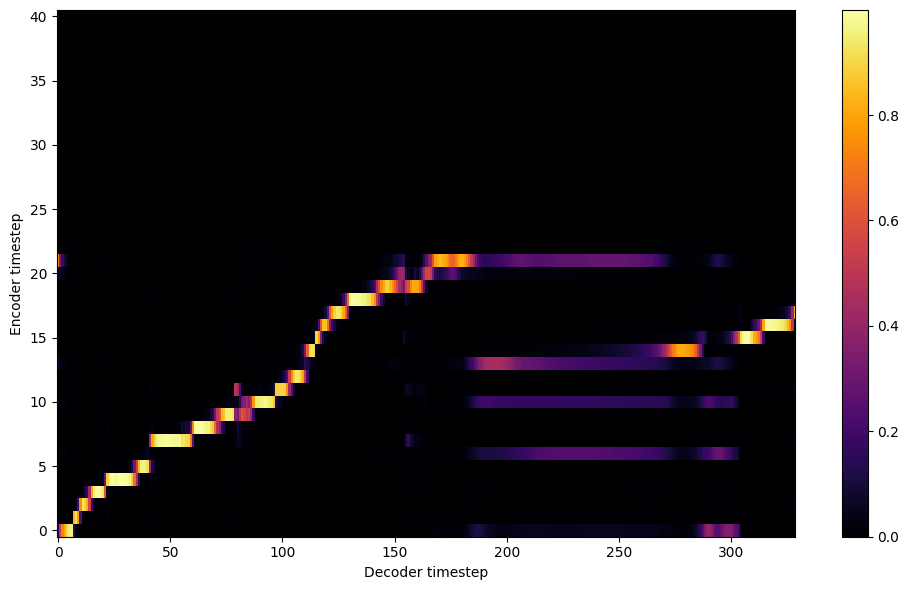


Starting Epoch: 199 Iteration: 2388


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 199 Validation loss 2400:  0.128039  Time: 0.5m LR: 0.000300


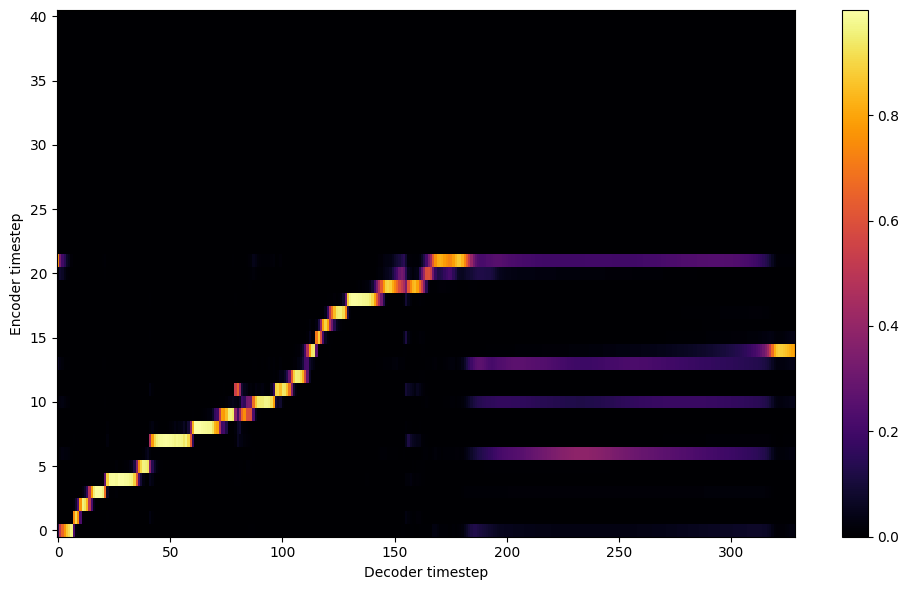

Saving model and optimizer state at iteration 2400 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 200 Iteration: 2400


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 200 Validation loss 2412:  0.129882  Time: 0.5m LR: 0.000300


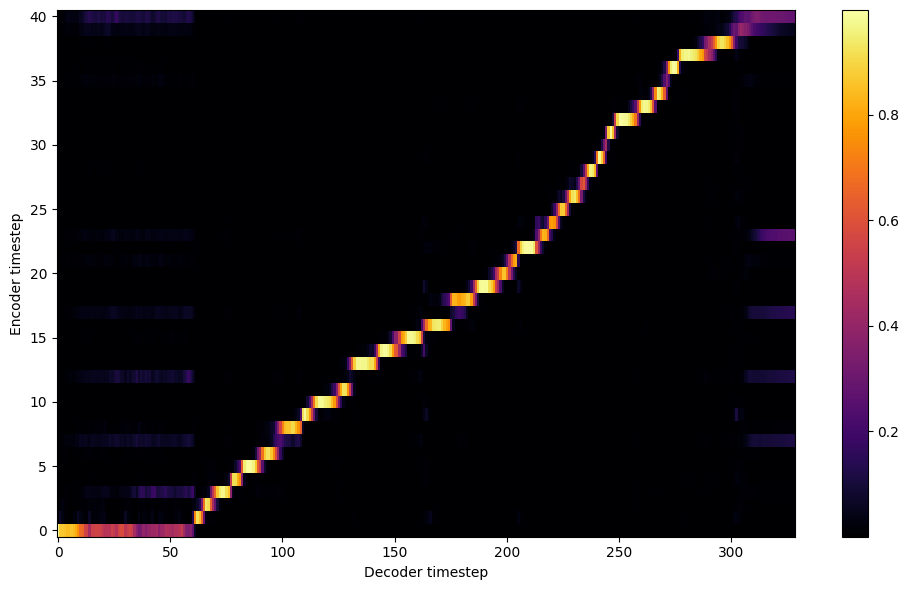


Starting Epoch: 201 Iteration: 2412


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 201 Validation loss 2424:  0.120791  Time: 0.5m LR: 0.000300


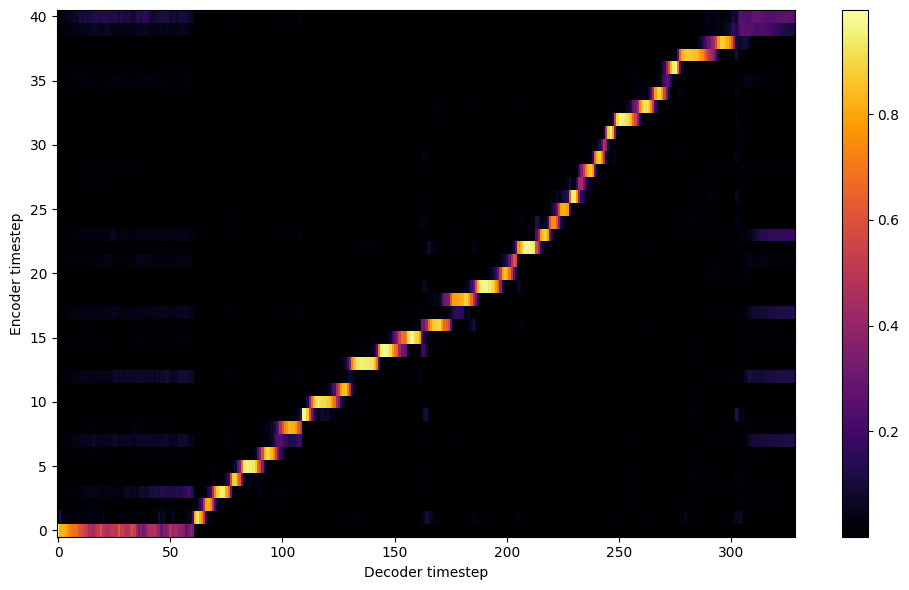


Starting Epoch: 202 Iteration: 2424


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 202 Validation loss 2436:  0.115997  Time: 0.5m LR: 0.000300


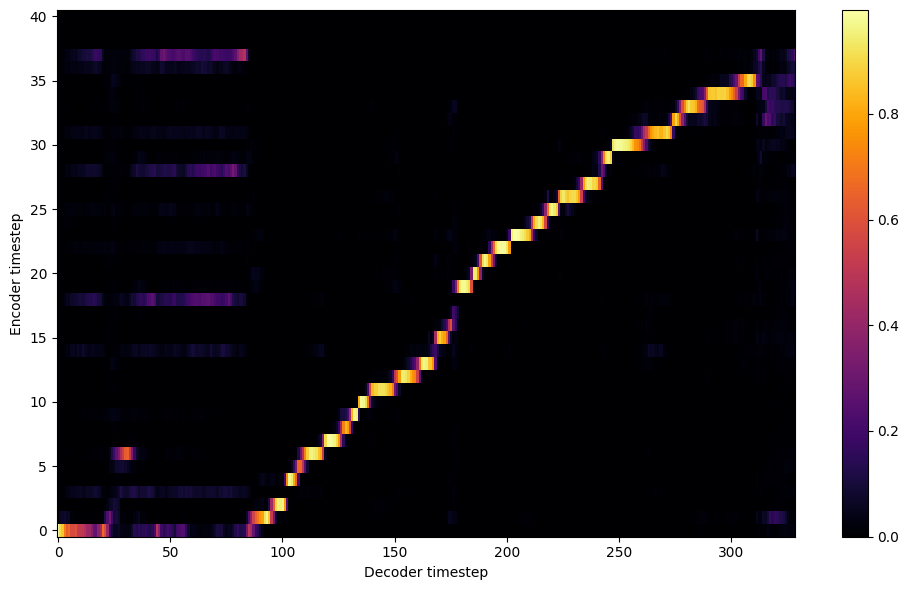


Starting Epoch: 203 Iteration: 2436


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 203 Validation loss 2448:  0.111443  Time: 0.5m LR: 0.000300


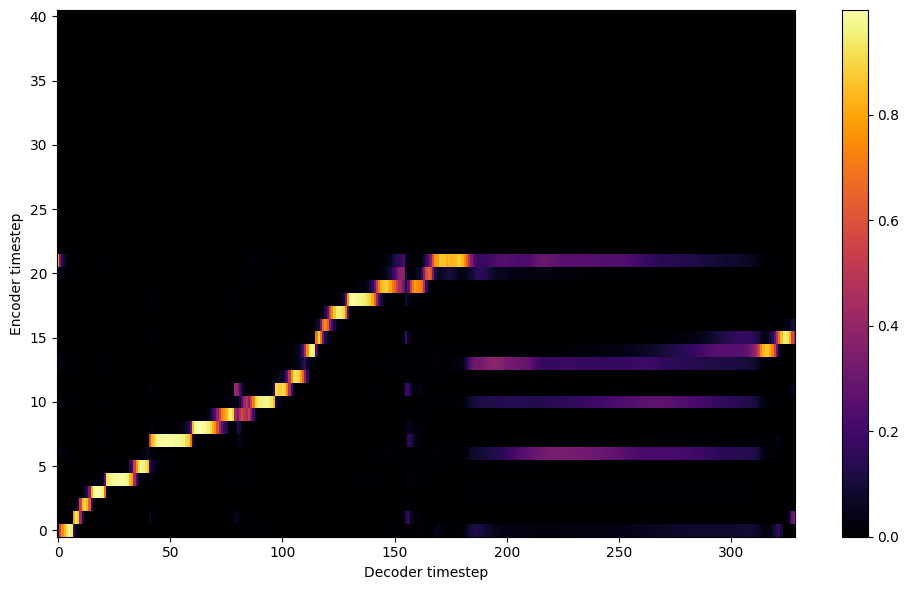


Starting Epoch: 204 Iteration: 2448


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 204 Validation loss 2460:  0.108848  Time: 0.5m LR: 0.000300


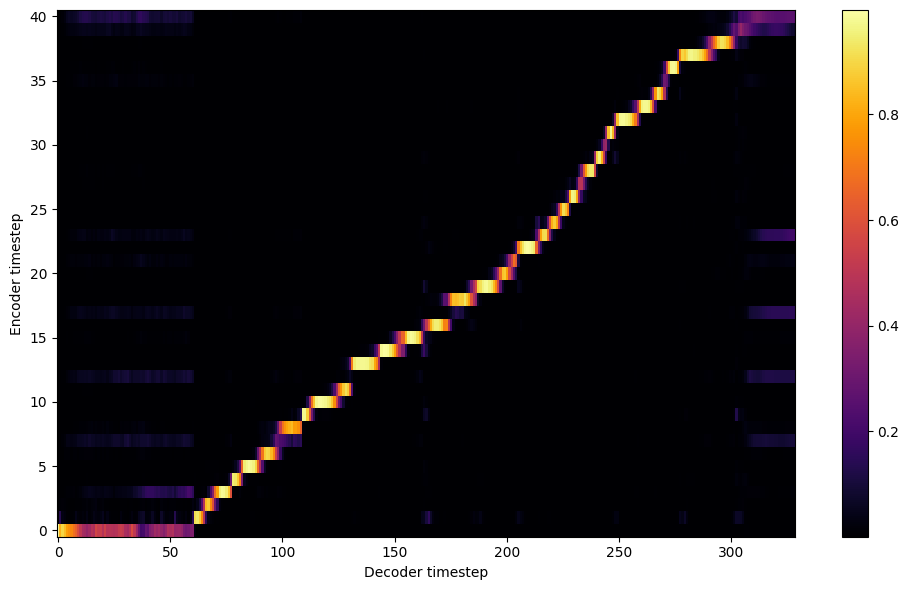


Starting Epoch: 205 Iteration: 2460


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 205 Validation loss 2472:  0.104394  Time: 0.5m LR: 0.000300


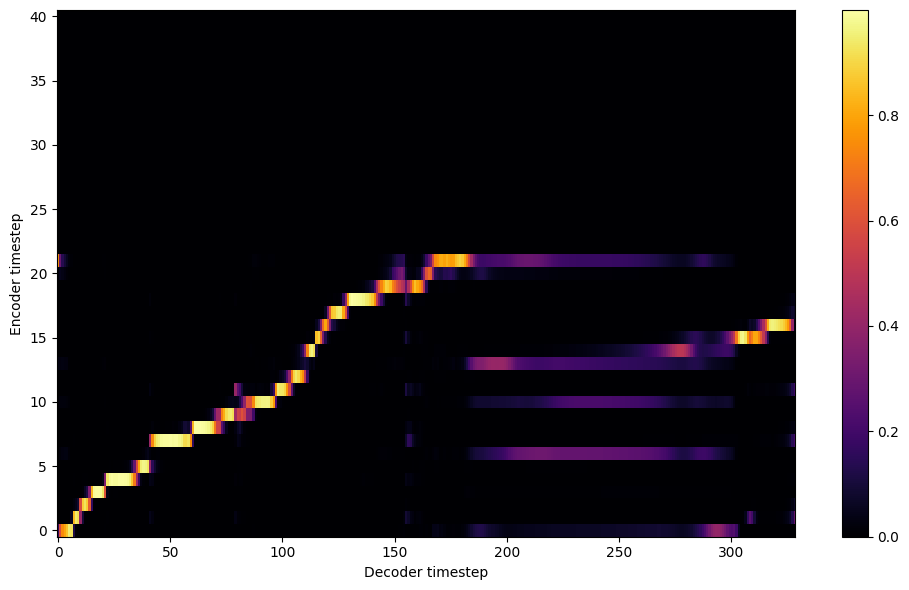


Starting Epoch: 206 Iteration: 2472


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 206 Validation loss 2484:  0.103155  Time: 0.5m LR: 0.000300


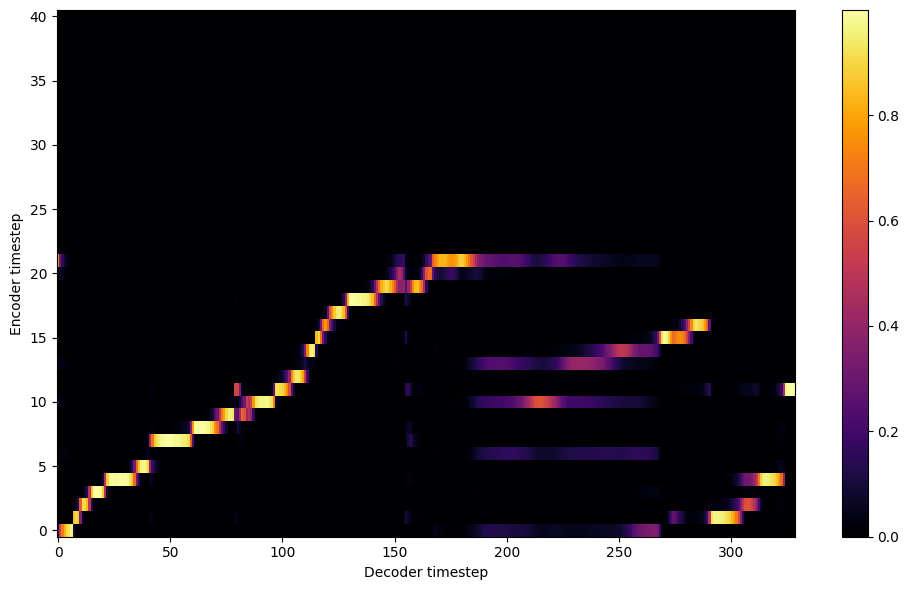


Starting Epoch: 207 Iteration: 2484


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 207 Validation loss 2496:  0.101474  Time: 0.5m LR: 0.000300


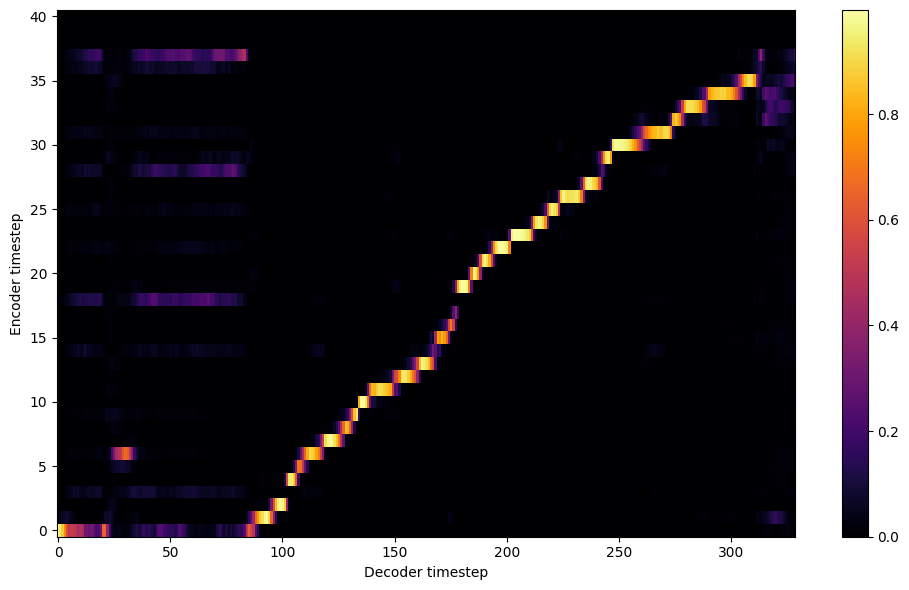


Starting Epoch: 208 Iteration: 2496


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 208 Validation loss 2508:  0.101013  Time: 0.5m LR: 0.000300


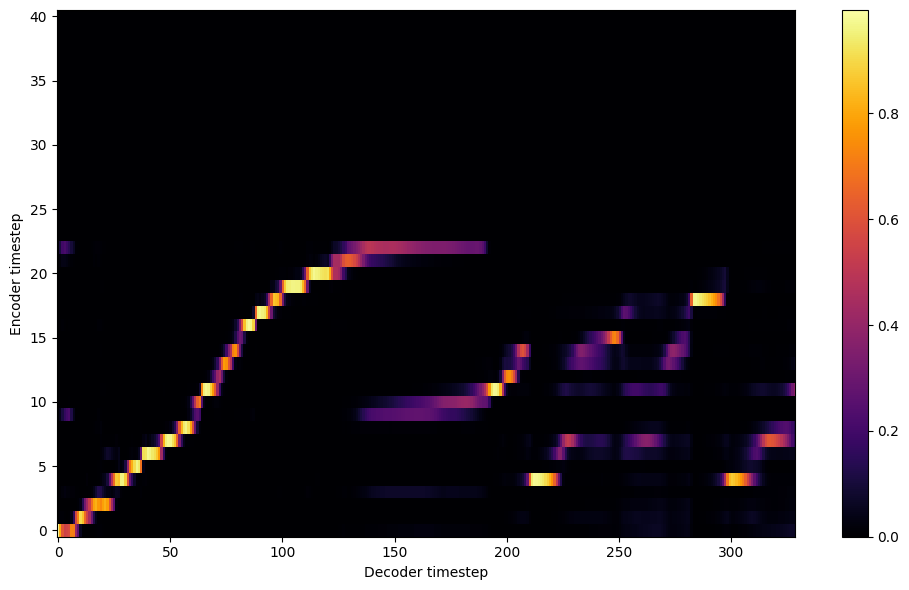


Starting Epoch: 209 Iteration: 2508


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 209 Validation loss 2520:  0.099501  Time: 0.5m LR: 0.000300


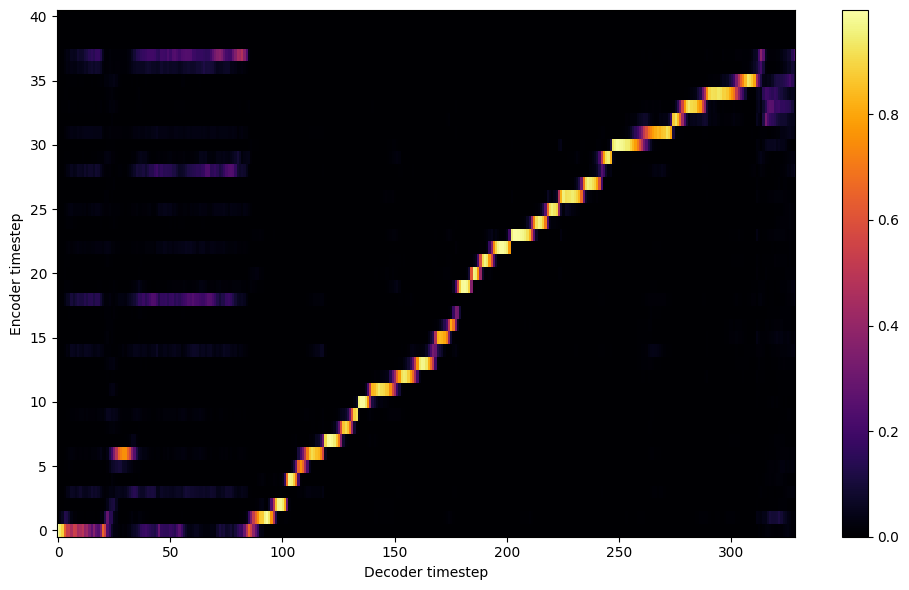

Saving model and optimizer state at iteration 2520 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 210 Iteration: 2520


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 210 Validation loss 2532:  0.099000  Time: 0.5m LR: 0.000300


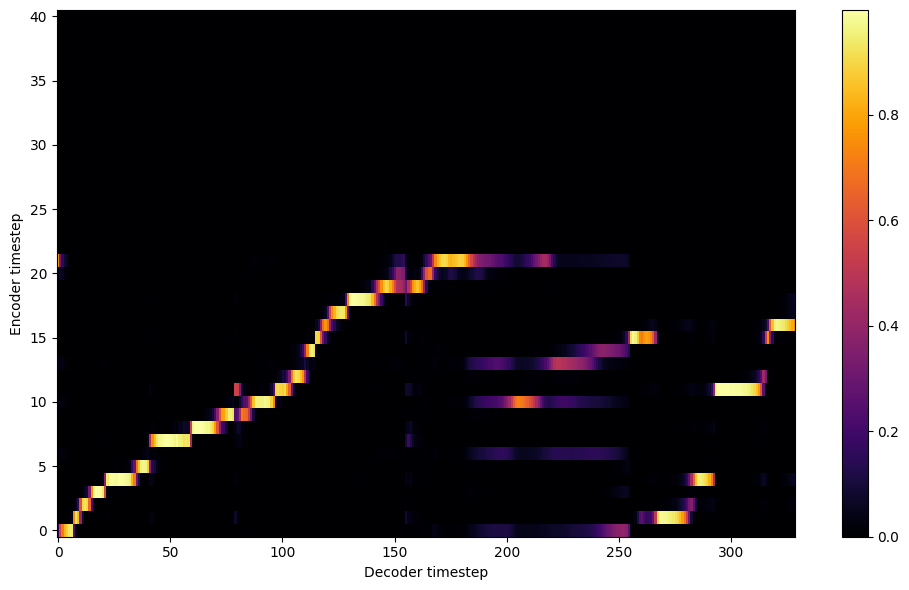


Starting Epoch: 211 Iteration: 2532


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 211 Validation loss 2544:  0.097544  Time: 0.5m LR: 0.000300


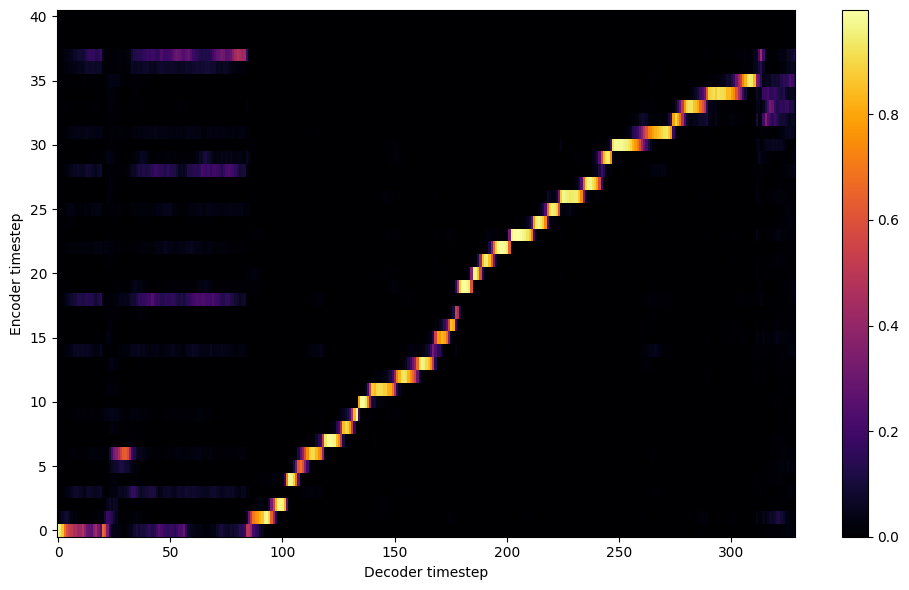


Starting Epoch: 212 Iteration: 2544


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 212 Validation loss 2556:  0.097460  Time: 0.5m LR: 0.000300


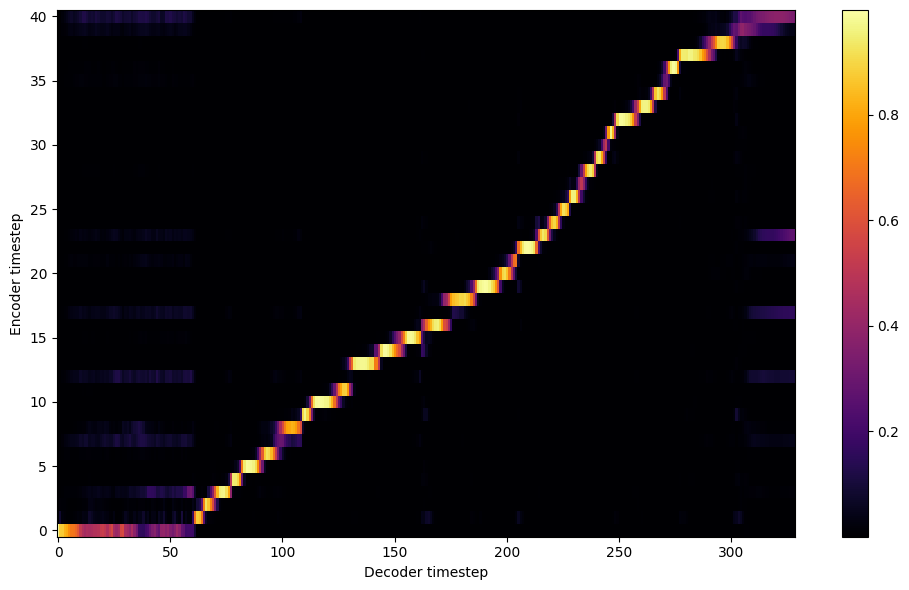


Starting Epoch: 213 Iteration: 2556


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 213 Validation loss 2568:  0.097925  Time: 0.5m LR: 0.000300


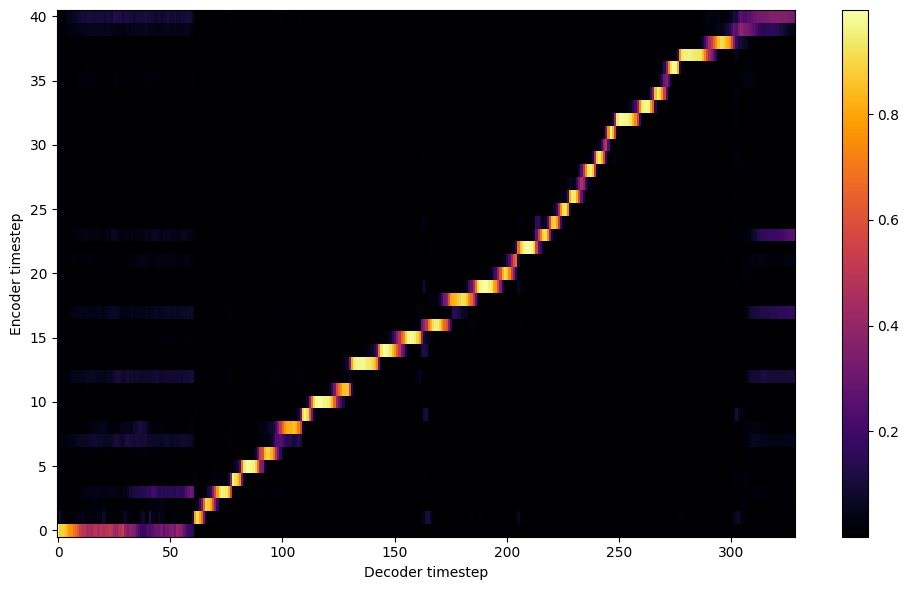


Starting Epoch: 214 Iteration: 2568


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 214 Validation loss 2580:  0.098372  Time: 0.5m LR: 0.000300


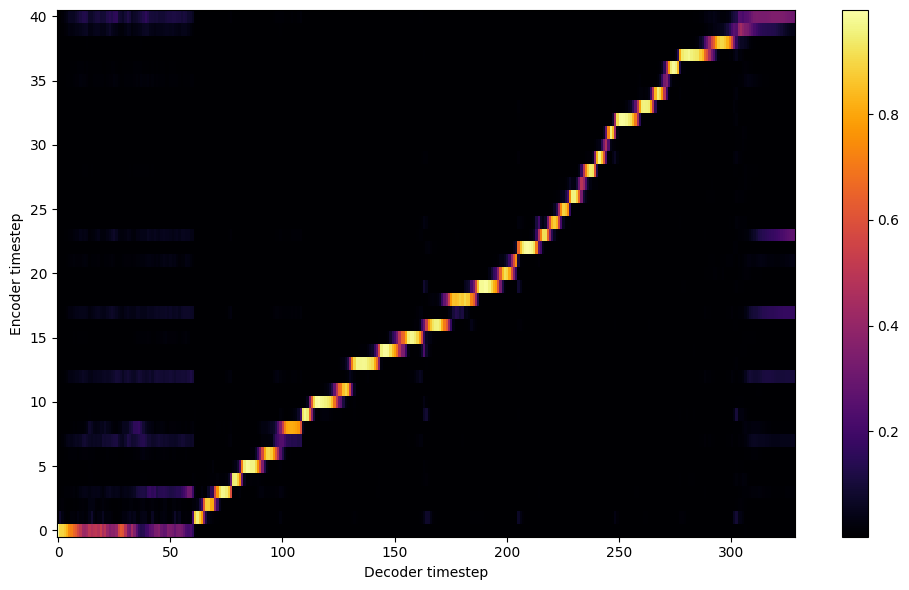


Starting Epoch: 215 Iteration: 2580


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 215 Validation loss 2592:  0.098358  Time: 0.5m LR: 0.000300


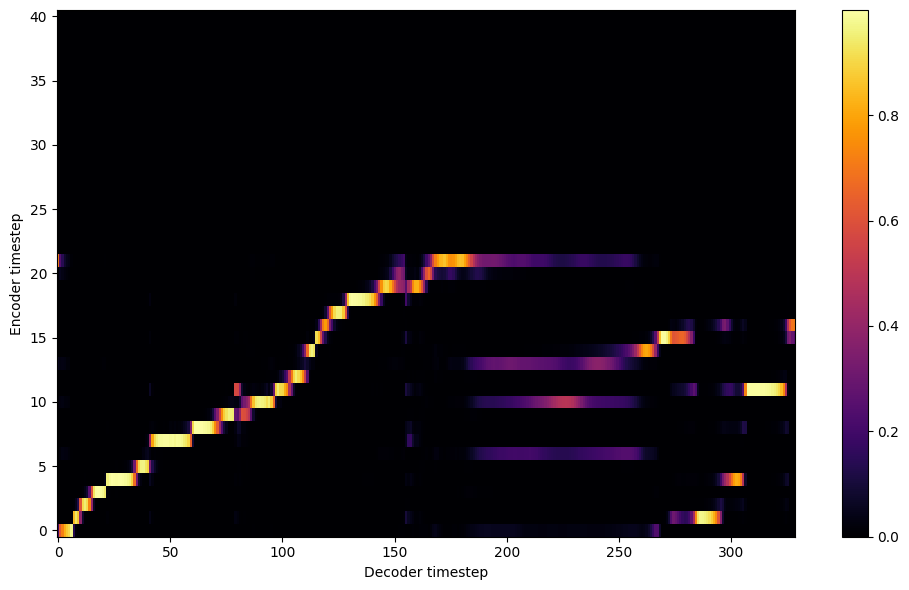


Starting Epoch: 216 Iteration: 2592


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 216 Validation loss 2604:  0.096278  Time: 0.5m LR: 0.000300


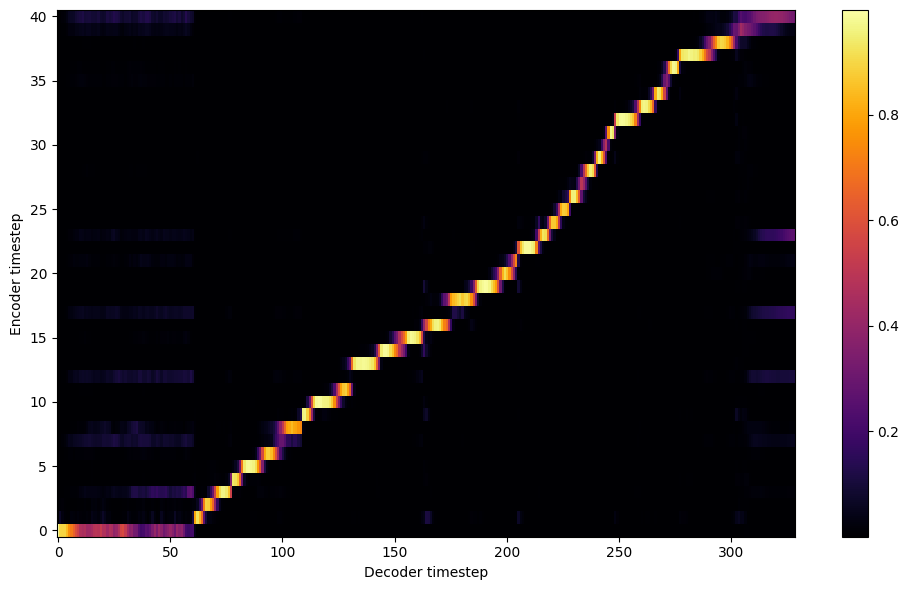


Starting Epoch: 217 Iteration: 2604


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 217 Validation loss 2616:  0.095541  Time: 0.5m LR: 0.000300


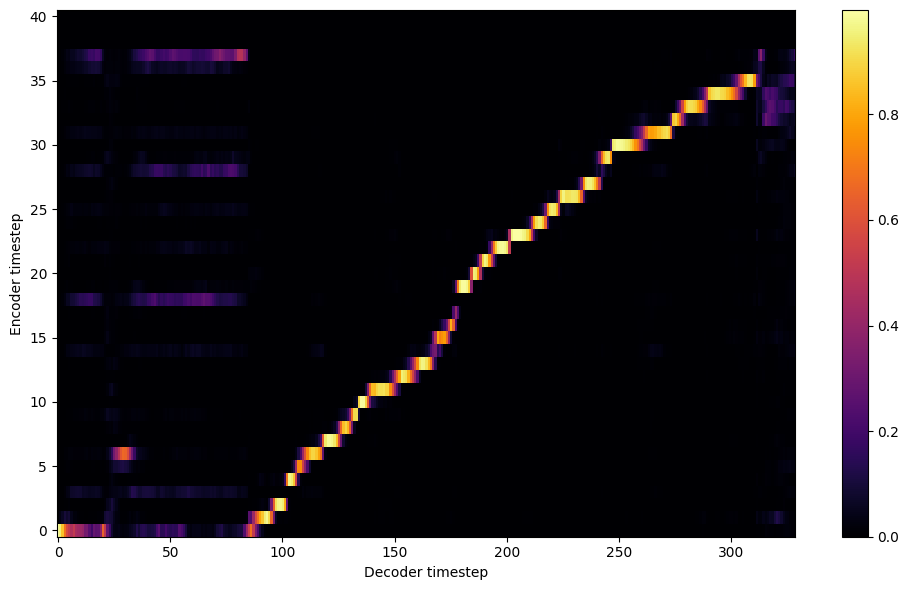


Starting Epoch: 218 Iteration: 2616


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 218 Validation loss 2628:  0.094912  Time: 0.5m LR: 0.000300


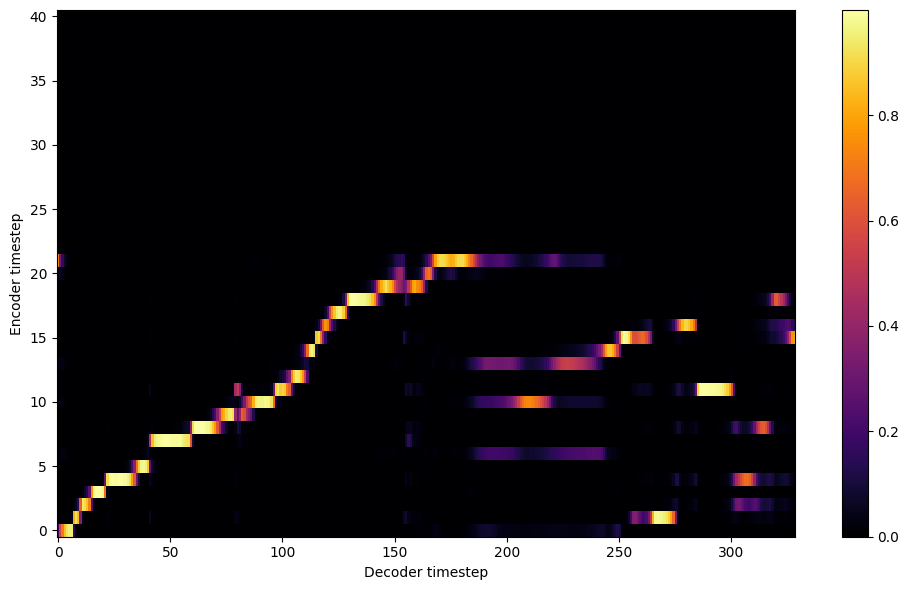


Starting Epoch: 219 Iteration: 2628


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 219 Validation loss 2640:  0.095068  Time: 0.5m LR: 0.000300


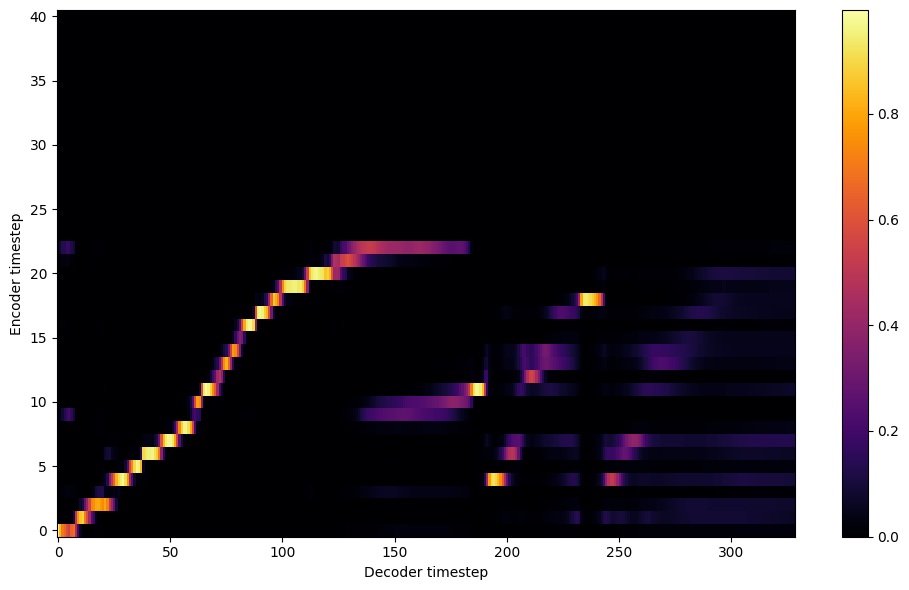

Saving model and optimizer state at iteration 2640 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 220 Iteration: 2640


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 220 Validation loss 2652:  0.094385  Time: 0.5m LR: 0.000300


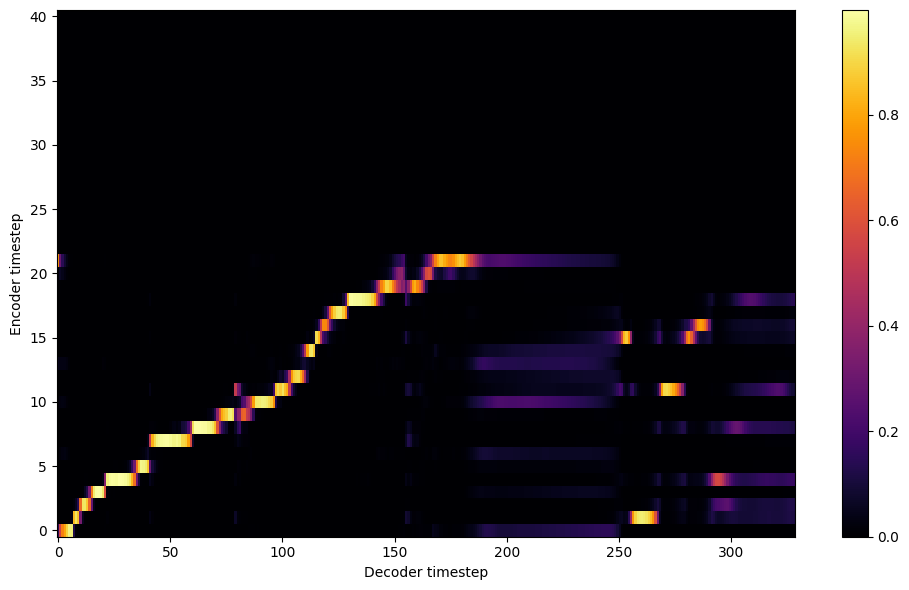


Starting Epoch: 221 Iteration: 2652


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 221 Validation loss 2664:  0.093346  Time: 0.5m LR: 0.000300


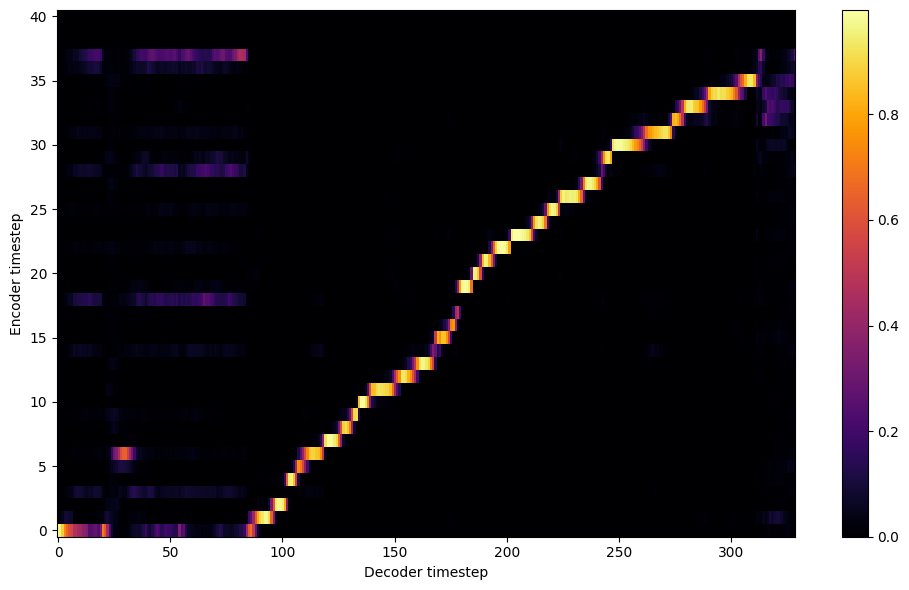


Starting Epoch: 222 Iteration: 2664


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 222 Validation loss 2676:  0.094043  Time: 0.5m LR: 0.000300


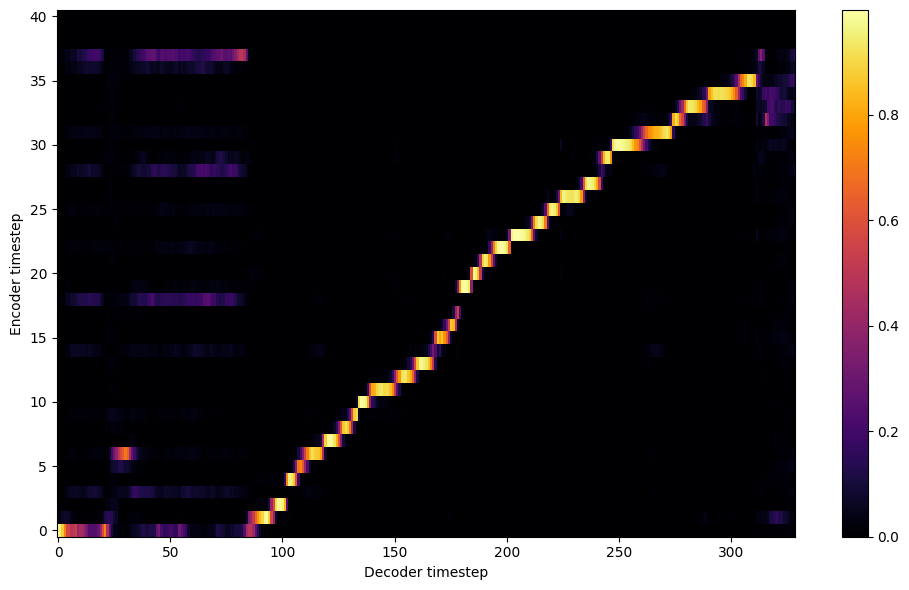


Starting Epoch: 223 Iteration: 2676


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 223 Validation loss 2688:  0.093153  Time: 0.5m LR: 0.000300


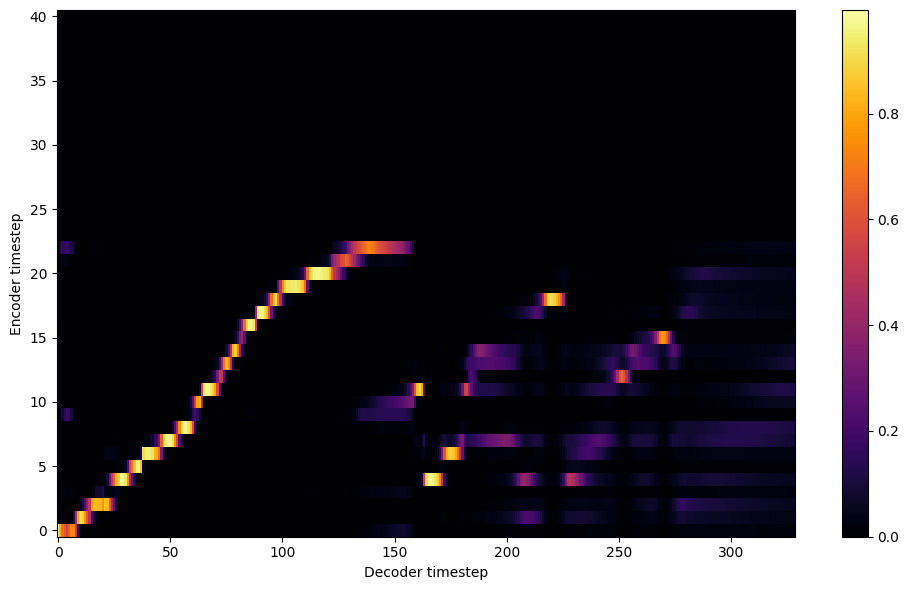


Starting Epoch: 224 Iteration: 2688


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 224 Validation loss 2700:  0.092829  Time: 0.5m LR: 0.000300


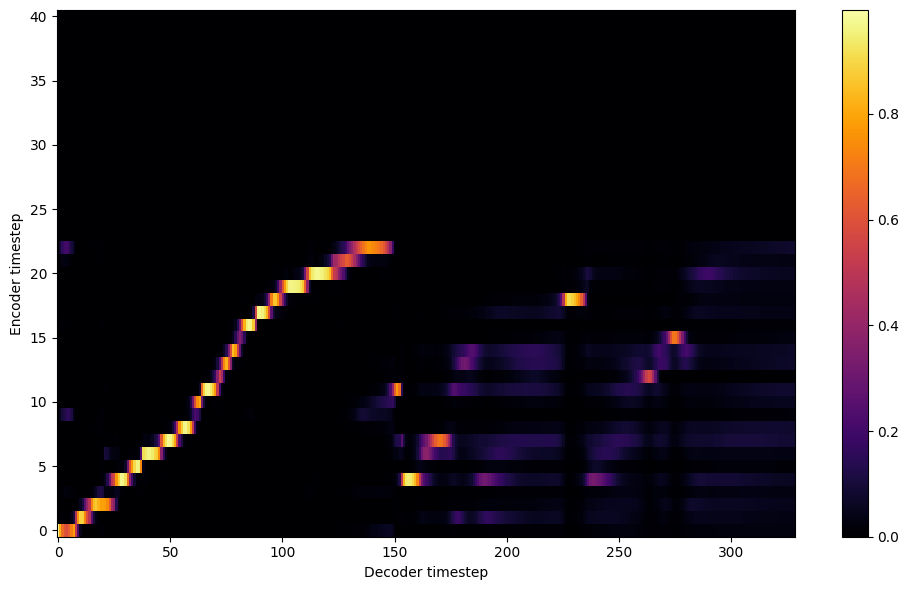


Starting Epoch: 225 Iteration: 2700


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 225 Validation loss 2712:  0.093159  Time: 0.5m LR: 0.000300


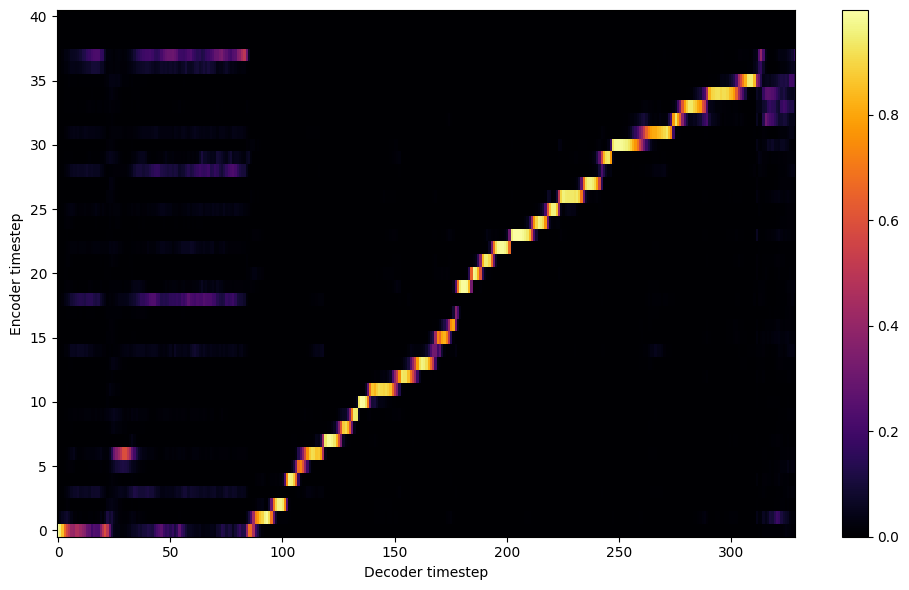


Starting Epoch: 226 Iteration: 2712


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 226 Validation loss 2724:  0.092935  Time: 0.5m LR: 0.000300


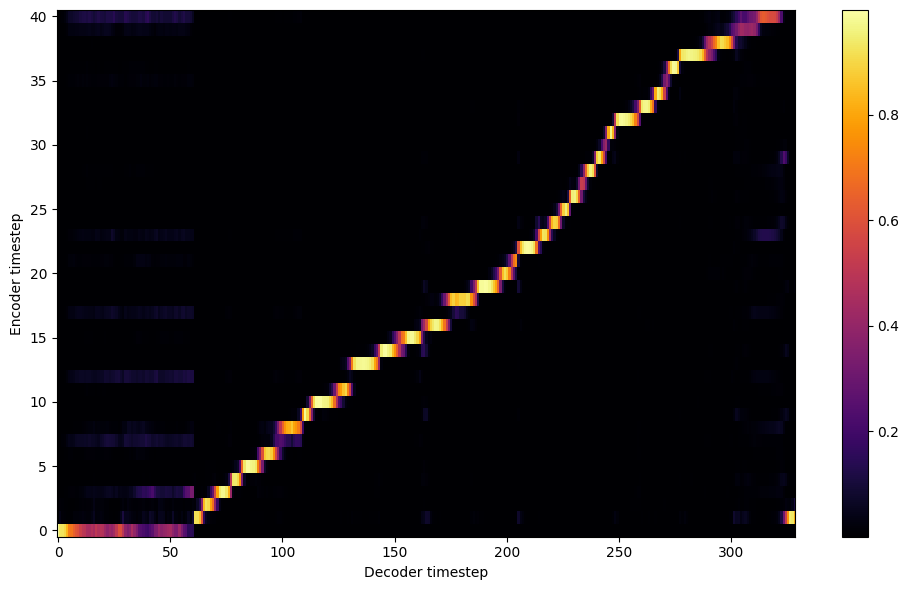


Starting Epoch: 227 Iteration: 2724


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 227 Validation loss 2736:  0.092758  Time: 0.5m LR: 0.000300


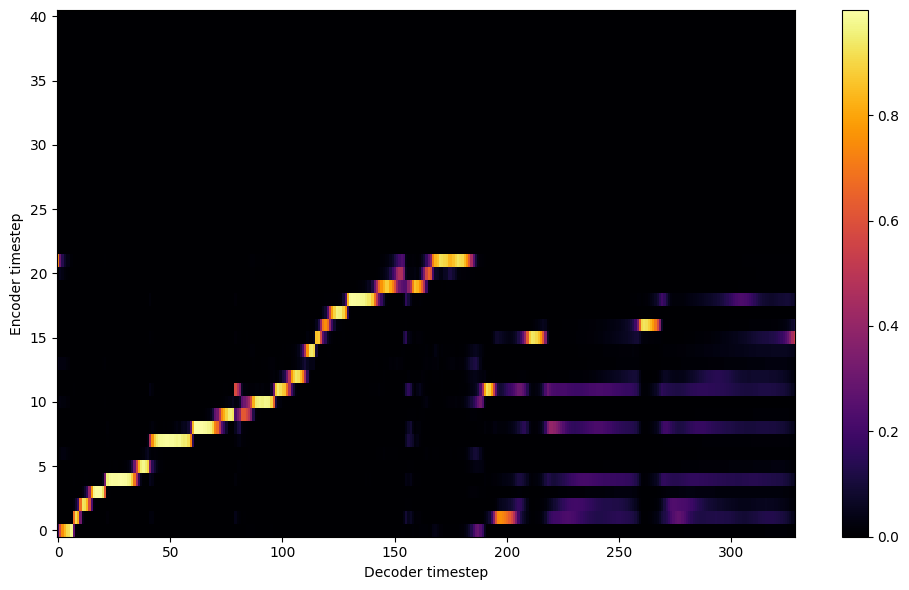


Starting Epoch: 228 Iteration: 2736


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 228 Validation loss 2748:  0.093014  Time: 0.5m LR: 0.000300


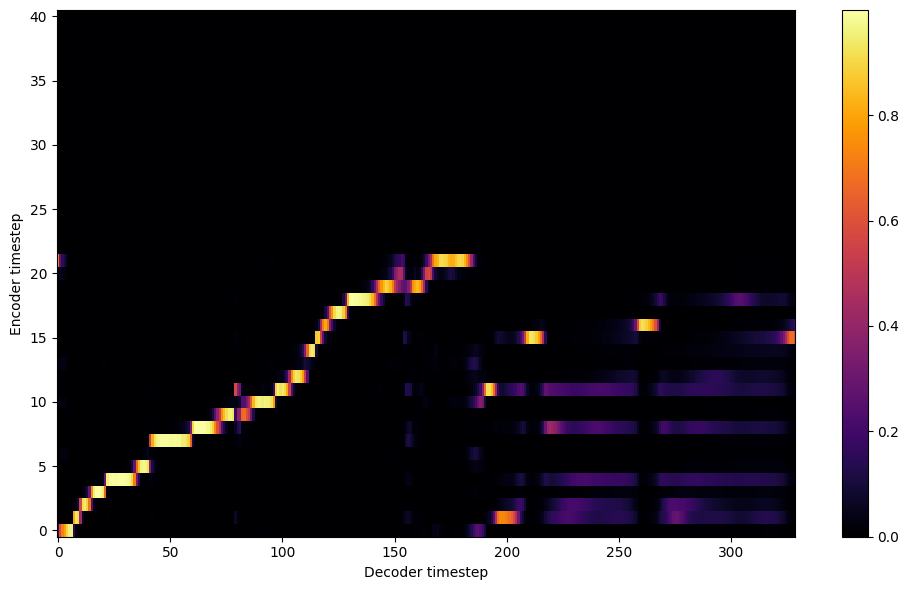


Starting Epoch: 229 Iteration: 2748


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 229 Validation loss 2760:  0.092655  Time: 0.5m LR: 0.000300


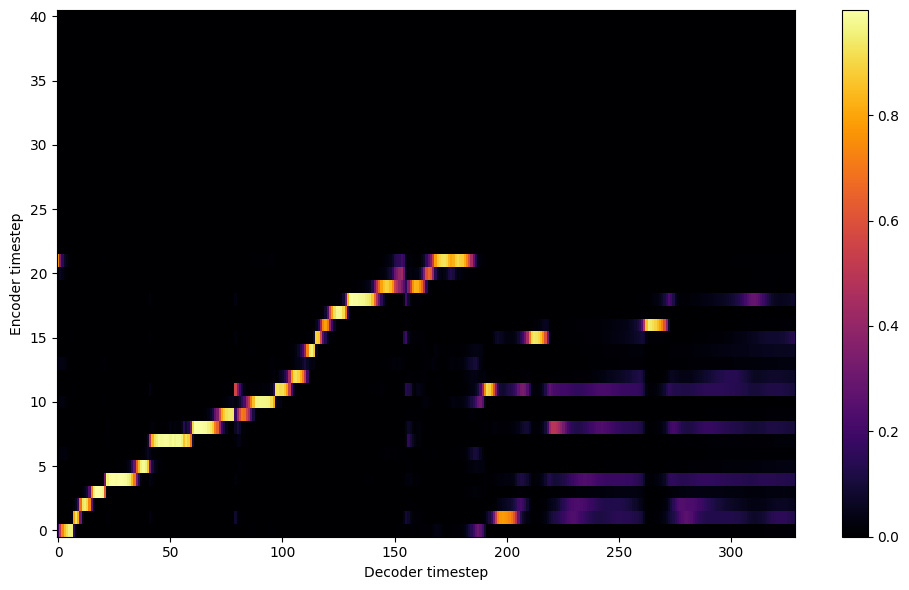

Saving model and optimizer state at iteration 2760 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 230 Iteration: 2760


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 230 Validation loss 2772:  0.092676  Time: 0.5m LR: 0.000300


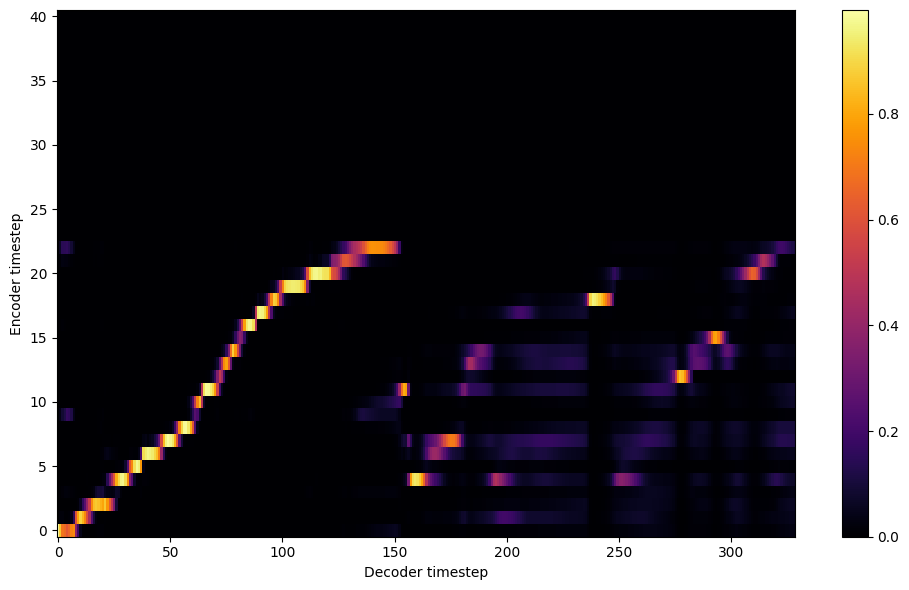


Starting Epoch: 231 Iteration: 2772


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 231 Validation loss 2784:  0.091413  Time: 0.5m LR: 0.000300


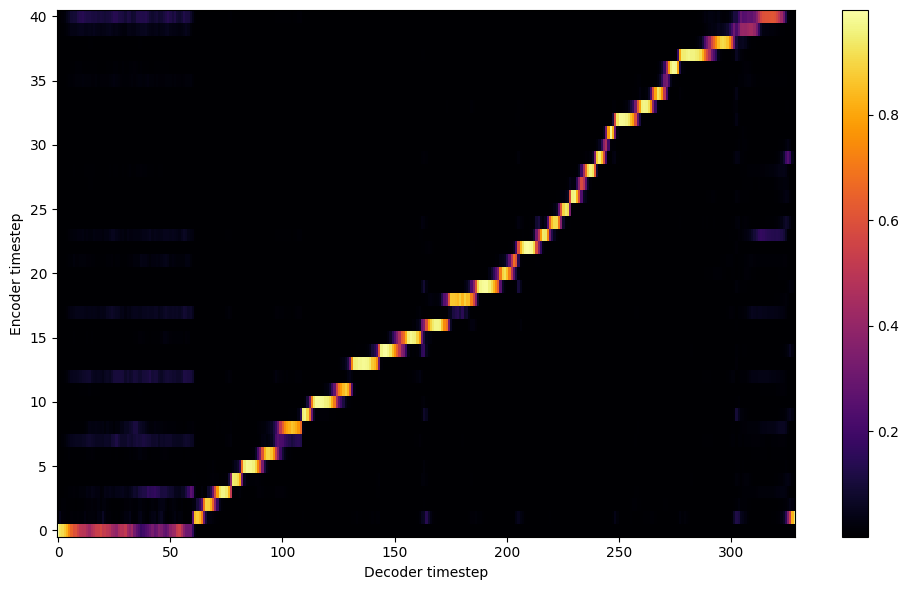


Starting Epoch: 232 Iteration: 2784


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 232 Validation loss 2796:  0.090880  Time: 0.5m LR: 0.000300


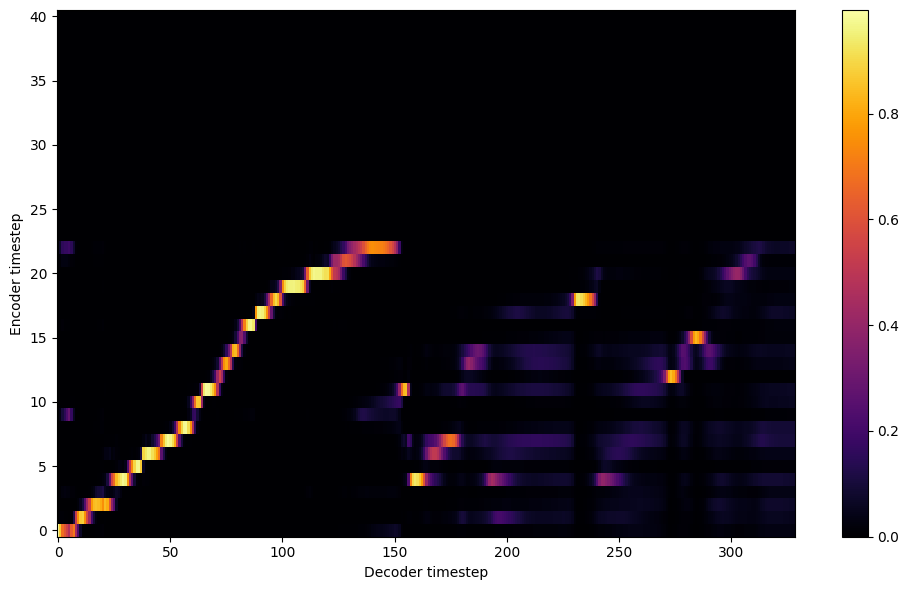


Starting Epoch: 233 Iteration: 2796


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 233 Validation loss 2808:  0.091382  Time: 0.5m LR: 0.000300


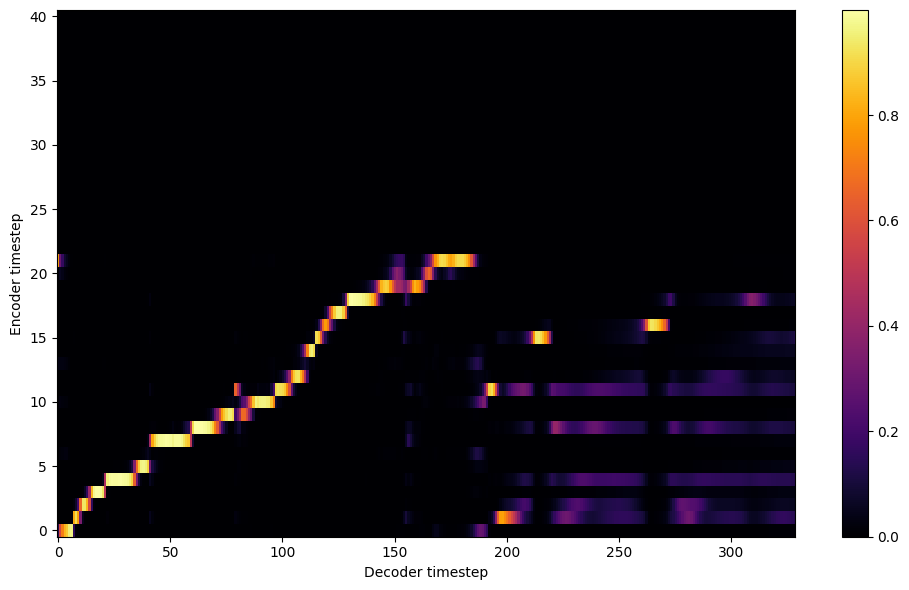


Starting Epoch: 234 Iteration: 2808


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 234 Validation loss 2820:  0.090462  Time: 0.5m LR: 0.000300


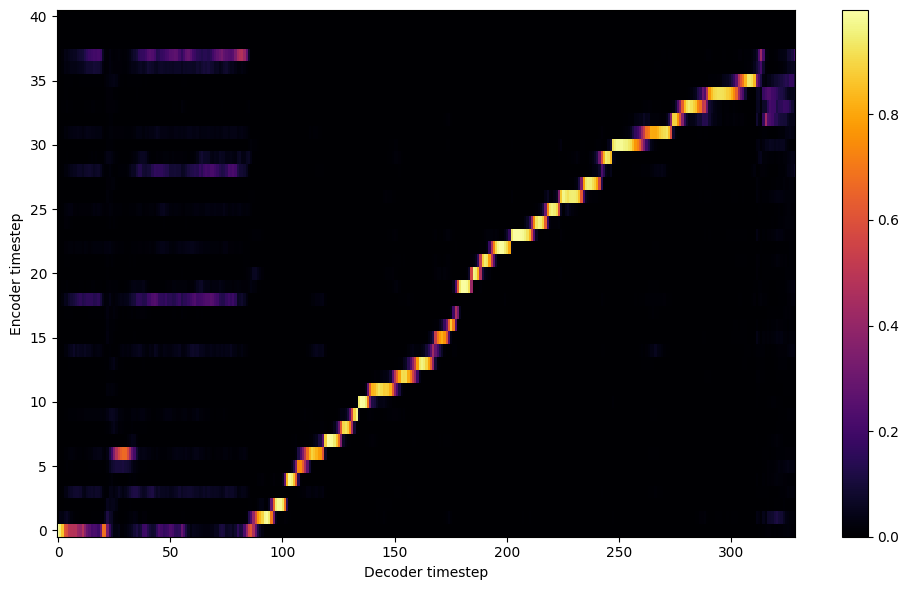


Starting Epoch: 235 Iteration: 2820


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 235 Validation loss 2832:  0.089771  Time: 0.5m LR: 0.000300


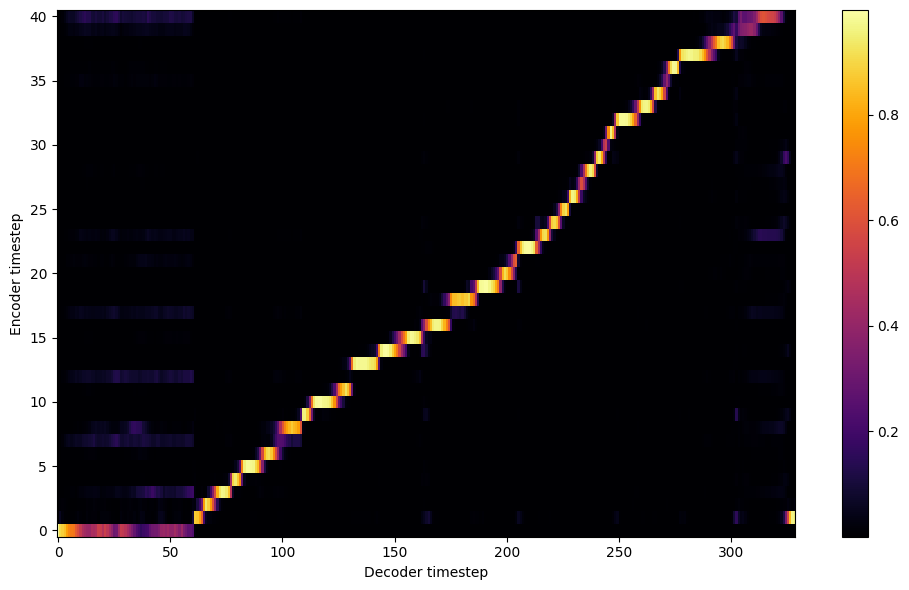


Starting Epoch: 236 Iteration: 2832


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 236 Validation loss 2844:  0.089129  Time: 0.5m LR: 0.000300


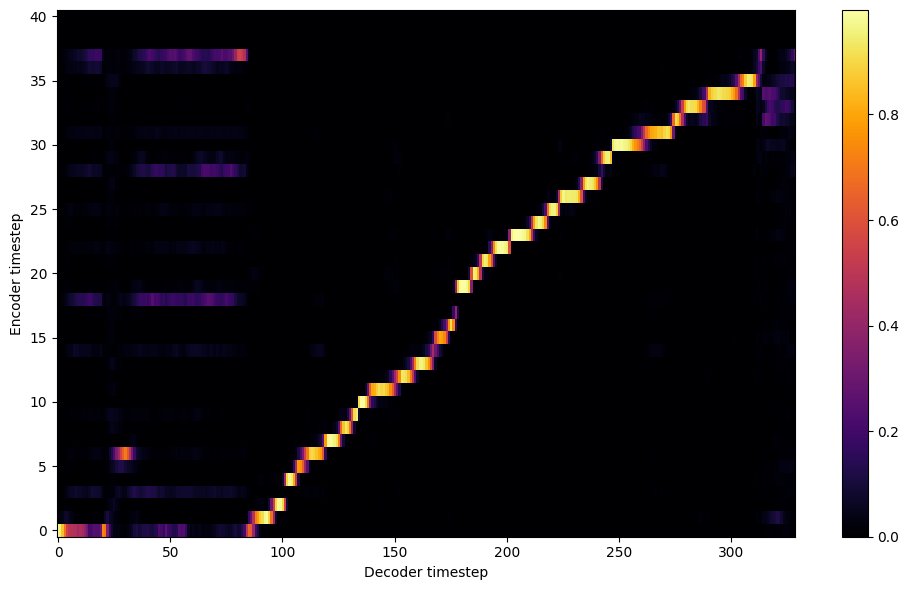


Starting Epoch: 237 Iteration: 2844


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 237 Validation loss 2856:  0.089046  Time: 0.5m LR: 0.000300


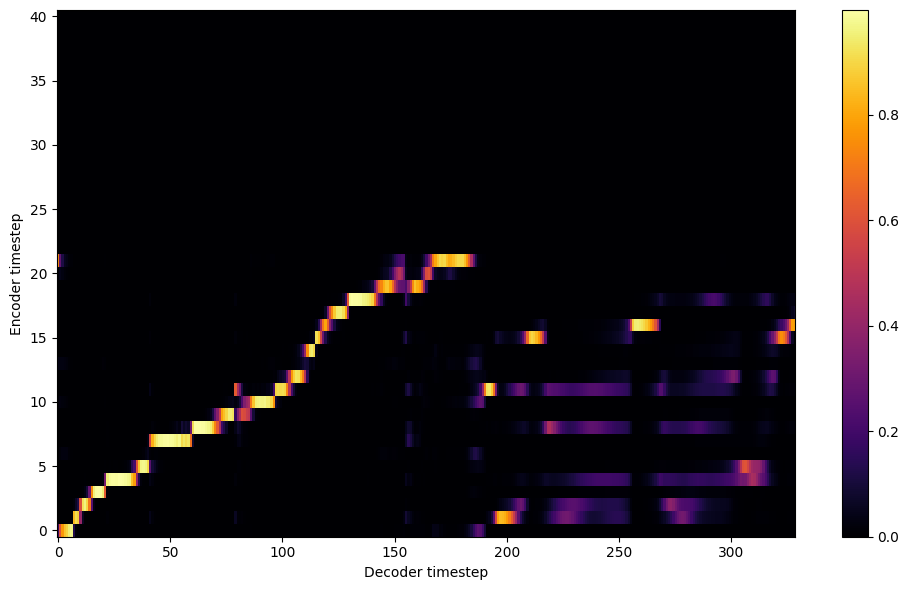


Starting Epoch: 238 Iteration: 2856


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 238 Validation loss 2868:  0.088691  Time: 0.5m LR: 0.000300


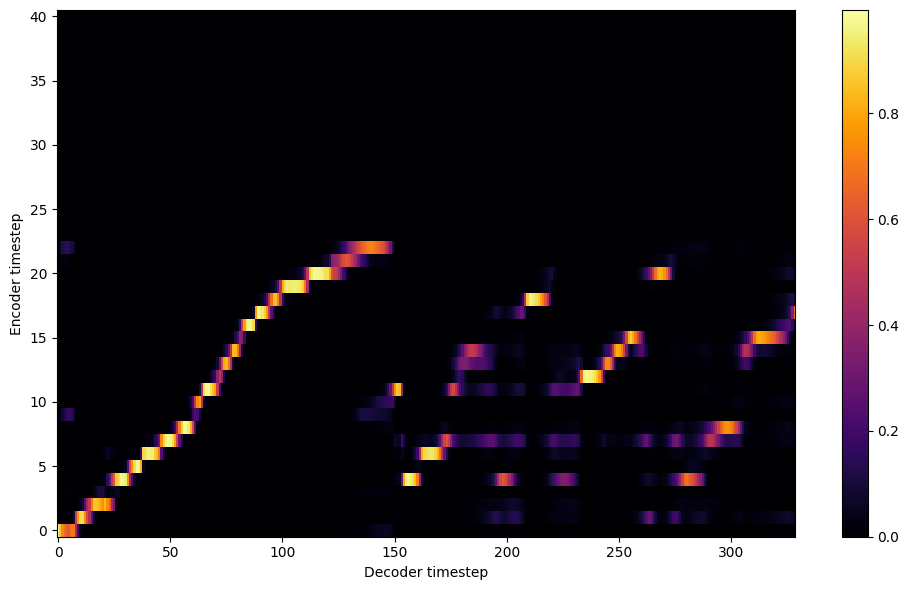


Starting Epoch: 239 Iteration: 2868


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 239 Validation loss 2880:  0.088656  Time: 0.5m LR: 0.000300


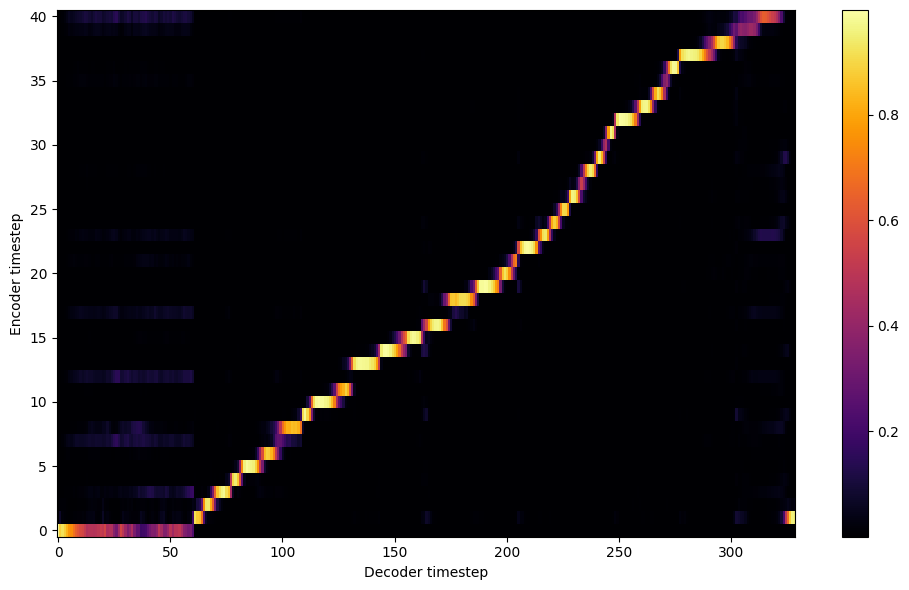

Saving model and optimizer state at iteration 2880 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved

Starting Epoch: 240 Iteration: 2880


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 240 Validation loss 2892:  0.089275  Time: 0.5m LR: 0.000300


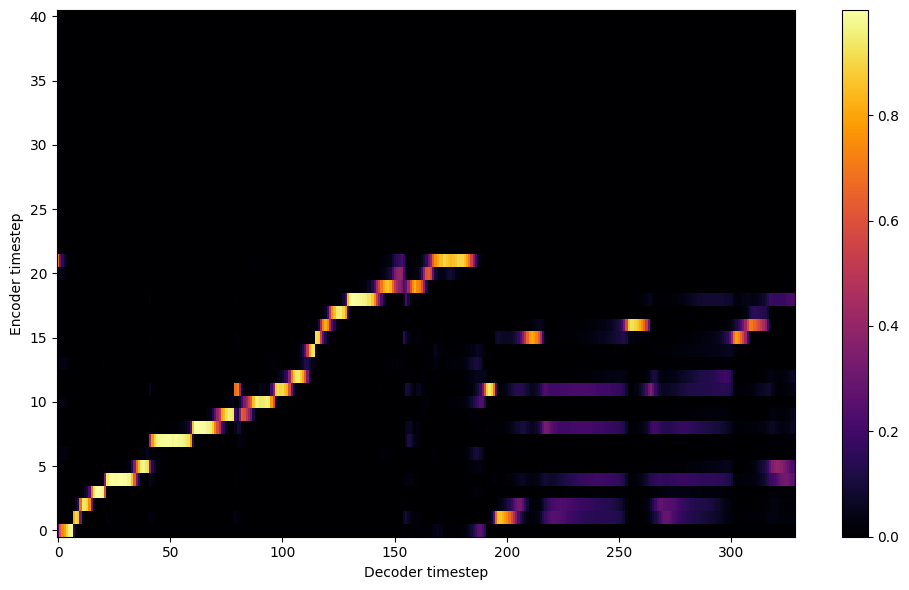


Starting Epoch: 241 Iteration: 2892


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 241 Validation loss 2904:  0.090044  Time: 0.5m LR: 0.000300


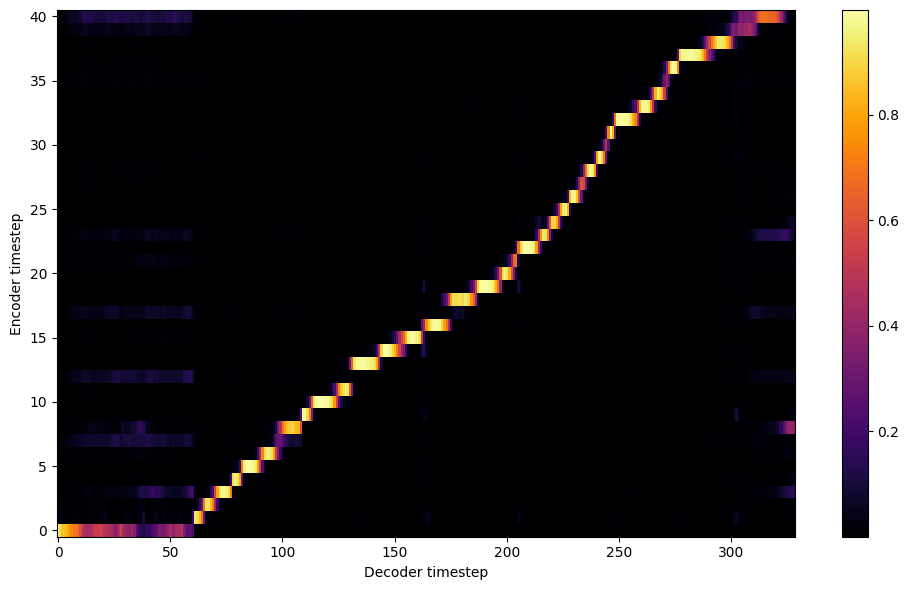


Starting Epoch: 242 Iteration: 2904


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 242 Validation loss 2916:  0.090142  Time: 0.5m LR: 0.000300


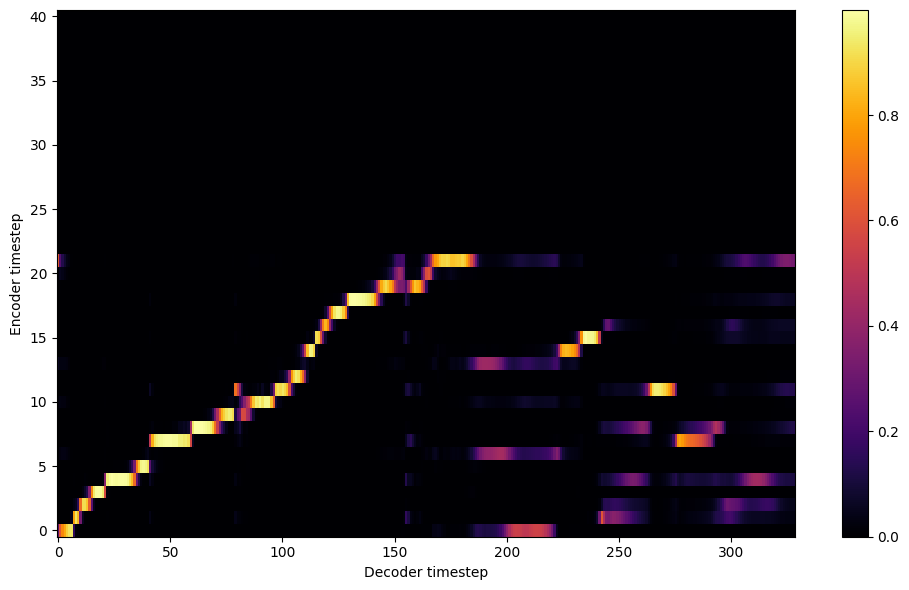


Starting Epoch: 243 Iteration: 2916


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 243 Validation loss 2928:  0.091510  Time: 0.5m LR: 0.000300


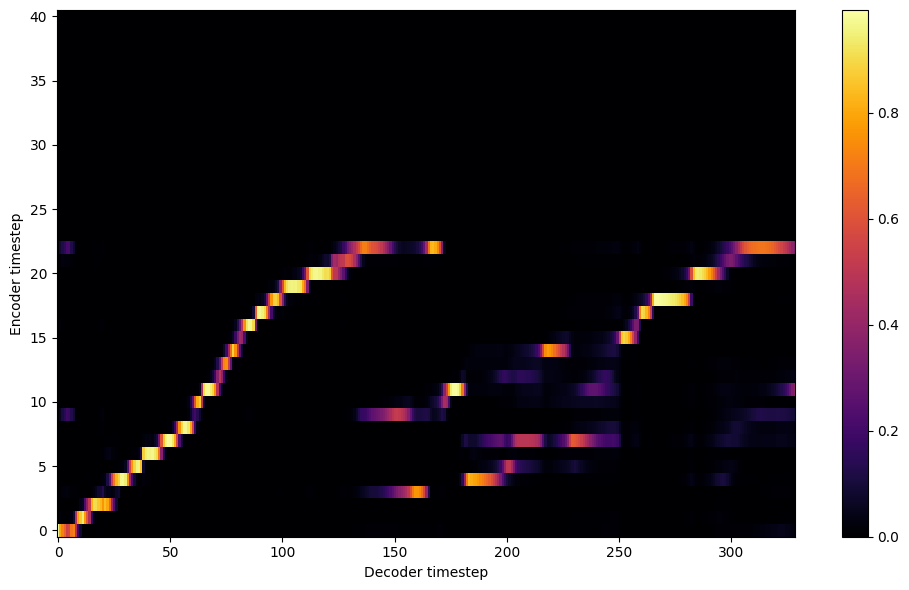


Starting Epoch: 244 Iteration: 2928


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 244 Validation loss 2940:  0.091787  Time: 0.5m LR: 0.000300


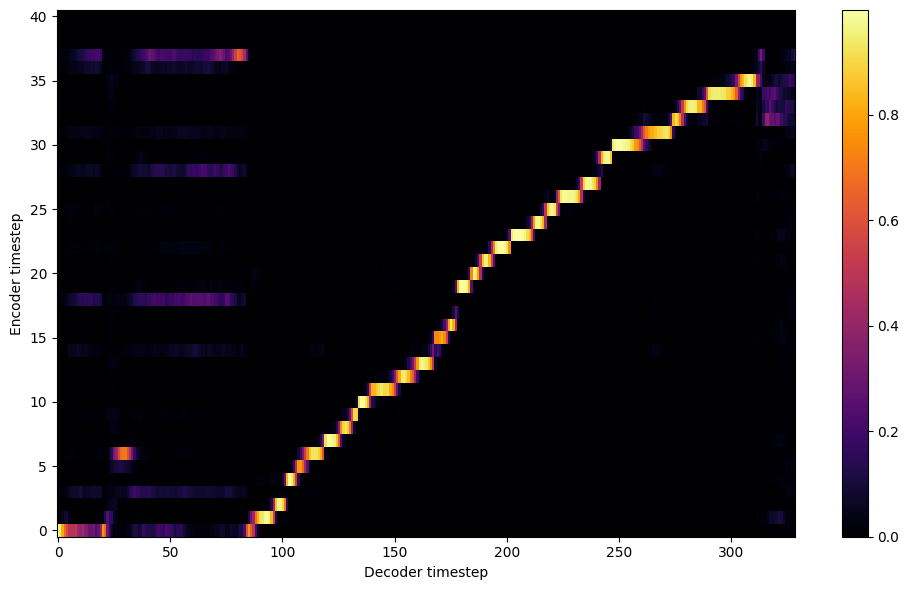


Starting Epoch: 245 Iteration: 2940


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 245 Validation loss 2952:  0.091144  Time: 0.5m LR: 0.000300


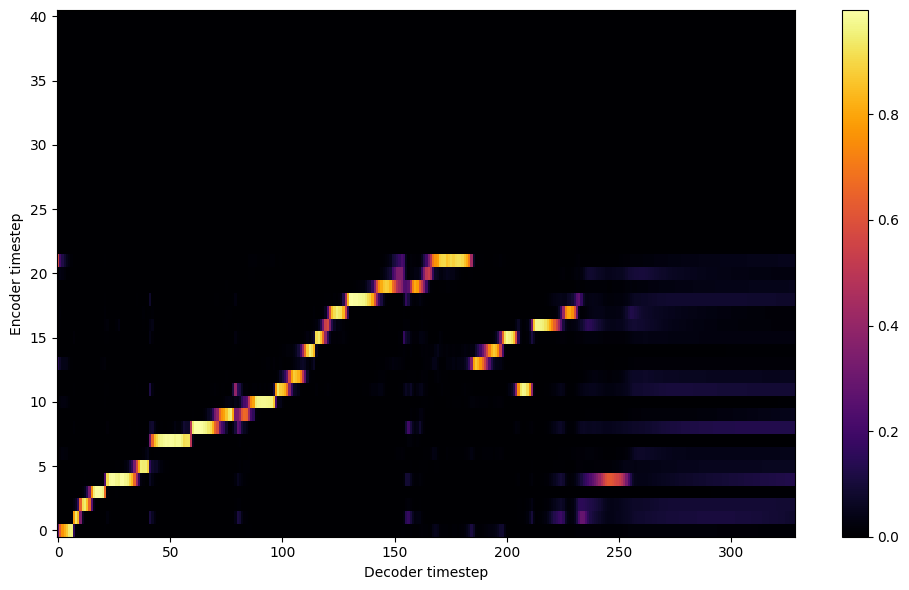


Starting Epoch: 246 Iteration: 2952


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 246 Validation loss 2964:  0.090906  Time: 0.5m LR: 0.000300


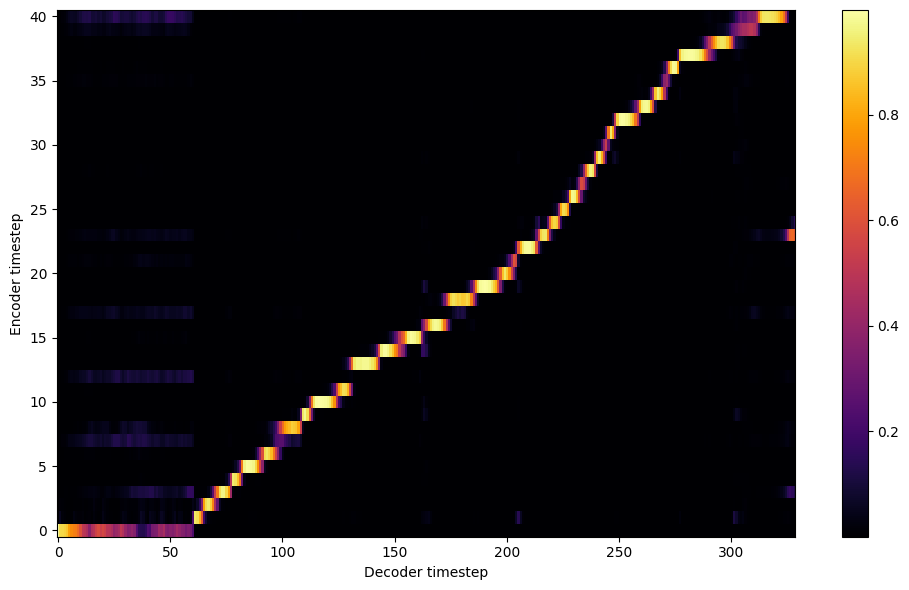


Starting Epoch: 247 Iteration: 2964


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 247 Validation loss 2976:  0.091824  Time: 0.5m LR: 0.000300


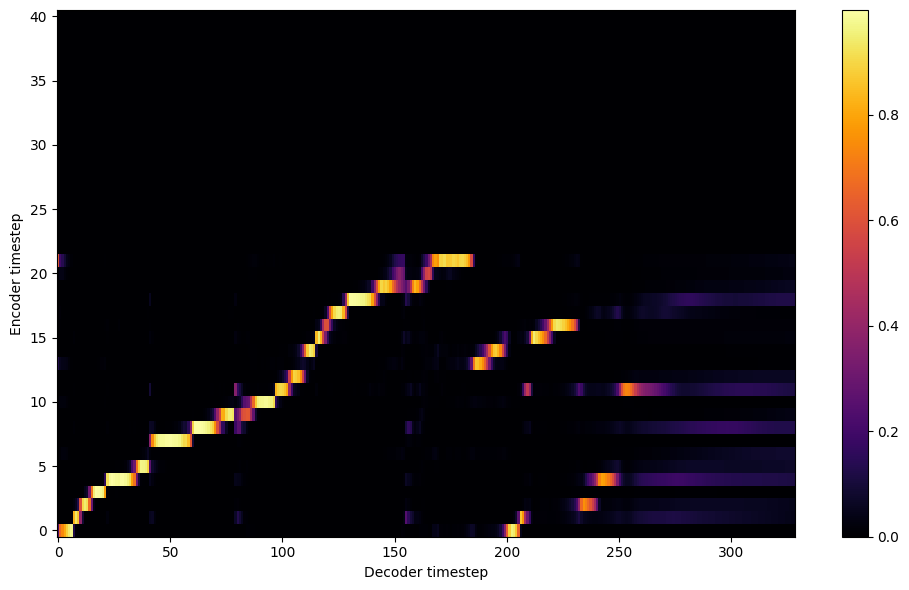


Starting Epoch: 248 Iteration: 2976


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 248 Validation loss 2988:  0.090657  Time: 0.5m LR: 0.000300


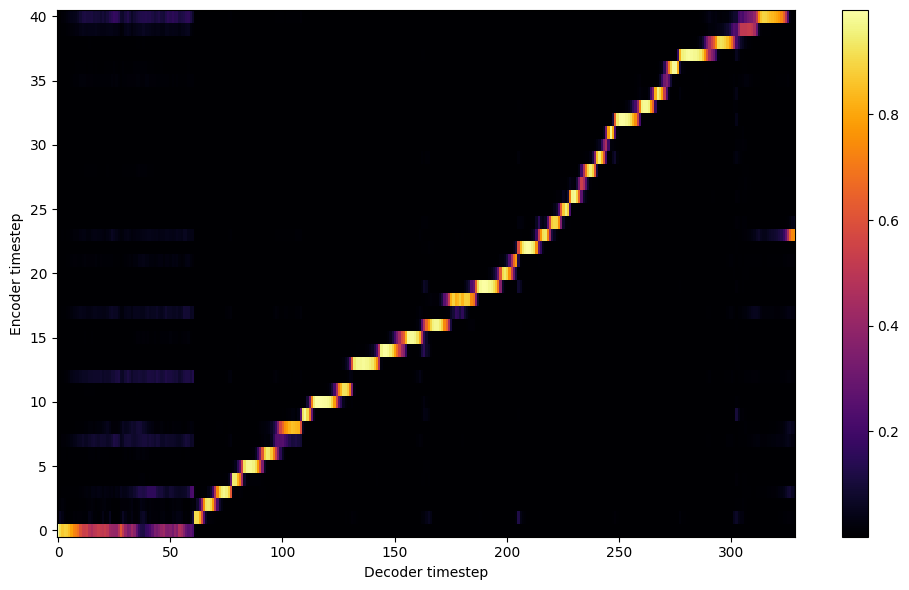


Starting Epoch: 249 Iteration: 2988


  0%|          | 0/12 [00:00<?, ?it/s]

Epoch: 249 Validation loss 3000:  0.091197  Time: 0.5m LR: 0.000300


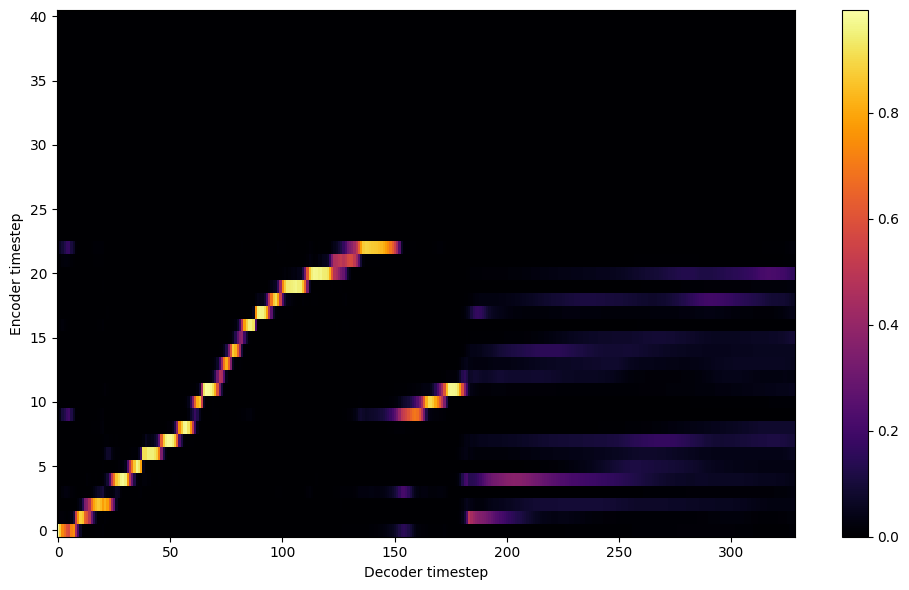

Saving model and optimizer state at iteration 3000 to /content/drive/MyDrive/colab/outdir/Alex
Model Saved


In [ ]:
#@markdown # <font color="pink"> **8. Begin training.** 🏋️
#@markdown ___
#@markdown ### How often to save (number of epochs)
#@markdown `10` by default. Raise this if you're hitting a rate limit. If you're using a particularly large dataset, you might want to set this to `1` to prevent loss of progress.
save_interval =  10#@param {type: "integer"}
#
#@markdown ### How often to backup (number of epochs)
#@markdown `-1` (disabled) by default. This will save extra copies of your model every so often, so you always have something to revert to if you train the model for too long. This *will* chew through your Google Drive storage.
backup_interval =  -1#@param {type: "integer"}
#

print('FP16 Run:', hparams.fp16_run)
print('Dynamic Loss Scaling:', hparams.dynamic_loss_scaling)
print('Distributed Run:', hparams.distributed_run)
print('cuDNN Enabled:', hparams.cudnn_enabled)
print('cuDNN Benchmark:', hparams.cudnn_benchmark)
train(output_directory, log_directory, checkpoint_path,
      warm_start, n_gpus, rank, group_name, hparams, log_directory2,
      save_interval, backup_interval)

In [ ]:
#@markdown ## <font color="pink"> **2. Install Tacotron2 (w/ARPAbet).** ⚙️

import os

print("Checking if TTS-TT2 repository exists...")
if not os.path.exists('TTS-TT2'):
    print("Cloning TTS-TT2 repository...")
    !git clone https://github.com/NVIDIA/tacotron2.git TTS-TT2
    print("TTS-TT2 repository cloned.")
else:
    print("TTS-TT2 repository already exists.")

# --- NEW ADDITION FOR WAVEGLOW SOURCE CODE ---
print("\nChecking if WaveGlow repository exists...")
if not os.path.exists('TTS-TT2/waveglow'):
    print("Cloning WaveGlow repository into TTS-TT2/...")
    !git clone https://github.com/NVIDIA/waveglow.git TTS-TT2/waveglow
    print("WaveGlow repository cloned.")
else:
    print("WaveGlow repository already exists in TTS-TT2/.")
# --- END NEW ADDITION ---

%cd TTS-TT2

print("\nInstalling TTS-TT2 requirements...")
# Install requirements directly from the TTS-TT2 project folder
!pip install -r requirements.txt
!pip install phonemizer unidecode

print("\nApplying ARPAbet patch...")
# Apply ARPAbet patch (if you use it, recommended for English)
# This usually modifies text/__init__.py and symbols.py
!patch -p1 < Tacotron2-for-Colab-and-Kaggle/arpabet.patch
# Note: The original patch path might be different depending on your setup.
# If you copied the patch directly to /content/TTS-TT2, it might be just `!patch -p1 < arpabet.patch`
# Or if it's in a specific subfolder of your copied content, adjust the path.
# For example, if you copied `Tacotron2-for-Colab-and-Kaggle` to `/content/TTS-TT2/Tacotron2-for-Colab-and-Kaggle/`
# then the path is correct as shown. If not, try just `!patch -p1 < arpabet.patch`
# assuming you downloaded it to /content/TTS-TT2 directly.


print("\n--- Installation Complete for TTS-TT2 and WaveGlow Source ---")
print("Current working directory:", os.getcwd())

Checking if TTS-TT2 repository exists...
Cloning TTS-TT2 repository...
Cloning into 'TTS-TT2'...
remote: Enumerating objects: 412, done.
remote: Counting objects: 100% (172/172), done.
remote: Compressing objects: 100% (46/46), done.
remote: Total 412 (delta 140), reused 126 (delta 126), pack-reused 240 (from 1)
Receiving objects: 100% (412/412), 2.68 MiB | 9.51 MiB/s, done.
Resolving deltas: 100% (216/216), done.
TTS-TT2 repository cloned.

Checking if WaveGlow repository exists...
WaveGlow repository already exists in TTS-TT2/.
/content/TTS-TT2/TTS-TT2

Installing TTS-TT2 requirements...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.7/35.7 MB 18.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
ERROR: Could not find a version that satisfies the requirement tensorflow==1.15.2 (from versions: 2.12.0rc0, 2.12.0rc1, 2.12.0, 2.12.1, 2.13.0rc0, 2.13.0rc1, 2.13.0rc2, 2.13.0, 2.13.1, 2.14.0rc0, 2.14.0rc1, 2.14.0, 2.14.1, 2.15.0rc0, 2.15.0rc1, 2.15.0, 2.15.0.post1, 2.15.1, 2.16.0

In [ ]:
#@markdown ## <font color="pink"> **7. Perform Text-to-Speech Inference** 🗣️

#@markdown #### **Model Checkpoint Path:**
#@markdown Enter the path to your trained Tacotron2 checkpoint file on Google Drive (e.g., "/content/drive/My Drive/Evatalk/Output/checkpoints/tacotron2_20000.pt")
tacotron2_checkpoint_path = "/content/drive/My Drive/Evatalk/colab/outdir/Alex.pt" #@param {type:"string"}

#@markdown ---
#@markdown #### **WaveGlow Vocoder Setup:**
#@markdown WaveGlow is required to convert mel spectrograms to audio. We will download a pre-trained NVIDIA WaveGlow model.
download_waveglow = True #@param {type:"boolean"}
#@markdown <small>If you already downloaded it in a previous session or manually, you can uncheck this.</small>

#@markdown ---
#@markdown #### **Inference Settings:**
text_input = "Hello, this is a test of your new voice model. I hope it sounds great!" #@param {type:"string"}
output_filename = "output_speech.wav" #@param {type:"string"}

import os
import torch
import numpy as np
from scipy.io.wavfile import write
import time

# Ensure we are in the TTS-TT2 directory
%cd /content/TTS-TT2/

# 1. Mount Google Drive (if not already mounted)
from google.colab import drive
if not os.path.exists('/content/drive'):
    print("Mounting Google Drive...")
    drive.mount('/content/drive')
    print("Google Drive mounted.")
else:
    print("Google Drive already mounted.")

# Ensure essential libraries and model components are available
try:
    from model import Tacotron2
    from layers import TacotronSTFT
    from audio_processing import griffin_lim
    from text import text_to_sequence
    from hparams import create_hparams
    # Needed for WaveGlow
    from waveglow.model import WaveGlow # This assumes waveglow is in a 'waveglow' subfolder
except ImportError as e:
    print(f"\n\031[31m\033[1m[ERROR] Required module not found: {e}")
    print("Please ensure you have run the 'Install Tacotron2' cell (Cell 2) completely.")
    print("If 'waveglow' module is missing, ensure it's cloned/downloaded correctly.")
    raise

# Create hparams for consistency
hparams = create_hparams()
hparams.sampling_rate = 22050 # Ensure sampling rate is consistent
hparams.max_wav_value = 32768.0 # Consistent with training

# 2. Load Tacotron2 Model
print(f"\nLoading Tacotron2 model from: {tacotron2_checkpoint_path}")
if not os.path.exists(tacotron2_checkpoint_path):
    print(f"\033[31m\033[1m[ERROR] Tacotron2 checkpoint not found at: {tacotron2_checkpoint_path}")
    print("Please ensure the path is correct and your model finished training and saved a checkpoint.")
    raise FileNotFoundError("Tacotron2 checkpoint not found.")

try:
    model = Tacotron2(hparams).cuda()
    # Load checkpoint
    checkpoint = torch.load(tacotron2_checkpoint_path, map_location='cuda')
    model.load_state_dict(checkpoint['state_dict'])
    model.eval() # Set model to evaluation mode
    print("Tacotron2 model loaded successfully.")
except Exception as e:
    print(f"\033[31m\033[1m[ERROR] Failed to load Tacotron2 model: {e}")
    print("This might be due to a mismatch in hparams or a corrupted checkpoint.")
    raise

# 3. Load WaveGlow Vocoder
waveglow_path = '/content/TTS-TT2/waveglow_256channels_universal_v5.pt' # Default path

if download_waveglow and not os.path.exists(waveglow_path):
    print("\nDownloading pre-trained WaveGlow model (this may take a few minutes)...")
    try:
        # Using wget to download directly
        !wget -nc https://api.ngc.nvidia.com/v2/models/nvidia/waveglowpyt_fp32/versions/original_pyt/files/waveglow_256channels_universal_v5.pt -P /content/TTS-TT2/
        # Move it to the expected path if downloaded to a different spot
        if os.path.exists('/content/TTS-TT2/waveglow_256channels_universal_v5.pt'):
            print("WaveGlow downloaded.")
        else:
            print("\033[33m\033[1m[WARNING] WaveGlow download command ran, but file not found. Check permissions or network.")
    except Exception as e:
        print(f"\033[31m\033[1m[ERROR] Failed to download WaveGlow: {e}")
        print("Please try downloading manually or ensure network connectivity.")
        download_waveglow = False # Prevent further attempts if failed

if not os.path.exists(waveglow_path):
    if not download_waveglow: # If user unchecked and file doesn't exist
        print(f"\033[31m\033[1m[ERROR] WaveGlow model not found at: {waveglow_path}")
        print("Please set `download_waveglow = True` or provide the correct path to your WaveGlow model.")
        raise FileNotFoundError("WaveGlow model not found.")
    else: # If download was attempted but failed/file still not there
        print(f"\033[31m\033[1m[ERROR] WaveGlow model still not found at: {waveglow_path} after download attempt.")
        raise FileNotFoundError("WaveGlow model download failed or file missing.")

print(f"Loading WaveGlow model from: {waveglow_path}")
try:
    waveglow = torch.load(waveglow_path)['model']
    waveglow.cuda().eval()
    # For inference, remove the bias layer if it exists (for faster inference without artifacts)
    for k in waveglow.convinv:
        k.float()
    print("WaveGlow model loaded successfully.")
except Exception as e:
    print(f"\033[31m\033[1m[ERROR] Failed to load WaveGlow model: {e}")
    print("This might be due to a corrupted file or compatibility issues.")
    raise

# 4. Define Inference Function
def synthesize_speech(text, model, waveglow, hparams, output_path="output.wav"):
    sequence = np.array(text_to_sequence(text, hparams.text_cleaners))
    sequence = torch.autograd.Variable(
        torch.from_numpy(sequence)).cuda().unsqueeze(0)

    # Tacotron2 inference
    print(f"\nSynthesizing mel-spectrogram for: \"{text}\"")
    start_time = time.time()
    with torch.no_grad():
        mel_outputs, mel_outputs_postnet, _, alignments = model.inference(sequence)
    tacotron2_time = time.time() - start_time
    print(f"Mel spectrogram generated in {tacotron2_time:.2f} seconds.")

    # WaveGlow inference
    print("Generating audio with WaveGlow...")
    start_time = time.time()
    with torch.no_grad():
        audio = waveglow.infer(mel_outputs_postnet, sigma=0.666) # sigma can be adjusted
    waveglow_time = time.time() - start_time
    print(f"Audio generated in {waveglow_time:.2f} seconds.")

    audio = audio.cpu().numpy()
    audio = audio * hparams.max_wav_value
    audio = audio.astype('int16')

    # Save audio
    write(output_path, hparams.sampling_rate, audio)
    print(f"Generated audio saved to: {output_path}")

    return output_path

# 5. Perform Inference
print("\n--- Starting TTS Inference ---")
if torch.cuda.is_available():
    print("Using GPU for inference.")
else:
    print("\033[33m\033[1m[WARNING] GPU not available. Inference will be very slow on CPU.")

try:
    synthesize_speech(text_input, model, waveglow, hparams, output_filename)
except Exception as e:
    print(f"\033[31m\033[1m[ERROR] An error occurred during speech synthesis: {e}")
    print("Please check your input text, model, and vocoder setup.")

print("\n\033[32m\033[1mTTS Inference complete!")
print("You can download the generated WAV file from the Colab file browser (look for 'output_speech.wav').")

/content/TTS-TT2
Google Drive already mounted.

[ERROR] Required module not found: No module named 'waveglow.model'
Please ensure you have run the 'Install Tacotron2' cell (Cell 2) completely.
If 'waveglow' module is missing, ensure it's cloned/downloaded correctly.


ModuleNotFoundError: No module named 'waveglow.model'

# **Final notes*\

## A good training looks like this:
![img.png](https://media.discordapp.net/attachments/835971020569051216/851469553355587614/download_2.png)
